In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append("..")
sys.path.append("../..")

In [3]:
import os
from pathlib import Path
import pickle
import timeit
#
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torchvision
from torchvision import transforms, models
from dotted_dict import DottedDict
from tqdm import tqdm
import pprint
#
from csprites.datasets import ClassificationDataset
import utils
from backbone import get_backbone
from optimizer import get_optimizer
from eval_utils import Net, get_datasets, train_model
from plot_utils import *

# Settings

In [4]:
# linprob config
linprob_config = {
    'p_eval': 'eval',
    'p_eval_results': 'results.pkl',
    'p_config':       "eval_config.pkl",
    'p_results':      'results.pkl',
    'p_acc_mat':      'accuracy.png',
    'device': "cpu",
    'cuda_visible_devices': '0',
    'n_hid': 0,
    'd_hid': 1024,
    'batch_size': 1024,
    'optimizer': 'adam',
    'n_avrg': 5,
    'optimizer_args': {'lr': 0.001, 'weight_decay': 1e-6},
    'num_epochs': 10,
}
linprob_config = DottedDict(linprob_config)

In [5]:
# TORCH SETTINGS
torch.backends.cudnn.benchmark = True
os.environ["CUDA_VISIBLE_DEVICES"] = linprob_config.cuda_visible_devices
device = torch.device(linprob_config.device)

In [6]:
p_experiments_base = Path("/mnt/experiments/csprites/single_csprites_64x64_n7_c8_a16_p4_s3_bg_inf_random_function_43008")
p_experiments = [
    #
    # FCN8
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d8]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d16]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d32]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d64]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[shape]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[scale]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[color]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[angle]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[py]',
    p_experiments_base / 'SUP_[FCN8i223o32_d128]_target_[px]',
    #
    # FCN16
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d8]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d16]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d32]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d64]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[shape]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[scale]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[color]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[angle]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[py]',
    p_experiments_base / 'SUP_[FCN16i223o64_d128]_target_[px]',
    #
    # FCN32
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d8]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d16]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d32]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d64]_target_[px]',
    #
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[shape]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[scale]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[color]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[angle]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[py]',
    p_experiments_base / 'SUP_[FCN32i223o128_d128]_target_[px]',
    #
    # Barlow Twins
    #
    p_experiments_base / 'BTwins_[FCN8i223o32_d_8]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN8i223o32_d_16]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN8i223o32_d_32]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN8i223o32_d_64]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN8i223o32_d_128]_target_[shape]',
    #
    p_experiments_base / 'BTwins_[FCN16i223o64_d_8]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN16i223o64_d_16]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN16i223o64_d_32]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN16i223o64_d_64]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN16i223o64_d_128]_target_[shape]',
    #
    p_experiments_base / 'BTwins_[FCN32i223o128_d_8]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN32i223o128_d_16]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN32i223o128_d_32]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN32i223o128_d_64]_target_[shape]',
    p_experiments_base / 'BTwins_[FCN32i223o128_d_128]_target_[shape]',
]
for p in p_experiments:
    if not p.exists():
        print(p)

SUP_[FCN8i223o32_d8]_target_[shape]
[  1/630] shape      SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:02<00:00, 13.20it/s, loss=2.26, acc=0.0342]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.36it/s, loss=2.24, acc=0.0585]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.87it/s, loss=1.94, acc=0.208]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.96it/s, loss=1.96, acc=0.21]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 68.13it/s, loss=1.68, acc=0.283]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.04it/s, loss=1.64, acc=0.312]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.92it/s, loss=1.39, acc=0.464]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.04it/s, loss=1.42, acc=0.498]      

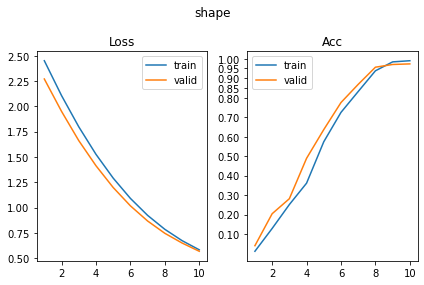

[  2/630] scale      SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 103.57it/s, loss=1.29, acc=0.366]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.76it/s, loss=1.24, acc=0.351]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.74it/s, loss=1.24, acc=0.313]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.59it/s, loss=1.2, acc=0.38]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.83it/s, loss=1.16, acc=0.349]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.59it/s, loss=1.14, acc=0.361]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.63it/s, loss=1.15, acc=0.329]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 135.70it/s, loss=1.17, acc=0.334]     

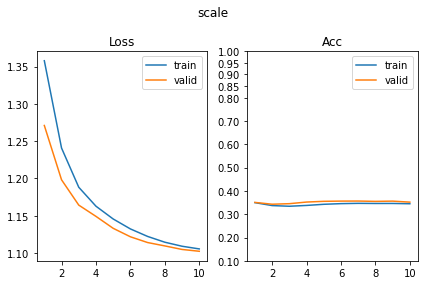

[  3/630] color      SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.70it/s, loss=2.43, acc=0.122]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.85it/s, loss=2.35, acc=0.124]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 96.51it/s, loss=2.25, acc=0.148]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.61it/s, loss=2.28, acc=0.124]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.56it/s, loss=2.22, acc=0.116]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 135.08it/s, loss=2.22, acc=0.117]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 99.53it/s, loss=2.16, acc=0.117]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.26it/s, loss=2.17, acc=0.137]     

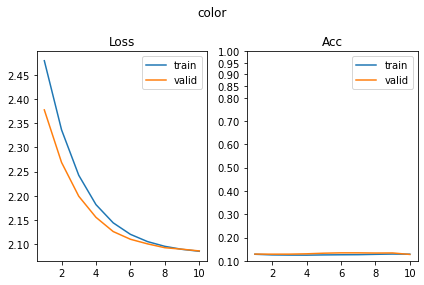

[  4/630] angle      SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 131.81it/s, loss=3.01, acc=0.0879]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 63.35it/s, loss=3.08, acc=0.0732]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 127.11it/s, loss=2.91, acc=0.0619]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 139.24it/s, loss=2.97, acc=0.0707]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 102.49it/s, loss=2.88, acc=0.0847]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 181.18it/s, loss=2.88, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.76it/s, loss=2.87, acc=0.0668]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.35it/s, loss=2.88, acc=0.0659]    

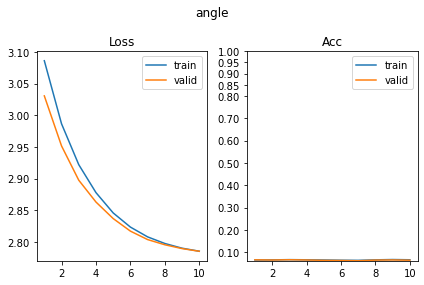

[  5/630] py         SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 101.67it/s, loss=1.66, acc=0.262]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 141.60it/s, loss=1.66, acc=0.273]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 131.36it/s, loss=1.6, acc=0.265]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.38it/s, loss=1.54, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 132.01it/s, loss=1.49, acc=0.277]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 148.14it/s, loss=1.48, acc=0.246]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 98.35it/s, loss=1.47, acc=0.295]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 148.34it/s, loss=1.43, acc=0.285]     

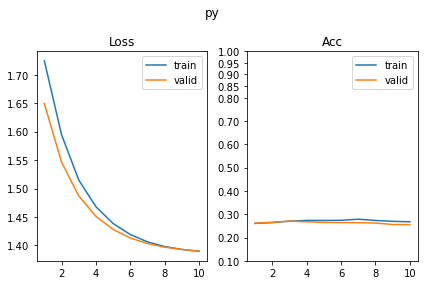

[  6/630] px         SUP_[FCN8i223o32_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.04it/s, loss=1.64, acc=0.259]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.15it/s, loss=1.52, acc=0.268]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.70it/s, loss=1.52, acc=0.238]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.53it/s, loss=1.53, acc=0.259]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.49it/s, loss=1.48, acc=0.265]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 133.51it/s, loss=1.46, acc=0.261]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 101.45it/s, loss=1.45, acc=0.262]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 136.58it/s, loss=1.43, acc=0.249]     

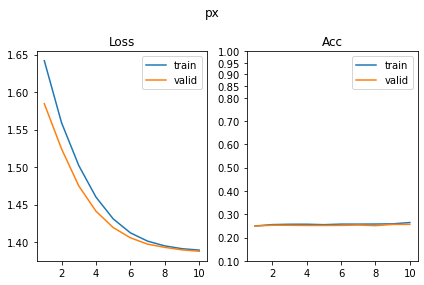

SUP_[FCN8i223o32_d8]_target_[scale]
[  7/630] shape      SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 108.49it/s, loss=2.15, acc=0.142]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.11it/s, loss=2.12, acc=0.137]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.26it/s, loss=2.01, acc=0.148]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 140.93it/s, loss=2.05, acc=0.18]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 102.61it/s, loss=2.01, acc=0.14]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 137.01it/s, loss=2, acc=0.127]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 98.26it/s, loss=1.97, acc=0.147]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 137.90it/s, loss=1.96, acc=0.161]     

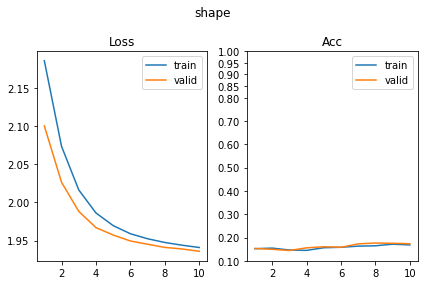

[  8/630] scale      SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.86it/s, loss=1.21, acc=0.326]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 135.41it/s, loss=1.23, acc=0.3]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 127.44it/s, loss=1.06, acc=0.319]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.95it/s, loss=1.04, acc=0.349]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 114.01it/s, loss=0.916, acc=0.353]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.87it/s, loss=0.919, acc=0.383]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 101.06it/s, loss=0.791, acc=0.686]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 151.36it/s, loss=0.844, acc=0.632]    

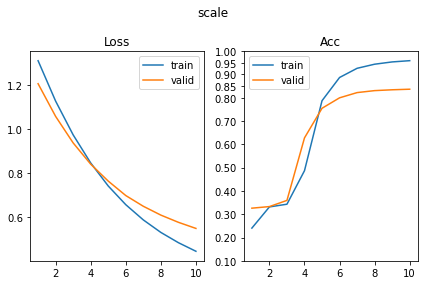

[  9/630] color      SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.18it/s, loss=2.2, acc=0.142]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 137.55it/s, loss=2.17, acc=0.134]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 98.61it/s, loss=2.14, acc=0.114]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 135.57it/s, loss=2.15, acc=0.0951]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.21it/s, loss=2.11, acc=0.14]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.67it/s, loss=2.11, acc=0.115]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.29it/s, loss=2.11, acc=0.124]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 137.34it/s, loss=2.11, acc=0.129]     

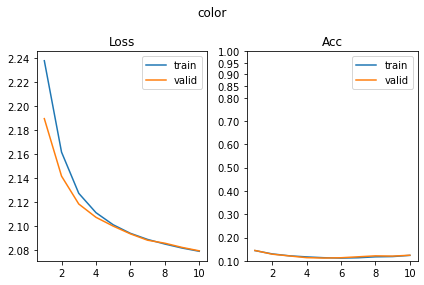

[ 10/630] angle      SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 126.24it/s, loss=2.9, acc=0.0537]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 138.88it/s, loss=2.86, acc=0.0805]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 98.45it/s, loss=2.82, acc=0.0733]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 141.08it/s, loss=2.84, acc=0.0659]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.88it/s, loss=2.8, acc=0.0749]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 140.02it/s, loss=2.82, acc=0.0634]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.58it/s, loss=2.8, acc=0.0635]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.61it/s, loss=2.82, acc=0.0512]    

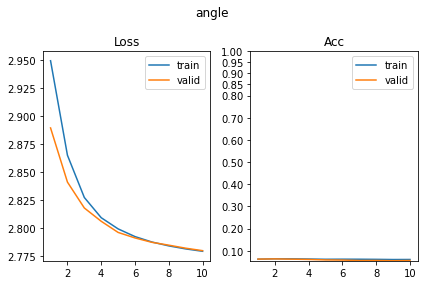

[ 11/630] py         SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 102.36it/s, loss=1.43, acc=0.252]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.39it/s, loss=1.43, acc=0.22]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 120.60it/s, loss=1.39, acc=0.251]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 69.96it/s, loss=1.4, acc=0.227]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 124.45it/s, loss=1.4, acc=0.246]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 140.74it/s, loss=1.39, acc=0.222]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 100.87it/s, loss=1.38, acc=0.267]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 138.59it/s, loss=1.39, acc=0.263]     

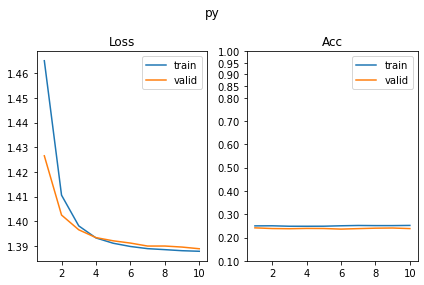

[ 12/630] px         SUP_[FCN8i223o32_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 100.54it/s, loss=1.67, acc=0.27]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.66it/s, loss=1.66, acc=0.273]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.27it/s, loss=1.57, acc=0.239]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 132.68it/s, loss=1.54, acc=0.249]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.41it/s, loss=1.46, acc=0.28]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 132.10it/s, loss=1.46, acc=0.256]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.95it/s, loss=1.42, acc=0.269]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.57it/s, loss=1.41, acc=0.3]       

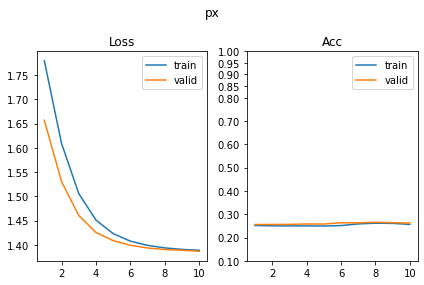

SUP_[FCN8i223o32_d8]_target_[color]
[ 13/630] shape      SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 101.57it/s, loss=2.21, acc=0.145]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.76it/s, loss=2.19, acc=0.139]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.06it/s, loss=2.11, acc=0.134]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.18it/s, loss=2.15, acc=0.139]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.41it/s, loss=2.07, acc=0.142]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 144.99it/s, loss=2.12, acc=0.144]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 147.08it/s, loss=2.03, acc=0.147]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 159.56it/s, loss=2.04, acc=0.161]     

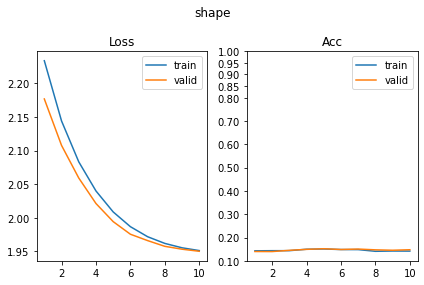

[ 14/630] scale      SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.88it/s, loss=1.22, acc=0.327]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.11it/s, loss=1.27, acc=0.3]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 118.63it/s, loss=1.16, acc=0.378]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.58it/s, loss=1.16, acc=0.346]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.95it/s, loss=1.14, acc=0.349]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.94it/s, loss=1.15, acc=0.315]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.30it/s, loss=1.12, acc=0.336]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.13it/s, loss=1.13, acc=0.293]     

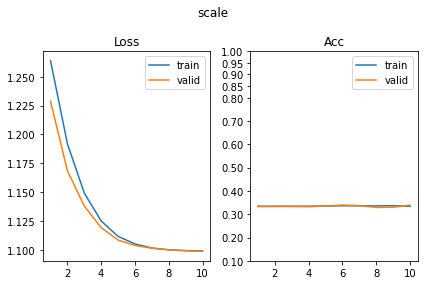

[ 15/630] color      SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.34it/s, loss=1.9, acc=0.629]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 135.40it/s, loss=1.91, acc=0.629]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.12it/s, loss=1.53, acc=0.653]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 134.14it/s, loss=1.55, acc=0.634]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.93it/s, loss=1.37, acc=0.616]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.08it/s, loss=1.39, acc=0.602]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.03it/s, loss=1.15, acc=0.622]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.85it/s, loss=1.15, acc=0.598]     

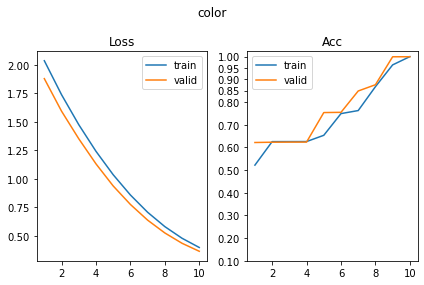

[ 16/630] angle      SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 107.79it/s, loss=3.15, acc=0.0782]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.89it/s, loss=3.2, acc=0.078]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.28it/s, loss=3.04, acc=0.0521]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 131.04it/s, loss=3.04, acc=0.0537]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.15it/s, loss=2.94, acc=0.0717]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.57it/s, loss=2.98, acc=0.061]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.10it/s, loss=2.92, acc=0.0733]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 61.85it/s, loss=2.98, acc=0.0683]     

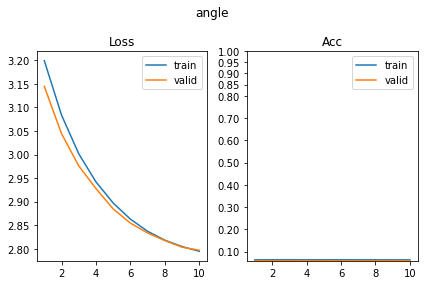

[ 17/630] py         SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.40it/s, loss=1.61, acc=0.264]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.04it/s, loss=1.71, acc=0.224]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 113.97it/s, loss=1.58, acc=0.254]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.33it/s, loss=1.61, acc=0.18]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 115.04it/s, loss=1.44, acc=0.296]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.73it/s, loss=1.57, acc=0.22]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.14it/s, loss=1.46, acc=0.246]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.14it/s, loss=1.51, acc=0.193]     

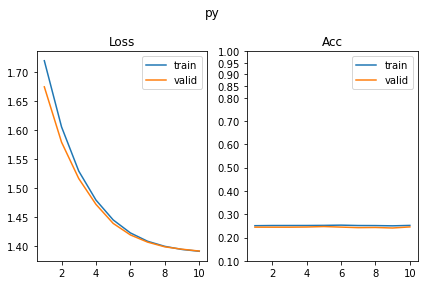

[ 18/630] px         SUP_[FCN8i223o32_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.78it/s, loss=1.7, acc=0.23]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 146.71it/s, loss=1.67, acc=0.21]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 107.01it/s, loss=1.6, acc=0.261]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 150.13it/s, loss=1.6, acc=0.283]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.75it/s, loss=1.52, acc=0.228]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.04it/s, loss=1.51, acc=0.244]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.86it/s, loss=1.45, acc=0.262]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.51it/s, loss=1.44, acc=0.254]     

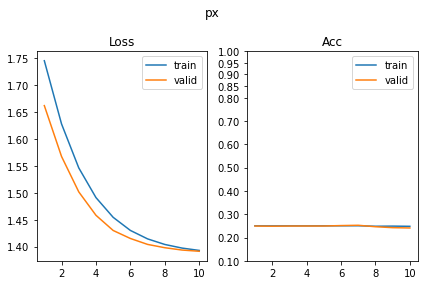

SUP_[FCN8i223o32_d8]_target_[angle]
[ 19/630] shape      SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 111.81it/s, loss=2.2, acc=0.194]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 62.99it/s, loss=2.27, acc=0.176]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 114.84it/s, loss=2.15, acc=0.187]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.13it/s, loss=2.21, acc=0.163]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.89it/s, loss=2.11, acc=0.189]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 133.37it/s, loss=2.08, acc=0.2]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.24it/s, loss=2.04, acc=0.207]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.53it/s, loss=2.05, acc=0.176]     

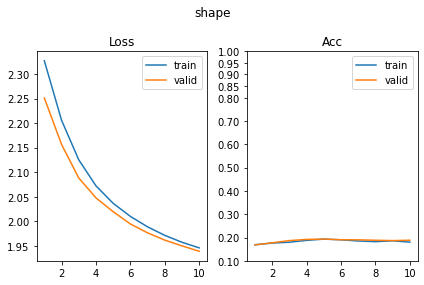

[ 20/630] scale      SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.13it/s, loss=1.25, acc=0.321]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.14it/s, loss=1.22, acc=0.341]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 106.76it/s, loss=1.2, acc=0.319]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.62it/s, loss=1.2, acc=0.376]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 112.75it/s, loss=1.16, acc=0.362]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 130.36it/s, loss=1.16, acc=0.337]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.33it/s, loss=1.13, acc=0.353]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.25it/s, loss=1.13, acc=0.322]     

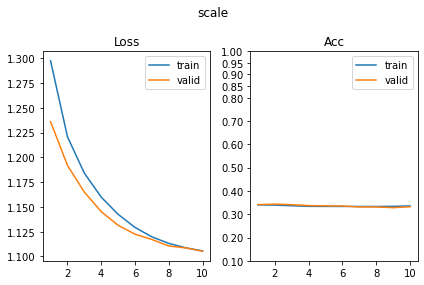

[ 21/630] color      SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.06it/s, loss=2.39, acc=0.116]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.56it/s, loss=2.47, acc=0.12]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.38it/s, loss=2.28, acc=0.127]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 132.12it/s, loss=2.31, acc=0.12]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.00it/s, loss=2.22, acc=0.132]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.06it/s, loss=2.29, acc=0.112]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.11it/s, loss=2.17, acc=0.142]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.99it/s, loss=2.22, acc=0.1]       

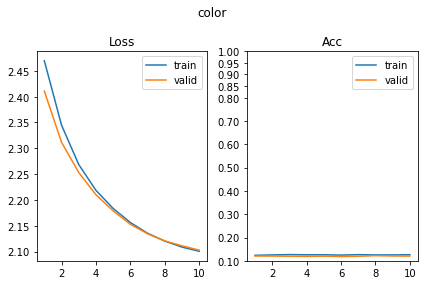

[ 22/630] angle      SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 118.34it/s, loss=2.79, acc=0.199]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.22it/s, loss=2.78, acc=0.202]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.94it/s, loss=2.48, acc=0.274]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.74it/s, loss=2.54, acc=0.271]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.30it/s, loss=2.33, acc=0.301]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.26it/s, loss=2.35, acc=0.307]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.76it/s, loss=2.03, acc=0.409]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.49it/s, loss=2.13, acc=0.359]     

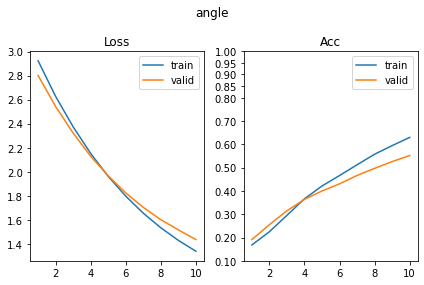

[ 23/630] py         SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.16it/s, loss=1.69, acc=0.267]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.17it/s, loss=1.62, acc=0.276]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 104.10it/s, loss=1.57, acc=0.259]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.07it/s, loss=1.62, acc=0.227]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.06it/s, loss=1.51, acc=0.275]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.49it/s, loss=1.53, acc=0.239]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.17it/s, loss=1.52, acc=0.223]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 193.57it/s, loss=1.49, acc=0.239]     

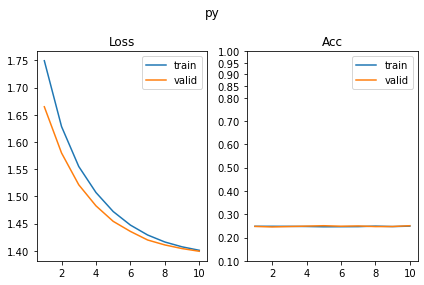

[ 24/630] px         SUP_[FCN8i223o32_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.03it/s, loss=1.67, acc=0.256]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.67it/s, loss=1.63, acc=0.263]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.84it/s, loss=1.54, acc=0.254]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.26it/s, loss=1.61, acc=0.244]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 82.77it/s, loss=1.51, acc=0.274]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.11it/s, loss=1.52, acc=0.256]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.73it/s, loss=1.46, acc=0.223]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.48it/s, loss=1.53, acc=0.229]     

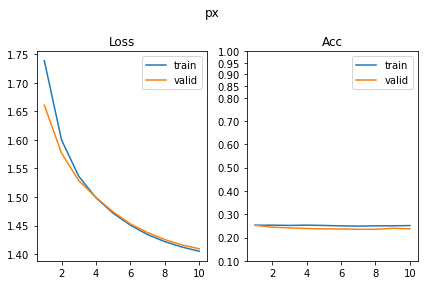

SUP_[FCN8i223o32_d8]_target_[py]
[ 25/630] shape      SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 129.87it/s, loss=2.13, acc=0.137]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.04it/s, loss=2.09, acc=0.144]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 192.01it/s, loss=2.09, acc=0.13]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 131.76it/s, loss=2, acc=0.149]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.28it/s, loss=2.02, acc=0.132]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.95it/s, loss=1.99, acc=0.171]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.09it/s, loss=1.97, acc=0.153]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.47it/s, loss=1.97, acc=0.163]     

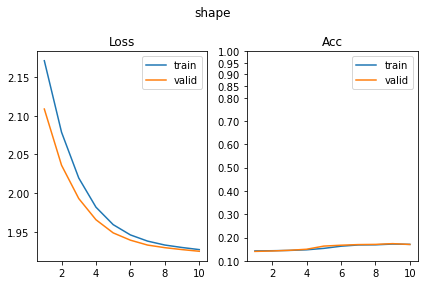

[ 26/630] scale      SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.09it/s, loss=1.28, acc=0.37]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 152.67it/s, loss=1.28, acc=0.341]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.25it/s, loss=1.17, acc=0.363]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.92it/s, loss=1.22, acc=0.354]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.61it/s, loss=1.16, acc=0.35]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 90.30it/s, loss=1.18, acc=0.312]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.96it/s, loss=1.11, acc=0.365]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.15it/s, loss=1.12, acc=0.359]     

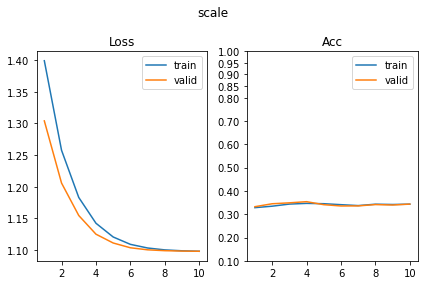

[ 27/630] color      SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.77it/s, loss=2.31, acc=0.125]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 140.89it/s, loss=2.36, acc=0.124]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 99.17it/s, loss=2.23, acc=0.138]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.15it/s, loss=2.25, acc=0.0976]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 102.80it/s, loss=2.18, acc=0.117]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 140.86it/s, loss=2.19, acc=0.11]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 103.35it/s, loss=2.11, acc=0.16]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 140.55it/s, loss=2.17, acc=0.1]       

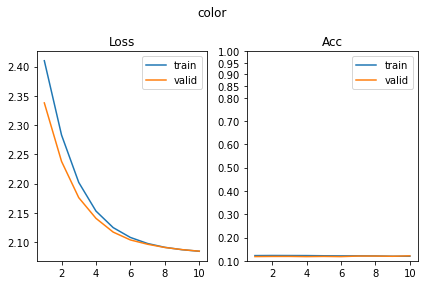

[ 28/630] angle      SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 125.93it/s, loss=3.13, acc=0.0635]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 144.87it/s, loss=3.12, acc=0.0707]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 98.81it/s, loss=3.02, acc=0.0423]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 142.04it/s, loss=3, acc=0.0634]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.69it/s, loss=2.9, acc=0.0749]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 141.29it/s, loss=2.85, acc=0.0634]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 103.14it/s, loss=2.85, acc=0.0635]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.64it/s, loss=2.86, acc=0.0707]     

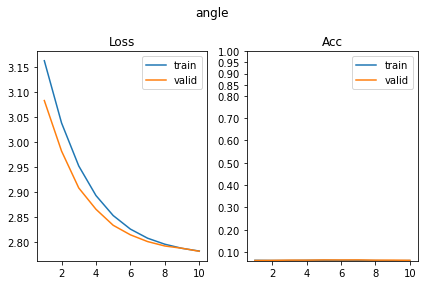

[ 29/630] py         SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.35it/s, loss=1.28, acc=0.311]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 139.46it/s, loss=1.28, acc=0.317]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.93it/s, loss=1.03, acc=0.472]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.17it/s, loss=1.03, acc=0.495]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 121.23it/s, loss=0.841, acc=0.855]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 141.29it/s, loss=0.839, acc=0.861]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 106.16it/s, loss=0.665, acc=0.948]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 183.89it/s, loss=0.709, acc=0.917]    

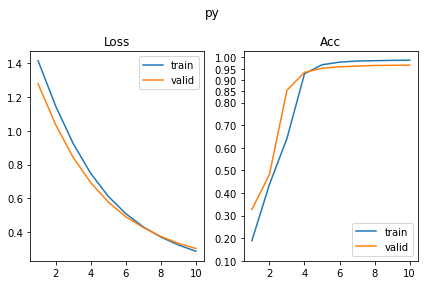

[ 30/630] px         SUP_[FCN8i223o32_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.48it/s, loss=1.6, acc=0.251]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.65it/s, loss=1.52, acc=0.261]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.80it/s, loss=1.53, acc=0.244]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.95it/s, loss=1.5, acc=0.246]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.30it/s, loss=1.43, acc=0.264]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.55it/s, loss=1.44, acc=0.249]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 96.33it/s, loss=1.44, acc=0.249]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.58it/s, loss=1.41, acc=0.268]     

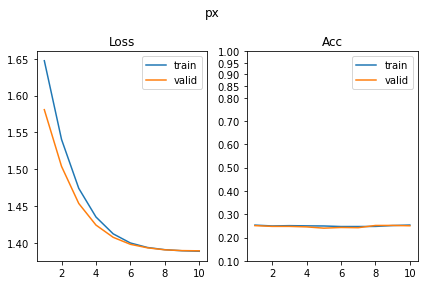

SUP_[FCN8i223o32_d8]_target_[px]
[ 31/630] shape      SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 121.95it/s, loss=2.12, acc=0.134]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 138.51it/s, loss=2.1, acc=0.144]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 99.53it/s, loss=2.01, acc=0.137]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 140.27it/s, loss=2.03, acc=0.154]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.28it/s, loss=2.01, acc=0.15]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 139.86it/s, loss=2.02, acc=0.12]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 99.31it/s, loss=2.01, acc=0.116]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 138.24it/s, loss=1.97, acc=0.159]     

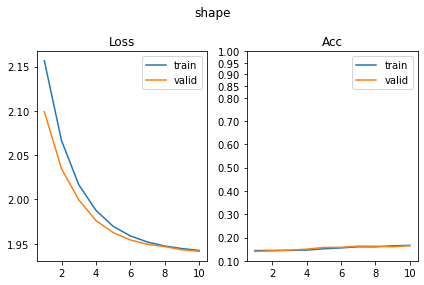

[ 32/630] scale      SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 97.22it/s, loss=1.16, acc=0.36]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.87it/s, loss=1.15, acc=0.324]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 119.80it/s, loss=1.13, acc=0.316]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.08it/s, loss=1.12, acc=0.356]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 118.43it/s, loss=1.11, acc=0.292]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 139.56it/s, loss=1.12, acc=0.332]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 102.58it/s, loss=1.11, acc=0.336]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 143.65it/s, loss=1.1, acc=0.341]      

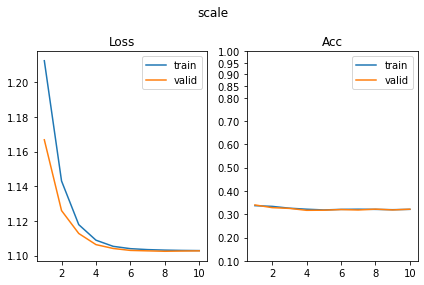

[ 33/630] color      SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.79it/s, loss=2.33, acc=0.122]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 133.41it/s, loss=2.31, acc=0.11]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.69it/s, loss=2.25, acc=0.129]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.52it/s, loss=2.23, acc=0.127]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.38it/s, loss=2.15, acc=0.14]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 132.17it/s, loss=2.09, acc=0.176]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.80it/s, loss=2.15, acc=0.106]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 90.11it/s, loss=2.12, acc=0.146]      

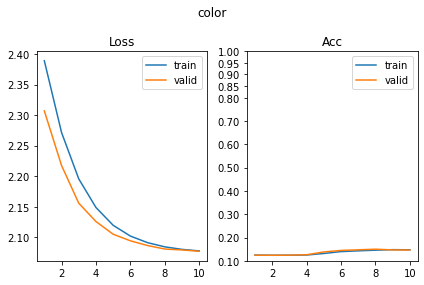

[ 34/630] angle      SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 113.07it/s, loss=2.96, acc=0.0668]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 140.28it/s, loss=2.9, acc=0.0561]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.27it/s, loss=2.93, acc=0.057]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.03it/s, loss=2.9, acc=0.0683]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.47it/s, loss=2.83, acc=0.0684]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 134.90it/s, loss=2.85, acc=0.0585]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.22it/s, loss=2.81, acc=0.0651]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.63it/s, loss=2.81, acc=0.0585]    

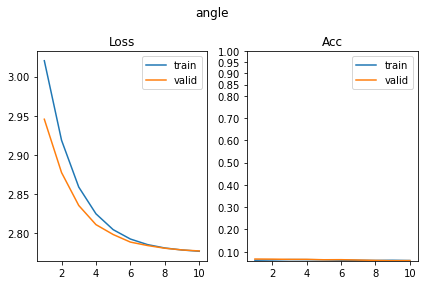

[ 35/630] py         SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 104.84it/s, loss=1.61, acc=0.225]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 145.01it/s, loss=1.57, acc=0.261]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 112.91it/s, loss=1.46, acc=0.27]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.92it/s, loss=1.44, acc=0.288]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 123.25it/s, loss=1.45, acc=0.265]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 141.27it/s, loss=1.41, acc=0.268]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 101.23it/s, loss=1.42, acc=0.251]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 145.17it/s, loss=1.41, acc=0.254]     

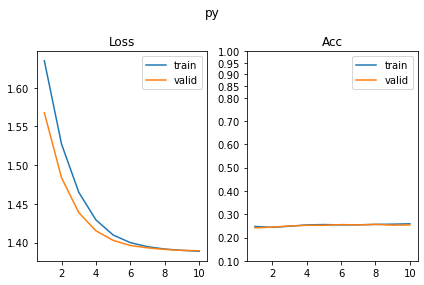

[ 36/630] px         SUP_[FCN8i223o32_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.31it/s, loss=1.26, acc=0.436]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 141.99it/s, loss=1.21, acc=0.437]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.92it/s, loss=1.05, acc=0.546]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 137.75it/s, loss=1.07, acc=0.515]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 98.53it/s, loss=0.878, acc=0.718]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.02it/s, loss=0.883, acc=0.71]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.45it/s, loss=0.734, acc=0.933]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 47.25it/s, loss=0.756, acc=0.888]     

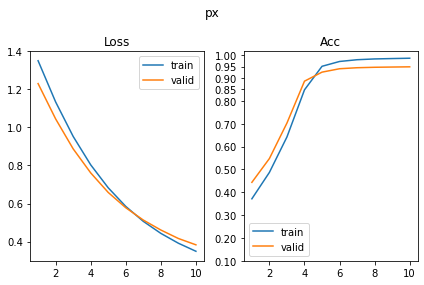

SUP_[FCN8i223o32_d16]_target_[shape]
[ 37/630] shape      SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 118.31it/s, loss=1.36, acc=0.699]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 70.57it/s, loss=1.39, acc=0.668]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 123.82it/s, loss=1.02, acc=0.834]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 144.57it/s, loss=1.11, acc=0.771]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.05it/s, loss=0.804, acc=0.977]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 143.81it/s, loss=0.811, acc=0.968]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 98.66it/s, loss=0.626, acc=0.993]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 142.06it/s, loss=0.613, acc=0.985]    

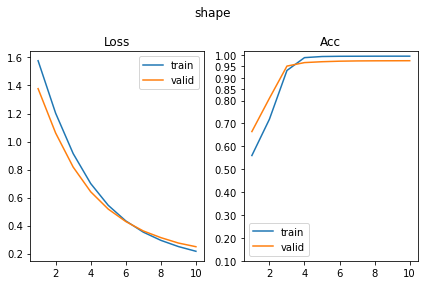

[ 38/630] scale      SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 102.02it/s, loss=1.19, acc=0.287]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 137.20it/s, loss=1.2, acc=0.29]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 128.29it/s, loss=1.12, acc=0.353]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.24it/s, loss=1.11, acc=0.341]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 127.42it/s, loss=1.11, acc=0.358]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 143.68it/s, loss=1.1, acc=0.329]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 103.55it/s, loss=1.1, acc=0.357]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 144.64it/s, loss=1.1, acc=0.315]      

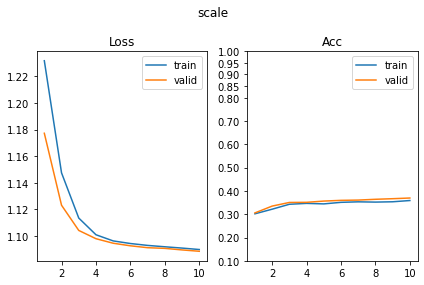

[ 39/630] color      SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 99.61it/s, loss=2.19, acc=0.125]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 141.32it/s, loss=2.18, acc=0.132]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 100.57it/s, loss=2.14, acc=0.138]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 139.11it/s, loss=2.13, acc=0.129]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.11it/s, loss=2.11, acc=0.138]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 137.99it/s, loss=2.12, acc=0.134]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 96.12it/s, loss=2.11, acc=0.124]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 135.14it/s, loss=2.1, acc=0.127]      

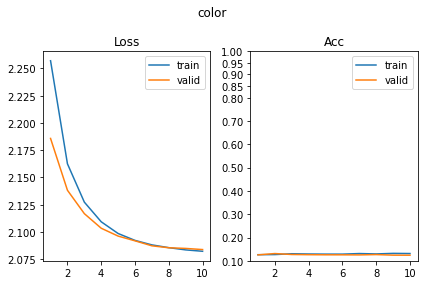

[ 40/630] angle      SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 127.40it/s, loss=2.97, acc=0.07]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 145.28it/s, loss=2.98, acc=0.0659]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 101.34it/s, loss=2.89, acc=0.0717]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.91it/s, loss=2.88, acc=0.0634]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 100.97it/s, loss=2.84, acc=0.0782]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.23it/s, loss=2.82, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.98it/s, loss=2.83, acc=0.0733]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.25it/s, loss=2.82, acc=0.0585]    

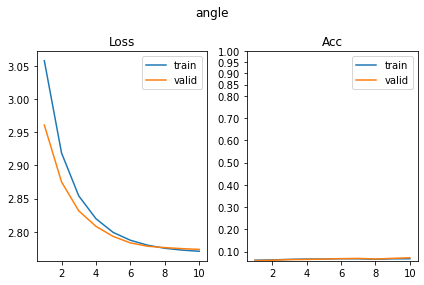

[ 41/630] py         SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.41it/s, loss=1.47, acc=0.244]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.24it/s, loss=1.43, acc=0.276]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 107.07it/s, loss=1.42, acc=0.264]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.27it/s, loss=1.39, acc=0.259]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 103.49it/s, loss=1.41, acc=0.218]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.26it/s, loss=1.4, acc=0.268]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.16it/s, loss=1.4, acc=0.217]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.27it/s, loss=1.39, acc=0.256]     

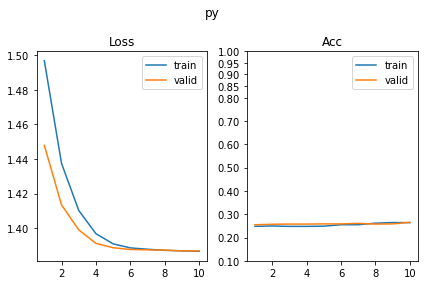

[ 42/630] px         SUP_[FCN8i223o32_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 101.67it/s, loss=1.46, acc=0.243]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 140.45it/s, loss=1.43, acc=0.293]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.99it/s, loss=1.43, acc=0.244]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 138.76it/s, loss=1.44, acc=0.224]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.55it/s, loss=1.4, acc=0.259]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 137.52it/s, loss=1.41, acc=0.224]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 102.13it/s, loss=1.4, acc=0.204]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 139.96it/s, loss=1.39, acc=0.232]     

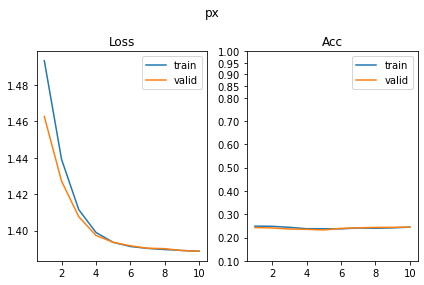

SUP_[FCN8i223o32_d16]_target_[scale]
[ 43/630] shape      SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 131.51it/s, loss=2.05, acc=0.153]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 141.77it/s, loss=2.06, acc=0.137]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 102.24it/s, loss=1.97, acc=0.174]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 144.82it/s, loss=1.96, acc=0.19]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.95it/s, loss=1.93, acc=0.202]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 138.09it/s, loss=1.93, acc=0.205]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.07it/s, loss=1.92, acc=0.184]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 136.47it/s, loss=1.93, acc=0.161]     

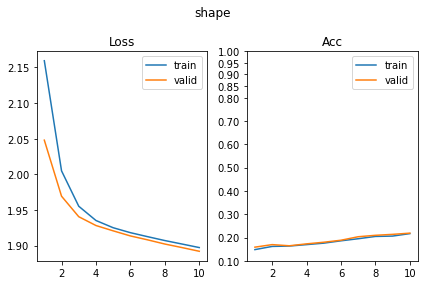

[ 44/630] scale      SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.35it/s, loss=1.24, acc=0.292]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.60it/s, loss=1.21, acc=0.302]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 112.74it/s, loss=0.956, acc=0.498]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.71it/s, loss=0.974, acc=0.48]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 114.81it/s, loss=0.758, acc=0.883]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.14it/s, loss=0.837, acc=0.759]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.95it/s, loss=0.629, acc=0.94]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 92.27it/s, loss=0.731, acc=0.776]     

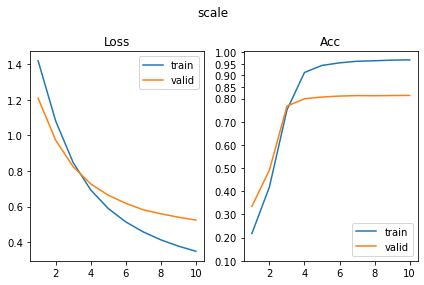

[ 45/630] color      SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.22it/s, loss=2.15, acc=0.0896]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 137.40it/s, loss=2.12, acc=0.117]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 103.29it/s, loss=2.09, acc=0.124]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 217.77it/s, loss=2.07, acc=0.134]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.91it/s, loss=2.08, acc=0.13]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 140.82it/s, loss=2.08, acc=0.137]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.70it/s, loss=2.08, acc=0.13]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 140.07it/s, loss=2.08, acc=0.132]     

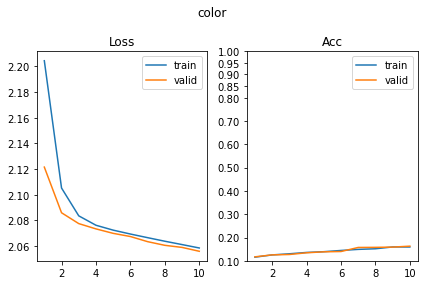

[ 46/630] angle      SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.61it/s, loss=2.95, acc=0.0603]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.11it/s, loss=2.85, acc=0.0659]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 67.08it/s, loss=2.82, acc=0.0668]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.72it/s, loss=2.8, acc=0.0537]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.34it/s, loss=2.79, acc=0.0765]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.97it/s, loss=2.79, acc=0.0707]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.03it/s, loss=2.78, acc=0.0651]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.02it/s, loss=2.78, acc=0.0854]    

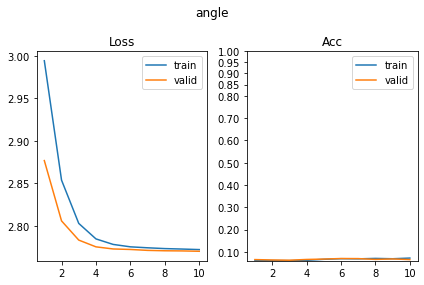

[ 47/630] py         SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.73it/s, loss=1.58, acc=0.262]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.54it/s, loss=1.6, acc=0.239]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.81it/s, loss=1.44, acc=0.252]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.43it/s, loss=1.44, acc=0.266]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 113.56it/s, loss=1.42, acc=0.248]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.54it/s, loss=1.41, acc=0.217]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.02it/s, loss=1.39, acc=0.259]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.52it/s, loss=1.4, acc=0.254]      

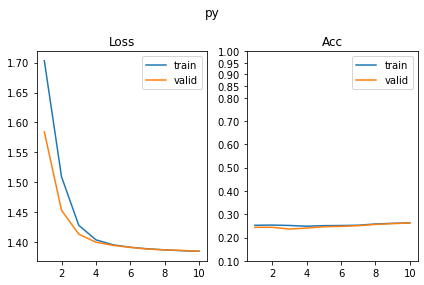

[ 48/630] px         SUP_[FCN8i223o32_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.23it/s, loss=1.47, acc=0.251]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.39it/s, loss=1.42, acc=0.278]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.01it/s, loss=1.38, acc=0.309]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.50it/s, loss=1.4, acc=0.244]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.41it/s, loss=1.38, acc=0.287]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.18it/s, loss=1.38, acc=0.29]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.48it/s, loss=1.38, acc=0.279]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.07it/s, loss=1.39, acc=0.285]     

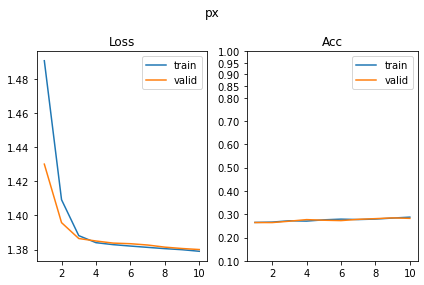

SUP_[FCN8i223o32_d16]_target_[color]
[ 49/630] shape      SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 182.33it/s, loss=2.11, acc=0.148]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 88.10it/s, loss=2.05, acc=0.171]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 174.47it/s, loss=1.98, acc=0.161]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 149.96it/s, loss=1.99, acc=0.161]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 105.46it/s, loss=1.97, acc=0.153]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 214.86it/s, loss=1.97, acc=0.168]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 149.69it/s, loss=1.96, acc=0.155]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 216.01it/s, loss=1.96, acc=0.159]     

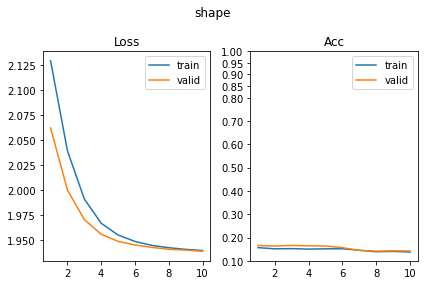

[ 50/630] scale      SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 150.99it/s, loss=1.25, acc=0.334]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 217.89it/s, loss=1.27, acc=0.329]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 195.20it/s, loss=1.18, acc=0.336]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.33it/s, loss=1.2, acc=0.307]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 148.36it/s, loss=1.15, acc=0.321]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 143.51it/s, loss=1.15, acc=0.317]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 105.82it/s, loss=1.12, acc=0.358]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 144.57it/s, loss=1.11, acc=0.376]     

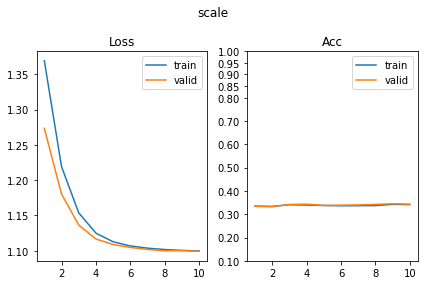

[ 51/630] color      SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 152.16it/s, loss=1.76, acc=0.355]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 210.32it/s, loss=1.75, acc=0.388]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 148.97it/s, loss=1.31, acc=0.622]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 219.07it/s, loss=1.31, acc=0.649]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 153.45it/s, loss=1.01, acc=0.777]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 217.68it/s, loss=1.02, acc=0.771]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 125.60it/s, loss=0.739, acc=1]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 215.44it/s, loss=0.739, acc=0.995]    

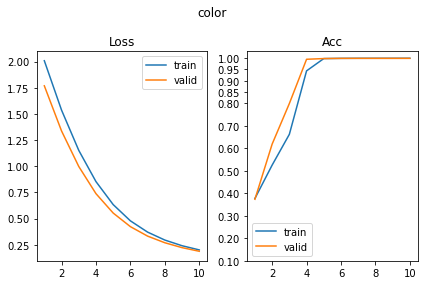

[ 52/630] angle      SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 130.27it/s, loss=2.99, acc=0.0423]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.15it/s, loss=3.05, acc=0.0512]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 132.92it/s, loss=2.86, acc=0.0749]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.11it/s, loss=2.84, acc=0.0488]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 152.65it/s, loss=2.85, acc=0.0684]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 220.98it/s, loss=2.89, acc=0.0463]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 154.12it/s, loss=2.84, acc=0.0668]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 217.32it/s, loss=2.84, acc=0.0488]    

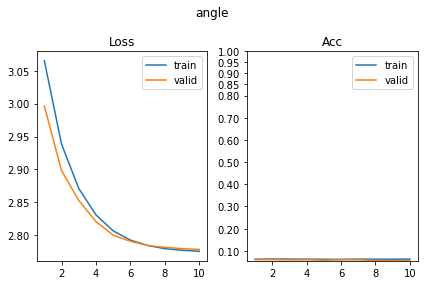

[ 53/630] py         SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 143.64it/s, loss=1.46, acc=0.249]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 209.57it/s, loss=1.41, acc=0.298]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 155.89it/s, loss=1.43, acc=0.277]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 95.15it/s, loss=1.43, acc=0.249]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 194.53it/s, loss=1.4, acc=0.261]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 219.72it/s, loss=1.39, acc=0.268]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 154.43it/s, loss=1.4, acc=0.256]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 219.21it/s, loss=1.39, acc=0.256]     

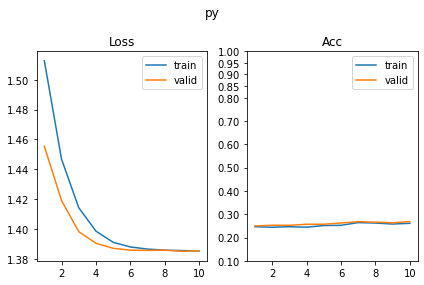

[ 54/630] px         SUP_[FCN8i223o32_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 116.30it/s, loss=1.56, acc=0.252]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 142.41it/s, loss=1.57, acc=0.244]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 129.63it/s, loss=1.46, acc=0.27]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 217.05it/s, loss=1.47, acc=0.21]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 149.65it/s, loss=1.42, acc=0.267]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 170.01it/s, loss=1.45, acc=0.244]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 136.82it/s, loss=1.41, acc=0.248]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 148.17it/s, loss=1.39, acc=0.285]     

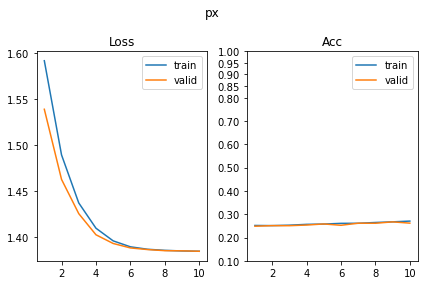

SUP_[FCN8i223o32_d16]_target_[angle]
[ 55/630] shape      SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 195.24it/s, loss=2.08, acc=0.138]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 73.47it/s, loss=2.04, acc=0.161]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 192.81it/s, loss=2, acc=0.169]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 220.59it/s, loss=1.99, acc=0.19]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 150.01it/s, loss=1.96, acc=0.163]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 216.24it/s, loss=1.95, acc=0.163]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 150.68it/s, loss=1.91, acc=0.171]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 218.41it/s, loss=1.91, acc=0.168]     

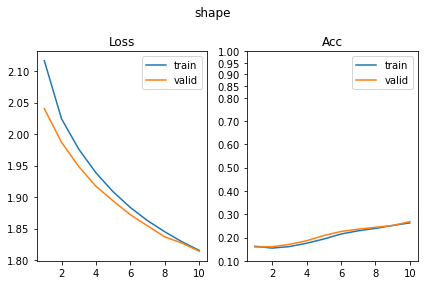

[ 56/630] scale      SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 105.89it/s, loss=1.18, acc=0.321]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 150.41it/s, loss=1.12, acc=0.359]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 143.21it/s, loss=1.14, acc=0.288]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 102.90it/s, loss=1.14, acc=0.356]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 182.68it/s, loss=1.13, acc=0.322]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 170.25it/s, loss=1.12, acc=0.337]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 109.75it/s, loss=1.11, acc=0.342]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 150.55it/s, loss=1.11, acc=0.32]      

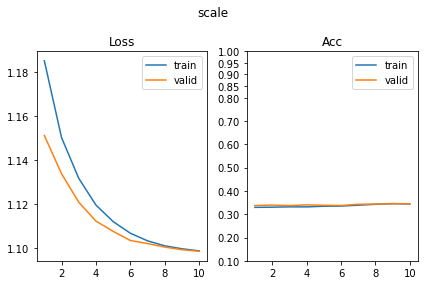

[ 57/630] color      SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 148.42it/s, loss=2.2, acc=0.13]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 213.66it/s, loss=2.21, acc=0.117]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 151.11it/s, loss=2.16, acc=0.13]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 219.45it/s, loss=2.15, acc=0.127]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 154.96it/s, loss=2.18, acc=0.101]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 217.18it/s, loss=2.14, acc=0.127]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 156.54it/s, loss=2.1, acc=0.137]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 178.38it/s, loss=2.11, acc=0.132]     

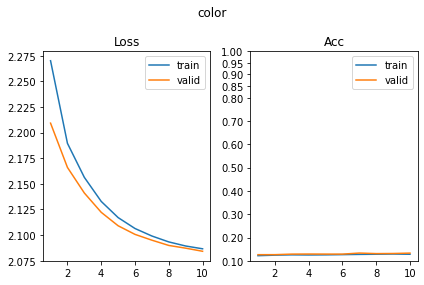

[ 58/630] angle      SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 176.53it/s, loss=2.7, acc=0.142]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.50it/s, loss=2.61, acc=0.173]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 195.14it/s, loss=2.32, acc=0.305]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 203.51it/s, loss=2.34, acc=0.271]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 118.92it/s, loss=2.04, acc=0.43]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 220.43it/s, loss=2.11, acc=0.39]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 154.89it/s, loss=1.82, acc=0.565]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 219.31it/s, loss=1.84, acc=0.502]     

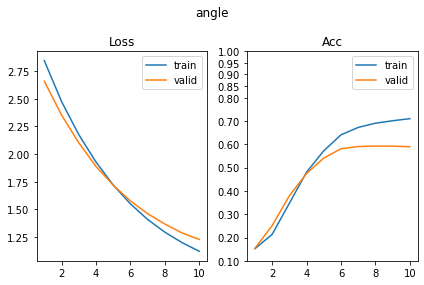

[ 59/630] py         SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 153.05it/s, loss=1.59, acc=0.249]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 218.33it/s, loss=1.56, acc=0.234]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 156.89it/s, loss=1.49, acc=0.244]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 217.53it/s, loss=1.47, acc=0.251]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 193.73it/s, loss=1.45, acc=0.257]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.70it/s, loss=1.47, acc=0.239]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 193.24it/s, loss=1.44, acc=0.223]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 218.76it/s, loss=1.44, acc=0.237]     

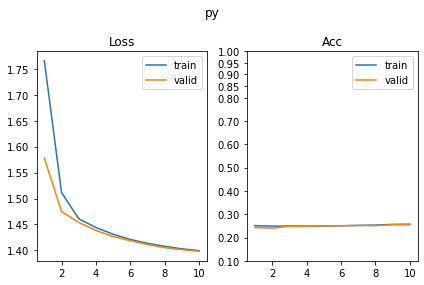

[ 60/630] px         SUP_[FCN8i223o32_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 191.13it/s, loss=1.56, acc=0.259]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 219.62it/s, loss=1.54, acc=0.259]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 153.26it/s, loss=1.44, acc=0.262]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 218.73it/s, loss=1.5, acc=0.21]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 156.19it/s, loss=1.44, acc=0.28]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 217.88it/s, loss=1.44, acc=0.227]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 149.19it/s, loss=1.4, acc=0.275]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 208.63it/s, loss=1.43, acc=0.244]     

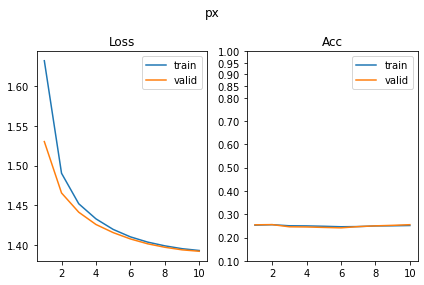

SUP_[FCN8i223o32_d16]_target_[py]
[ 61/630] shape      SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 131.06it/s, loss=2.03, acc=0.114]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.74it/s, loss=2.01, acc=0.146]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 169.86it/s, loss=1.97, acc=0.142]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 220.09it/s, loss=1.97, acc=0.137]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 154.66it/s, loss=1.96, acc=0.161]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 217.37it/s, loss=1.95, acc=0.178]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 148.90it/s, loss=1.94, acc=0.148]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 216.66it/s, loss=1.95, acc=0.137]     

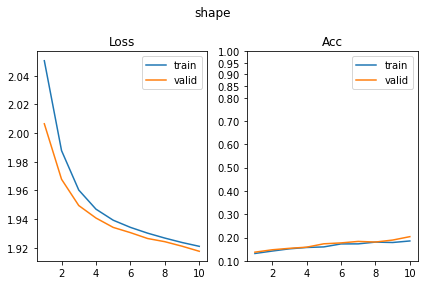

[ 62/630] scale      SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 146.96it/s, loss=1.16, acc=0.336]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 210.56it/s, loss=1.14, acc=0.341]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 147.96it/s, loss=1.1, acc=0.334]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 212.41it/s, loss=1.09, acc=0.361]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 188.61it/s, loss=1.1, acc=0.347]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 103.19it/s, loss=1.09, acc=0.356]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 186.96it/s, loss=1.1, acc=0.316]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 210.71it/s, loss=1.09, acc=0.385]     

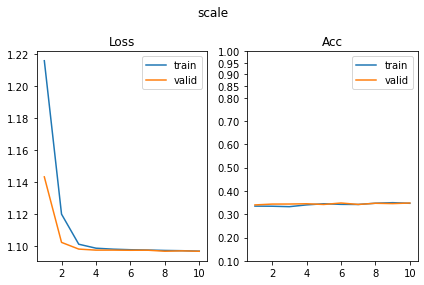

[ 63/630] color      SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 131.01it/s, loss=2.17, acc=0.137]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 149.04it/s, loss=2.2, acc=0.124]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 134.41it/s, loss=2.14, acc=0.107]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 151.49it/s, loss=2.14, acc=0.144]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 131.89it/s, loss=2.11, acc=0.135]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 215.66it/s, loss=2.11, acc=0.122]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 150.14it/s, loss=2.09, acc=0.158]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 210.31it/s, loss=2.1, acc=0.107]      

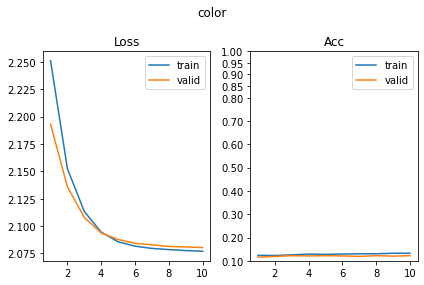

[ 64/630] angle      SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 154.13it/s, loss=2.85, acc=0.0684]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.63it/s, loss=2.85, acc=0.0829]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 128.11it/s, loss=2.83, acc=0.0603]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 146.56it/s, loss=2.83, acc=0.0463]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.54it/s, loss=2.78, acc=0.057]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 143.01it/s, loss=2.8, acc=0.0512]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 99.69it/s, loss=2.78, acc=0.0765]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 142.53it/s, loss=2.77, acc=0.0902]    

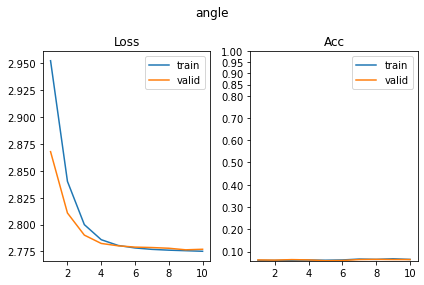

[ 65/630] py         SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.48it/s, loss=0.823, acc=0.746]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.07it/s, loss=0.854, acc=0.668]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.64it/s, loss=0.598, acc=0.971]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.28it/s, loss=0.616, acc=0.946]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 109.26it/s, loss=0.446, acc=0.989]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.28it/s, loss=0.504, acc=0.941]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.07it/s, loss=0.343, acc=0.99]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.24it/s, loss=0.399, acc=0.956]    

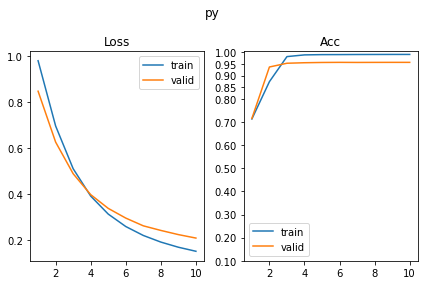

[ 66/630] px         SUP_[FCN8i223o32_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.66it/s, loss=1.48, acc=0.249]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.67it/s, loss=1.5, acc=0.232]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.46it/s, loss=1.41, acc=0.256]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 111.25it/s, loss=1.4, acc=0.278]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.23it/s, loss=1.4, acc=0.264]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.01it/s, loss=1.39, acc=0.263]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.04it/s, loss=1.39, acc=0.241]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 97.18it/s, loss=1.39, acc=0.283]      

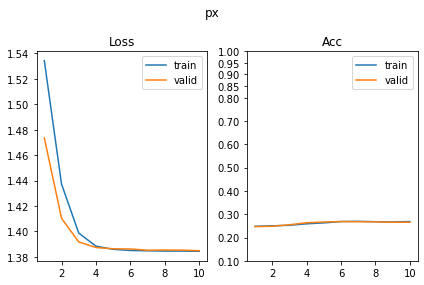

SUP_[FCN8i223o32_d16]_target_[px]
[ 67/630] shape      SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.13it/s, loss=2.06, acc=0.153]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 56.74it/s, loss=2.09, acc=0.134]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.55it/s, loss=2.01, acc=0.148]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 102.77it/s, loss=2.04, acc=0.129]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.63it/s, loss=1.98, acc=0.119]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 146.66it/s, loss=1.97, acc=0.129]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.07it/s, loss=1.95, acc=0.156]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 126.27it/s, loss=1.96, acc=0.154]     

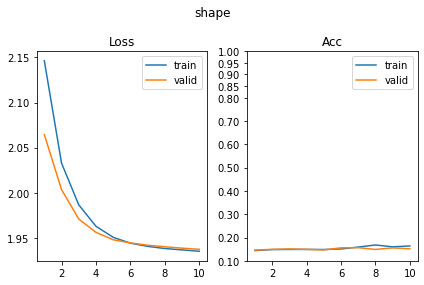

[ 68/630] scale      SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.58it/s, loss=1.13, acc=0.327]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.90it/s, loss=1.12, acc=0.337]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 106.59it/s, loss=1.1, acc=0.337]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.62it/s, loss=1.09, acc=0.38]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.50it/s, loss=1.09, acc=0.363]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.41it/s, loss=1.1, acc=0.356]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.78it/s, loss=1.09, acc=0.345]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.91it/s, loss=1.09, acc=0.349]     

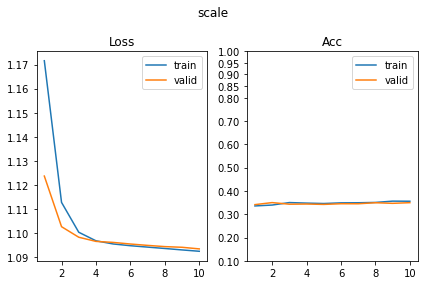

[ 69/630] color      SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.23it/s, loss=2.12, acc=0.137]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.46it/s, loss=2.1, acc=0.127]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.82it/s, loss=2.1, acc=0.112]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 140.28it/s, loss=2.1, acc=0.117]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.37it/s, loss=2.08, acc=0.132]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.42it/s, loss=2.08, acc=0.117]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.57it/s, loss=2.08, acc=0.111]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.77it/s, loss=2.09, acc=0.107]     

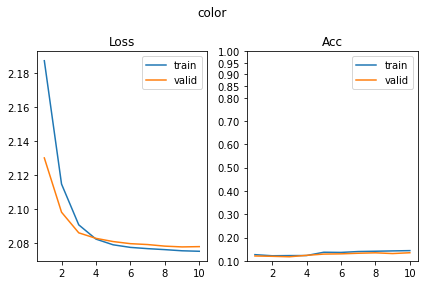

[ 70/630] angle      SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 106.21it/s, loss=2.85, acc=0.0782]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.64it/s, loss=2.88, acc=0.0683]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.52it/s, loss=2.81, acc=0.0619]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.70it/s, loss=2.79, acc=0.0683]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.20it/s, loss=2.79, acc=0.0668]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 135.58it/s, loss=2.78, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.36it/s, loss=2.78, acc=0.0635]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 90.37it/s, loss=2.78, acc=0.061]      

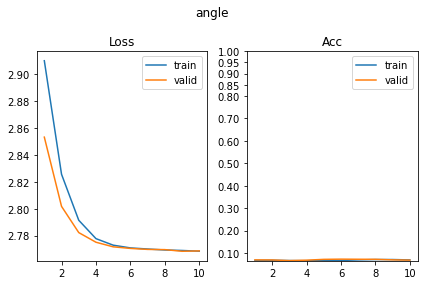

[ 71/630] py         SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.45it/s, loss=1.43, acc=0.246]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.67it/s, loss=1.42, acc=0.239]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.02it/s, loss=1.41, acc=0.252]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.34it/s, loss=1.39, acc=0.28]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.55it/s, loss=1.4, acc=0.235]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.66it/s, loss=1.39, acc=0.237]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.59it/s, loss=1.39, acc=0.265]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 138.82it/s, loss=1.4, acc=0.237]      

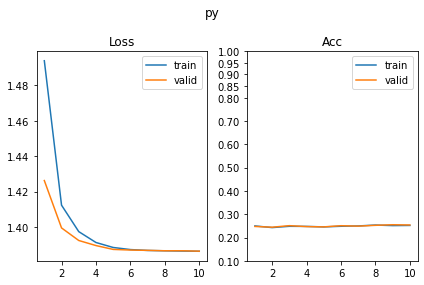

[ 72/630] px         SUP_[FCN8i223o32_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.71it/s, loss=1.02, acc=0.498]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 81.78it/s, loss=1.03, acc=0.466]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.36it/s, loss=0.756, acc=0.673]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 134.80it/s, loss=0.744, acc=0.71]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.17it/s, loss=0.554, acc=0.923]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.67it/s, loss=0.569, acc=0.895]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.57it/s, loss=0.445, acc=0.963]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.06it/s, loss=0.413, acc=0.963]    

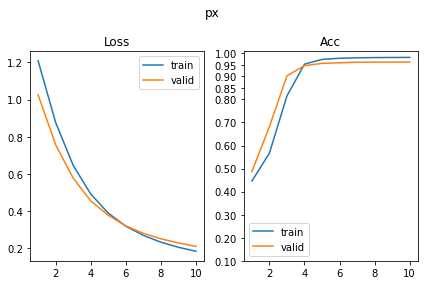

SUP_[FCN8i223o32_d32]_target_[shape]
[ 73/630] shape      SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.22it/s, loss=1.21, acc=0.793]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.52it/s, loss=1.19, acc=0.768]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.65it/s, loss=0.785, acc=0.974]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.39it/s, loss=0.81, acc=0.956]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.04it/s, loss=0.511, acc=0.992]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.84it/s, loss=0.53, acc=0.978]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.31it/s, loss=0.387, acc=0.989]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.92it/s, loss=0.419, acc=0.963]    

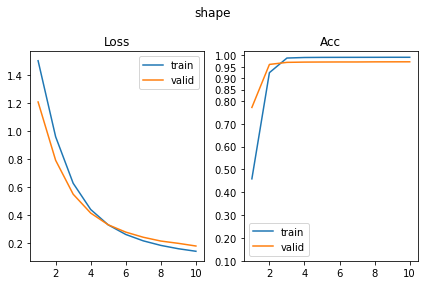

[ 74/630] scale      SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.40it/s, loss=1.12, acc=0.41]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.50it/s, loss=1.13, acc=0.349]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 112.19it/s, loss=1.11, acc=0.376]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.47it/s, loss=1.11, acc=0.366]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 117.56it/s, loss=1.09, acc=0.349]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 139.23it/s, loss=1.1, acc=0.373]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.10it/s, loss=1.09, acc=0.391]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.68it/s, loss=1.09, acc=0.344]     

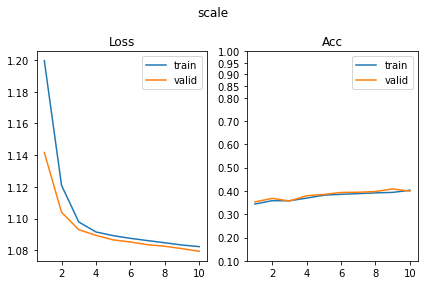

[ 75/630] color      SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.15it/s, loss=2.11, acc=0.134]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.31it/s, loss=2.16, acc=0.0976]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.58it/s, loss=2.09, acc=0.158]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 134.60it/s, loss=2.09, acc=0.139]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.85it/s, loss=2.09, acc=0.135]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 140.57it/s, loss=2.1, acc=0.0878]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.98it/s, loss=2.07, acc=0.169]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.69it/s, loss=2.08, acc=0.134]     

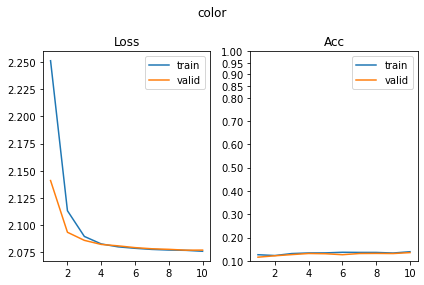

[ 76/630] angle      SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 115.55it/s, loss=2.86, acc=0.0554]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.62it/s, loss=2.83, acc=0.0805]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.41it/s, loss=2.81, acc=0.0472]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.44it/s, loss=2.8, acc=0.061]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.28it/s, loss=2.78, acc=0.0586]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.60it/s, loss=2.78, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.91it/s, loss=2.77, acc=0.0651]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.58it/s, loss=2.78, acc=0.039]     

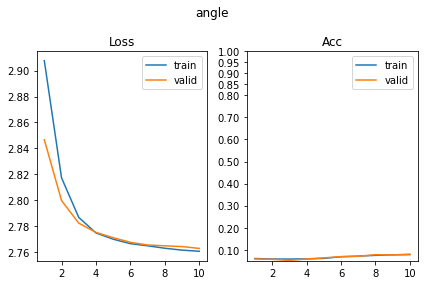

[ 77/630] py         SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.79it/s, loss=1.4, acc=0.267]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.51it/s, loss=1.41, acc=0.254]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 107.79it/s, loss=1.38, acc=0.285]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.15it/s, loss=1.39, acc=0.256]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.27it/s, loss=1.38, acc=0.293]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.43it/s, loss=1.37, acc=0.307]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.95it/s, loss=1.38, acc=0.262]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.69it/s, loss=1.39, acc=0.241]     

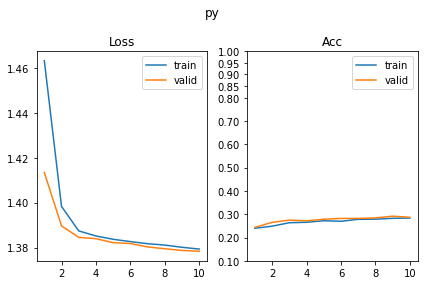

[ 78/630] px         SUP_[FCN8i223o32_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.13it/s, loss=1.42, acc=0.238]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.61it/s, loss=1.42, acc=0.266]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.52it/s, loss=1.4, acc=0.212]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 134.18it/s, loss=1.39, acc=0.244]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.64it/s, loss=1.38, acc=0.279]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.77it/s, loss=1.38, acc=0.278]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.72it/s, loss=1.39, acc=0.264]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.01it/s, loss=1.39, acc=0.254]     

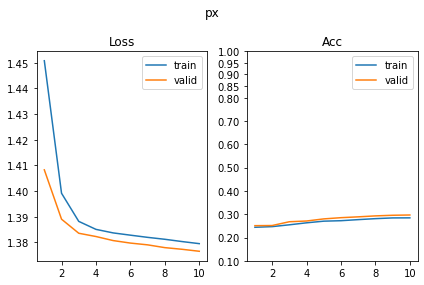

SUP_[FCN8i223o32_d32]_target_[scale]
[ 79/630] shape      SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.45it/s, loss=1.96, acc=0.151]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.75it/s, loss=1.96, acc=0.146]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.04it/s, loss=1.94, acc=0.161]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.13it/s, loss=1.94, acc=0.134]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.57it/s, loss=1.94, acc=0.143]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.16it/s, loss=1.92, acc=0.185]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.51it/s, loss=1.93, acc=0.168]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.44it/s, loss=1.92, acc=0.173]     

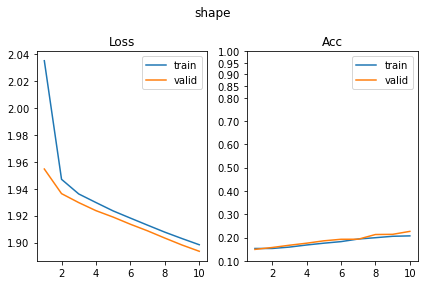

[ 80/630] scale      SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.73it/s, loss=0.751, acc=0.736]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.66it/s, loss=0.785, acc=0.683]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.63it/s, loss=0.566, acc=0.87]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.55it/s, loss=0.676, acc=0.759]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.45it/s, loss=0.468, acc=0.928]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 86.53it/s, loss=0.627, acc=0.776]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.10it/s, loss=0.443, acc=0.925]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 193.43it/s, loss=0.58, acc=0.795]     

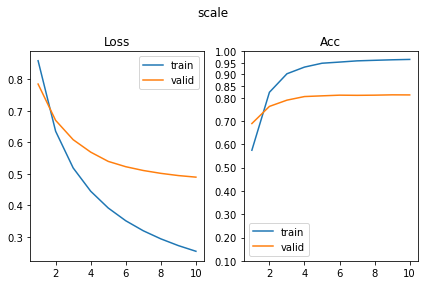

[ 81/630] color      SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.56it/s, loss=2.06, acc=0.121]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.59it/s, loss=2.07, acc=0.107]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.27it/s, loss=2.05, acc=0.138]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.41it/s, loss=2.06, acc=0.12]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.58it/s, loss=2.05, acc=0.135]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.82it/s, loss=2.06, acc=0.144]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.23it/s, loss=2.04, acc=0.179]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.29it/s, loss=2.03, acc=0.159]     

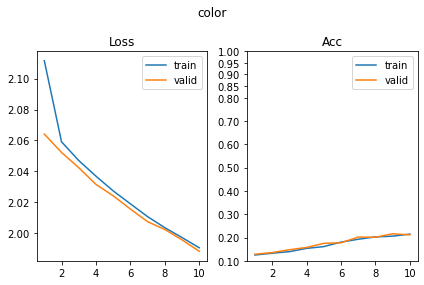

[ 82/630] angle      SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.16it/s, loss=2.78, acc=0.0782]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 137.83it/s, loss=2.78, acc=0.105]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.52it/s, loss=2.77, acc=0.0554]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.96it/s, loss=2.77, acc=0.0634]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.18it/s, loss=2.77, acc=0.0798]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.87it/s, loss=2.77, acc=0.0537]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.84it/s, loss=2.77, acc=0.07]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.21it/s, loss=2.77, acc=0.0707]    

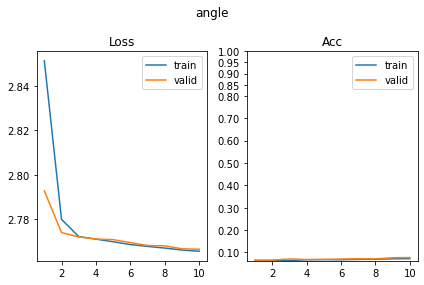

[ 83/630] py         SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.12it/s, loss=1.39, acc=0.243]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.85it/s, loss=1.39, acc=0.249]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 104.32it/s, loss=1.38, acc=0.298]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.13it/s, loss=1.38, acc=0.271]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.57it/s, loss=1.38, acc=0.303]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 88.89it/s, loss=1.37, acc=0.312]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.49it/s, loss=1.37, acc=0.321]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.62it/s, loss=1.38, acc=0.298]     

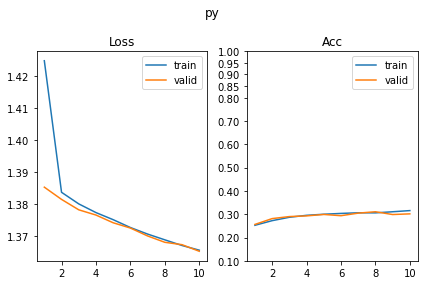

[ 84/630] px         SUP_[FCN8i223o32_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.65it/s, loss=1.4, acc=0.259]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.58it/s, loss=1.4, acc=0.263]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.72it/s, loss=1.39, acc=0.261]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.57it/s, loss=1.39, acc=0.263]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.67it/s, loss=1.38, acc=0.277]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 130.24it/s, loss=1.4, acc=0.22]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.12it/s, loss=1.38, acc=0.261]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.12it/s, loss=1.38, acc=0.276]     

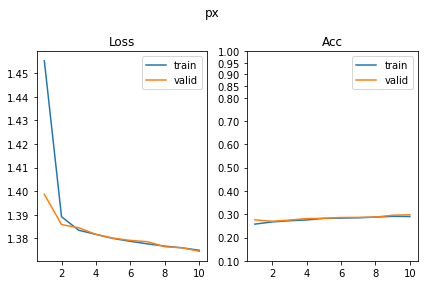

SUP_[FCN8i223o32_d32]_target_[color]
[ 85/630] shape      SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.62it/s, loss=2, acc=0.161]                                              
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 46.26it/s, loss=2.04, acc=0.115]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 66.96it/s, loss=1.96, acc=0.168]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.52it/s, loss=1.95, acc=0.127]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.60it/s, loss=1.96, acc=0.124]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.70it/s, loss=1.95, acc=0.124]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.29it/s, loss=1.94, acc=0.15]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.57it/s, loss=1.95, acc=0.151]     

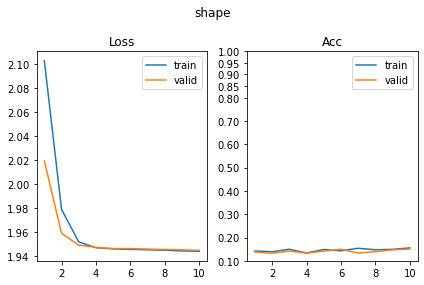

[ 86/630] scale      SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.88it/s, loss=1.12, acc=0.324]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.52it/s, loss=1.11, acc=0.327]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 118.27it/s, loss=1.1, acc=0.324]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.21it/s, loss=1.1, acc=0.38]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 107.97it/s, loss=1.1, acc=0.345]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.69it/s, loss=1.1, acc=0.38]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.10it/s, loss=1.1, acc=0.334]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.45it/s, loss=1.1, acc=0.329]      

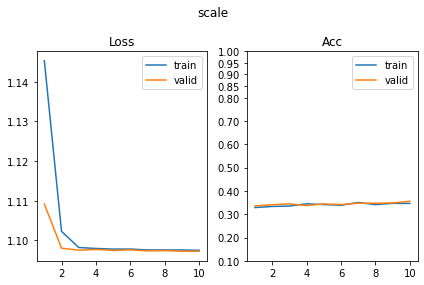

[ 87/630] color      SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.44it/s, loss=1.27, acc=0.607]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.31it/s, loss=1.26, acc=0.629]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.90it/s, loss=0.699, acc=0.863]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.00it/s, loss=0.681, acc=0.888]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.53it/s, loss=0.409, acc=1]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.02it/s, loss=0.387, acc=1]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.10it/s, loss=0.247, acc=1]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.32it/s, loss=0.246, acc=1]        

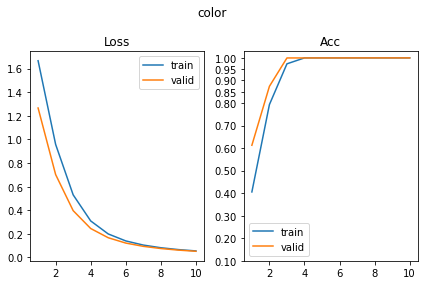

[ 88/630] angle      SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 123.95it/s, loss=2.86, acc=0.0586]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 58.52it/s, loss=2.85, acc=0.0561]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.45it/s, loss=2.79, acc=0.0537]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 132.09it/s, loss=2.8, acc=0.0585]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.66it/s, loss=2.79, acc=0.0635]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.60it/s, loss=2.79, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.83it/s, loss=2.77, acc=0.0782]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.42it/s, loss=2.78, acc=0.0561]    

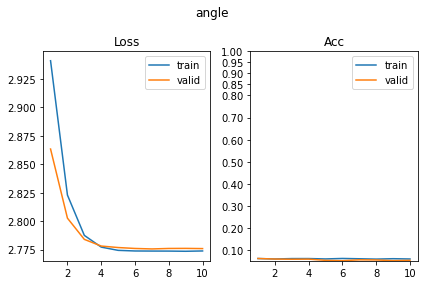

[ 89/630] py         SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.53it/s, loss=1.4, acc=0.27]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 98.02it/s, loss=1.41, acc=0.254]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.92it/s, loss=1.39, acc=0.262]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.79it/s, loss=1.39, acc=0.244]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.97it/s, loss=1.39, acc=0.239]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.56it/s, loss=1.39, acc=0.241]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.90it/s, loss=1.39, acc=0.262]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.63it/s, loss=1.38, acc=0.3]       

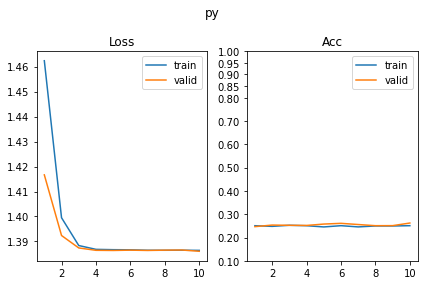

[ 90/630] px         SUP_[FCN8i223o32_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.55it/s, loss=1.43, acc=0.261]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.27it/s, loss=1.44, acc=0.256]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.33it/s, loss=1.4, acc=0.212]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.12it/s, loss=1.4, acc=0.237]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.73it/s, loss=1.39, acc=0.217]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.98it/s, loss=1.39, acc=0.227]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 95.96it/s, loss=1.39, acc=0.223]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.40it/s, loss=1.39, acc=0.207]     

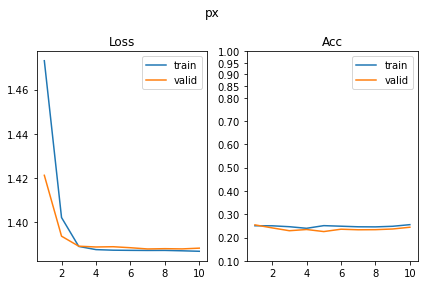

SUP_[FCN8i223o32_d32]_target_[angle]
[ 91/630] shape      SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 113.29it/s, loss=2.01, acc=0.155]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.16it/s, loss=2, acc=0.141]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.38it/s, loss=1.94, acc=0.182]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.13it/s, loss=1.94, acc=0.193]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.32it/s, loss=1.9, acc=0.205]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.46it/s, loss=1.88, acc=0.227]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.69it/s, loss=1.84, acc=0.254]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.02it/s, loss=1.85, acc=0.234]     

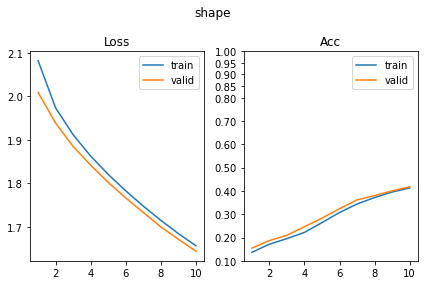

[ 92/630] scale      SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.31it/s, loss=1.14, acc=0.327]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.87it/s, loss=1.15, acc=0.339]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.63it/s, loss=1.12, acc=0.327]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.97it/s, loss=1.12, acc=0.295]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 108.66it/s, loss=1.11, acc=0.34]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.85it/s, loss=1.11, acc=0.312]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.97it/s, loss=1.1, acc=0.349]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.37it/s, loss=1.1, acc=0.332]      

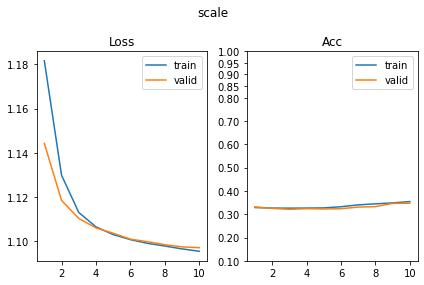

[ 93/630] color      SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.11it/s, loss=2.18, acc=0.119]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.74it/s, loss=2.15, acc=0.124]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.62it/s, loss=2.13, acc=0.147]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.32it/s, loss=2.12, acc=0.12]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.94it/s, loss=2.09, acc=0.121]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 134.43it/s, loss=2.11, acc=0.154]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.85it/s, loss=2.1, acc=0.137]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.52it/s, loss=2.11, acc=0.11]      

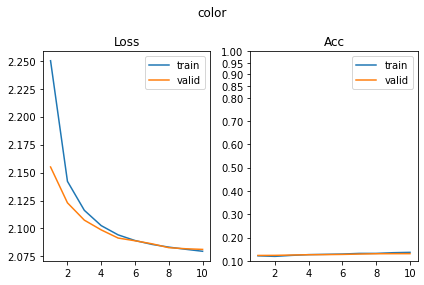

[ 94/630] angle      SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 107.23it/s, loss=2.48, acc=0.23]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.05it/s, loss=2.48, acc=0.205]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.62it/s, loss=1.96, acc=0.495]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.30it/s, loss=2.08, acc=0.383]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.93it/s, loss=1.69, acc=0.593]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.23it/s, loss=1.76, acc=0.522]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.59it/s, loss=1.41, acc=0.695]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.96it/s, loss=1.49, acc=0.578]     

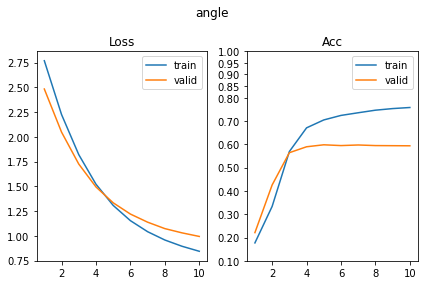

[ 95/630] py         SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.78it/s, loss=1.44, acc=0.262]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 105.64it/s, loss=1.47, acc=0.21]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.45it/s, loss=1.44, acc=0.228]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.47it/s, loss=1.41, acc=0.239]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.74it/s, loss=1.41, acc=0.262]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.06it/s, loss=1.42, acc=0.227]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.84it/s, loss=1.4, acc=0.261]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.18it/s, loss=1.41, acc=0.241]     

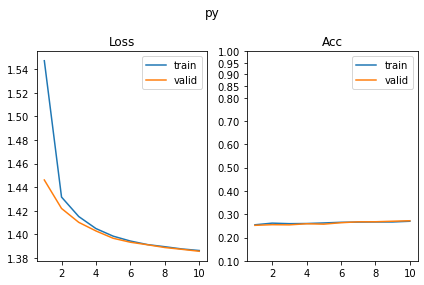

[ 96/630] px         SUP_[FCN8i223o32_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.89it/s, loss=1.46, acc=0.246]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.55it/s, loss=1.41, acc=0.259]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.50it/s, loss=1.42, acc=0.22]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 95.61it/s, loss=1.41, acc=0.263]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.92it/s, loss=1.4, acc=0.265]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.98it/s, loss=1.4, acc=0.256]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.56it/s, loss=1.4, acc=0.272]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.39it/s, loss=1.39, acc=0.266]     

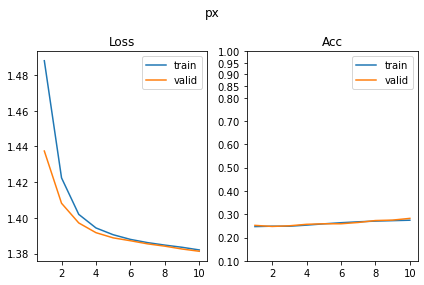

SUP_[FCN8i223o32_d32]_target_[py]
[ 97/630] shape      SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.42it/s, loss=1.96, acc=0.148]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.71it/s, loss=1.94, acc=0.168]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.23it/s, loss=1.94, acc=0.189]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 113.67it/s, loss=1.95, acc=0.163]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.65it/s, loss=1.93, acc=0.176]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.64it/s, loss=1.93, acc=0.163]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.52it/s, loss=1.93, acc=0.192]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.38it/s, loss=1.92, acc=0.173]     

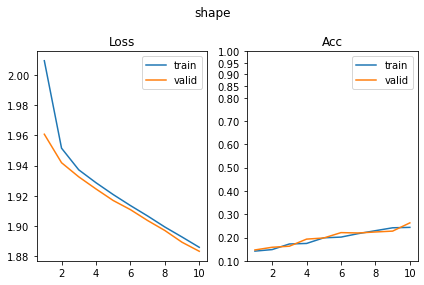

[ 98/630] scale      SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.65it/s, loss=1.1, acc=0.339]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.26it/s, loss=1.1, acc=0.329]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.65it/s, loss=1.1, acc=0.347]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.35it/s, loss=1.09, acc=0.417]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.07it/s, loss=1.1, acc=0.316]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 99.95it/s, loss=1.1, acc=0.337]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.42it/s, loss=1.1, acc=0.337]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 102.55it/s, loss=1.09, acc=0.349]     

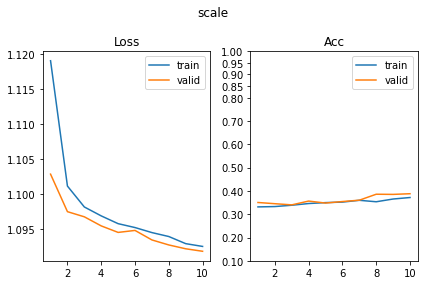

[ 99/630] color      SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.05it/s, loss=2.09, acc=0.125]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 140.21it/s, loss=2.09, acc=0.11]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.08it/s, loss=2.08, acc=0.138]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.79it/s, loss=2.09, acc=0.1]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.95it/s, loss=2.08, acc=0.121]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.19it/s, loss=2.08, acc=0.107]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 96.67it/s, loss=2.09, acc=0.112]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.48it/s, loss=2.08, acc=0.117]     

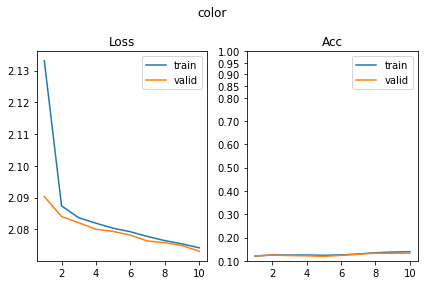

[100/630] angle      SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.29it/s, loss=2.85, acc=0.0342]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.99it/s, loss=2.82, acc=0.0634]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.27it/s, loss=2.81, acc=0.0423]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 113.61it/s, loss=2.78, acc=0.078]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.09it/s, loss=2.77, acc=0.0733]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.58it/s, loss=2.77, acc=0.0829]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.02it/s, loss=2.78, acc=0.0651]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.39it/s, loss=2.79, acc=0.0512]    

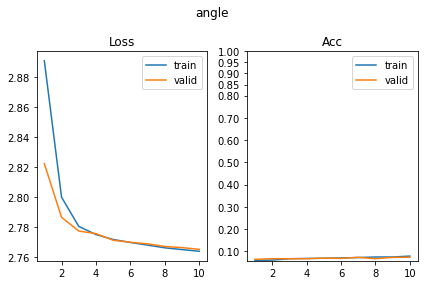

[101/630] py         SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 66.66it/s, loss=0.909, acc=0.748]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 91.39it/s, loss=0.902, acc=0.717]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.75it/s, loss=0.58, acc=0.989]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.16it/s, loss=0.614, acc=0.949]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.12it/s, loss=0.418, acc=0.989]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.30it/s, loss=0.469, acc=0.951]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.86it/s, loss=0.325, acc=0.989]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.03it/s, loss=0.37, acc=0.941]     

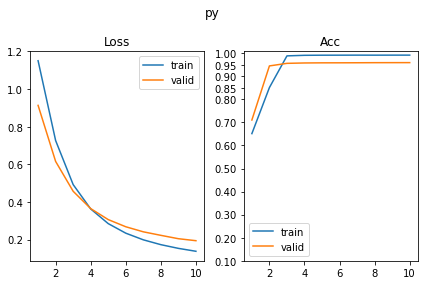

[102/630] px         SUP_[FCN8i223o32_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.29it/s, loss=1.39, acc=0.235]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.82it/s, loss=1.4, acc=0.232]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.52it/s, loss=1.38, acc=0.262]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.09it/s, loss=1.39, acc=0.271]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.81it/s, loss=1.39, acc=0.275]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.26it/s, loss=1.39, acc=0.249]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.21it/s, loss=1.39, acc=0.233]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.69it/s, loss=1.39, acc=0.285]     

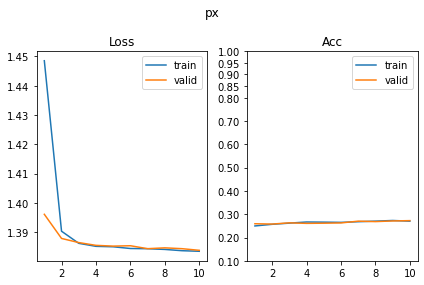

SUP_[FCN8i223o32_d32]_target_[px]
[103/630] shape      SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.11it/s, loss=1.98, acc=0.127]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 86.58it/s, loss=1.97, acc=0.124]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 69.16it/s, loss=1.94, acc=0.14]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.64it/s, loss=1.94, acc=0.159]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.38it/s, loss=1.94, acc=0.147]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.29it/s, loss=1.94, acc=0.144]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.84it/s, loss=1.93, acc=0.182]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.11it/s, loss=1.93, acc=0.156]     

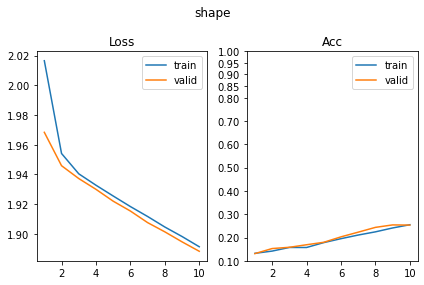

[104/630] scale      SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.83it/s, loss=1.11, acc=0.337]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.97it/s, loss=1.12, acc=0.31]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 114.73it/s, loss=1.1, acc=0.336]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.10it/s, loss=1.11, acc=0.312]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 118.11it/s, loss=1.1, acc=0.36]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.74it/s, loss=1.1, acc=0.376]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.67it/s, loss=1.1, acc=0.391]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.44it/s, loss=1.1, acc=0.366]      

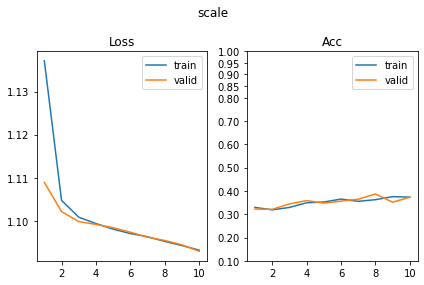

[105/630] color      SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.76it/s, loss=2.11, acc=0.121]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.74it/s, loss=2.11, acc=0.117]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.30it/s, loss=2.08, acc=0.119]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 79.05it/s, loss=2.08, acc=0.134]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.50it/s, loss=2.08, acc=0.124]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.27it/s, loss=2.08, acc=0.122]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.98it/s, loss=2.08, acc=0.122]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.97it/s, loss=2.08, acc=0.102]     

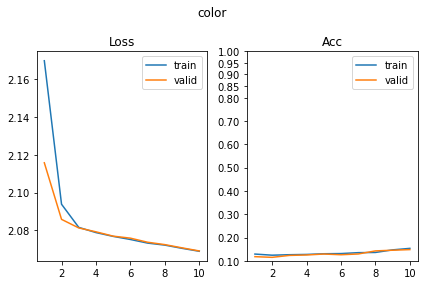

[106/630] angle      SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 103.09it/s, loss=2.8, acc=0.0407]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.48it/s, loss=2.81, acc=0.0683]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.50it/s, loss=2.78, acc=0.0521]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.48it/s, loss=2.78, acc=0.061]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.51it/s, loss=2.77, acc=0.0668]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 135.00it/s, loss=2.77, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.25it/s, loss=2.77, acc=0.0619]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.68it/s, loss=2.77, acc=0.0585]    

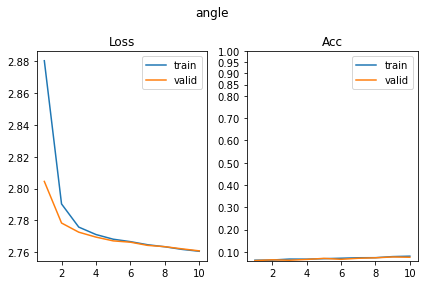

[107/630] py         SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.59it/s, loss=1.41, acc=0.251]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.13it/s, loss=1.41, acc=0.217]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 121.39it/s, loss=1.39, acc=0.246]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.08it/s, loss=1.4, acc=0.22]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 118.26it/s, loss=1.39, acc=0.236]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.86it/s, loss=1.39, acc=0.241]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.58it/s, loss=1.39, acc=0.249]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.50it/s, loss=1.39, acc=0.22]      

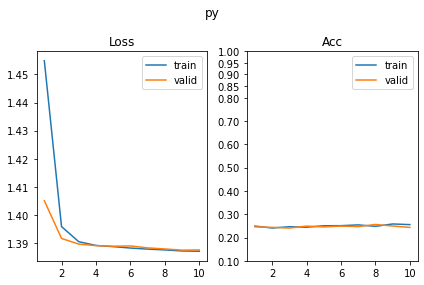

[108/630] px         SUP_[FCN8i223o32_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.98it/s, loss=0.854, acc=0.933]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.28it/s, loss=0.859, acc=0.929]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.30it/s, loss=0.545, acc=0.99]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.52it/s, loss=0.564, acc=0.939]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.33it/s, loss=0.391, acc=0.99]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.14it/s, loss=0.407, acc=0.954]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.35it/s, loss=0.308, acc=0.992]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.47it/s, loss=0.35, acc=0.939]     

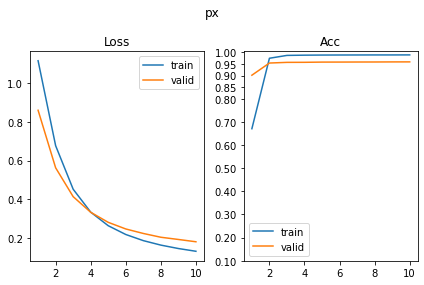

SUP_[FCN8i223o32_d64]_target_[shape]
[109/630] shape      SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 102.97it/s, loss=0.939, acc=0.945]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.29it/s, loss=0.928, acc=0.927]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.82it/s, loss=0.451, acc=0.998]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 134.43it/s, loss=0.438, acc=0.983]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.28it/s, loss=0.273, acc=0.995]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.80it/s, loss=0.316, acc=0.978]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.00it/s, loss=0.191, acc=0.992]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.45it/s, loss=0.227, acc=0.978]    

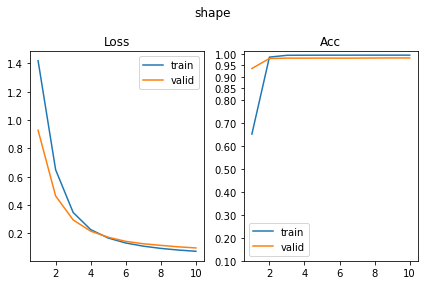

[110/630] scale      SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.25it/s, loss=1.1, acc=0.344]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.78it/s, loss=1.1, acc=0.371]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.28it/s, loss=1.09, acc=0.384]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.37it/s, loss=1.09, acc=0.359]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 108.62it/s, loss=1.08, acc=0.399]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 137.32it/s, loss=1.08, acc=0.39]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.08it/s, loss=1.09, acc=0.394]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.33it/s, loss=1.09, acc=0.415]     

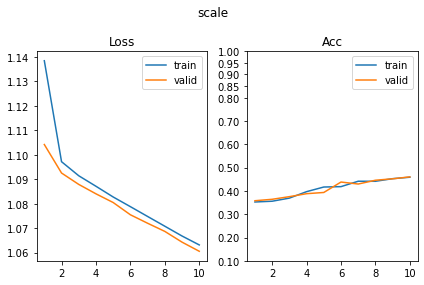

[111/630] color      SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 67.58it/s, loss=2.08, acc=0.143]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 88.77it/s, loss=2.08, acc=0.122]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 66.51it/s, loss=2.07, acc=0.15]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.52it/s, loss=2.08, acc=0.137]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.73it/s, loss=2.07, acc=0.138]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.18it/s, loss=2.09, acc=0.137]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.52it/s, loss=2.08, acc=0.125]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 94.55it/s, loss=2.09, acc=0.12]       

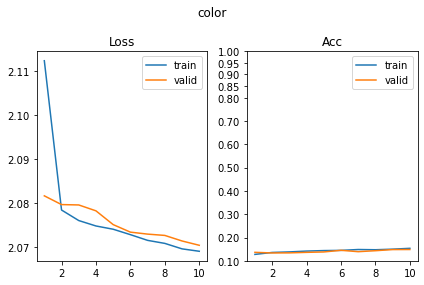

[112/630] angle      SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 63.41it/s, loss=2.78, acc=0.0717]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.16it/s, loss=2.78, acc=0.0707]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.21it/s, loss=2.78, acc=0.0749]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.77it/s, loss=2.78, acc=0.0683]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.16it/s, loss=2.77, acc=0.0831]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 95.76it/s, loss=2.76, acc=0.107]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 97.68it/s, loss=2.77, acc=0.0619]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.50it/s, loss=2.75, acc=0.12]      

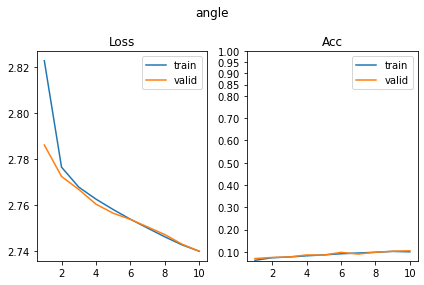

[113/630] py         SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 58.86it/s, loss=1.39, acc=0.241]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.90it/s, loss=1.39, acc=0.263]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 115.68it/s, loss=1.39, acc=0.259]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.87it/s, loss=1.38, acc=0.259]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 108.90it/s, loss=1.38, acc=0.28]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.22it/s, loss=1.39, acc=0.256]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.78it/s, loss=1.38, acc=0.265]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.76it/s, loss=1.39, acc=0.271]     

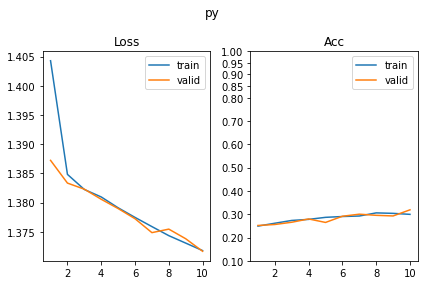

[114/630] px         SUP_[FCN8i223o32_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.21it/s, loss=1.4, acc=0.288]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.21it/s, loss=1.39, acc=0.298]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.07it/s, loss=1.39, acc=0.254]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.17it/s, loss=1.39, acc=0.263]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.16it/s, loss=1.38, acc=0.285]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 92.68it/s, loss=1.39, acc=0.224]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.52it/s, loss=1.38, acc=0.293]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.90it/s, loss=1.38, acc=0.271]     

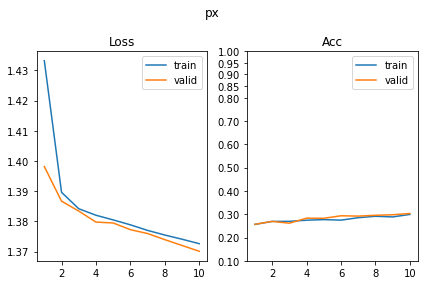

SUP_[FCN8i223o32_d64]_target_[scale]
[115/630] shape      SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 136.02it/s, loss=1.95, acc=0.143]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 185.23it/s, loss=1.93, acc=0.156]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.14it/s, loss=1.93, acc=0.176]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 99.73it/s, loss=1.92, acc=0.176]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 67.20it/s, loss=1.9, acc=0.223]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 90.92it/s, loss=1.91, acc=0.217]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 59.23it/s, loss=1.89, acc=0.179]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.58it/s, loss=1.88, acc=0.19]      

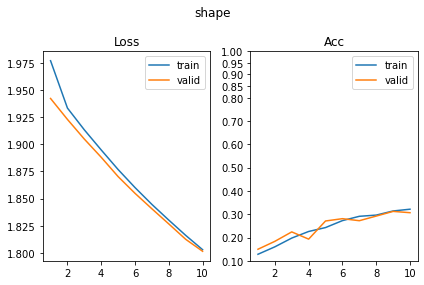

[116/630] scale      SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.93it/s, loss=0.639, acc=0.894]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 97.22it/s, loss=0.705, acc=0.785]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 103.58it/s, loss=0.451, acc=0.958]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.00it/s, loss=0.586, acc=0.798]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.74it/s, loss=0.38, acc=0.963]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.94it/s, loss=0.515, acc=0.822]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.82it/s, loss=0.316, acc=0.963]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 81.34it/s, loss=0.426, acc=0.868]     

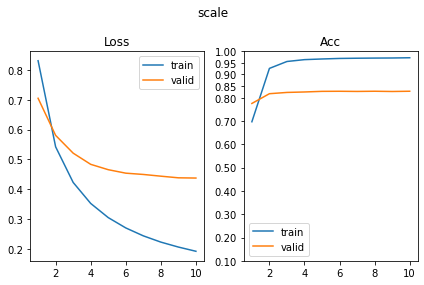

[117/630] color      SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.57it/s, loss=2.08, acc=0.119]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 94.37it/s, loss=2.09, acc=0.0927]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.54it/s, loss=2.06, acc=0.142]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 104.07it/s, loss=2.05, acc=0.154]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.43it/s, loss=2.05, acc=0.138]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 96.56it/s, loss=2.05, acc=0.141]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.34it/s, loss=2.03, acc=0.163]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 102.23it/s, loss=2.02, acc=0.166]     

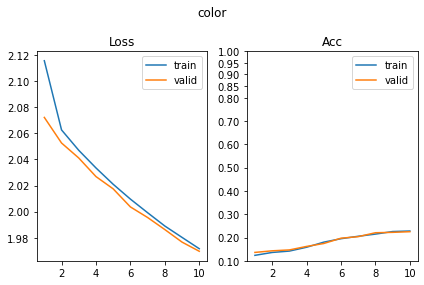

[118/630] angle      SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.64it/s, loss=2.79, acc=0.0603]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.85it/s, loss=2.79, acc=0.0659]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.29it/s, loss=2.78, acc=0.0554]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 96.68it/s, loss=2.77, acc=0.0659]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 71.87it/s, loss=2.77, acc=0.0749]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.10it/s, loss=2.77, acc=0.0732]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.04it/s, loss=2.77, acc=0.0782]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.64it/s, loss=2.77, acc=0.0707]    

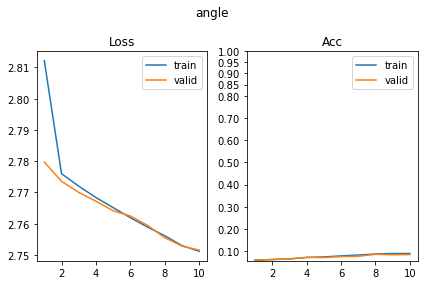

[119/630] py         SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.05it/s, loss=1.37, acc=0.327]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.55it/s, loss=1.38, acc=0.298]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.18it/s, loss=1.36, acc=0.329]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 58.00it/s, loss=1.36, acc=0.368]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.83it/s, loss=1.34, acc=0.378]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.07it/s, loss=1.36, acc=0.346]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.19it/s, loss=1.36, acc=0.349]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.34it/s, loss=1.34, acc=0.371]     

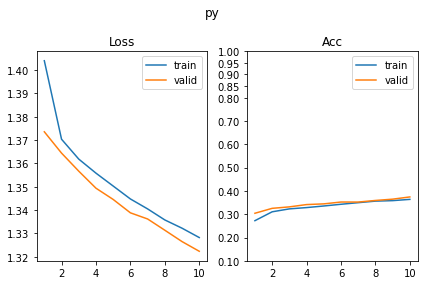

[120/630] px         SUP_[FCN8i223o32_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 97.00it/s, loss=1.38, acc=0.256]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 137.16it/s, loss=1.37, acc=0.288]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.43it/s, loss=1.37, acc=0.339]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.93it/s, loss=1.37, acc=0.31]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.65it/s, loss=1.37, acc=0.35]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.77it/s, loss=1.38, acc=0.29]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.00it/s, loss=1.36, acc=0.35]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.19it/s, loss=1.36, acc=0.346]     

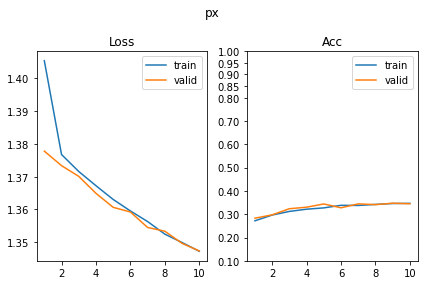

SUP_[FCN8i223o32_d64]_target_[color]
[121/630] shape      SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 109.71it/s, loss=1.96, acc=0.13]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 136.69it/s, loss=1.95, acc=0.149]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.74it/s, loss=1.95, acc=0.119]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 97.96it/s, loss=1.95, acc=0.12]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.24it/s, loss=1.94, acc=0.176]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.21it/s, loss=1.94, acc=0.137]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.88it/s, loss=1.94, acc=0.155]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.95it/s, loss=1.94, acc=0.137]     

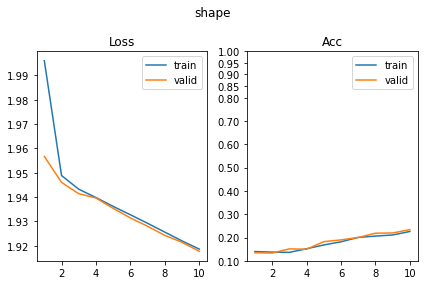

[122/630] scale      SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.09it/s, loss=1.1, acc=0.366]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.96it/s, loss=1.1, acc=0.361]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.95it/s, loss=1.1, acc=0.309]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.79it/s, loss=1.1, acc=0.317]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 100.00it/s, loss=1.1, acc=0.327]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.30it/s, loss=1.1, acc=0.317]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.71it/s, loss=1.1, acc=0.306]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.97it/s, loss=1.1, acc=0.334]      

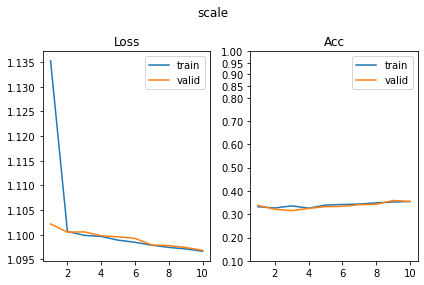

[123/630] color      SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 67.60it/s, loss=1.11, acc=0.748]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 66.99it/s, loss=1.08, acc=0.82]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.34it/s, loss=0.397, acc=1]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.77it/s, loss=0.421, acc=0.995]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 65.88it/s, loss=0.194, acc=1]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.21it/s, loss=0.201, acc=1]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.28it/s, loss=0.119, acc=1]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.94it/s, loss=0.12, acc=1]          

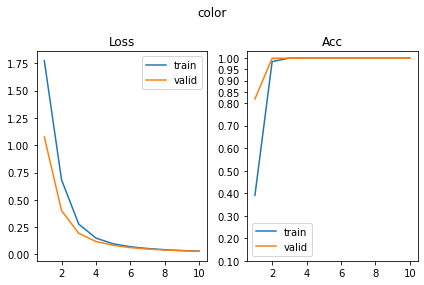

[124/630] angle      SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 103.25it/s, loss=2.81, acc=0.0407]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.89it/s, loss=2.81, acc=0.0415]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.66it/s, loss=2.78, acc=0.0619]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.64it/s, loss=2.78, acc=0.0561]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.09it/s, loss=2.77, acc=0.0521]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.45it/s, loss=2.78, acc=0.0585]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.27it/s, loss=2.78, acc=0.0684]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.87it/s, loss=2.78, acc=0.0439]    

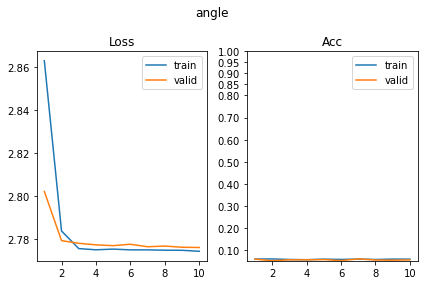

[125/630] py         SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.06it/s, loss=1.39, acc=0.257]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.36it/s, loss=1.39, acc=0.278]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 113.79it/s, loss=1.39, acc=0.207]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.78it/s, loss=1.39, acc=0.246]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 101.30it/s, loss=1.39, acc=0.246]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.31it/s, loss=1.39, acc=0.239]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.87it/s, loss=1.39, acc=0.252]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.94it/s, loss=1.39, acc=0.263]     

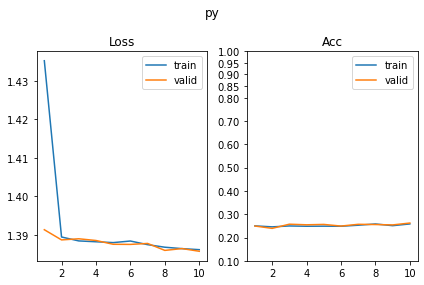

[126/630] px         SUP_[FCN8i223o32_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.52it/s, loss=1.41, acc=0.217]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 134.16it/s, loss=1.4, acc=0.271]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.38it/s, loss=1.39, acc=0.265]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.68it/s, loss=1.39, acc=0.266]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.63it/s, loss=1.39, acc=0.233]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.22it/s, loss=1.39, acc=0.217]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 96.33it/s, loss=1.39, acc=0.249]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.05it/s, loss=1.39, acc=0.229]     

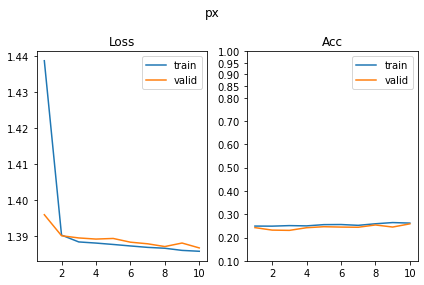

SUP_[FCN8i223o32_d64]_target_[angle]
[127/630] shape      SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.57it/s, loss=1.93, acc=0.204]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.56it/s, loss=1.94, acc=0.205]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.12it/s, loss=1.81, acc=0.287]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.96it/s, loss=1.82, acc=0.285]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.71it/s, loss=1.73, acc=0.352]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.98it/s, loss=1.72, acc=0.366]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.72it/s, loss=1.66, acc=0.417]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 90.37it/s, loss=1.65, acc=0.4]        

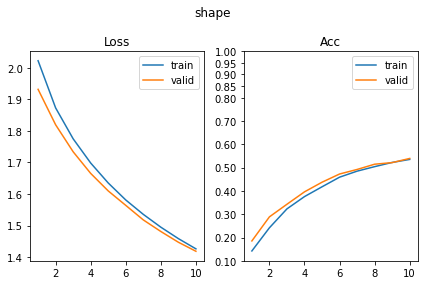

[128/630] scale      SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.54it/s, loss=1.13, acc=0.293]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.35it/s, loss=1.13, acc=0.334]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.54it/s, loss=1.1, acc=0.342]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.53it/s, loss=1.1, acc=0.368]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 107.45it/s, loss=1.11, acc=0.29]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.77it/s, loss=1.11, acc=0.315]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.87it/s, loss=1.1, acc=0.366]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 136.57it/s, loss=1.1, acc=0.339]      

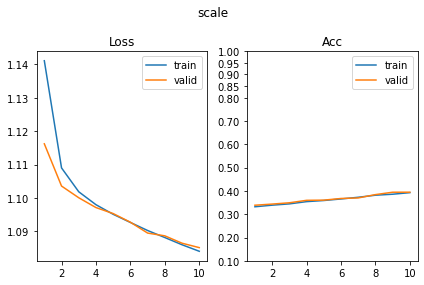

[129/630] color      SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 71.06it/s, loss=2.08, acc=0.153]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.85it/s, loss=2.1, acc=0.12]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 69.59it/s, loss=2.08, acc=0.147]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 125.28it/s, loss=2.07, acc=0.139]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 69.48it/s, loss=2.09, acc=0.124]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 94.71it/s, loss=2.09, acc=0.122]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.98it/s, loss=2.07, acc=0.148]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.37it/s, loss=2.07, acc=0.146]     

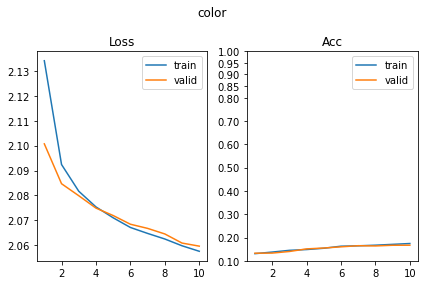

[130/630] angle      SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 100.84it/s, loss=2.08, acc=0.467]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.59it/s, loss=2.13, acc=0.42]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 68.58it/s, loss=1.56, acc=0.671]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.40it/s, loss=1.63, acc=0.58]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 72.69it/s, loss=1.24, acc=0.689]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.15it/s, loss=1.33, acc=0.58]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.08it/s, loss=1.05, acc=0.744]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.44it/s, loss=1.17, acc=0.612]     

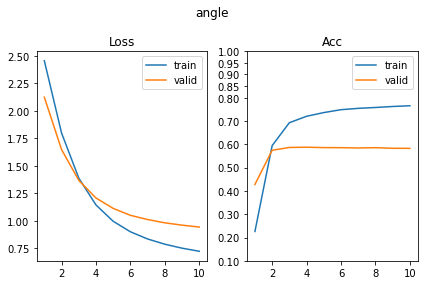

[131/630] py         SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.82it/s, loss=1.41, acc=0.262]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 67.17it/s, loss=1.41, acc=0.251]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.62it/s, loss=1.39, acc=0.256]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.91it/s, loss=1.39, acc=0.237]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 108.37it/s, loss=1.37, acc=0.29]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.19it/s, loss=1.39, acc=0.261]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.81it/s, loss=1.38, acc=0.314]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.36it/s, loss=1.37, acc=0.278]     

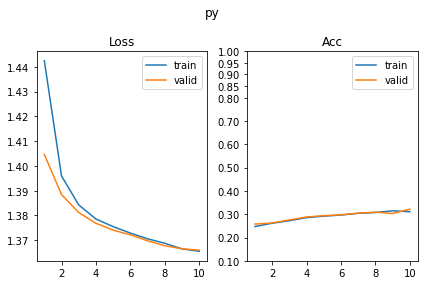

[132/630] px         SUP_[FCN8i223o32_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.24it/s, loss=1.41, acc=0.246]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.00it/s, loss=1.4, acc=0.224]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.33it/s, loss=1.4, acc=0.244]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.38it/s, loss=1.39, acc=0.239]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.59it/s, loss=1.38, acc=0.285]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.38it/s, loss=1.39, acc=0.261]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 95.37it/s, loss=1.38, acc=0.293]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.28it/s, loss=1.38, acc=0.334]     

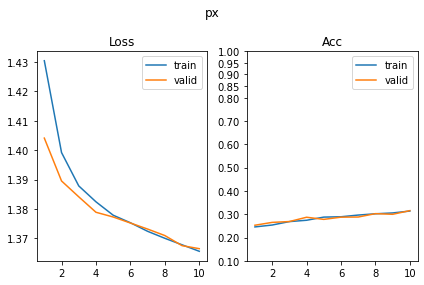

SUP_[FCN8i223o32_d64]_target_[py]
[133/630] shape      SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 107.81it/s, loss=1.94, acc=0.166]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.08it/s, loss=1.94, acc=0.144]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.42it/s, loss=1.92, acc=0.168]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.05it/s, loss=1.92, acc=0.2]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.57it/s, loss=1.92, acc=0.173]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.26it/s, loss=1.92, acc=0.205]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.91it/s, loss=1.9, acc=0.213]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.51it/s, loss=1.91, acc=0.19]       

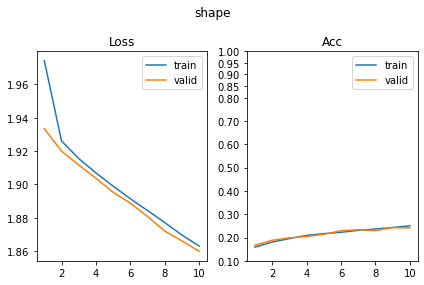

[134/630] scale      SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.94it/s, loss=1.1, acc=0.336]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.96it/s, loss=1.1, acc=0.38]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 106.63it/s, loss=1.1, acc=0.35]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.99it/s, loss=1.1, acc=0.349]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 105.45it/s, loss=1.1, acc=0.352]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.90it/s, loss=1.1, acc=0.363]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.17it/s, loss=1.1, acc=0.371]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.24it/s, loss=1.1, acc=0.359]      

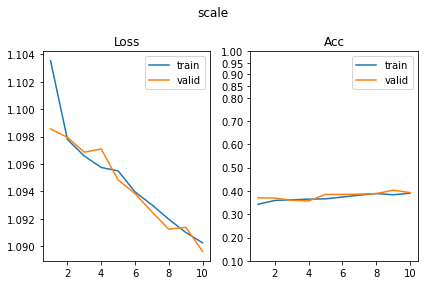

[135/630] color      SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.44it/s, loss=2.08, acc=0.125]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.52it/s, loss=2.08, acc=0.0951]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.79it/s, loss=2.07, acc=0.122]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 132.74it/s, loss=2.07, acc=0.12]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.30it/s, loss=2.08, acc=0.129]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.26it/s, loss=2.08, acc=0.12]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.07it/s, loss=2.07, acc=0.111]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.06it/s, loss=2.07, acc=0.139]     

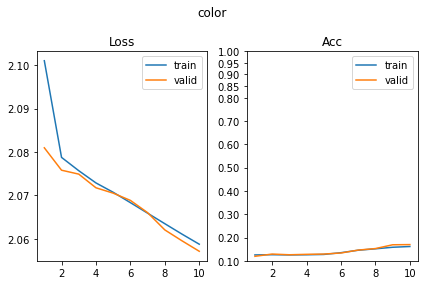

[136/630] angle      SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 109.98it/s, loss=2.78, acc=0.0603]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.20it/s, loss=2.78, acc=0.0634]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.58it/s, loss=2.78, acc=0.057]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.67it/s, loss=2.78, acc=0.0463]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.29it/s, loss=2.77, acc=0.0619]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.78it/s, loss=2.77, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.11it/s, loss=2.76, acc=0.0847]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.25it/s, loss=2.77, acc=0.0756]    

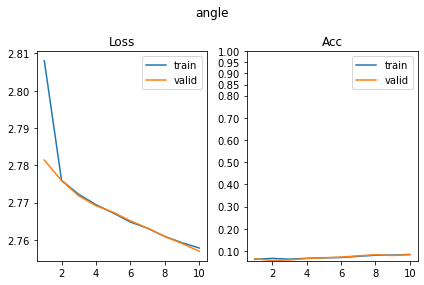

[137/630] py         SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.49it/s, loss=0.766, acc=0.844]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.48it/s, loss=0.781, acc=0.837]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.90it/s, loss=0.417, acc=0.982]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.05it/s, loss=0.421, acc=0.966]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.60it/s, loss=0.296, acc=0.967]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.24it/s, loss=0.284, acc=0.963]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.65it/s, loss=0.222, acc=0.984]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.13it/s, loss=0.232, acc=0.961]    

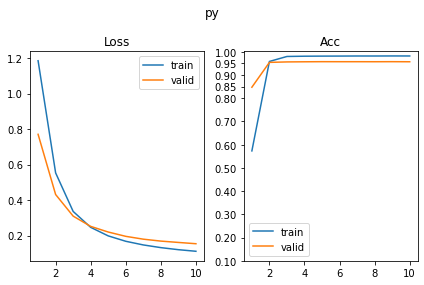

[138/630] px         SUP_[FCN8i223o32_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 62.93it/s, loss=1.38, acc=0.274]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 95.85it/s, loss=1.38, acc=0.278]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.19it/s, loss=1.39, acc=0.244]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.98it/s, loss=1.39, acc=0.251]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.54it/s, loss=1.38, acc=0.275]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.84it/s, loss=1.39, acc=0.249]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 66.30it/s, loss=1.39, acc=0.246]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.32it/s, loss=1.38, acc=0.288]     

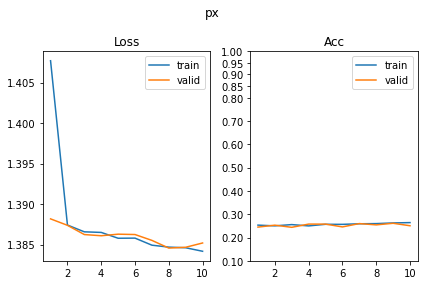

SUP_[FCN8i223o32_d64]_target_[px]
[139/630] shape      SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 102.60it/s, loss=1.93, acc=0.171]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.51it/s, loss=1.94, acc=0.171]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 68.05it/s, loss=1.89, acc=0.239]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.27it/s, loss=1.91, acc=0.202]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.59it/s, loss=1.87, acc=0.257]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.67it/s, loss=1.87, acc=0.256]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.35it/s, loss=1.86, acc=0.264]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.73it/s, loss=1.84, acc=0.31]      

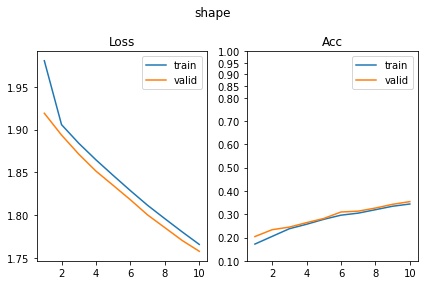

[140/630] scale      SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.87it/s, loss=1.11, acc=0.352]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 103.82it/s, loss=1.1, acc=0.393]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.39it/s, loss=1.09, acc=0.357]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.61it/s, loss=1.09, acc=0.368]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 110.61it/s, loss=1.09, acc=0.344]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.95it/s, loss=1.09, acc=0.363]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.50it/s, loss=1.1, acc=0.345]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 63.35it/s, loss=1.09, acc=0.356]      

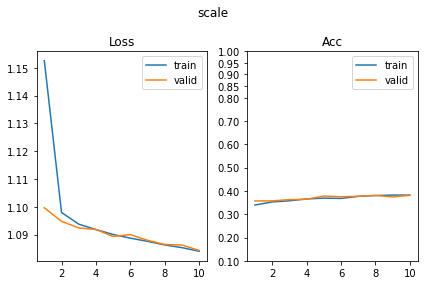

[141/630] color      SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.75it/s, loss=2.09, acc=0.117]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.73it/s, loss=2.09, acc=0.112]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.11it/s, loss=2.08, acc=0.138]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.23it/s, loss=2.07, acc=0.144]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.29it/s, loss=2.07, acc=0.125]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.23it/s, loss=2.07, acc=0.11]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.44it/s, loss=2.06, acc=0.16]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.04it/s, loss=2.07, acc=0.146]     

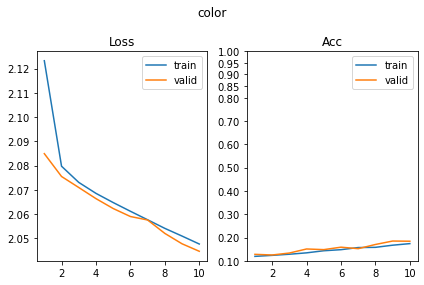

[142/630] angle      SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.92it/s, loss=2.79, acc=0.0554]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.95it/s, loss=2.79, acc=0.0927]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.61it/s, loss=2.78, acc=0.0586]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.11it/s, loss=2.77, acc=0.0439]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.50it/s, loss=2.77, acc=0.0749]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.64it/s, loss=2.77, acc=0.0805]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.91it/s, loss=2.77, acc=0.0603]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.08it/s, loss=2.77, acc=0.0585]    

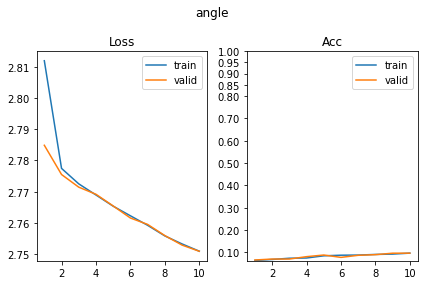

[143/630] py         SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.45it/s, loss=1.39, acc=0.238]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.57it/s, loss=1.39, acc=0.227]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.28it/s, loss=1.39, acc=0.249]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.22it/s, loss=1.39, acc=0.239]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 115.64it/s, loss=1.39, acc=0.241]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.81it/s, loss=1.38, acc=0.271]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.40it/s, loss=1.39, acc=0.252]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.45it/s, loss=1.39, acc=0.251]     

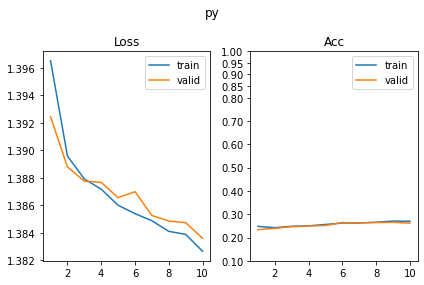

[144/630] px         SUP_[FCN8i223o32_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.38it/s, loss=0.772, acc=0.969]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 139.27it/s, loss=0.797, acc=0.915]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.83it/s, loss=0.461, acc=0.984]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.13it/s, loss=0.487, acc=0.934]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.55it/s, loss=0.338, acc=0.974]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.96it/s, loss=0.346, acc=0.956]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.71it/s, loss=0.268, acc=0.977]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.88it/s, loss=0.27, acc=0.949]     

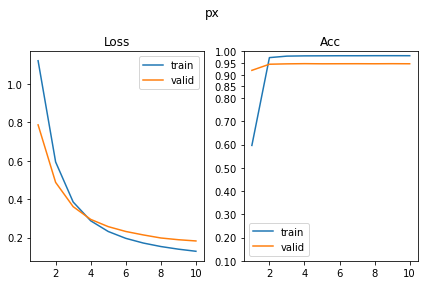

SUP_[FCN8i223o32_d128]_target_[shape]
[145/630] shape      SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.59it/s, loss=0.741, acc=0.982]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.48it/s, loss=0.729, acc=0.968]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.56it/s, loss=0.355, acc=0.993]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 86.42it/s, loss=0.391, acc=0.968]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.15it/s, loss=0.243, acc=0.99]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.08it/s, loss=0.283, acc=0.961]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.13it/s, loss=0.157, acc=0.997]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.96it/s, loss=0.225, acc=0.985]    

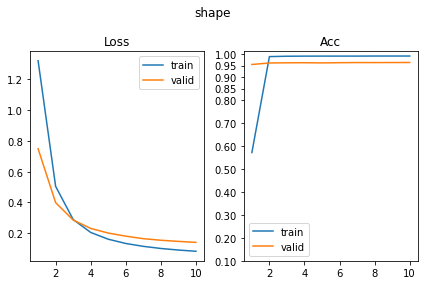

[146/630] scale      SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.35it/s, loss=1.08, acc=0.381]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.13it/s, loss=1.08, acc=0.39]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.63it/s, loss=1.05, acc=0.448]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.63it/s, loss=1.06, acc=0.415]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.95it/s, loss=1.05, acc=0.464]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.99it/s, loss=1.06, acc=0.424]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.07it/s, loss=1.05, acc=0.472]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.42it/s, loss=1.04, acc=0.495]     

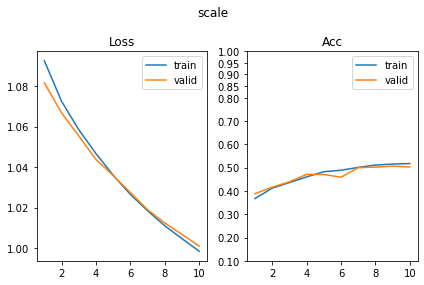

[147/630] color      SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 64.35it/s, loss=2.07, acc=0.145]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 93.10it/s, loss=2.08, acc=0.107]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 69.15it/s, loss=2.06, acc=0.182]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.23it/s, loss=2.06, acc=0.21]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 63.71it/s, loss=2.04, acc=0.2]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 82.25it/s, loss=2.06, acc=0.176]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.37it/s, loss=2.03, acc=0.204]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 97.34it/s, loss=2.03, acc=0.21]       

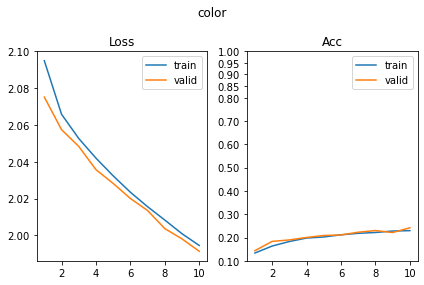

[148/630] angle      SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 105.83it/s, loss=2.77, acc=0.0782]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.38it/s, loss=2.77, acc=0.0634]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.91it/s, loss=2.75, acc=0.0717]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.11it/s, loss=2.75, acc=0.0902]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.26it/s, loss=2.73, acc=0.0928]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.37it/s, loss=2.73, acc=0.107]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.16it/s, loss=2.72, acc=0.121]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.64it/s, loss=2.72, acc=0.1]       

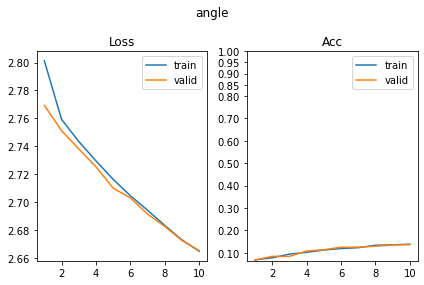

[149/630] py         SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.50it/s, loss=1.39, acc=0.23]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.20it/s, loss=1.4, acc=0.28]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 112.63it/s, loss=1.38, acc=0.275]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.28it/s, loss=1.38, acc=0.273]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 110.55it/s, loss=1.38, acc=0.283]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.09it/s, loss=1.37, acc=0.302]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.00it/s, loss=1.38, acc=0.293]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 91.73it/s, loss=1.36, acc=0.341]      

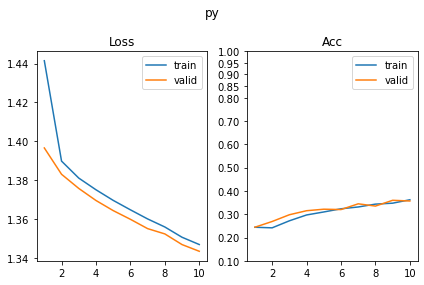

[150/630] px         SUP_[FCN8i223o32_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 59.34it/s, loss=1.39, acc=0.265]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.68it/s, loss=1.38, acc=0.251]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.62it/s, loss=1.38, acc=0.265]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.84it/s, loss=1.37, acc=0.334]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.55it/s, loss=1.37, acc=0.319]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.36it/s, loss=1.38, acc=0.305]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.98it/s, loss=1.37, acc=0.35]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.86it/s, loss=1.36, acc=0.351]     

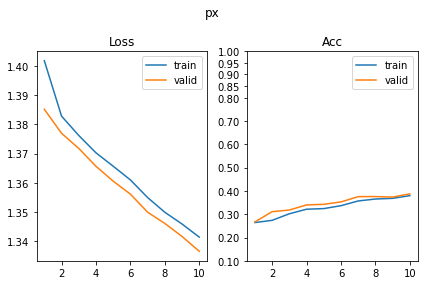

SUP_[FCN8i223o32_d128]_target_[scale]
[151/630] shape      SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.34it/s, loss=1.92, acc=0.202]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.80it/s, loss=1.92, acc=0.207]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.75it/s, loss=1.88, acc=0.241]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.10it/s, loss=1.89, acc=0.212]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.35it/s, loss=1.86, acc=0.272]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.51it/s, loss=1.88, acc=0.261]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.88it/s, loss=1.84, acc=0.283]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.12it/s, loss=1.83, acc=0.312]     

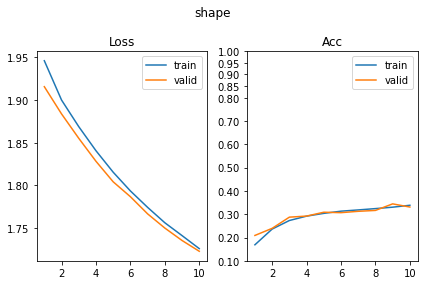

[152/630] scale      SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.93it/s, loss=0.532, acc=0.902]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.48it/s, loss=0.71, acc=0.732]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.80it/s, loss=0.412, acc=0.956]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.91it/s, loss=0.539, acc=0.827]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.43it/s, loss=0.338, acc=0.945]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.18it/s, loss=0.564, acc=0.773]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.35it/s, loss=0.272, acc=0.966]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 135.01it/s, loss=0.56, acc=0.771]     

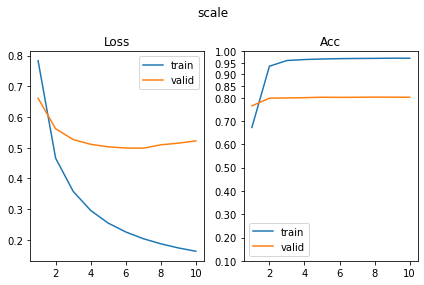

[153/630] color      SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.80it/s, loss=2.05, acc=0.151]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.66it/s, loss=2.04, acc=0.144]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.69it/s, loss=2.01, acc=0.182]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.61it/s, loss=2.01, acc=0.188]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.71it/s, loss=1.99, acc=0.205]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.65it/s, loss=1.97, acc=0.241]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.75it/s, loss=1.95, acc=0.246]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.36it/s, loss=1.96, acc=0.239]     

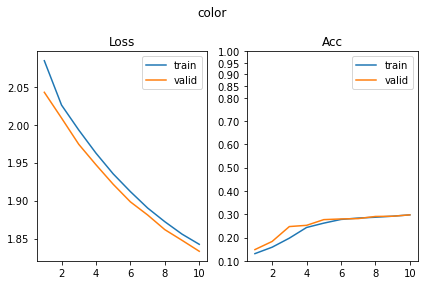

[154/630] angle      SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 110.73it/s, loss=2.78, acc=0.0603]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.94it/s, loss=2.78, acc=0.061]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.21it/s, loss=2.76, acc=0.0782]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 142.18it/s, loss=2.77, acc=0.0707]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.05it/s, loss=2.76, acc=0.0831]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.52it/s, loss=2.76, acc=0.0878]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.82it/s, loss=2.75, acc=0.0879]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.83it/s, loss=2.75, acc=0.105]     

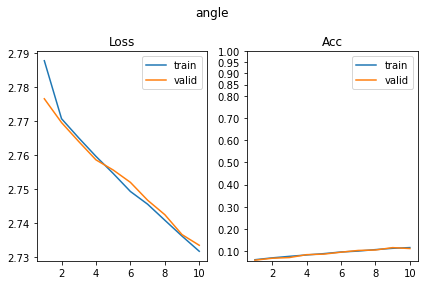

[155/630] py         SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.37it/s, loss=1.38, acc=0.314]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.01it/s, loss=1.38, acc=0.302]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 116.38it/s, loss=1.37, acc=0.319]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.85it/s, loss=1.36, acc=0.337]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 113.67it/s, loss=1.35, acc=0.342]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.96it/s, loss=1.36, acc=0.337]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.63it/s, loss=1.34, acc=0.35]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.49it/s, loss=1.33, acc=0.39]      

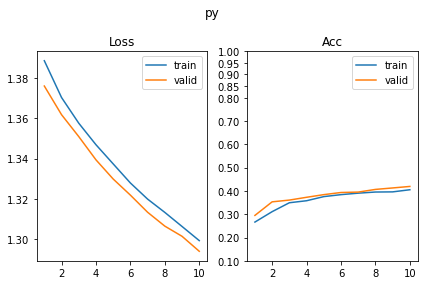

[156/630] px         SUP_[FCN8i223o32_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.41it/s, loss=1.37, acc=0.296]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.28it/s, loss=1.37, acc=0.295]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.02it/s, loss=1.36, acc=0.327]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 138.16it/s, loss=1.37, acc=0.334]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.25it/s, loss=1.35, acc=0.337]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.21it/s, loss=1.36, acc=0.349]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.81it/s, loss=1.35, acc=0.353]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.37it/s, loss=1.32, acc=0.407]     

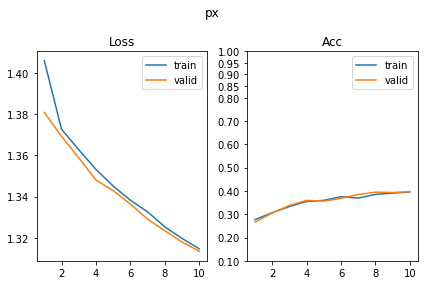

SUP_[FCN8i223o32_d128]_target_[color]
[157/630] shape      SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.06it/s, loss=1.95, acc=0.148]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.11it/s, loss=1.94, acc=0.18]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.87it/s, loss=1.94, acc=0.164]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.80it/s, loss=1.94, acc=0.18]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 72.05it/s, loss=1.93, acc=0.168]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.47it/s, loss=1.93, acc=0.183]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 68.36it/s, loss=1.92, acc=0.205]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.20it/s, loss=1.93, acc=0.141]     

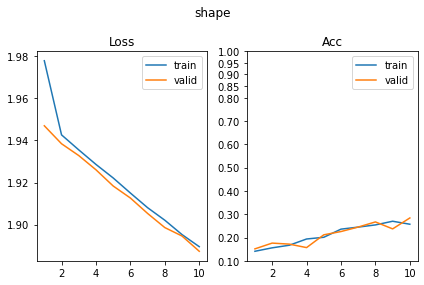

[158/630] scale      SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 62.46it/s, loss=1.11, acc=0.321]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 69.81it/s, loss=1.1, acc=0.324]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 69.11it/s, loss=1.1, acc=0.311]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.86it/s, loss=1.09, acc=0.378]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.36it/s, loss=1.1, acc=0.352]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 77.53it/s, loss=1.1, acc=0.354]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.27it/s, loss=1.1, acc=0.318]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.48it/s, loss=1.1, acc=0.334]       

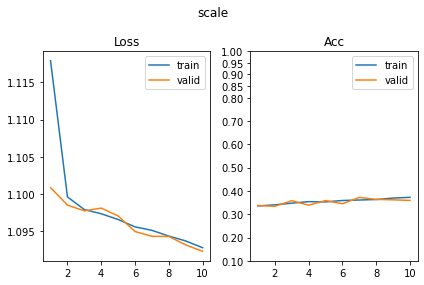

[159/630] color      SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 72.41it/s, loss=0.342, acc=1]                                              
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.71it/s, loss=0.319, acc=1]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.53it/s, loss=0.0895, acc=1]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 140.45it/s, loss=0.0879, acc=1]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.16it/s, loss=0.046, acc=1]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.92it/s, loss=0.0499, acc=1]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.02it/s, loss=0.0315, acc=1]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.65it/s, loss=0.032, acc=1]        

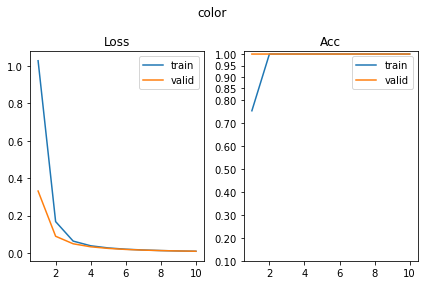

[160/630] angle      SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 104.81it/s, loss=2.78, acc=0.0456]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.93it/s, loss=2.78, acc=0.0512]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.58it/s, loss=2.78, acc=0.0603]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.95it/s, loss=2.78, acc=0.0707]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.08it/s, loss=2.78, acc=0.0505]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.85it/s, loss=2.78, acc=0.0634]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.76it/s, loss=2.77, acc=0.0603]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.29it/s, loss=2.78, acc=0.0585]    

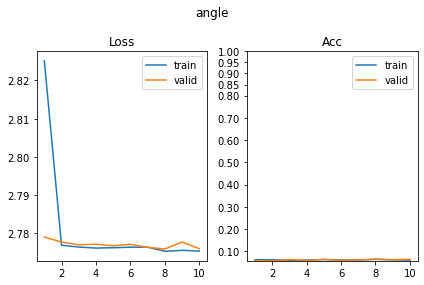

[161/630] py         SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.53it/s, loss=1.39, acc=0.241]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.92it/s, loss=1.39, acc=0.224]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.37it/s, loss=1.39, acc=0.217]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.30it/s, loss=1.39, acc=0.222]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.50it/s, loss=1.39, acc=0.225]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.39it/s, loss=1.39, acc=0.254]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.08it/s, loss=1.39, acc=0.27]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.16it/s, loss=1.39, acc=0.256]     

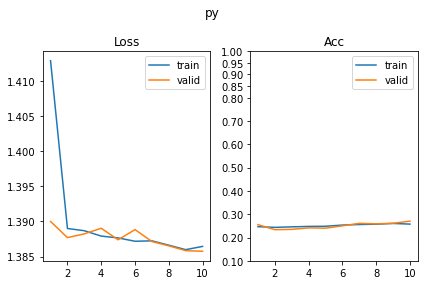

[162/630] px         SUP_[FCN8i223o32_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.42it/s, loss=1.39, acc=0.283]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.57it/s, loss=1.39, acc=0.232]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.67it/s, loss=1.39, acc=0.235]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 87.18it/s, loss=1.38, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.56it/s, loss=1.39, acc=0.264]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.21it/s, loss=1.39, acc=0.2]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.95it/s, loss=1.39, acc=0.241]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 126.52it/s, loss=1.39, acc=0.239]     

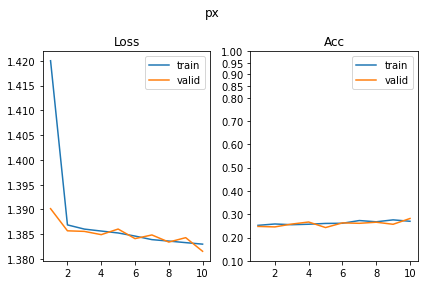

SUP_[FCN8i223o32_d128]_target_[angle]
[163/630] shape      SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 108.59it/s, loss=1.77, acc=0.324]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 59.83it/s, loss=1.75, acc=0.327]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.16it/s, loss=1.63, acc=0.401]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 125.46it/s, loss=1.62, acc=0.393]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.44it/s, loss=1.49, acc=0.503]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.55it/s, loss=1.52, acc=0.468]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.86it/s, loss=1.38, acc=0.557]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.29it/s, loss=1.41, acc=0.568]     

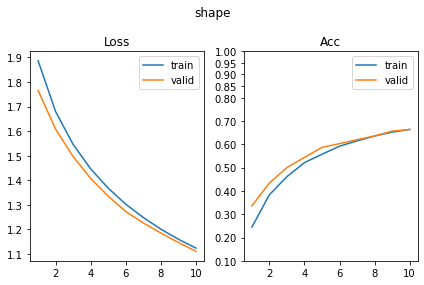

[164/630] scale      SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.24it/s, loss=1.1, acc=0.344]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 99.57it/s, loss=1.1, acc=0.356]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 123.84it/s, loss=1.1, acc=0.357]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.34it/s, loss=1.11, acc=0.322]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.95it/s, loss=1.09, acc=0.376]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.15it/s, loss=1.09, acc=0.373]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.07it/s, loss=1.09, acc=0.381]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.05it/s, loss=1.09, acc=0.351]     

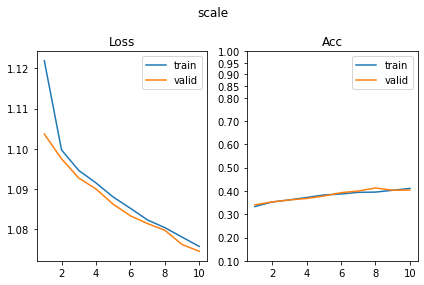

[165/630] color      SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.34it/s, loss=2.1, acc=0.125]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.93it/s, loss=2.08, acc=0.151]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.28it/s, loss=2.08, acc=0.14]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 134.66it/s, loss=2.09, acc=0.115]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.90it/s, loss=2.07, acc=0.134]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.77it/s, loss=2.08, acc=0.151]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.21it/s, loss=2.07, acc=0.163]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.19it/s, loss=2.07, acc=0.151]     

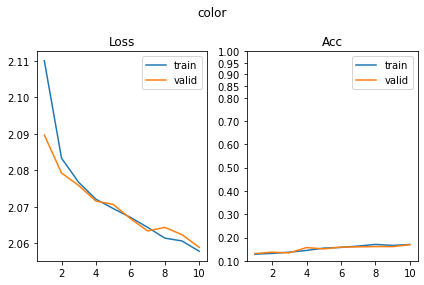

[166/630] angle      SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 108.57it/s, loss=1.82, acc=0.629]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.46it/s, loss=1.87, acc=0.561]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 68.54it/s, loss=1.24, acc=0.73]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.93it/s, loss=1.33, acc=0.6]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.66it/s, loss=0.942, acc=0.777]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.21it/s, loss=1.16, acc=0.578]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.42it/s, loss=0.842, acc=0.777]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 92.03it/s, loss=1.01, acc=0.61]       

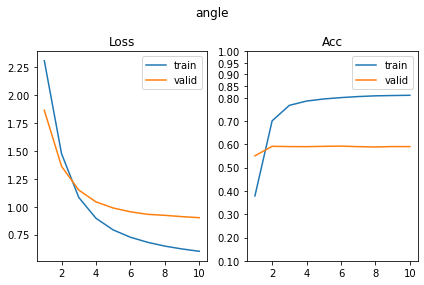

[167/630] py         SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 67.60it/s, loss=1.39, acc=0.287]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 79.98it/s, loss=1.4, acc=0.234]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.45it/s, loss=1.38, acc=0.308]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 47.08it/s, loss=1.39, acc=0.283]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.41it/s, loss=1.37, acc=0.27]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 89.27it/s, loss=1.38, acc=0.273]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.09it/s, loss=1.36, acc=0.336]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.16it/s, loss=1.36, acc=0.337]     

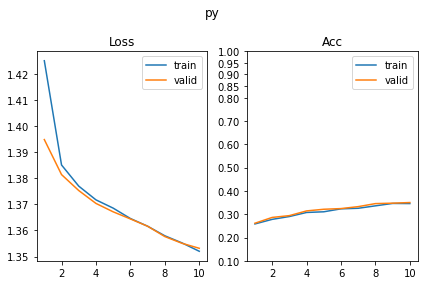

[168/630] px         SUP_[FCN8i223o32_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 72.23it/s, loss=1.39, acc=0.251]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 90.91it/s, loss=1.39, acc=0.246]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.64it/s, loss=1.39, acc=0.259]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 90.11it/s, loss=1.38, acc=0.285]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.76it/s, loss=1.37, acc=0.313]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 60.53it/s, loss=1.38, acc=0.298]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.52it/s, loss=1.37, acc=0.3]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.65it/s, loss=1.37, acc=0.268]     

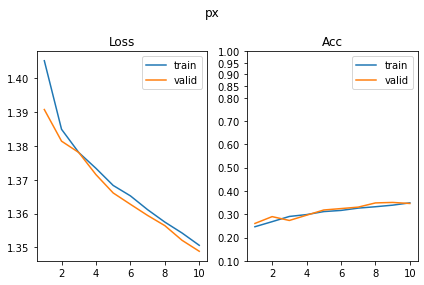

SUP_[FCN8i223o32_d128]_target_[py]
[169/630] shape      SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.26it/s, loss=1.93, acc=0.184]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.67it/s, loss=1.91, acc=0.19]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.28it/s, loss=1.89, acc=0.21]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.49it/s, loss=1.88, acc=0.246]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.71it/s, loss=1.85, acc=0.257]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 132.39it/s, loss=1.84, acc=0.254]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.94it/s, loss=1.82, acc=0.292]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.20it/s, loss=1.83, acc=0.322]      

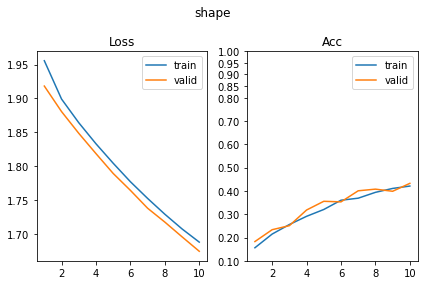

[170/630] scale      SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.40it/s, loss=1.1, acc=0.37]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.56it/s, loss=1.1, acc=0.359]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 105.42it/s, loss=1.09, acc=0.384]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.18it/s, loss=1.1, acc=0.354]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.51it/s, loss=1.1, acc=0.337]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.88it/s, loss=1.09, acc=0.378]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.79it/s, loss=1.09, acc=0.384]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.58it/s, loss=1.1, acc=0.351]      

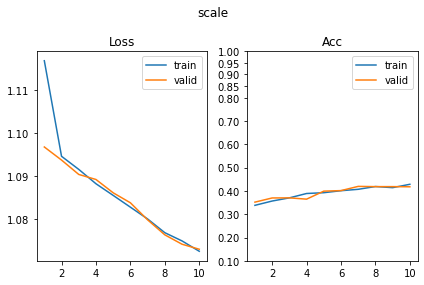

[171/630] color      SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.20it/s, loss=2.08, acc=0.112]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.15it/s, loss=2.08, acc=0.132]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.35it/s, loss=2.08, acc=0.121]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 104.47it/s, loss=2.07, acc=0.161]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.27it/s, loss=2.07, acc=0.168]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.65it/s, loss=2.08, acc=0.146]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 63.95it/s, loss=2.07, acc=0.142]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 97.65it/s, loss=2.07, acc=0.163]      

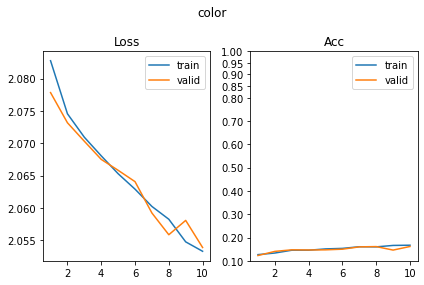

[172/630] angle      SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.69it/s, loss=2.77, acc=0.0879]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.10it/s, loss=2.77, acc=0.0878]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.54it/s, loss=2.76, acc=0.07]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.72it/s, loss=2.76, acc=0.0805]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.47it/s, loss=2.74, acc=0.103]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.02it/s, loss=2.76, acc=0.078]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.00it/s, loss=2.74, acc=0.107]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.16it/s, loss=2.75, acc=0.0805]     

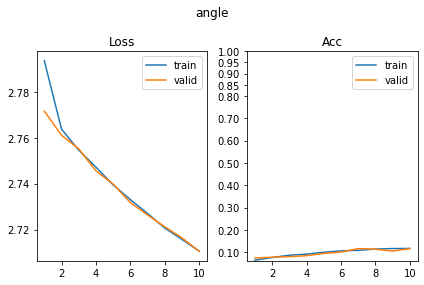

[173/630] py         SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.73it/s, loss=0.452, acc=0.987]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.32it/s, loss=0.476, acc=0.959]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.11it/s, loss=0.278, acc=0.974]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.00it/s, loss=0.287, acc=0.968]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.17it/s, loss=0.196, acc=0.977]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 130.50it/s, loss=0.257, acc=0.954]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.69it/s, loss=0.164, acc=0.984]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 137.04it/s, loss=0.188, acc=0.968]    

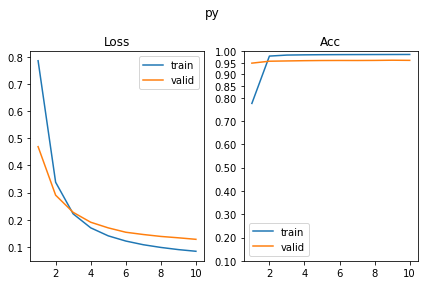

[174/630] px         SUP_[FCN8i223o32_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.34it/s, loss=1.39, acc=0.28]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.98it/s, loss=1.39, acc=0.227]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.45it/s, loss=1.39, acc=0.248]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.61it/s, loss=1.39, acc=0.241]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.60it/s, loss=1.39, acc=0.256]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.86it/s, loss=1.38, acc=0.285]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.05it/s, loss=1.38, acc=0.261]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.20it/s, loss=1.39, acc=0.261]     

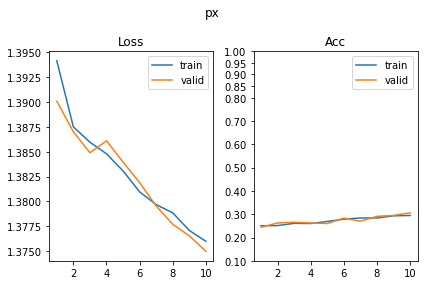

SUP_[FCN8i223o32_d128]_target_[px]
[175/630] shape      SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 129.84it/s, loss=1.92, acc=0.191]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 56.88it/s, loss=1.91, acc=0.195]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.70it/s, loss=1.89, acc=0.22]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.31it/s, loss=1.87, acc=0.246]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.49it/s, loss=1.88, acc=0.223]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 90.43it/s, loss=1.85, acc=0.288]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.03it/s, loss=1.82, acc=0.36]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 57.09it/s, loss=1.83, acc=0.307]      

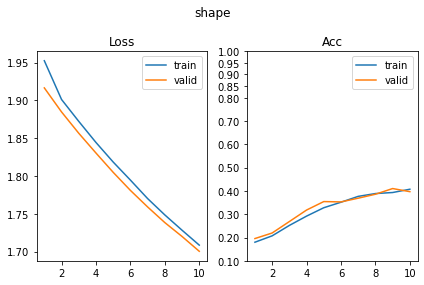

[176/630] scale      SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.05it/s, loss=1.1, acc=0.34]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.49it/s, loss=1.1, acc=0.366]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 106.12it/s, loss=1.1, acc=0.349]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.86it/s, loss=1.09, acc=0.359]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.80it/s, loss=1.09, acc=0.386]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.56it/s, loss=1.09, acc=0.39]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.38it/s, loss=1.08, acc=0.358]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.93it/s, loss=1.09, acc=0.359]     

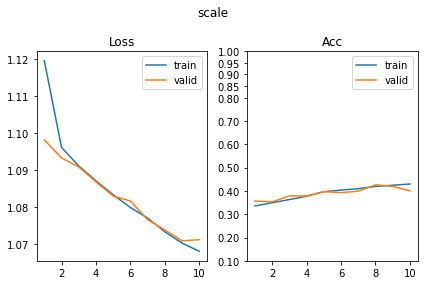

[177/630] color      SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 62.82it/s, loss=2.07, acc=0.127]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 99.80it/s, loss=2.09, acc=0.0951]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.57it/s, loss=2.07, acc=0.148]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.51it/s, loss=2.07, acc=0.137]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 65.82it/s, loss=2.07, acc=0.16]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.22it/s, loss=2.08, acc=0.137]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.08it/s, loss=2.08, acc=0.147]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 138.51it/s, loss=2.08, acc=0.122]     

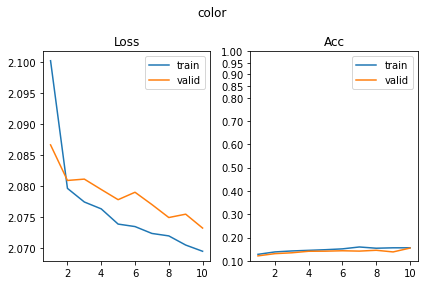

[178/630] angle      SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.33it/s, loss=2.77, acc=0.0831]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.81it/s, loss=2.77, acc=0.0659]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.37it/s, loss=2.76, acc=0.0603]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.58it/s, loss=2.76, acc=0.0732]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.86it/s, loss=2.75, acc=0.0945]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.56it/s, loss=2.75, acc=0.105]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.65it/s, loss=2.75, acc=0.104]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.65it/s, loss=2.75, acc=0.0902]    

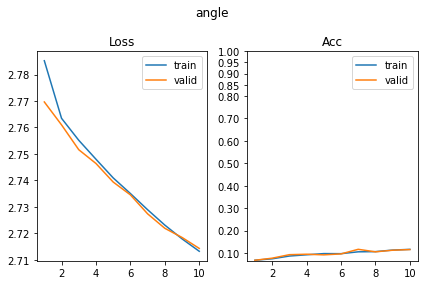

[179/630] py         SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.31it/s, loss=1.38, acc=0.287]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.58it/s, loss=1.38, acc=0.268]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 112.00it/s, loss=1.39, acc=0.239]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.83it/s, loss=1.38, acc=0.29]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.04it/s, loss=1.39, acc=0.246]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.36it/s, loss=1.39, acc=0.259]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.89it/s, loss=1.38, acc=0.282]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.59it/s, loss=1.38, acc=0.285]     

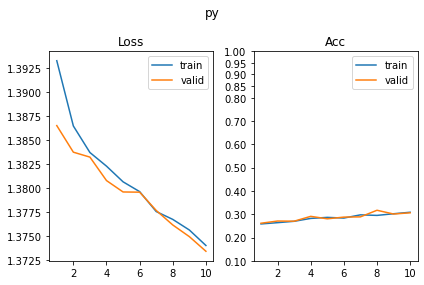

[180/630] px         SUP_[FCN8i223o32_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.30it/s, loss=0.432, acc=0.971]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.23it/s, loss=0.415, acc=0.966]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.38it/s, loss=0.229, acc=0.987]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.20it/s, loss=0.277, acc=0.951]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.10it/s, loss=0.157, acc=0.989]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.84it/s, loss=0.198, acc=0.966]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.86it/s, loss=0.134, acc=0.987]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.48it/s, loss=0.182, acc=0.961]    

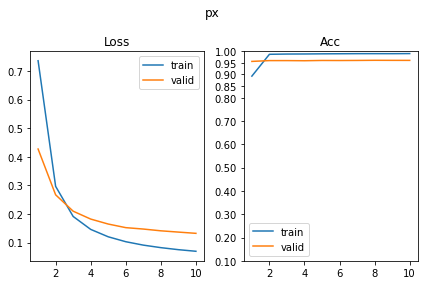

SUP_[FCN16i223o64_d8]_target_[shape]
[181/630] shape      SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 118.14it/s, loss=2.25, acc=0.00489]                                        
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 133.89it/s, loss=2.21, acc=0.00976]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.62it/s, loss=1.94, acc=0.129]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.25it/s, loss=1.86, acc=0.176]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.89it/s, loss=1.68, acc=0.217]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.59it/s, loss=1.71, acc=0.202]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.15it/s, loss=1.43, acc=0.448]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 137.38it/s, loss=1.45, acc=0.451]     

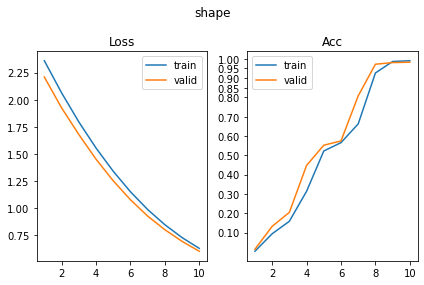

[182/630] scale      SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.22it/s, loss=1.26, acc=0.326]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.74it/s, loss=1.23, acc=0.302]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 113.23it/s, loss=1.17, acc=0.352]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.43it/s, loss=1.16, acc=0.349]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 108.55it/s, loss=1.17, acc=0.331]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.98it/s, loss=1.15, acc=0.344]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 96.61it/s, loss=1.16, acc=0.314]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 146.14it/s, loss=1.18, acc=0.305]     

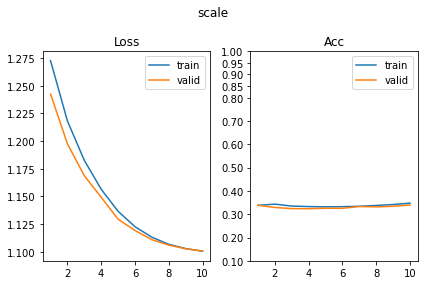

[183/630] color      SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.42it/s, loss=2.32, acc=0.142]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 99.87it/s, loss=2.4, acc=0.0976]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.67it/s, loss=2.24, acc=0.14]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 131.52it/s, loss=2.25, acc=0.134]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 67.86it/s, loss=2.18, acc=0.127]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.77it/s, loss=2.22, acc=0.129]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.24it/s, loss=2.16, acc=0.132]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.49it/s, loss=2.16, acc=0.132]     

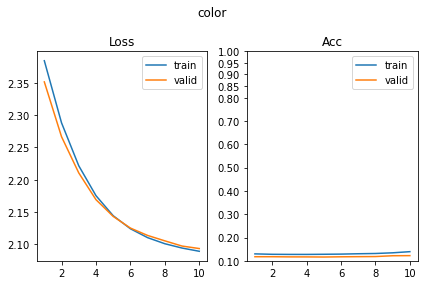

[184/630] angle      SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 99.36it/s, loss=3.05, acc=0.0668]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.57it/s, loss=3.06, acc=0.0683]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.32it/s, loss=2.97, acc=0.0489]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.58it/s, loss=3.01, acc=0.0659]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.69it/s, loss=2.91, acc=0.07]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 130.40it/s, loss=2.94, acc=0.0463]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.02it/s, loss=2.88, acc=0.0472]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.89it/s, loss=2.87, acc=0.0659]    

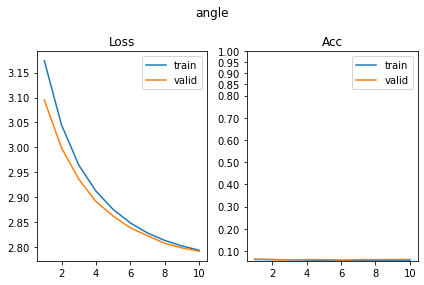

[185/630] py         SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.87it/s, loss=1.57, acc=0.241]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.73it/s, loss=1.58, acc=0.28]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.71it/s, loss=1.51, acc=0.262]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.46it/s, loss=1.5, acc=0.28]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.19it/s, loss=1.53, acc=0.233]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.22it/s, loss=1.44, acc=0.312]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.39it/s, loss=1.45, acc=0.236]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 92.88it/s, loss=1.44, acc=0.276]      

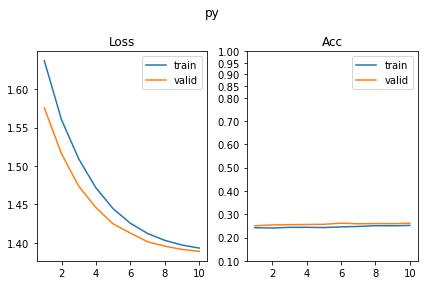

[186/630] px         SUP_[FCN16i223o64_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.08it/s, loss=1.5, acc=0.231]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 133.72it/s, loss=1.49, acc=0.22]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.41it/s, loss=1.45, acc=0.257]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.45it/s, loss=1.46, acc=0.239]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.51it/s, loss=1.42, acc=0.27]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.58it/s, loss=1.43, acc=0.246]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.24it/s, loss=1.4, acc=0.287]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.94it/s, loss=1.41, acc=0.278]     

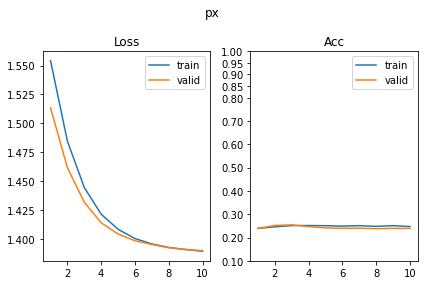

SUP_[FCN16i223o64_d8]_target_[scale]
[187/630] shape      SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.90it/s, loss=2.1, acc=0.125]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 148.56it/s, loss=2.05, acc=0.161]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.90it/s, loss=2.04, acc=0.142]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.23it/s, loss=2.02, acc=0.134]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.06it/s, loss=1.96, acc=0.164]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.63it/s, loss=1.97, acc=0.132]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.21it/s, loss=1.96, acc=0.166]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.05it/s, loss=1.96, acc=0.132]     

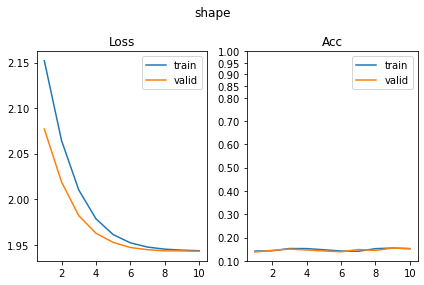

[188/630] scale      SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.49it/s, loss=1.2, acc=0.322]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.57it/s, loss=1.16, acc=0.341]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.58it/s, loss=0.939, acc=0.357]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.43it/s, loss=0.985, acc=0.315]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.96it/s, loss=0.741, acc=0.679]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 64.96it/s, loss=0.809, acc=0.651]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.07it/s, loss=0.592, acc=0.98]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.73it/s, loss=0.651, acc=0.915]    

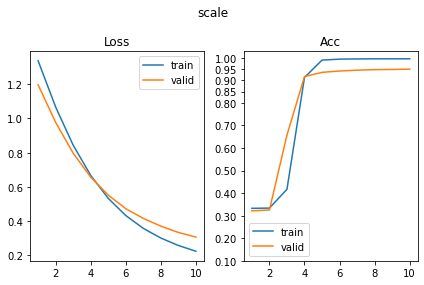

[189/630] color      SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.48it/s, loss=2.3, acc=0.0879]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.37it/s, loss=2.23, acc=0.124]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.96it/s, loss=2.14, acc=0.145]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 136.75it/s, loss=2.16, acc=0.132]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.36it/s, loss=2.14, acc=0.111]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 133.61it/s, loss=2.12, acc=0.134]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.71it/s, loss=2.11, acc=0.106]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.42it/s, loss=2.09, acc=0.122]     

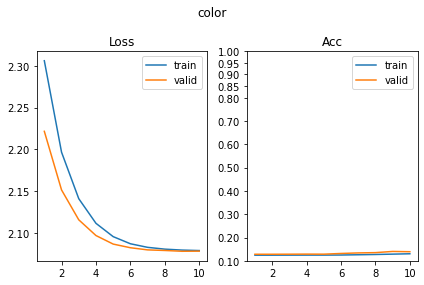

[190/630] angle      SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 98.57it/s, loss=2.96, acc=0.0489]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 136.57it/s, loss=2.99, acc=0.0439]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.94it/s, loss=2.91, acc=0.0586]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.16it/s, loss=2.84, acc=0.0659]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.78it/s, loss=2.82, acc=0.07]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.48it/s, loss=2.86, acc=0.078]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.92it/s, loss=2.8, acc=0.0603]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.04it/s, loss=2.8, acc=0.0634]     

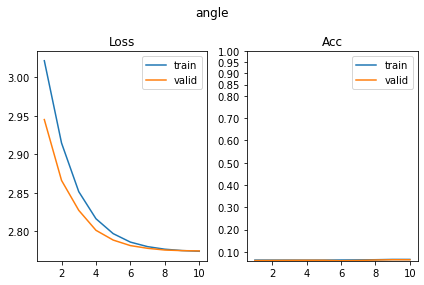

[191/630] py         SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 66.77it/s, loss=1.57, acc=0.221]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.91it/s, loss=1.49, acc=0.283]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 98.12it/s, loss=1.48, acc=0.265]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.08it/s, loss=1.47, acc=0.254]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.92it/s, loss=1.44, acc=0.231]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.29it/s, loss=1.43, acc=0.244]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.46it/s, loss=1.4, acc=0.264]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.78it/s, loss=1.4, acc=0.249]      

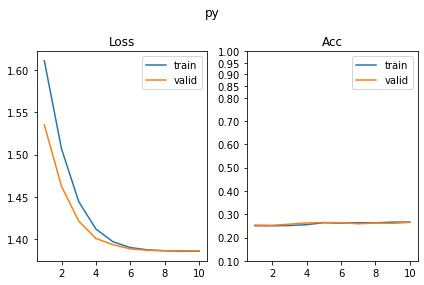

[192/630] px         SUP_[FCN16i223o64_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.33it/s, loss=1.39, acc=0.277]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.23it/s, loss=1.43, acc=0.237]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.53it/s, loss=1.4, acc=0.256]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.84it/s, loss=1.4, acc=0.227]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.18it/s, loss=1.4, acc=0.23]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 137.56it/s, loss=1.4, acc=0.229]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.05it/s, loss=1.39, acc=0.244]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 99.08it/s, loss=1.39, acc=0.256]      

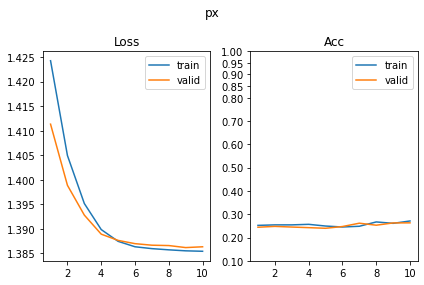

SUP_[FCN16i223o64_d8]_target_[color]
[193/630] shape      SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 113.44it/s, loss=2.22, acc=0.145]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 63.63it/s, loss=2.25, acc=0.11]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 106.56it/s, loss=2.22, acc=0.138]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 117.91it/s, loss=2.16, acc=0.134]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.22it/s, loss=2.05, acc=0.179]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.74it/s, loss=2.07, acc=0.154]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.93it/s, loss=2.05, acc=0.124]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 134.27it/s, loss=2.02, acc=0.151]     

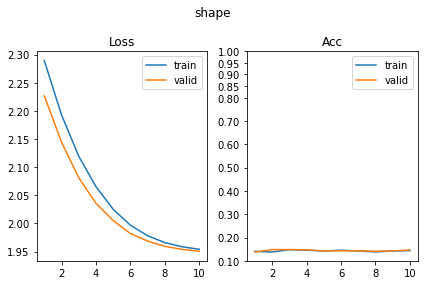

[194/630] scale      SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.17it/s, loss=1.41, acc=0.357]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 135.52it/s, loss=1.45, acc=0.337]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.69it/s, loss=1.34, acc=0.34]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 48.39it/s, loss=1.35, acc=0.339]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.54it/s, loss=1.2, acc=0.37]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.07it/s, loss=1.28, acc=0.312]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.70it/s, loss=1.22, acc=0.342]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.91it/s, loss=1.2, acc=0.359]      

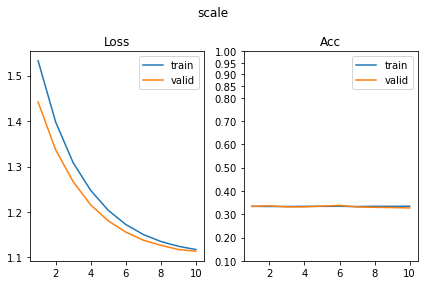

[195/630] color      SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.85it/s, loss=3.02, acc=0]                                               
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.36it/s, loss=2.98, acc=0]                                                
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.11it/s, loss=2.65, acc=0]                                               
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.56it/s, loss=2.61, acc=0.00244]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.54it/s, loss=2.32, acc=0.134]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.13it/s, loss=2.22, acc=0.188]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.25it/s, loss=2, acc=0.371]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.78it/s, loss=1.96, acc=0.41]      

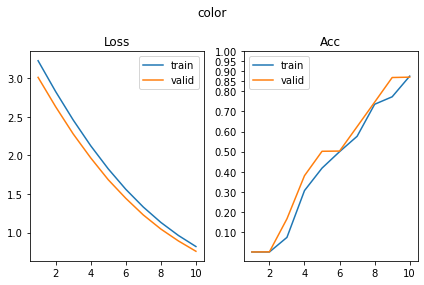

[196/630] angle      SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.70it/s, loss=3.19, acc=0.0489]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.69it/s, loss=3.19, acc=0.0659]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.85it/s, loss=3.03, acc=0.0603]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 94.61it/s, loss=3.1, acc=0.078]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 64.79it/s, loss=2.96, acc=0.0717]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.74it/s, loss=3.01, acc=0.0512]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.88it/s, loss=2.88, acc=0.0635]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.18it/s, loss=2.93, acc=0.0683]    

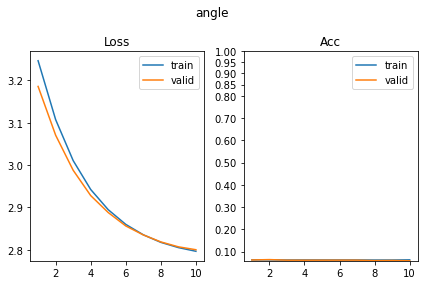

[197/630] py         SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.60it/s, loss=1.62, acc=0.275]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 91.14it/s, loss=1.63, acc=0.251]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.17it/s, loss=1.58, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 44.83it/s, loss=1.54, acc=0.259]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 68.55it/s, loss=1.52, acc=0.243]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 84.91it/s, loss=1.5, acc=0.273]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.74it/s, loss=1.5, acc=0.235]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.57it/s, loss=1.5, acc=0.222]      

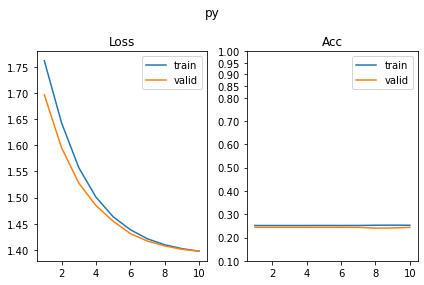

[198/630] px         SUP_[FCN16i223o64_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.97it/s, loss=1.61, acc=0.275]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.28it/s, loss=1.61, acc=0.234]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 98.65it/s, loss=1.52, acc=0.257]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.03it/s, loss=1.58, acc=0.217]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.06it/s, loss=1.47, acc=0.243]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.10it/s, loss=1.52, acc=0.222]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.09it/s, loss=1.46, acc=0.236]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.74it/s, loss=1.44, acc=0.276]     

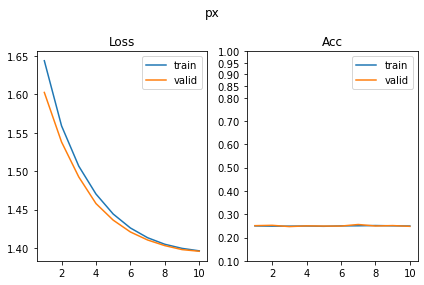

SUP_[FCN16i223o64_d8]_target_[angle]
[199/630] shape      SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.49it/s, loss=2.49, acc=0.171]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.27it/s, loss=2.47, acc=0.163]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.96it/s, loss=2.35, acc=0.168]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.51it/s, loss=2.38, acc=0.124]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.49it/s, loss=2.2, acc=0.182]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.24it/s, loss=2.17, acc=0.154]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.07it/s, loss=2.09, acc=0.163]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.29it/s, loss=2.06, acc=0.173]     

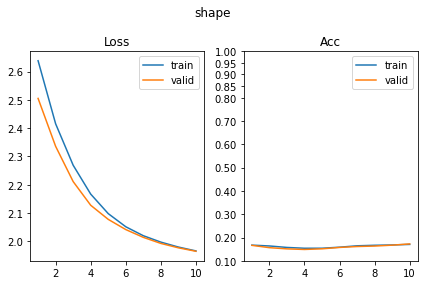

[200/630] scale      SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.38it/s, loss=1.21, acc=0.322]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.57it/s, loss=1.22, acc=0.305]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 124.14it/s, loss=1.17, acc=0.316]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 74.03it/s, loss=1.21, acc=0.322]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.37it/s, loss=1.14, acc=0.336]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.31it/s, loss=1.15, acc=0.361]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.76it/s, loss=1.12, acc=0.371]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.67it/s, loss=1.13, acc=0.329]     

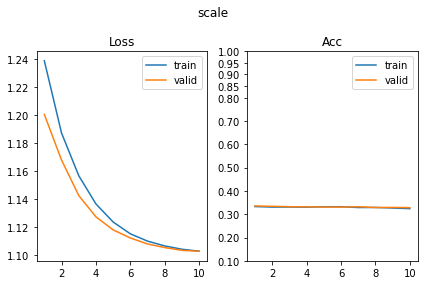

[201/630] color      SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.74it/s, loss=2.39, acc=0.122]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 91.59it/s, loss=2.34, acc=0.12]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.94it/s, loss=2.26, acc=0.138]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.76it/s, loss=2.27, acc=0.117]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.45it/s, loss=2.24, acc=0.15]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.93it/s, loss=2.25, acc=0.129]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.29it/s, loss=2.18, acc=0.13]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 76.41it/s, loss=2.24, acc=0.122]      

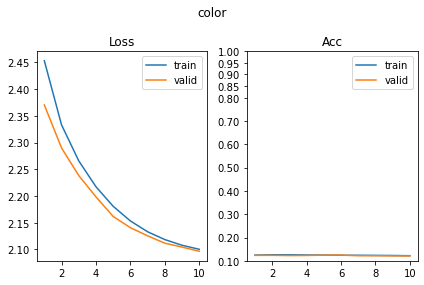

[202/630] angle      SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 109.50it/s, loss=3.54, acc=0.0342]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.84it/s, loss=3.42, acc=0.039]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.58it/s, loss=3.27, acc=0.0489]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.98it/s, loss=3.17, acc=0.0488]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.01it/s, loss=2.93, acc=0.122]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.53it/s, loss=2.94, acc=0.0829]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.68it/s, loss=2.65, acc=0.168]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.05it/s, loss=2.68, acc=0.144]     

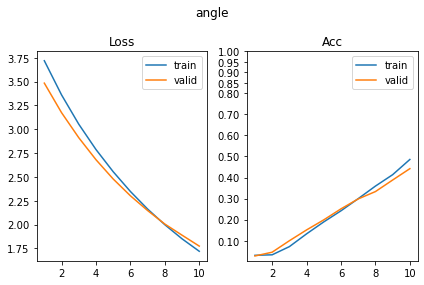

[203/630] py         SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.14it/s, loss=1.6, acc=0.244]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.25it/s, loss=1.63, acc=0.227]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 115.05it/s, loss=1.57, acc=0.246]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.48it/s, loss=1.56, acc=0.239]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 117.20it/s, loss=1.51, acc=0.249]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 134.89it/s, loss=1.51, acc=0.261]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.93it/s, loss=1.48, acc=0.246]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.44it/s, loss=1.46, acc=0.244]     

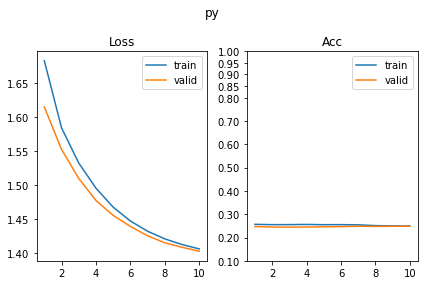

[204/630] px         SUP_[FCN16i223o64_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.28it/s, loss=1.51, acc=0.274]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.03it/s, loss=1.53, acc=0.266]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.89it/s, loss=1.52, acc=0.238]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.99it/s, loss=1.47, acc=0.268]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.05it/s, loss=1.51, acc=0.243]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.78it/s, loss=1.49, acc=0.234]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.58it/s, loss=1.46, acc=0.274]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.36it/s, loss=1.44, acc=0.268]     

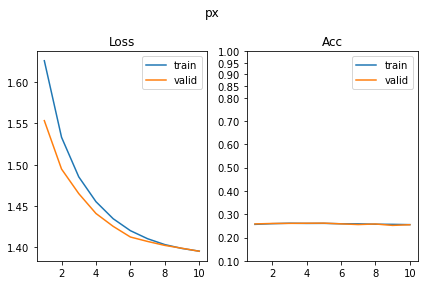

SUP_[FCN16i223o64_d8]_target_[py]
[205/630] shape      SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 111.21it/s, loss=2.21, acc=0.137]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 136.33it/s, loss=2.27, acc=0.127]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.78it/s, loss=2.13, acc=0.142]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 148.39it/s, loss=2.13, acc=0.129]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 100.18it/s, loss=2.07, acc=0.138]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 133.65it/s, loss=2.07, acc=0.134]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.51it/s, loss=2.06, acc=0.121]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.15it/s, loss=2.04, acc=0.112]     

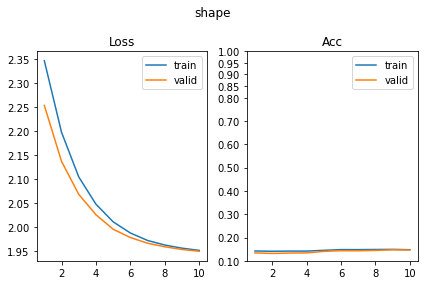

[206/630] scale      SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.33it/s, loss=1.14, acc=0.316]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.00it/s, loss=1.15, acc=0.332]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 113.88it/s, loss=1.12, acc=0.322]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.59it/s, loss=1.11, acc=0.349]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 115.14it/s, loss=1.11, acc=0.365]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.17it/s, loss=1.11, acc=0.351]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.89it/s, loss=1.1, acc=0.375]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.24it/s, loss=1.11, acc=0.315]     

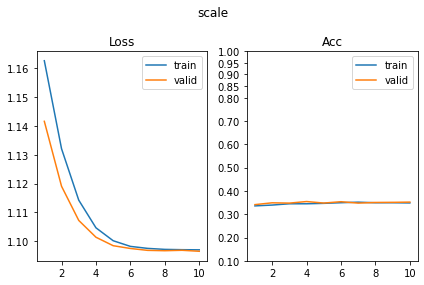

[207/630] color      SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.14it/s, loss=2.27, acc=0.137]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.05it/s, loss=2.29, acc=0.115]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.70it/s, loss=2.24, acc=0.132]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.06it/s, loss=2.2, acc=0.127]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.96it/s, loss=2.15, acc=0.135]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.94it/s, loss=2.17, acc=0.156]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 98.18it/s, loss=2.14, acc=0.109]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.46it/s, loss=2.13, acc=0.112]     

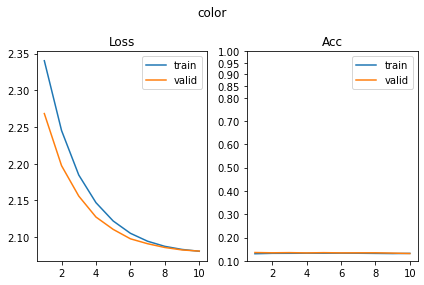

[208/630] angle      SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 107.80it/s, loss=3.05, acc=0.0635]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.92it/s, loss=3.03, acc=0.0634]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.28it/s, loss=2.97, acc=0.0684]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.21it/s, loss=2.98, acc=0.0805]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.68it/s, loss=2.9, acc=0.0635]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.38it/s, loss=2.88, acc=0.0512]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.08it/s, loss=2.83, acc=0.0684]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.26it/s, loss=2.82, acc=0.0707]    

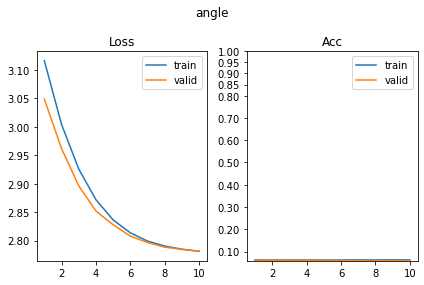

[209/630] py         SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.90it/s, loss=1.29, acc=0.471]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 70.21it/s, loss=1.3, acc=0.478]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 106.69it/s, loss=1.07, acc=0.485]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.46it/s, loss=1.09, acc=0.478]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 109.06it/s, loss=0.855, acc=0.552]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.34it/s, loss=0.898, acc=0.505]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.89it/s, loss=0.693, acc=0.728]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 138.09it/s, loss=0.731, acc=0.724]    

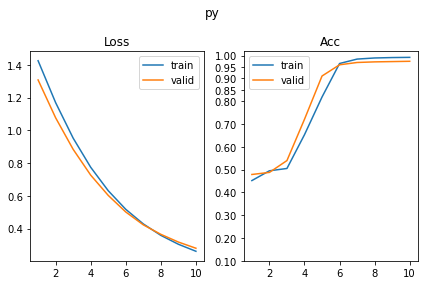

[210/630] px         SUP_[FCN16i223o64_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.46it/s, loss=1.67, acc=0.243]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.95it/s, loss=1.67, acc=0.259]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.51it/s, loss=1.54, acc=0.274]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 86.52it/s, loss=1.53, acc=0.237]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.89it/s, loss=1.45, acc=0.265]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 137.14it/s, loss=1.47, acc=0.254]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.21it/s, loss=1.45, acc=0.248]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.18it/s, loss=1.44, acc=0.278]     

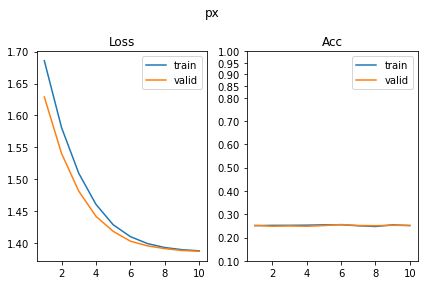

SUP_[FCN16i223o64_d8]_target_[px]
[211/630] shape      SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 97.25it/s, loss=2.27, acc=0.124]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.26it/s, loss=2.14, acc=0.171]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.63it/s, loss=2.13, acc=0.147]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 91.99it/s, loss=2.11, acc=0.144]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.21it/s, loss=2.05, acc=0.168]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.04it/s, loss=2.07, acc=0.137]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.77it/s, loss=2.03, acc=0.151]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 97.71it/s, loss=2.01, acc=0.168]      

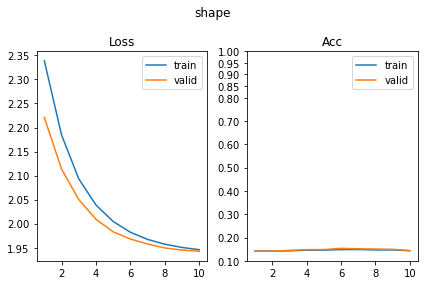

[212/630] scale      SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.69it/s, loss=1.39, acc=0.303]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.32it/s, loss=1.35, acc=0.339]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 120.19it/s, loss=1.23, acc=0.329]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.20it/s, loss=1.27, acc=0.31]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 114.27it/s, loss=1.21, acc=0.342]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 130.77it/s, loss=1.17, acc=0.371]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.09it/s, loss=1.14, acc=0.355]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.38it/s, loss=1.16, acc=0.346]     

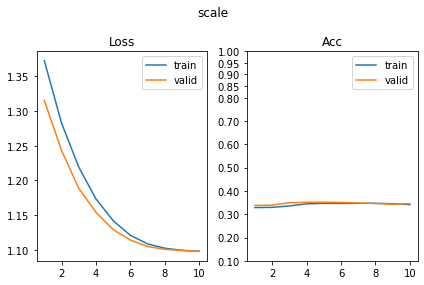

[213/630] color      SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 100.02it/s, loss=2.36, acc=0.134]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 137.44it/s, loss=2.42, acc=0.129]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.66it/s, loss=2.24, acc=0.153]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.76it/s, loss=2.21, acc=0.146]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.87it/s, loss=2.17, acc=0.125]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.87it/s, loss=2.17, acc=0.132]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.78it/s, loss=2.14, acc=0.138]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.98it/s, loss=2.13, acc=0.166]     

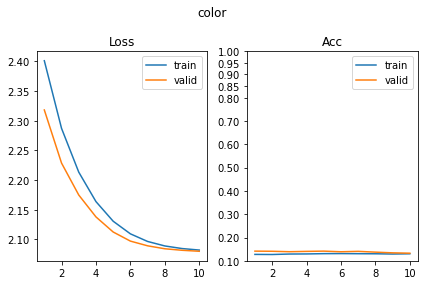

[214/630] angle      SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 104.84it/s, loss=3.1, acc=0.0782]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.68it/s, loss=3.08, acc=0.0707]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.99it/s, loss=3.02, acc=0.0619]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 84.47it/s, loss=3.09, acc=0.0317]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.27it/s, loss=3, acc=0.0603]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.56it/s, loss=2.9, acc=0.0683]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.15it/s, loss=2.91, acc=0.0603]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.26it/s, loss=2.92, acc=0.0512]    

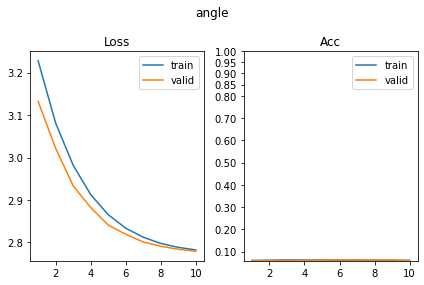

[215/630] py         SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.78it/s, loss=1.45, acc=0.256]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 91.37it/s, loss=1.46, acc=0.246]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.14it/s, loss=1.42, acc=0.241]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 58.53it/s, loss=1.44, acc=0.215]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 72.74it/s, loss=1.41, acc=0.246]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.49it/s, loss=1.4, acc=0.28]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.44it/s, loss=1.39, acc=0.235]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.11it/s, loss=1.4, acc=0.237]      

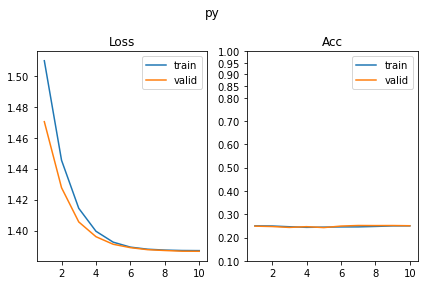

[216/630] px         SUP_[FCN16i223o64_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.26it/s, loss=1.65, acc=0.287]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.91it/s, loss=1.75, acc=0.266]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.39it/s, loss=1.41, acc=0.409]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 99.29it/s, loss=1.49, acc=0.422]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.34it/s, loss=1.2, acc=0.754]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.77it/s, loss=1.2, acc=0.746]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.64it/s, loss=1.04, acc=0.741]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 137.29it/s, loss=1.01, acc=0.751]     

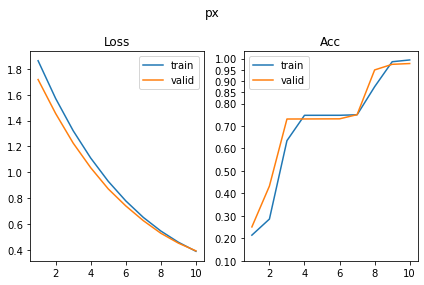

SUP_[FCN16i223o64_d16]_target_[shape]
[217/630] shape      SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 104.18it/s, loss=1.89, acc=0.275]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.81it/s, loss=1.84, acc=0.293]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.31it/s, loss=1.42, acc=0.49]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.55it/s, loss=1.41, acc=0.502]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 69.75it/s, loss=1.07, acc=0.801]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 99.31it/s, loss=1.06, acc=0.78]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.85it/s, loss=0.789, acc=0.868]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.67it/s, loss=0.783, acc=0.856]    

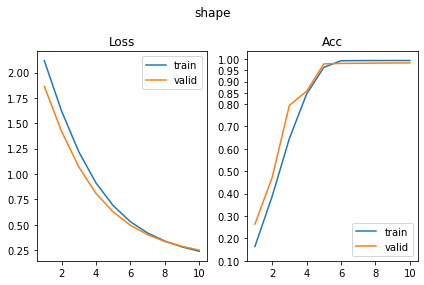

[218/630] scale      SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 72.39it/s, loss=1.15, acc=0.342]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 98.10it/s, loss=1.15, acc=0.307]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 112.06it/s, loss=1.12, acc=0.368]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 40.30it/s, loss=1.09, acc=0.422]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 62.85it/s, loss=1.11, acc=0.316]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 88.50it/s, loss=1.1, acc=0.339]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 62.25it/s, loss=1.1, acc=0.339]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 83.02it/s, loss=1.1, acc=0.324]       

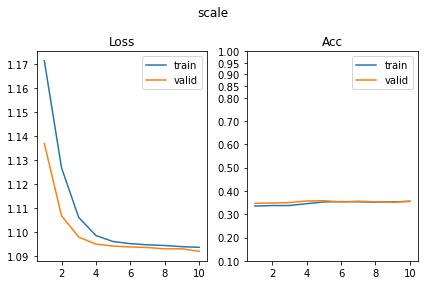

[219/630] color      SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 71.17it/s, loss=2.27, acc=0.132]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 69.01it/s, loss=2.27, acc=0.112]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.31it/s, loss=2.19, acc=0.111]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 104.39it/s, loss=2.17, acc=0.141]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.34it/s, loss=2.17, acc=0.103]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.69it/s, loss=2.14, acc=0.122]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.64it/s, loss=2.11, acc=0.121]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 86.64it/s, loss=2.11, acc=0.124]      

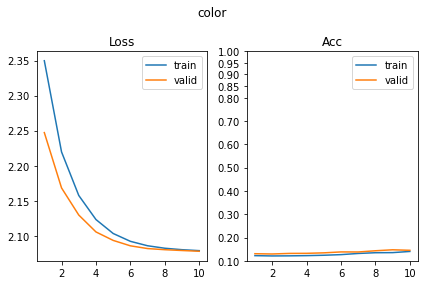

[220/630] angle      SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 103.17it/s, loss=2.9, acc=0.0489]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 139.38it/s, loss=2.9, acc=0.0732]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.65it/s, loss=2.85, acc=0.0505]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.02it/s, loss=2.81, acc=0.0659]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 70.15it/s, loss=2.8, acc=0.0619]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.17it/s, loss=2.82, acc=0.0585]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.73it/s, loss=2.79, acc=0.0586]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.02it/s, loss=2.8, acc=0.0756]     

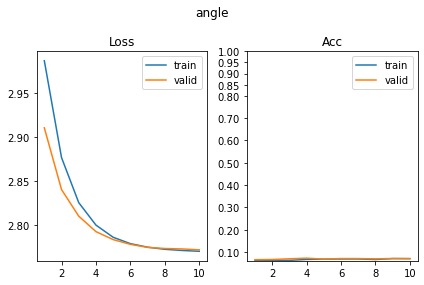

[221/630] py         SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.74it/s, loss=1.66, acc=0.246]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 94.70it/s, loss=1.66, acc=0.237]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.98it/s, loss=1.48, acc=0.231]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 58.48it/s, loss=1.47, acc=0.259]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.87it/s, loss=1.4, acc=0.296]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 76.38it/s, loss=1.43, acc=0.237]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.64it/s, loss=1.4, acc=0.252]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.42it/s, loss=1.4, acc=0.232]       

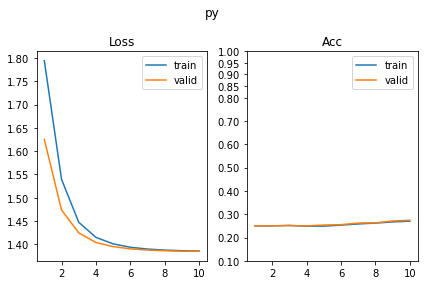

[222/630] px         SUP_[FCN16i223o64_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.05it/s, loss=1.49, acc=0.265]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.12it/s, loss=1.46, acc=0.254]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.10it/s, loss=1.44, acc=0.257]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 86.14it/s, loss=1.42, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 62.40it/s, loss=1.4, acc=0.272]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 93.07it/s, loss=1.39, acc=0.268]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.50it/s, loss=1.39, acc=0.265]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.21it/s, loss=1.38, acc=0.234]     

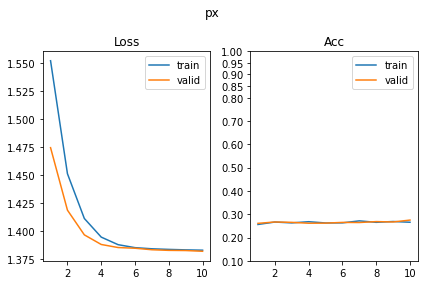

SUP_[FCN16i223o64_d16]_target_[scale]
[223/630] shape      SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 121.63it/s, loss=2.04, acc=0.156]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.95it/s, loss=2.03, acc=0.132]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.45it/s, loss=1.98, acc=0.129]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 118.70it/s, loss=1.99, acc=0.151]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.42it/s, loss=1.96, acc=0.121]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.79it/s, loss=1.95, acc=0.144]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.69it/s, loss=1.94, acc=0.138]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.07it/s, loss=1.94, acc=0.137]     

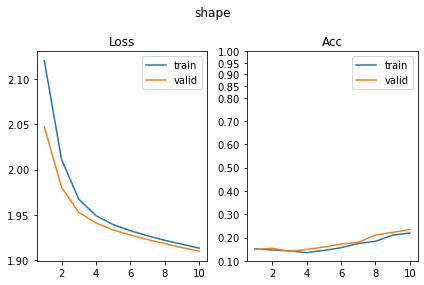

[224/630] scale      SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.43it/s, loss=0.839, acc=0.591]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 157.78it/s, loss=0.844, acc=0.583]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 99.11it/s, loss=0.582, acc=0.923]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.89it/s, loss=0.623, acc=0.859]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.88it/s, loss=0.435, acc=0.989]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.22it/s, loss=0.454, acc=0.976]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.44it/s, loss=0.332, acc=0.992]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.19it/s, loss=0.377, acc=0.956]    

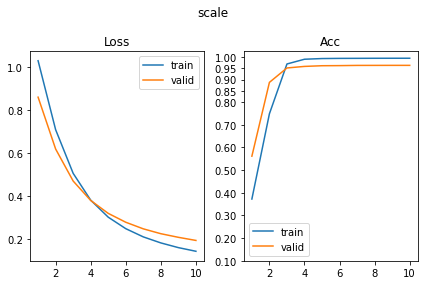

[225/630] color      SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.42it/s, loss=2.13, acc=0.127]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.62it/s, loss=2.12, acc=0.127]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.18it/s, loss=2.12, acc=0.107]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 94.53it/s, loss=2.1, acc=0.144]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.75it/s, loss=2.09, acc=0.129]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.83it/s, loss=2.09, acc=0.115]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.81it/s, loss=2.09, acc=0.103]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.83it/s, loss=2.08, acc=0.137]     

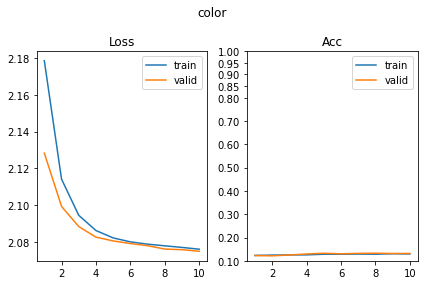

[226/630] angle      SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 107.01it/s, loss=2.86, acc=0.0603]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.63it/s, loss=2.88, acc=0.061]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.77it/s, loss=2.81, acc=0.0472]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.44it/s, loss=2.81, acc=0.0902]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.99it/s, loss=2.79, acc=0.0651]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.23it/s, loss=2.8, acc=0.0488]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.96it/s, loss=2.78, acc=0.0635]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 102.67it/s, loss=2.78, acc=0.0951]    

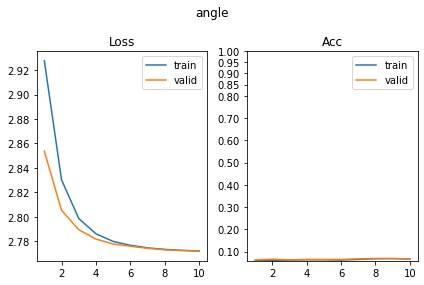

[227/630] py         SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.23it/s, loss=1.41, acc=0.217]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.79it/s, loss=1.41, acc=0.249]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.07it/s, loss=1.38, acc=0.269]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.19it/s, loss=1.4, acc=0.246]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.39it/s, loss=1.39, acc=0.256]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 91.64it/s, loss=1.38, acc=0.293]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.41it/s, loss=1.39, acc=0.254]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.94it/s, loss=1.38, acc=0.3]       

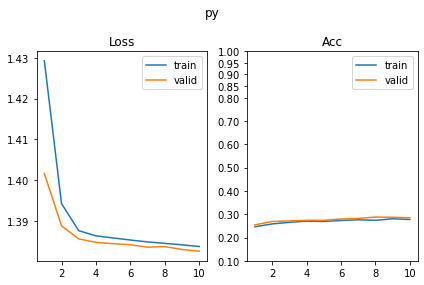

[228/630] px         SUP_[FCN16i223o64_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.10it/s, loss=1.53, acc=0.241]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.94it/s, loss=1.5, acc=0.229]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.33it/s, loss=1.43, acc=0.257]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 104.79it/s, loss=1.45, acc=0.251]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 65.74it/s, loss=1.39, acc=0.275]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 67.09it/s, loss=1.4, acc=0.263]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.71it/s, loss=1.39, acc=0.252]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 80.47it/s, loss=1.41, acc=0.198]      

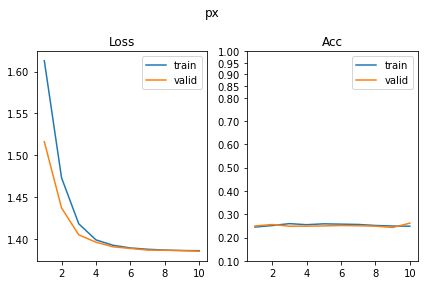

SUP_[FCN16i223o64_d16]_target_[color]
[229/630] shape      SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.41it/s, loss=2.08, acc=0.15]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 105.98it/s, loss=2.05, acc=0.161]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.37it/s, loss=2.04, acc=0.111]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.70it/s, loss=1.99, acc=0.168]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.78it/s, loss=1.98, acc=0.121]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.85it/s, loss=1.96, acc=0.144]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 62.98it/s, loss=1.96, acc=0.137]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.59it/s, loss=1.95, acc=0.154]     

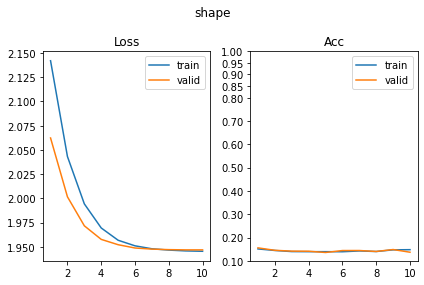

[230/630] scale      SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.25it/s, loss=1.15, acc=0.352]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 140.33it/s, loss=1.17, acc=0.337]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.25it/s, loss=1.13, acc=0.308]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.63it/s, loss=1.12, acc=0.349]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 101.13it/s, loss=1.1, acc=0.324]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.88it/s, loss=1.11, acc=0.329]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.29it/s, loss=1.1, acc=0.347]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.03it/s, loss=1.1, acc=0.354]       

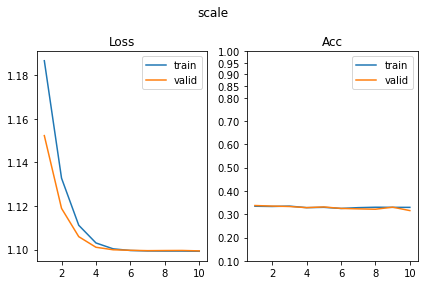

[231/630] color      SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.75it/s, loss=1.82, acc=0.379]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.67it/s, loss=1.84, acc=0.337]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.24it/s, loss=1.32, acc=0.559]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 91.83it/s, loss=1.34, acc=0.576]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.15it/s, loss=1.02, acc=0.865]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.70it/s, loss=0.98, acc=0.873]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.03it/s, loss=0.725, acc=0.86]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.99it/s, loss=0.709, acc=0.883]    

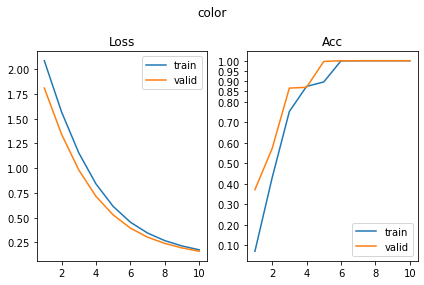

[232/630] angle      SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.64it/s, loss=2.96, acc=0.0407]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 97.62it/s, loss=2.91, acc=0.0756]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.83it/s, loss=2.86, acc=0.0472]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 131.35it/s, loss=2.85, acc=0.0683]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.35it/s, loss=2.83, acc=0.0375]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 132.43it/s, loss=2.82, acc=0.0683]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.32it/s, loss=2.8, acc=0.0684]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.61it/s, loss=2.79, acc=0.0707]    

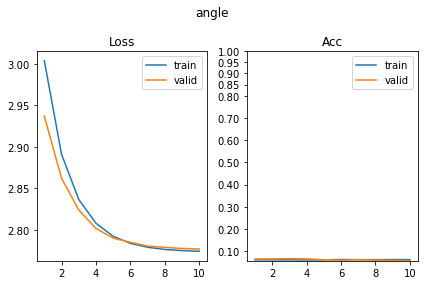

[233/630] py         SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.71it/s, loss=1.58, acc=0.274]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.47it/s, loss=1.52, acc=0.295]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 114.87it/s, loss=1.5, acc=0.265]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.95it/s, loss=1.48, acc=0.266]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.18it/s, loss=1.45, acc=0.251]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.65it/s, loss=1.45, acc=0.28]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 95.36it/s, loss=1.4, acc=0.287]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.68it/s, loss=1.41, acc=0.259]     

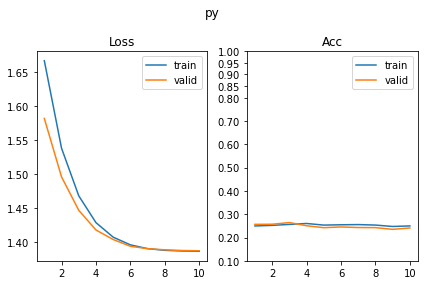

[234/630] px         SUP_[FCN16i223o64_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.70it/s, loss=1.49, acc=0.22]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.28it/s, loss=1.48, acc=0.202]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.63it/s, loss=1.44, acc=0.215]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.56it/s, loss=1.41, acc=0.244]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.20it/s, loss=1.4, acc=0.226]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.84it/s, loss=1.39, acc=0.266]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 71.97it/s, loss=1.39, acc=0.246]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.12it/s, loss=1.39, acc=0.241]     

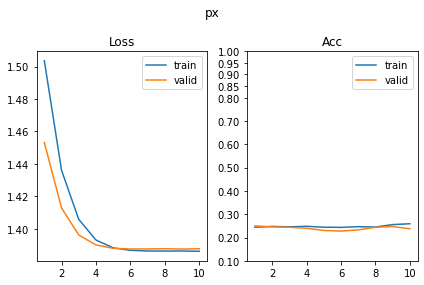

SUP_[FCN16i223o64_d16]_target_[angle]
[235/630] shape      SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.90it/s, loss=2.24, acc=0.132]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 53.41it/s, loss=2.19, acc=0.151]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 102.46it/s, loss=2.09, acc=0.143]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.08it/s, loss=2.03, acc=0.149]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.52it/s, loss=1.96, acc=0.202]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.32it/s, loss=1.95, acc=0.146]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 103.33it/s, loss=1.94, acc=0.161]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.62it/s, loss=1.96, acc=0.149]     

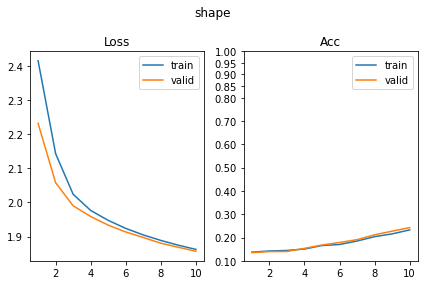

[236/630] scale      SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.31it/s, loss=1.15, acc=0.318]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.19it/s, loss=1.14, acc=0.346]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.98it/s, loss=1.13, acc=0.334]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 44.65it/s, loss=1.15, acc=0.295]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.68it/s, loss=1.15, acc=0.29]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 85.43it/s, loss=1.1, acc=0.363]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.40it/s, loss=1.12, acc=0.316]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 98.95it/s, loss=1.12, acc=0.32]       

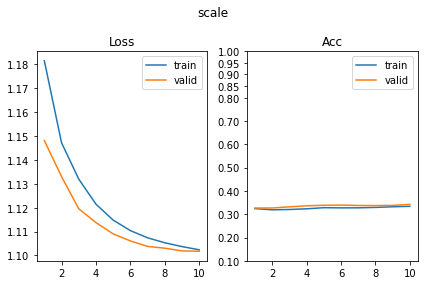

[237/630] color      SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.95it/s, loss=2.21, acc=0.119]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 88.57it/s, loss=2.21, acc=0.107]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.53it/s, loss=2.14, acc=0.127]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.56it/s, loss=2.17, acc=0.122]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.65it/s, loss=2.13, acc=0.155]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.50it/s, loss=2.16, acc=0.115]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.65it/s, loss=2.11, acc=0.134]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.41it/s, loss=2.12, acc=0.124]     

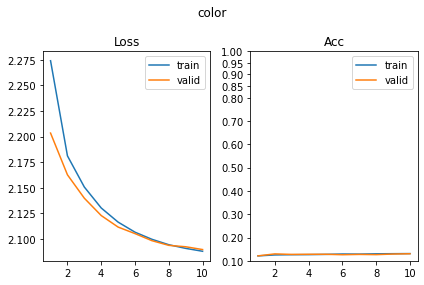

[238/630] angle      SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.13it/s, loss=2.82, acc=0.109]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 97.55it/s, loss=2.78, acc=0.0829]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.24it/s, loss=2.48, acc=0.215]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.15it/s, loss=2.5, acc=0.217]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 70.27it/s, loss=2.18, acc=0.379]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 94.00it/s, loss=2.22, acc=0.337]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.42it/s, loss=1.93, acc=0.524]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 143.93it/s, loss=2.03, acc=0.439]     

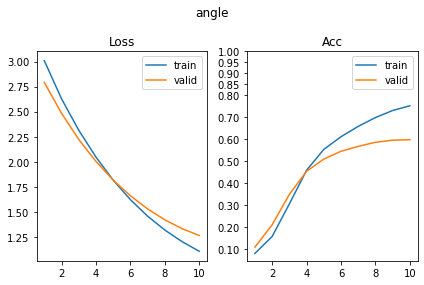

[239/630] py         SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.31it/s, loss=1.47, acc=0.204]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 139.65it/s, loss=1.45, acc=0.251]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.75it/s, loss=1.42, acc=0.292]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 56.85it/s, loss=1.42, acc=0.232]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 108.38it/s, loss=1.4, acc=0.254]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.00it/s, loss=1.42, acc=0.244]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.65it/s, loss=1.41, acc=0.244]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.91it/s, loss=1.38, acc=0.288]     

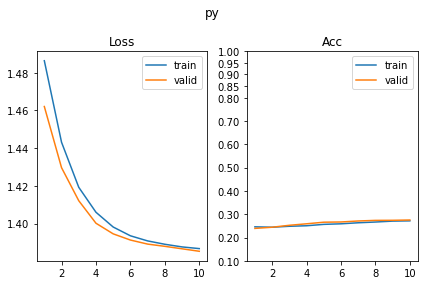

[240/630] px         SUP_[FCN16i223o64_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.40it/s, loss=1.56, acc=0.239]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 136.88it/s, loss=1.53, acc=0.295]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.84it/s, loss=1.47, acc=0.246]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.87it/s, loss=1.49, acc=0.239]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.75it/s, loss=1.44, acc=0.257]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.82it/s, loss=1.45, acc=0.229]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.82it/s, loss=1.42, acc=0.279]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 136.66it/s, loss=1.41, acc=0.295]     

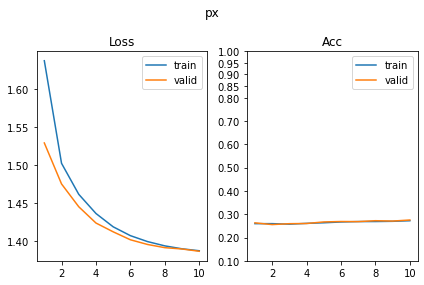

SUP_[FCN16i223o64_d16]_target_[py]
[241/630] shape      SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 106.06it/s, loss=2.03, acc=0.155]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.76it/s, loss=2.09, acc=0.127]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.78it/s, loss=2, acc=0.142]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 93.56it/s, loss=1.98, acc=0.146]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 70.12it/s, loss=1.95, acc=0.148]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.92it/s, loss=1.95, acc=0.156]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.09it/s, loss=1.95, acc=0.147]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.87it/s, loss=1.95, acc=0.132]     

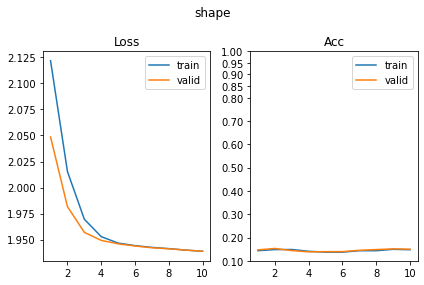

[242/630] scale      SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.07it/s, loss=1.23, acc=0.303]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.62it/s, loss=1.18, acc=0.344]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.13it/s, loss=1.15, acc=0.318]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.10it/s, loss=1.13, acc=0.356]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.99it/s, loss=1.11, acc=0.326]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.27it/s, loss=1.11, acc=0.329]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.13it/s, loss=1.11, acc=0.331]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.57it/s, loss=1.1, acc=0.332]      

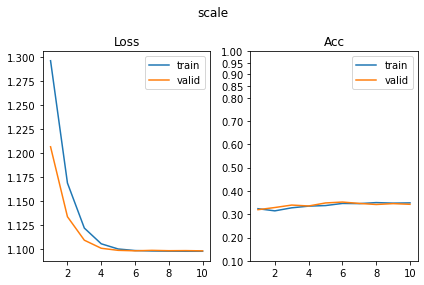

[243/630] color      SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.03it/s, loss=2.14, acc=0.122]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.51it/s, loss=2.14, acc=0.137]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 96.69it/s, loss=2.09, acc=0.132]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.84it/s, loss=2.09, acc=0.168]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.49it/s, loss=2.09, acc=0.103]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 136.41it/s, loss=2.08, acc=0.139]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 95.63it/s, loss=2.07, acc=0.145]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 136.01it/s, loss=2.07, acc=0.156]     

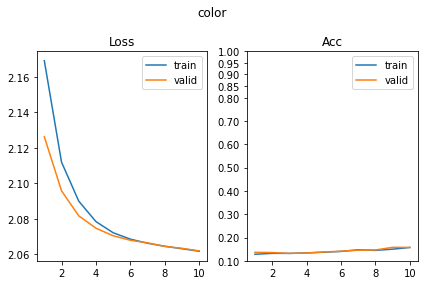

[244/630] angle      SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.26it/s, loss=2.82, acc=0.0505]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.23it/s, loss=2.85, acc=0.078]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.82it/s, loss=2.8, acc=0.0619]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 95.69it/s, loss=2.81, acc=0.0634]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.94it/s, loss=2.77, acc=0.0619]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 139.36it/s, loss=2.78, acc=0.0683]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.72it/s, loss=2.78, acc=0.0489]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.98it/s, loss=2.79, acc=0.0634]    

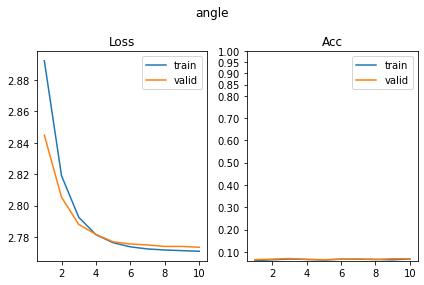

[245/630] py         SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.98it/s, loss=1.2, acc=0.358]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.98it/s, loss=1.17, acc=0.378]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 107.70it/s, loss=0.955, acc=0.492]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 56.05it/s, loss=0.937, acc=0.488]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.57it/s, loss=0.729, acc=0.927]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.88it/s, loss=0.738, acc=0.907]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.73it/s, loss=0.583, acc=0.984]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.11it/s, loss=0.595, acc=0.946]    

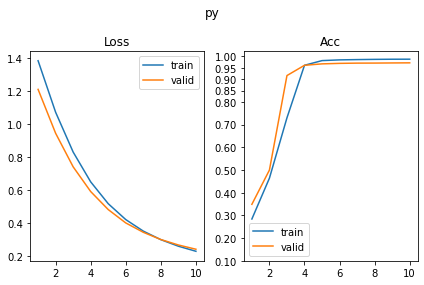

[246/630] px         SUP_[FCN16i223o64_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.34it/s, loss=1.52, acc=0.244]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.43it/s, loss=1.48, acc=0.224]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.82it/s, loss=1.42, acc=0.221]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.18it/s, loss=1.41, acc=0.254]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.59it/s, loss=1.41, acc=0.241]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.42it/s, loss=1.4, acc=0.234]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.56it/s, loss=1.39, acc=0.236]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.40it/s, loss=1.4, acc=0.227]      

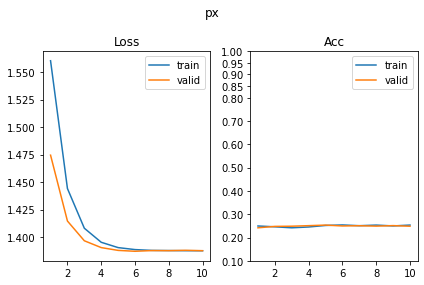

SUP_[FCN16i223o64_d16]_target_[px]
[247/630] shape      SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.72it/s, loss=2.04, acc=0.15]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 135.20it/s, loss=2.03, acc=0.146]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.18it/s, loss=1.98, acc=0.163]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.26it/s, loss=1.98, acc=0.161]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.89it/s, loss=1.95, acc=0.202]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.61it/s, loss=1.95, acc=0.149]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.17it/s, loss=1.95, acc=0.158]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.74it/s, loss=1.95, acc=0.166]     

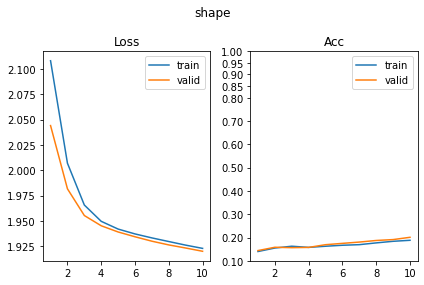

[248/630] scale      SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.96it/s, loss=1.22, acc=0.303]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 80.41it/s, loss=1.19, acc=0.359]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.64it/s, loss=1.14, acc=0.331]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.23it/s, loss=1.14, acc=0.324]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.10it/s, loss=1.13, acc=0.321]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.61it/s, loss=1.12, acc=0.31]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 54.05it/s, loss=1.11, acc=0.303]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 93.69it/s, loss=1.11, acc=0.332]      

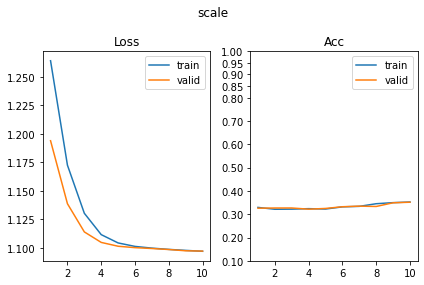

[249/630] color      SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 67.98it/s, loss=2.21, acc=0.135]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.95it/s, loss=2.2, acc=0.139]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 65.92it/s, loss=2.15, acc=0.119]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.32it/s, loss=2.13, acc=0.115]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 69.53it/s, loss=2.1, acc=0.111]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.97it/s, loss=2.11, acc=0.12]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 96.38it/s, loss=2.08, acc=0.101]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.54it/s, loss=2.07, acc=0.156]     

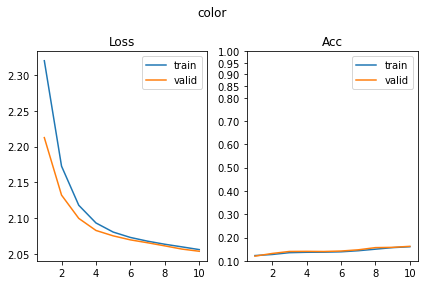

[250/630] angle      SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 105.86it/s, loss=2.9, acc=0.0717]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 87.50it/s, loss=2.91, acc=0.0634]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.46it/s, loss=2.83, acc=0.0554]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 111.54it/s, loss=2.85, acc=0.0561]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.46it/s, loss=2.82, acc=0.0668]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.39it/s, loss=2.8, acc=0.0683]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 95.39it/s, loss=2.79, acc=0.0749]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.84it/s, loss=2.8, acc=0.0439]     

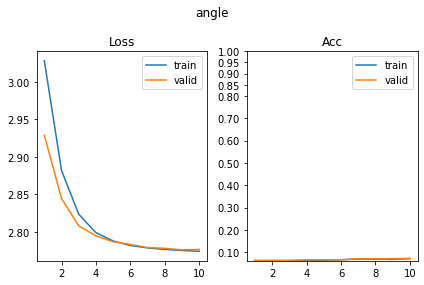

[251/630] py         SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.82it/s, loss=1.41, acc=0.257]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 135.96it/s, loss=1.44, acc=0.215]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.86it/s, loss=1.4, acc=0.27]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 56.56it/s, loss=1.4, acc=0.222]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.99it/s, loss=1.41, acc=0.223]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 96.86it/s, loss=1.4, acc=0.222]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.71it/s, loss=1.39, acc=0.239]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.13it/s, loss=1.39, acc=0.229]     

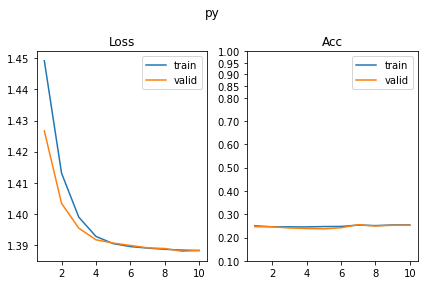

[252/630] px         SUP_[FCN16i223o64_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.77it/s, loss=1.21, acc=0.507]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 134.40it/s, loss=1.26, acc=0.463]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 65.00it/s, loss=0.908, acc=0.603]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 97.51it/s, loss=0.919, acc=0.598]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 69.40it/s, loss=0.667, acc=0.938]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.26it/s, loss=0.703, acc=0.927]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.24it/s, loss=0.524, acc=0.98]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 96.58it/s, loss=0.551, acc=0.961]     

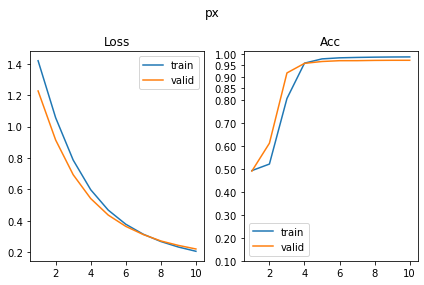

SUP_[FCN16i223o64_d32]_target_[shape]
[253/630] shape      SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.25it/s, loss=1.54, acc=0.378]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.99it/s, loss=1.53, acc=0.385]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.22it/s, loss=1, acc=0.832]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.47it/s, loss=1.01, acc=0.832]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 70.40it/s, loss=0.626, acc=0.904]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.10it/s, loss=0.687, acc=0.868]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.53it/s, loss=0.445, acc=0.995]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.47it/s, loss=0.461, acc=0.983]    

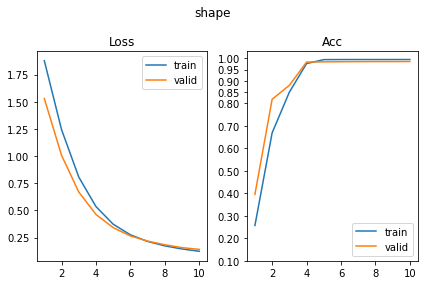

[254/630] scale      SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.90it/s, loss=1.1, acc=0.353]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 138.51it/s, loss=1.13, acc=0.305]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 112.03it/s, loss=1.11, acc=0.309]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.27it/s, loss=1.11, acc=0.293]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 115.97it/s, loss=1.1, acc=0.342]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.39it/s, loss=1.1, acc=0.354]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.92it/s, loss=1.1, acc=0.336]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.18it/s, loss=1.1, acc=0.324]      

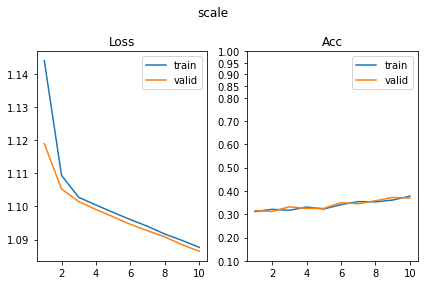

[255/630] color      SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.81it/s, loss=2.12, acc=0.137]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 88.75it/s, loss=2.13, acc=0.12]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.37it/s, loss=2.1, acc=0.116]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 123.98it/s, loss=2.08, acc=0.137]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.05it/s, loss=2.08, acc=0.14]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.08it/s, loss=2.09, acc=0.12]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.32it/s, loss=2.08, acc=0.13]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.61it/s, loss=2.09, acc=0.127]     

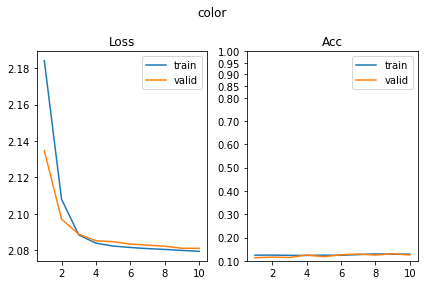

[256/630] angle      SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 119.48it/s, loss=2.86, acc=0.0603]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.77it/s, loss=2.82, acc=0.0805]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.68it/s, loss=2.8, acc=0.057]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 134.55it/s, loss=2.79, acc=0.0512]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.89it/s, loss=2.79, acc=0.0603]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.19it/s, loss=2.78, acc=0.0683]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.36it/s, loss=2.79, acc=0.0456]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 126.70it/s, loss=2.77, acc=0.0902]    

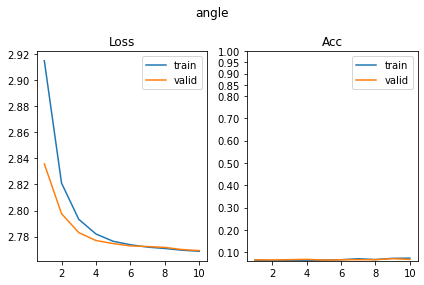

[257/630] py         SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.20it/s, loss=1.44, acc=0.257]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.30it/s, loss=1.43, acc=0.271]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 103.76it/s, loss=1.41, acc=0.251]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.92it/s, loss=1.39, acc=0.254]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.23it/s, loss=1.39, acc=0.252]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.48it/s, loss=1.38, acc=0.29]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.39it/s, loss=1.39, acc=0.261]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.50it/s, loss=1.39, acc=0.268]     

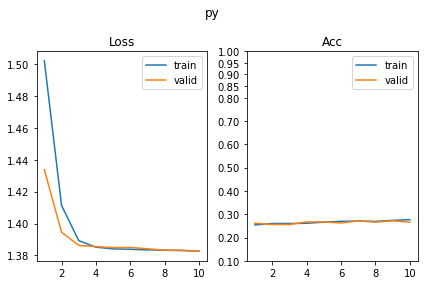

[258/630] px         SUP_[FCN16i223o64_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.52it/s, loss=1.44, acc=0.225]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.47it/s, loss=1.41, acc=0.254]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.31it/s, loss=1.41, acc=0.238]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 85.19it/s, loss=1.39, acc=0.251]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.46it/s, loss=1.39, acc=0.251]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.79it/s, loss=1.39, acc=0.237]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 61.89it/s, loss=1.38, acc=0.27]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 68.32it/s, loss=1.38, acc=0.32]       

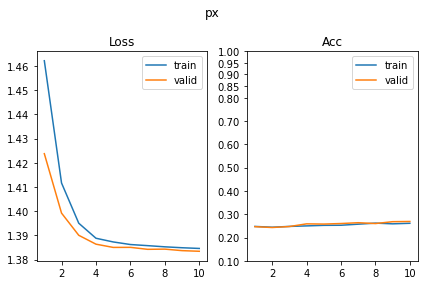

SUP_[FCN16i223o64_d32]_target_[scale]
[259/630] shape      SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.10it/s, loss=1.92, acc=0.191]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 49.10it/s, loss=1.92, acc=0.195]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.51it/s, loss=1.9, acc=0.199]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 78.23it/s, loss=1.88, acc=0.2]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.15it/s, loss=1.89, acc=0.239]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.89it/s, loss=1.88, acc=0.237]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.34it/s, loss=1.88, acc=0.261]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 64.87it/s, loss=1.88, acc=0.229]      

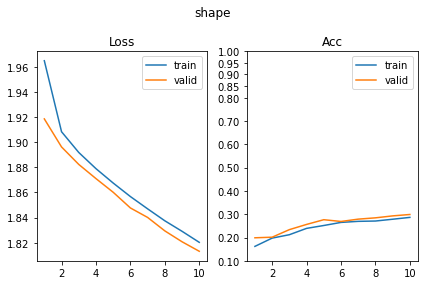

[260/630] scale      SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.18it/s, loss=0.834, acc=0.619]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.74it/s, loss=0.816, acc=0.651]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.73it/s, loss=0.53, acc=0.927]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.31it/s, loss=0.591, acc=0.854]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 100.48it/s, loss=0.4, acc=0.982]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.86it/s, loss=0.473, acc=0.92]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.85it/s, loss=0.31, acc=0.992]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 104.87it/s, loss=0.371, acc=0.92]     

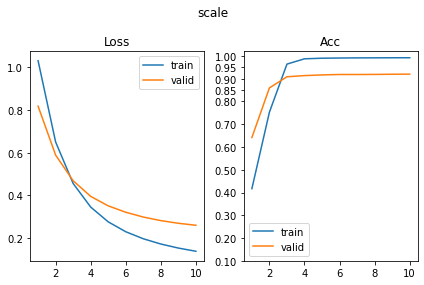

[261/630] color      SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 66.24it/s, loss=2.11, acc=0.132]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 56.25it/s, loss=2.09, acc=0.127]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 60.59it/s, loss=2.08, acc=0.134]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 75.63it/s, loss=2.08, acc=0.132]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 62.15it/s, loss=2.07, acc=0.147]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.24it/s, loss=2.07, acc=0.156]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.03it/s, loss=2.07, acc=0.164]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 136.85it/s, loss=2.07, acc=0.159]     

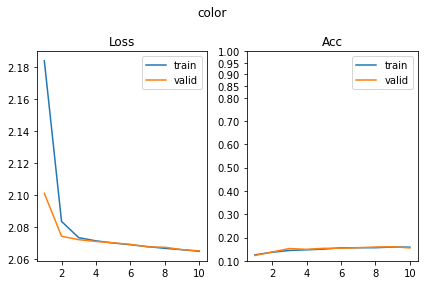

[262/630] angle      SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.71it/s, loss=2.79, acc=0.057]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 95.99it/s, loss=2.79, acc=0.0537]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.27it/s, loss=2.78, acc=0.0619]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.75it/s, loss=2.78, acc=0.0707]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.16it/s, loss=2.77, acc=0.07]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 64.17it/s, loss=2.77, acc=0.0488]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.01it/s, loss=2.78, acc=0.0619]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.44it/s, loss=2.77, acc=0.0732]    

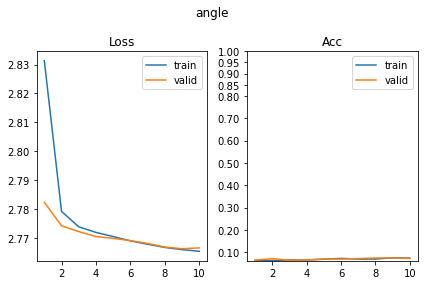

[263/630] py         SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.00it/s, loss=1.4, acc=0.252]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 103.06it/s, loss=1.39, acc=0.222]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.77it/s, loss=1.39, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.54it/s, loss=1.39, acc=0.207]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.70it/s, loss=1.39, acc=0.257]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.89it/s, loss=1.39, acc=0.278]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.95it/s, loss=1.39, acc=0.265]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.63it/s, loss=1.38, acc=0.249]      

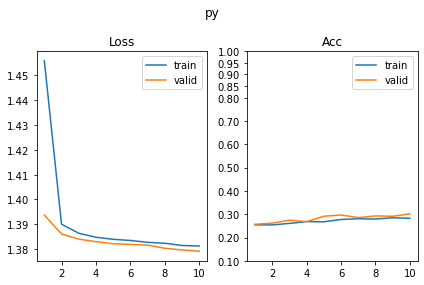

[264/630] px         SUP_[FCN16i223o64_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.83it/s, loss=1.41, acc=0.251]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.12it/s, loss=1.4, acc=0.259]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.13it/s, loss=1.39, acc=0.235]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.23it/s, loss=1.39, acc=0.198]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.53it/s, loss=1.39, acc=0.269]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 87.69it/s, loss=1.39, acc=0.217]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.82it/s, loss=1.39, acc=0.233]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.75it/s, loss=1.39, acc=0.246]     

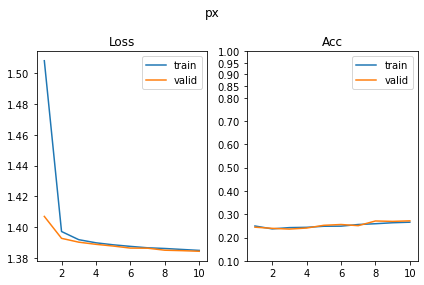

SUP_[FCN16i223o64_d32]_target_[color]
[265/630] shape      SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 56.75it/s, loss=2.03, acc=0.161]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.00it/s, loss=2.03, acc=0.146]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 54.47it/s, loss=1.98, acc=0.15]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 111.64it/s, loss=1.98, acc=0.154]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.28it/s, loss=1.95, acc=0.147]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.41it/s, loss=1.95, acc=0.156]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.08it/s, loss=1.95, acc=0.121]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 90.35it/s, loss=1.95, acc=0.154]      

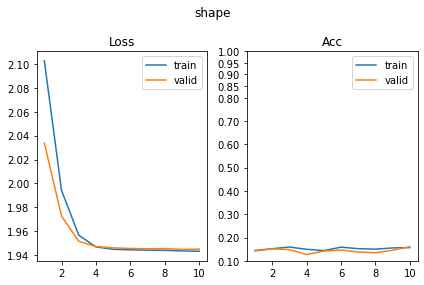

[266/630] scale      SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 82.25it/s, loss=1.11, acc=0.345]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.75it/s, loss=1.1, acc=0.371]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.38it/s, loss=1.1, acc=0.345]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.83it/s, loss=1.1, acc=0.346]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.81it/s, loss=1.1, acc=0.34]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.29it/s, loss=1.1, acc=0.288]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.85it/s, loss=1.1, acc=0.332]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.99it/s, loss=1.1, acc=0.356]      

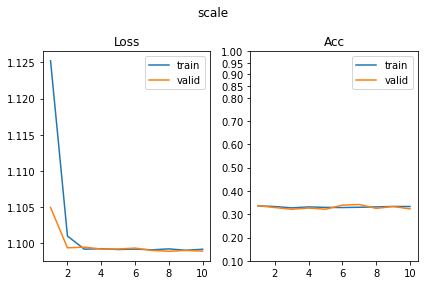

[267/630] color      SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.69it/s, loss=1.28, acc=0.621]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 98.94it/s, loss=1.23, acc=0.695]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.39it/s, loss=0.672, acc=1]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 143.11it/s, loss=0.646, acc=1]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.01it/s, loss=0.372, acc=1]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 137.59it/s, loss=0.37, acc=1]                                                
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.12it/s, loss=0.228, acc=1]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.92it/s, loss=0.225, acc=1]        

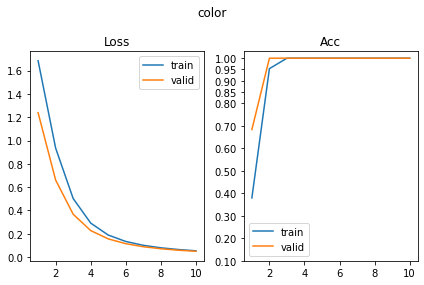

[268/630] angle      SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 118.48it/s, loss=2.84, acc=0.0521]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 61.23it/s, loss=2.86, acc=0.061]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 105.15it/s, loss=2.8, acc=0.0749]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.37it/s, loss=2.79, acc=0.0732]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.10it/s, loss=2.78, acc=0.0651]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.73it/s, loss=2.78, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.16it/s, loss=2.78, acc=0.0749]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.03it/s, loss=2.77, acc=0.061]     

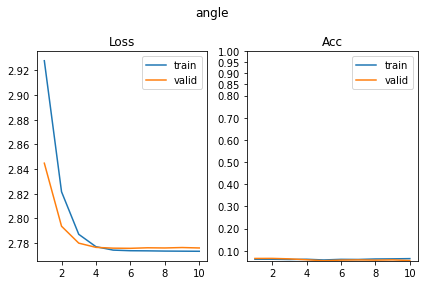

[269/630] py         SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.51it/s, loss=1.41, acc=0.231]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.09it/s, loss=1.41, acc=0.224]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 107.85it/s, loss=1.39, acc=0.225]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.71it/s, loss=1.39, acc=0.244]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.37it/s, loss=1.39, acc=0.238]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.67it/s, loss=1.39, acc=0.224]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 68.62it/s, loss=1.39, acc=0.243]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.64it/s, loss=1.39, acc=0.261]     

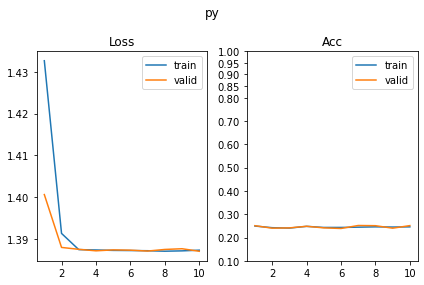

[270/630] px         SUP_[FCN16i223o64_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.31it/s, loss=1.47, acc=0.279]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 61.12it/s, loss=1.45, acc=0.283]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 69.39it/s, loss=1.4, acc=0.256]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.30it/s, loss=1.4, acc=0.263]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 62.18it/s, loss=1.39, acc=0.257]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.77it/s, loss=1.39, acc=0.251]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 59.93it/s, loss=1.38, acc=0.283]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.77it/s, loss=1.39, acc=0.249]     

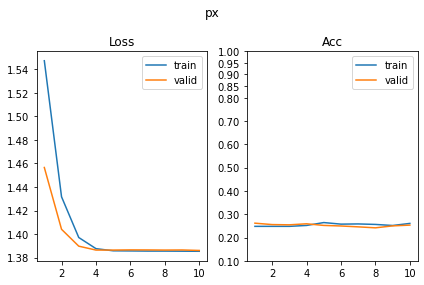

SUP_[FCN16i223o64_d32]_target_[angle]
[271/630] shape      SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.19it/s, loss=1.97, acc=0.138]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.91it/s, loss=1.96, acc=0.166]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 70.81it/s, loss=1.91, acc=0.199]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 91.44it/s, loss=1.93, acc=0.212]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.90it/s, loss=1.87, acc=0.215]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.29it/s, loss=1.9, acc=0.193]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.11it/s, loss=1.85, acc=0.239]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.06it/s, loss=1.86, acc=0.222]     

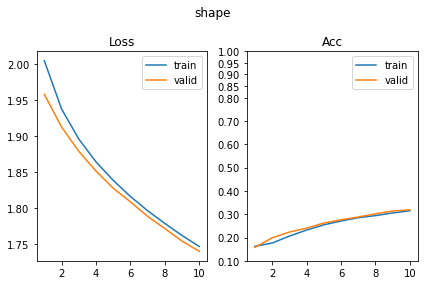

[272/630] scale      SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.14it/s, loss=1.18, acc=0.295]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.10it/s, loss=1.16, acc=0.346]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 111.30it/s, loss=1.14, acc=0.336]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.70it/s, loss=1.12, acc=0.341]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.19it/s, loss=1.13, acc=0.344]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 130.01it/s, loss=1.11, acc=0.361]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 100.08it/s, loss=1.12, acc=0.326]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.12it/s, loss=1.1, acc=0.366]      

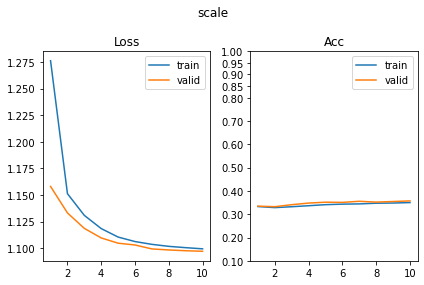

[273/630] color      SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.47it/s, loss=2.11, acc=0.142]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.68it/s, loss=2.11, acc=0.139]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.57it/s, loss=2.1, acc=0.137]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 113.61it/s, loss=2.1, acc=0.124]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.95it/s, loss=2.09, acc=0.142]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.44it/s, loss=2.11, acc=0.11]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.43it/s, loss=2.1, acc=0.112]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.10it/s, loss=2.1, acc=0.117]      

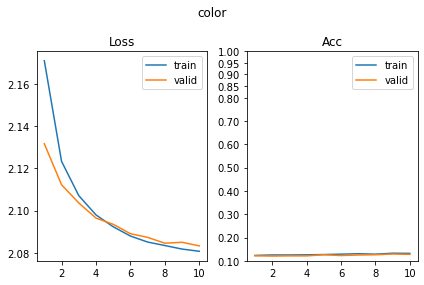

[274/630] angle      SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.36it/s, loss=2.4, acc=0.269]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 87.68it/s, loss=2.49, acc=0.227]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 67.15it/s, loss=1.98, acc=0.513]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.49it/s, loss=2.05, acc=0.456]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.10it/s, loss=1.61, acc=0.661]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 156.09it/s, loss=1.71, acc=0.568]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.79it/s, loss=1.27, acc=0.803]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.90it/s, loss=1.57, acc=0.551]     

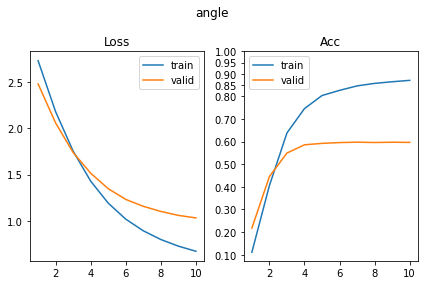

[275/630] py         SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.27it/s, loss=1.45, acc=0.265]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.92it/s, loss=1.46, acc=0.276]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.94it/s, loss=1.42, acc=0.238]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.25it/s, loss=1.43, acc=0.256]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 110.15it/s, loss=1.41, acc=0.275]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.83it/s, loss=1.41, acc=0.246]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.10it/s, loss=1.39, acc=0.277]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.57it/s, loss=1.4, acc=0.246]      

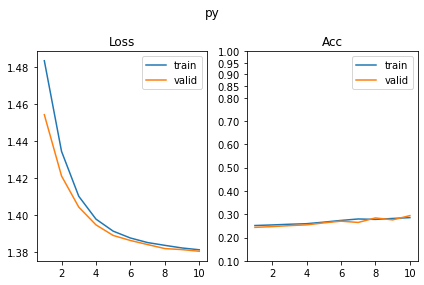

[276/630] px         SUP_[FCN16i223o64_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.23it/s, loss=1.44, acc=0.223]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.94it/s, loss=1.42, acc=0.256]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.74it/s, loss=1.41, acc=0.244]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.09it/s, loss=1.42, acc=0.249]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.41it/s, loss=1.4, acc=0.238]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.11it/s, loss=1.41, acc=0.227]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.08it/s, loss=1.41, acc=0.235]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.15it/s, loss=1.39, acc=0.298]     

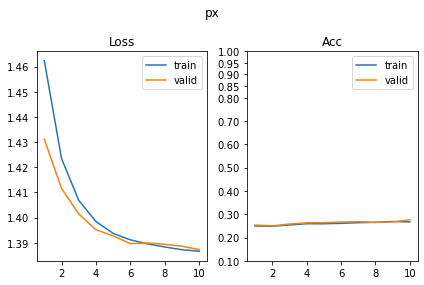

SUP_[FCN16i223o64_d32]_target_[py]
[277/630] shape      SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 106.94it/s, loss=1.97, acc=0.16]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.57it/s, loss=1.97, acc=0.166]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.68it/s, loss=1.93, acc=0.169]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.87it/s, loss=1.93, acc=0.178]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.98it/s, loss=1.93, acc=0.173]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.92it/s, loss=1.93, acc=0.178]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.30it/s, loss=1.91, acc=0.2]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 134.12it/s, loss=1.92, acc=0.178]     

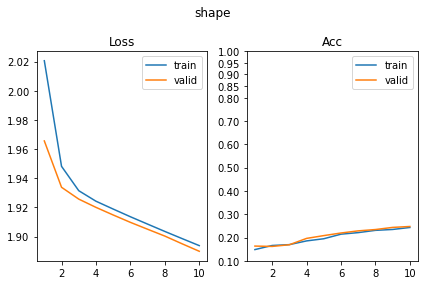

[278/630] scale      SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.96it/s, loss=1.12, acc=0.301]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.28it/s, loss=1.12, acc=0.341]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 113.92it/s, loss=1.1, acc=0.332]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.35it/s, loss=1.1, acc=0.356]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 114.16it/s, loss=1.1, acc=0.311]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.34it/s, loss=1.1, acc=0.327]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.99it/s, loss=1.1, acc=0.324]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.18it/s, loss=1.1, acc=0.366]       

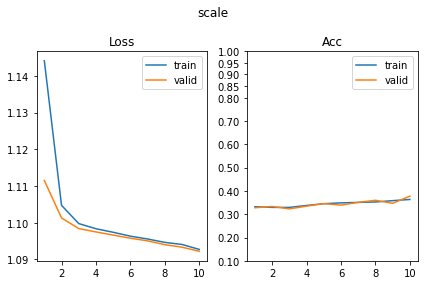

[279/630] color      SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.41it/s, loss=2.11, acc=0.132]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.79it/s, loss=2.1, acc=0.144]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.73it/s, loss=2.07, acc=0.142]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.69it/s, loss=2.07, acc=0.159]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.79it/s, loss=2.08, acc=0.137]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.43it/s, loss=2.07, acc=0.154]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.58it/s, loss=2.08, acc=0.145]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.39it/s, loss=2.08, acc=0.156]     

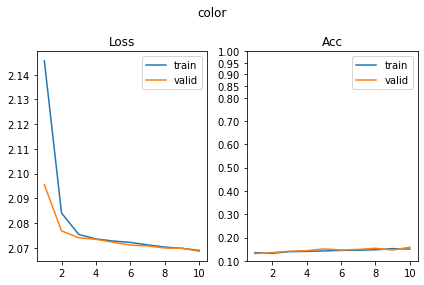

[280/630] angle      SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 107.78it/s, loss=2.83, acc=0.0619]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.34it/s, loss=2.82, acc=0.0561]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 66.35it/s, loss=2.79, acc=0.0619]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.78it/s, loss=2.78, acc=0.0463]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.39it/s, loss=2.77, acc=0.0586]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.93it/s, loss=2.78, acc=0.0585]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.18it/s, loss=2.77, acc=0.057]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.20it/s, loss=2.77, acc=0.0415]    

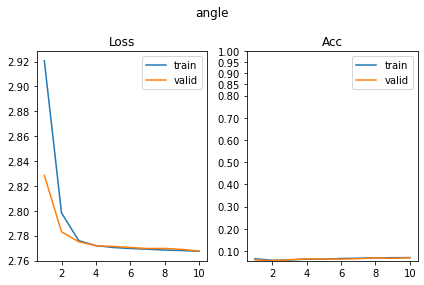

[281/630] py         SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.29it/s, loss=1.62, acc=0.241]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 134.85it/s, loss=1.6, acc=0.249]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 105.89it/s, loss=0.996, acc=0.349]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.25it/s, loss=0.999, acc=0.38]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.90it/s, loss=0.619, acc=0.948]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.44it/s, loss=0.635, acc=0.946]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.88it/s, loss=0.401, acc=0.993]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 139.28it/s, loss=0.402, acc=0.976]    

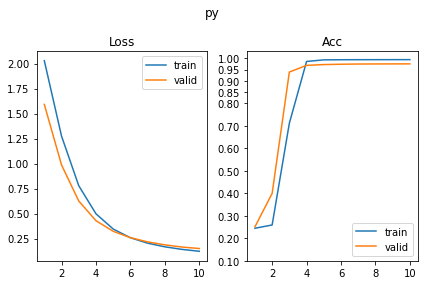

[282/630] px         SUP_[FCN16i223o64_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.08it/s, loss=1.39, acc=0.233]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.62it/s, loss=1.38, acc=0.307]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.03it/s, loss=1.39, acc=0.249]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.54it/s, loss=1.39, acc=0.268]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.62it/s, loss=1.38, acc=0.269]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.34it/s, loss=1.39, acc=0.28]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.11it/s, loss=1.39, acc=0.264]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.87it/s, loss=1.38, acc=0.268]     

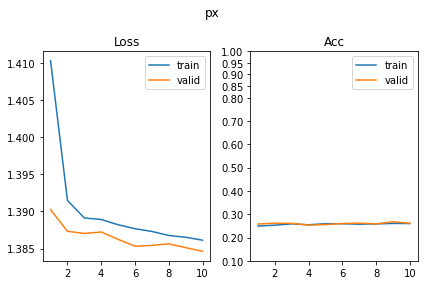

SUP_[FCN16i223o64_d32]_target_[px]
[283/630] shape      SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 105.17it/s, loss=1.98, acc=0.137]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.23it/s, loss=1.96, acc=0.178]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.14it/s, loss=1.96, acc=0.116]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.22it/s, loss=1.96, acc=0.122]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.91it/s, loss=1.94, acc=0.148]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 144.03it/s, loss=1.94, acc=0.151]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.60it/s, loss=1.94, acc=0.187]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.06it/s, loss=1.94, acc=0.183]     

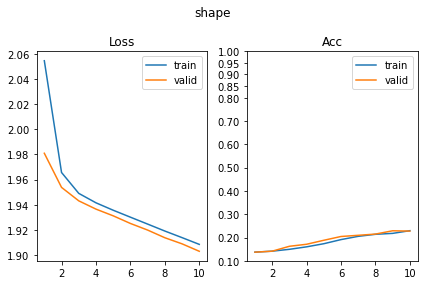

[284/630] scale      SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.12it/s, loss=1.09, acc=0.383]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.36it/s, loss=1.1, acc=0.334]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 104.27it/s, loss=1.09, acc=0.34]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.53it/s, loss=1.1, acc=0.3]                                                
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 112.43it/s, loss=1.1, acc=0.345]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.68it/s, loss=1.09, acc=0.376]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.07it/s, loss=1.09, acc=0.355]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.78it/s, loss=1.1, acc=0.341]      

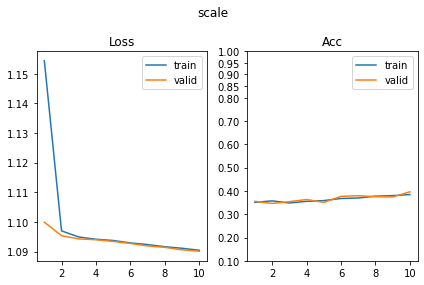

[285/630] color      SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.94it/s, loss=2.12, acc=0.137]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 97.53it/s, loss=2.11, acc=0.122]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.38it/s, loss=2.09, acc=0.112]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 136.83it/s, loss=2.08, acc=0.129]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.45it/s, loss=2.08, acc=0.103]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 87.11it/s, loss=2.08, acc=0.0927]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 68.07it/s, loss=2.07, acc=0.132]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.58it/s, loss=2.08, acc=0.137]     

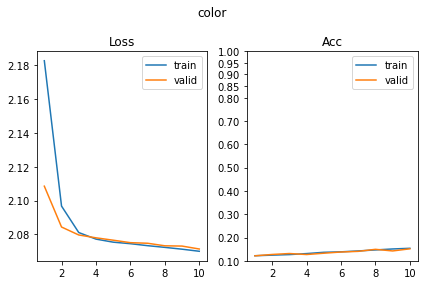

[286/630] angle      SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 114.39it/s, loss=2.78, acc=0.0635]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 134.33it/s, loss=2.81, acc=0.039]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.85it/s, loss=2.78, acc=0.0733]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.90it/s, loss=2.78, acc=0.0854]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.14it/s, loss=2.77, acc=0.0863]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.50it/s, loss=2.77, acc=0.0512]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.37it/s, loss=2.78, acc=0.0651]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.19it/s, loss=2.77, acc=0.0634]    

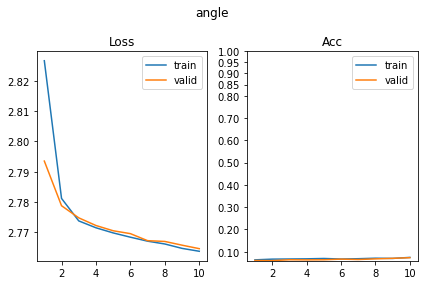

[287/630] py         SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.61it/s, loss=1.39, acc=0.254]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.28it/s, loss=1.41, acc=0.224]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 111.47it/s, loss=1.39, acc=0.244]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.44it/s, loss=1.39, acc=0.239]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.94it/s, loss=1.39, acc=0.257]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.59it/s, loss=1.39, acc=0.246]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.46it/s, loss=1.39, acc=0.244]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 99.97it/s, loss=1.39, acc=0.202]      

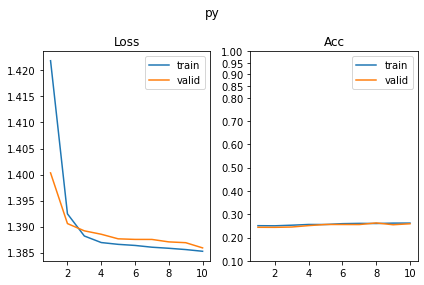

[288/630] px         SUP_[FCN16i223o64_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.58it/s, loss=0.841, acc=0.748]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.38it/s, loss=0.863, acc=0.72]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.86it/s, loss=0.532, acc=0.967]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 101.92it/s, loss=0.558, acc=0.949]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.13it/s, loss=0.359, acc=0.989]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.46it/s, loss=0.407, acc=0.956]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.75it/s, loss=0.281, acc=0.989]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.64it/s, loss=0.306, acc=0.946]    

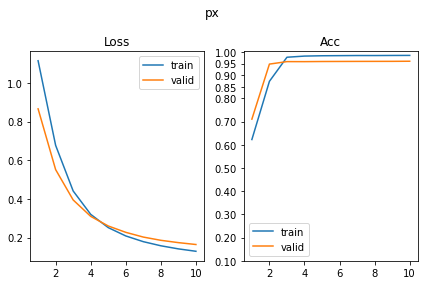

SUP_[FCN16i223o64_d64]_target_[shape]
[289/630] shape      SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.06it/s, loss=1.1, acc=0.857]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.92it/s, loss=1.1, acc=0.788]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.38it/s, loss=0.562, acc=0.992]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.59it/s, loss=0.557, acc=0.98]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.83it/s, loss=0.344, acc=0.99]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.52it/s, loss=0.345, acc=0.983]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.60it/s, loss=0.234, acc=0.993]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 90.03it/s, loss=0.235, acc=0.988]     

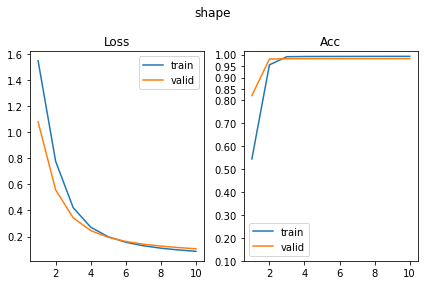

[290/630] scale      SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 82.93it/s, loss=1.09, acc=0.375]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.26it/s, loss=1.1, acc=0.324]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 99.54it/s, loss=1.09, acc=0.384]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.51it/s, loss=1.09, acc=0.407]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.20it/s, loss=1.08, acc=0.397]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.32it/s, loss=1.08, acc=0.427]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.11it/s, loss=1.08, acc=0.397]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.66it/s, loss=1.08, acc=0.439]     

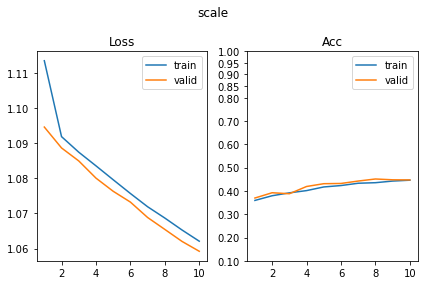

[291/630] color      SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.70it/s, loss=2.1, acc=0.129]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.56it/s, loss=2.09, acc=0.127]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.39it/s, loss=2.08, acc=0.117]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 125.92it/s, loss=2.09, acc=0.102]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.38it/s, loss=2.08, acc=0.132]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.35it/s, loss=2.08, acc=0.141]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.00it/s, loss=2.08, acc=0.106]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 65.95it/s, loss=2.08, acc=0.115]      

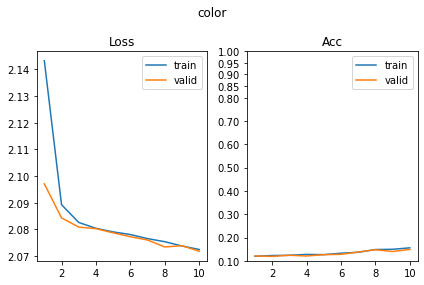

[292/630] angle      SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 104.23it/s, loss=2.8, acc=0.0619]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.86it/s, loss=2.79, acc=0.0659]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.15it/s, loss=2.78, acc=0.0684]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.00it/s, loss=2.78, acc=0.0732]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 82.57it/s, loss=2.77, acc=0.0651]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.31it/s, loss=2.77, acc=0.0707]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.57it/s, loss=2.78, acc=0.0603]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.53it/s, loss=2.77, acc=0.0561]    

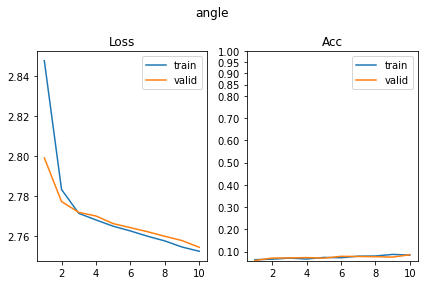

[293/630] py         SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 82.41it/s, loss=1.39, acc=0.254]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 142.39it/s, loss=1.38, acc=0.278]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.05it/s, loss=1.39, acc=0.235]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.60it/s, loss=1.38, acc=0.271]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.52it/s, loss=1.38, acc=0.322]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.27it/s, loss=1.38, acc=0.254]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.53it/s, loss=1.38, acc=0.321]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.32it/s, loss=1.38, acc=0.261]     

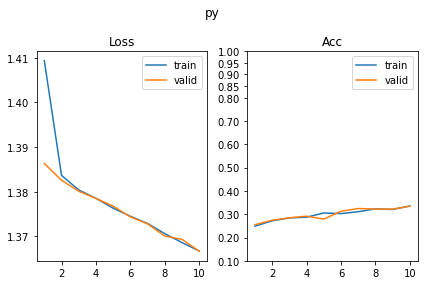

[294/630] px         SUP_[FCN16i223o64_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.47it/s, loss=1.39, acc=0.236]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.42it/s, loss=1.38, acc=0.278]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 68.35it/s, loss=1.38, acc=0.324]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 97.78it/s, loss=1.39, acc=0.234]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.48it/s, loss=1.38, acc=0.256]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.97it/s, loss=1.37, acc=0.298]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.13it/s, loss=1.38, acc=0.283]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.87it/s, loss=1.37, acc=0.332]     

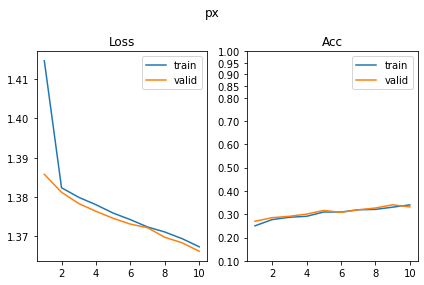

SUP_[FCN16i223o64_d64]_target_[scale]
[295/630] shape      SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 102.32it/s, loss=1.96, acc=0.121]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.39it/s, loss=1.94, acc=0.134]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.60it/s, loss=1.93, acc=0.187]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 95.82it/s, loss=1.92, acc=0.18]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 56.84it/s, loss=1.92, acc=0.168]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 79.88it/s, loss=1.92, acc=0.18]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 71.29it/s, loss=1.9, acc=0.207]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.79it/s, loss=1.89, acc=0.232]     

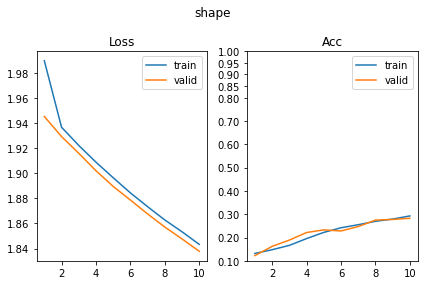

[296/630] scale      SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.04it/s, loss=0.581, acc=0.853]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 105.08it/s, loss=0.652, acc=0.766]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.74it/s, loss=0.4, acc=0.98]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.34it/s, loss=0.469, acc=0.902]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.94it/s, loss=0.29, acc=0.989]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.82it/s, loss=0.387, acc=0.92]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.81it/s, loss=0.252, acc=0.989]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 96.22it/s, loss=0.344, acc=0.929]     

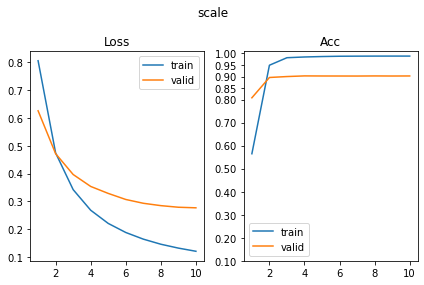

[297/630] color      SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.80it/s, loss=2.07, acc=0.114]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.36it/s, loss=2.07, acc=0.132]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.19it/s, loss=2.06, acc=0.164]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 119.74it/s, loss=2.05, acc=0.178]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.24it/s, loss=2.04, acc=0.179]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.56it/s, loss=2.05, acc=0.166]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.02it/s, loss=2.02, acc=0.207]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.05it/s, loss=2.02, acc=0.212]     

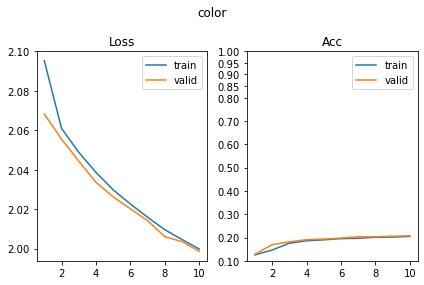

[298/630] angle      SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 105.46it/s, loss=2.78, acc=0.0619]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.42it/s, loss=2.78, acc=0.0512]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.69it/s, loss=2.78, acc=0.0782]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 101.52it/s, loss=2.77, acc=0.0805]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.43it/s, loss=2.77, acc=0.0765]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.03it/s, loss=2.77, acc=0.078]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.19it/s, loss=2.77, acc=0.0668]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.38it/s, loss=2.76, acc=0.0927]    

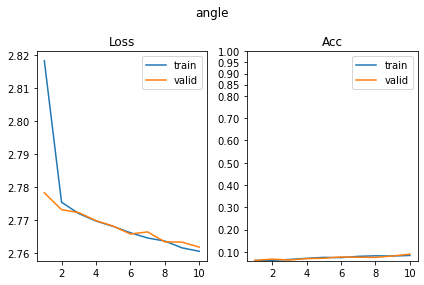

[299/630] py         SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.23it/s, loss=1.39, acc=0.257]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 66.08it/s, loss=1.38, acc=0.283]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.72it/s, loss=1.38, acc=0.269]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.23it/s, loss=1.39, acc=0.259]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.32it/s, loss=1.38, acc=0.264]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.37it/s, loss=1.38, acc=0.315]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.24it/s, loss=1.37, acc=0.314]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.65it/s, loss=1.38, acc=0.276]     

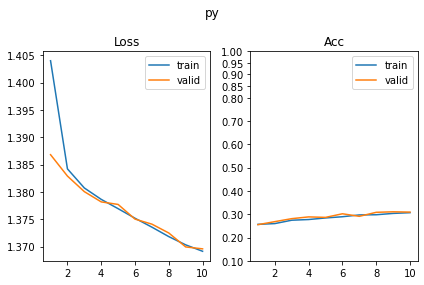

[300/630] px         SUP_[FCN16i223o64_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.97it/s, loss=1.38, acc=0.262]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.53it/s, loss=1.39, acc=0.254]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.43it/s, loss=1.38, acc=0.313]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.27it/s, loss=1.38, acc=0.295]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.47it/s, loss=1.36, acc=0.36]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.08it/s, loss=1.37, acc=0.305]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.23it/s, loss=1.36, acc=0.35]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.51it/s, loss=1.37, acc=0.339]     

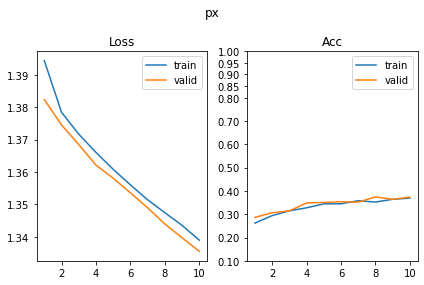

SUP_[FCN16i223o64_d64]_target_[color]
[301/630] shape      SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.71it/s, loss=1.95, acc=0.171]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.95it/s, loss=1.96, acc=0.144]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.79it/s, loss=1.94, acc=0.176]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 101.83it/s, loss=1.94, acc=0.154]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.92it/s, loss=1.94, acc=0.186]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.04it/s, loss=1.94, acc=0.171]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.46it/s, loss=1.94, acc=0.187]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 94.93it/s, loss=1.94, acc=0.232]      

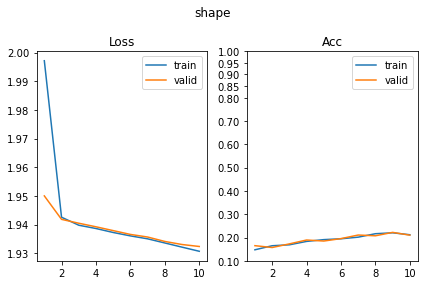

[302/630] scale      SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.61it/s, loss=1.1, acc=0.308]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.95it/s, loss=1.1, acc=0.361]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 106.79it/s, loss=1.1, acc=0.321]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.71it/s, loss=1.1, acc=0.354]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.54it/s, loss=1.1, acc=0.313]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.14it/s, loss=1.1, acc=0.32]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.50it/s, loss=1.1, acc=0.326]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.19it/s, loss=1.1, acc=0.341]      

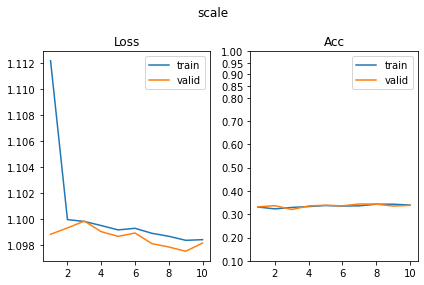

[303/630] color      SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.93it/s, loss=1.07, acc=0.883]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.46it/s, loss=1.07, acc=0.885]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.10it/s, loss=0.379, acc=1]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 111.89it/s, loss=0.369, acc=1]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.07it/s, loss=0.171, acc=1]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.23it/s, loss=0.165, acc=1]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.18it/s, loss=0.104, acc=1]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 95.68it/s, loss=0.101, acc=1]         

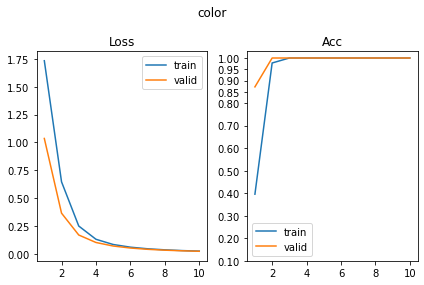

[304/630] angle      SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.23it/s, loss=2.8, acc=0.057]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 138.12it/s, loss=2.78, acc=0.0805]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.54it/s, loss=2.78, acc=0.07]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 108.49it/s, loss=2.78, acc=0.0659]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.52it/s, loss=2.78, acc=0.0586]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.36it/s, loss=2.78, acc=0.0488]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.91it/s, loss=2.78, acc=0.0456]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 107.44it/s, loss=2.78, acc=0.0488]    

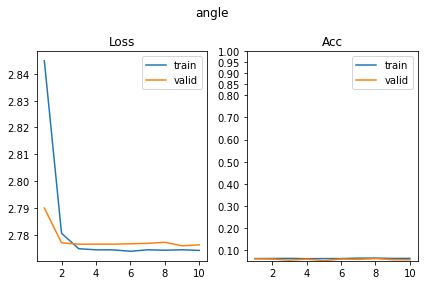

[305/630] py         SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.39it/s, loss=1.42, acc=0.215]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.04it/s, loss=1.4, acc=0.239]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.03it/s, loss=1.39, acc=0.226]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.73it/s, loss=1.39, acc=0.302]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.35it/s, loss=1.38, acc=0.288]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 99.84it/s, loss=1.39, acc=0.227]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.79it/s, loss=1.38, acc=0.3]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.29it/s, loss=1.39, acc=0.273]     

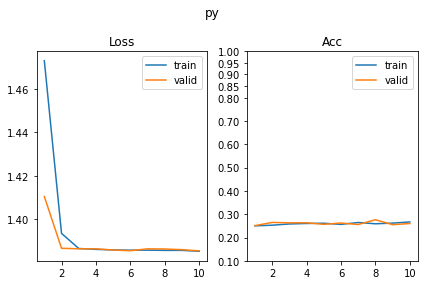

[306/630] px         SUP_[FCN16i223o64_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.46it/s, loss=1.42, acc=0.233]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.13it/s, loss=1.4, acc=0.266]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.50it/s, loss=1.39, acc=0.239]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.55it/s, loss=1.39, acc=0.241]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.14it/s, loss=1.39, acc=0.248]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.33it/s, loss=1.39, acc=0.249]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.00it/s, loss=1.39, acc=0.239]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.86it/s, loss=1.39, acc=0.202]     

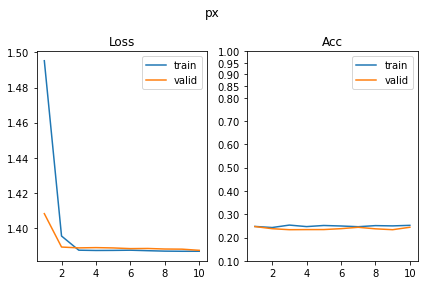

SUP_[FCN16i223o64_d64]_target_[angle]
[307/630] shape      SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.89it/s, loss=1.93, acc=0.208]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.85it/s, loss=1.91, acc=0.222]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.75it/s, loss=1.84, acc=0.28]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 102.87it/s, loss=1.84, acc=0.29]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.98it/s, loss=1.77, acc=0.373]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 96.09it/s, loss=1.79, acc=0.351]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.82it/s, loss=1.74, acc=0.37]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.23it/s, loss=1.74, acc=0.38]      

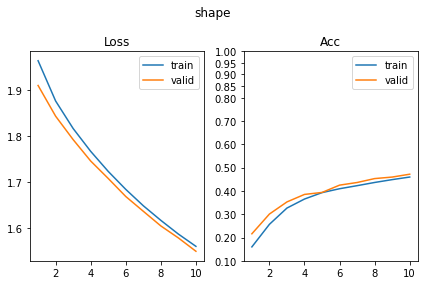

[308/630] scale      SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.82it/s, loss=1.1, acc=0.347]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.55it/s, loss=1.11, acc=0.324]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 99.86it/s, loss=1.1, acc=0.363]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.21it/s, loss=1.1, acc=0.363]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 124.36it/s, loss=1.1, acc=0.329]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.27it/s, loss=1.1, acc=0.359]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.25it/s, loss=1.1, acc=0.347]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 135.43it/s, loss=1.09, acc=0.378]     

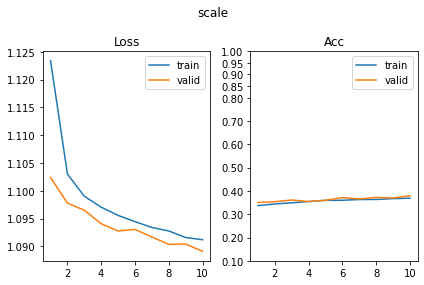

[309/630] color      SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.68it/s, loss=2.13, acc=0.121]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.93it/s, loss=2.12, acc=0.0878]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.39it/s, loss=2.11, acc=0.125]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 123.71it/s, loss=2.09, acc=0.139]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.98it/s, loss=2.09, acc=0.127]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.95it/s, loss=2.09, acc=0.12]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.18it/s, loss=2.09, acc=0.14]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 138.14it/s, loss=2.08, acc=0.115]     

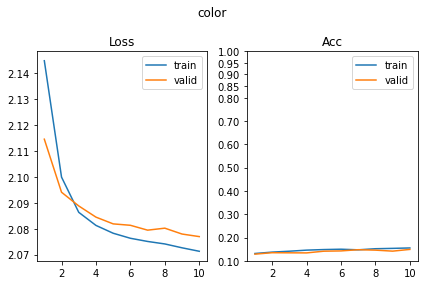

[310/630] angle      SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 114.73it/s, loss=2.07, acc=0.534]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 136.90it/s, loss=2.15, acc=0.437]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.55it/s, loss=1.51, acc=0.756]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 125.60it/s, loss=1.68, acc=0.559]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.96it/s, loss=1.17, acc=0.78]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.98it/s, loss=1.33, acc=0.617]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.57it/s, loss=0.91, acc=0.853]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 126.34it/s, loss=1.18, acc=0.585]     

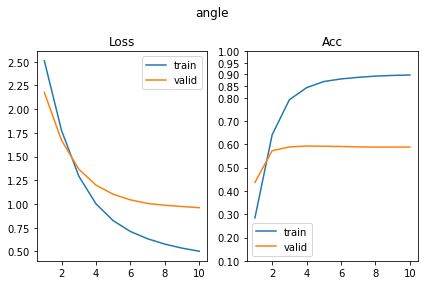

[311/630] py         SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.58it/s, loss=1.42, acc=0.254]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 105.34it/s, loss=1.48, acc=0.19]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.50it/s, loss=1.42, acc=0.256]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 40.78it/s, loss=1.4, acc=0.239]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.01it/s, loss=1.39, acc=0.272]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.59it/s, loss=1.39, acc=0.249]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.64it/s, loss=1.38, acc=0.28]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.03it/s, loss=1.38, acc=0.283]     

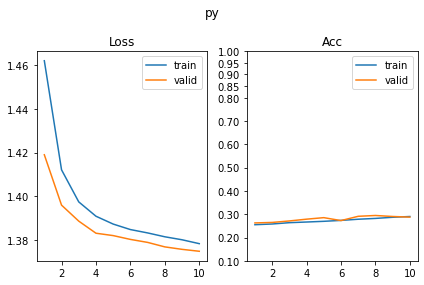

[312/630] px         SUP_[FCN16i223o64_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.21it/s, loss=1.42, acc=0.248]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.29it/s, loss=1.41, acc=0.271]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.78it/s, loss=1.4, acc=0.252]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.14it/s, loss=1.39, acc=0.283]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.79it/s, loss=1.38, acc=0.269]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.20it/s, loss=1.39, acc=0.278]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.50it/s, loss=1.39, acc=0.259]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.00it/s, loss=1.38, acc=0.263]     

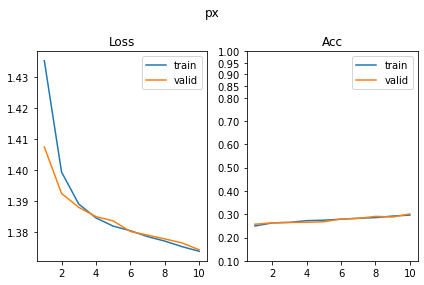

SUP_[FCN16i223o64_d64]_target_[py]
[313/630] shape      SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.55it/s, loss=1.93, acc=0.174]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 96.41it/s, loss=1.94, acc=0.176]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.58it/s, loss=1.92, acc=0.208]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.97it/s, loss=1.92, acc=0.207]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.40it/s, loss=1.9, acc=0.243]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.70it/s, loss=1.91, acc=0.229]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.81it/s, loss=1.88, acc=0.295]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.51it/s, loss=1.88, acc=0.266]     

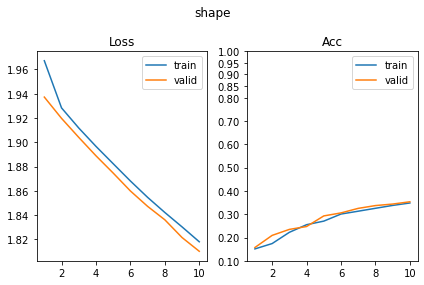

[314/630] scale      SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.57it/s, loss=1.11, acc=0.314]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.32it/s, loss=1.1, acc=0.317]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.39it/s, loss=1.1, acc=0.318]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.56it/s, loss=1.1, acc=0.329]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.09it/s, loss=1.1, acc=0.35]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.42it/s, loss=1.09, acc=0.354]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.94it/s, loss=1.1, acc=0.296]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.41it/s, loss=1.1, acc=0.305]      

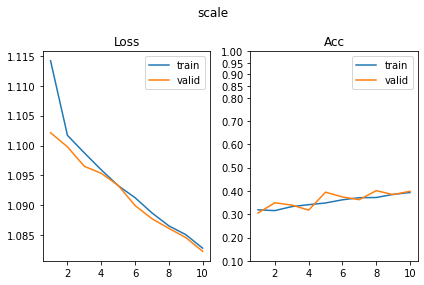

[315/630] color      SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.83it/s, loss=2.09, acc=0.132]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.16it/s, loss=2.09, acc=0.129]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.44it/s, loss=2.09, acc=0.101]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.56it/s, loss=2.09, acc=0.0878]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.33it/s, loss=2.09, acc=0.116]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.65it/s, loss=2.09, acc=0.122]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.06it/s, loss=2.08, acc=0.124]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.99it/s, loss=2.08, acc=0.149]     

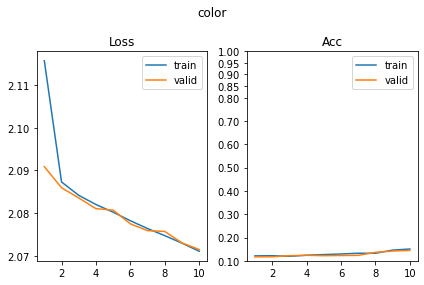

[316/630] angle      SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 105.64it/s, loss=2.78, acc=0.0619]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.07it/s, loss=2.8, acc=0.0463]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.05it/s, loss=2.77, acc=0.0635]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.72it/s, loss=2.77, acc=0.0683]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.88it/s, loss=2.76, acc=0.0879]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.61it/s, loss=2.77, acc=0.0854]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.55it/s, loss=2.76, acc=0.0879]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.15it/s, loss=2.77, acc=0.0756]    

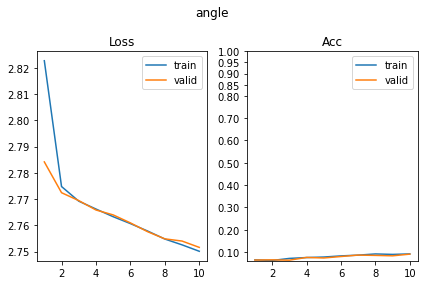

[317/630] py         SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.07it/s, loss=0.658, acc=0.997]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.32it/s, loss=0.651, acc=0.98]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.78it/s, loss=0.341, acc=0.992]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.08it/s, loss=0.357, acc=0.978]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 115.19it/s, loss=0.22, acc=0.997]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.49it/s, loss=0.24, acc=0.98]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.98it/s, loss=0.154, acc=0.995]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.77it/s, loss=0.185, acc=0.98]     

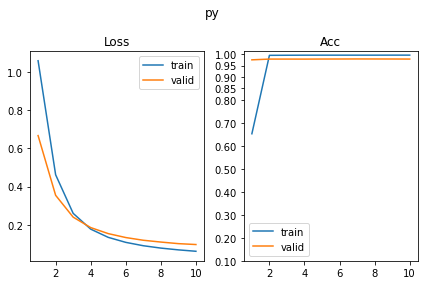

[318/630] px         SUP_[FCN16i223o64_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.51it/s, loss=1.39, acc=0.256]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.11it/s, loss=1.39, acc=0.244]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.18it/s, loss=1.38, acc=0.282]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.28it/s, loss=1.39, acc=0.276]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.29it/s, loss=1.38, acc=0.274]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.91it/s, loss=1.39, acc=0.278]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 97.74it/s, loss=1.38, acc=0.274]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.81it/s, loss=1.38, acc=0.261]     

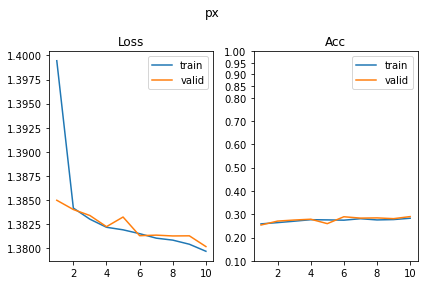

SUP_[FCN16i223o64_d64]_target_[px]
[319/630] shape      SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 111.44it/s, loss=1.96, acc=0.186]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 60.20it/s, loss=1.94, acc=0.154]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.37it/s, loss=1.93, acc=0.233]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.39it/s, loss=1.94, acc=0.198]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.51it/s, loss=1.91, acc=0.246]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.71it/s, loss=1.91, acc=0.229]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.12it/s, loss=1.89, acc=0.257]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.15it/s, loss=1.9, acc=0.241]      

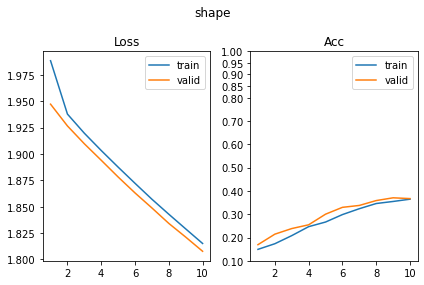

[320/630] scale      SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.32it/s, loss=1.11, acc=0.3]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.54it/s, loss=1.1, acc=0.337]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.25it/s, loss=1.1, acc=0.296]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 56.99it/s, loss=1.1, acc=0.327]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 109.63it/s, loss=1.09, acc=0.376]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.70it/s, loss=1.09, acc=0.361]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.74it/s, loss=1.09, acc=0.357]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.19it/s, loss=1.09, acc=0.378]     

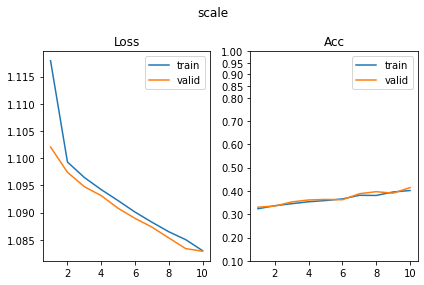

[321/630] color      SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.00it/s, loss=2.07, acc=0.15]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.34it/s, loss=2.08, acc=0.163]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.69it/s, loss=2.08, acc=0.147]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 131.63it/s, loss=2.07, acc=0.146]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.60it/s, loss=2.07, acc=0.163]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.14it/s, loss=2.07, acc=0.171]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.64it/s, loss=2.08, acc=0.124]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.52it/s, loss=2.07, acc=0.144]     

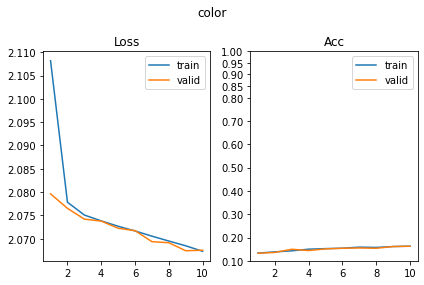

[322/630] angle      SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.88it/s, loss=2.78, acc=0.0635]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 90.25it/s, loss=2.77, acc=0.0951]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 68.35it/s, loss=2.78, acc=0.0733]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 85.43it/s, loss=2.78, acc=0.0463]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 63.88it/s, loss=2.76, acc=0.0847]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.01it/s, loss=2.78, acc=0.0707]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.65it/s, loss=2.76, acc=0.0586]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 102.48it/s, loss=2.77, acc=0.0659]    

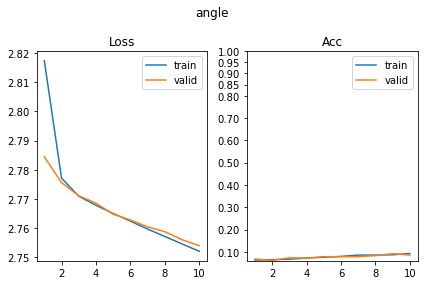

[323/630] py         SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.97it/s, loss=1.38, acc=0.259]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.07it/s, loss=1.39, acc=0.259]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 116.00it/s, loss=1.39, acc=0.27]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.43it/s, loss=1.39, acc=0.256]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.29it/s, loss=1.38, acc=0.252]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.86it/s, loss=1.38, acc=0.229]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.95it/s, loss=1.39, acc=0.238]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.39it/s, loss=1.38, acc=0.259]     

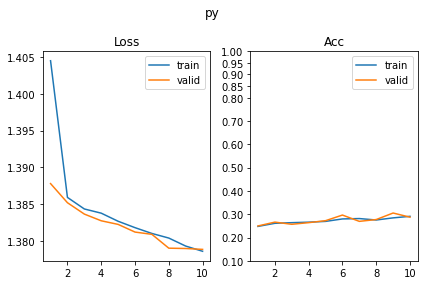

[324/630] px         SUP_[FCN16i223o64_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.21it/s, loss=0.639, acc=0.985]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.34it/s, loss=0.632, acc=0.976]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.20it/s, loss=0.34, acc=0.995]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 132.12it/s, loss=0.384, acc=0.976]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.04it/s, loss=0.216, acc=0.995]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.94it/s, loss=0.256, acc=0.968]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.59it/s, loss=0.169, acc=0.995]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.56it/s, loss=0.202, acc=0.976]    

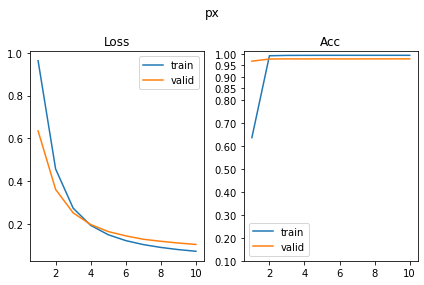

SUP_[FCN16i223o64_d128]_target_[shape]
[325/630] shape      SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 115.04it/s, loss=0.646, acc=0.998]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.74it/s, loss=0.632, acc=0.978]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.27it/s, loss=0.232, acc=1]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.55it/s, loss=0.266, acc=0.99]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.94it/s, loss=0.149, acc=0.993]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.85it/s, loss=0.157, acc=0.99]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.17it/s, loss=0.0986, acc=0.998]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.81it/s, loss=0.14, acc=0.976]     

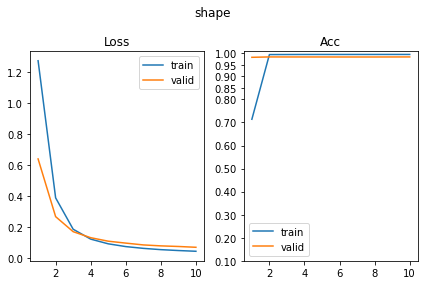

[326/630] scale      SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.32it/s, loss=1.11, acc=0.313]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 99.58it/s, loss=1.1, acc=0.349]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.93it/s, loss=1.08, acc=0.44]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.39it/s, loss=1.07, acc=0.427]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 98.32it/s, loss=1.07, acc=0.474]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.12it/s, loss=1.08, acc=0.405]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.45it/s, loss=1.06, acc=0.464]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.77it/s, loss=1.06, acc=0.459]     

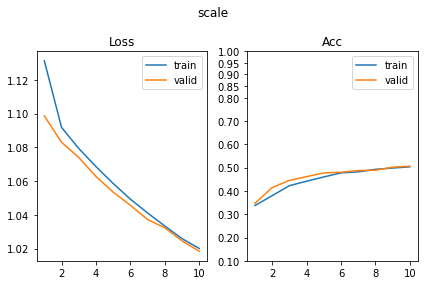

[327/630] color      SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 67.59it/s, loss=2.08, acc=0.138]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 90.88it/s, loss=2.08, acc=0.0951]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.03it/s, loss=2.08, acc=0.125]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.35it/s, loss=2.07, acc=0.178]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.82it/s, loss=2.08, acc=0.124]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.41it/s, loss=2.07, acc=0.178]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 71.67it/s, loss=2.07, acc=0.122]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.80it/s, loss=2.07, acc=0.146]     

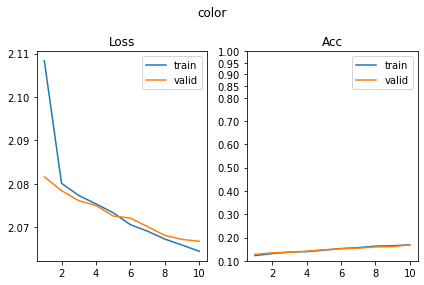

[328/630] angle      SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 100.90it/s, loss=2.77, acc=0.0814]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.19it/s, loss=2.77, acc=0.0756]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.95it/s, loss=2.76, acc=0.0651]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.17it/s, loss=2.77, acc=0.0439]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 68.64it/s, loss=2.75, acc=0.0798]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 83.97it/s, loss=2.75, acc=0.0976]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.03it/s, loss=2.74, acc=0.0814]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.36it/s, loss=2.75, acc=0.0707]    

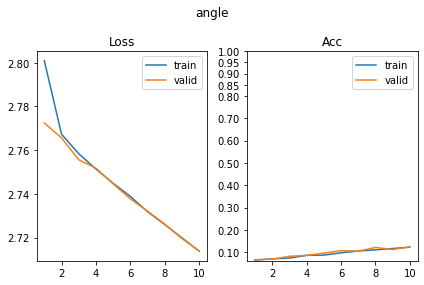

[329/630] py         SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.06it/s, loss=1.39, acc=0.218]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.41it/s, loss=1.39, acc=0.249]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 103.42it/s, loss=1.38, acc=0.293]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.11it/s, loss=1.37, acc=0.298]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 104.58it/s, loss=1.38, acc=0.27]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.21it/s, loss=1.38, acc=0.293]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.99it/s, loss=1.36, acc=0.337]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.48it/s, loss=1.37, acc=0.349]     

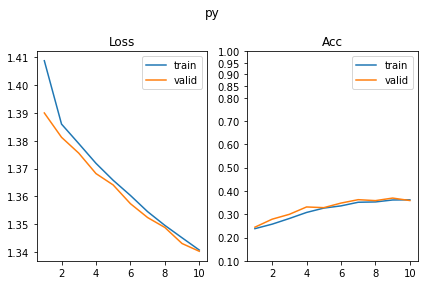

[330/630] px         SUP_[FCN16i223o64_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.86it/s, loss=1.38, acc=0.264]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.33it/s, loss=1.38, acc=0.276]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.36it/s, loss=1.38, acc=0.269]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 92.19it/s, loss=1.38, acc=0.283]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.22it/s, loss=1.38, acc=0.269]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.34it/s, loss=1.38, acc=0.263]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.39it/s, loss=1.37, acc=0.306]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 140.17it/s, loss=1.37, acc=0.278]     

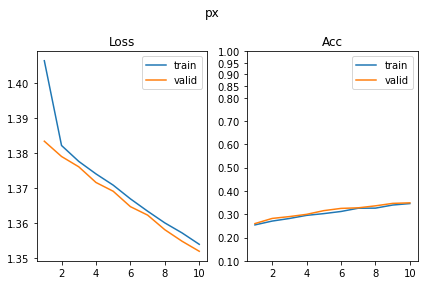

SUP_[FCN16i223o64_d128]_target_[scale]
[331/630] shape      SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.15it/s, loss=1.91, acc=0.199]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.46it/s, loss=1.9, acc=0.232]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.96it/s, loss=1.87, acc=0.279]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 132.90it/s, loss=1.86, acc=0.322]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.19it/s, loss=1.83, acc=0.327]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 133.21it/s, loss=1.83, acc=0.28]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.94it/s, loss=1.79, acc=0.37]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.29it/s, loss=1.81, acc=0.38]      

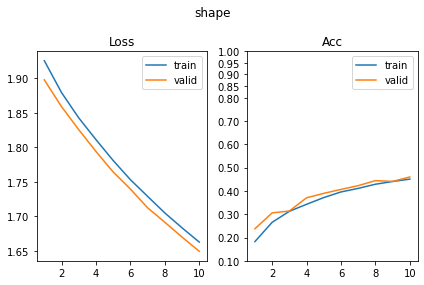

[332/630] scale      SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.80it/s, loss=0.459, acc=0.961]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.37it/s, loss=0.47, acc=0.934]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.28it/s, loss=0.265, acc=0.993]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.16it/s, loss=0.306, acc=0.949]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.47it/s, loss=0.185, acc=0.987]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 65.96it/s, loss=0.238, acc=0.946]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.66it/s, loss=0.162, acc=0.99]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 92.06it/s, loss=0.219, acc=0.946]     

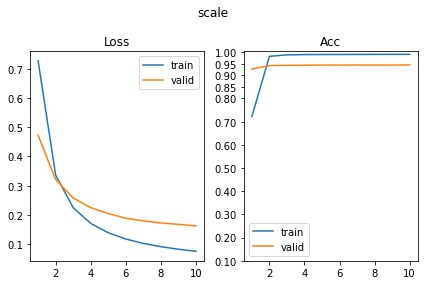

[333/630] color      SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.70it/s, loss=2.07, acc=0.156]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.45it/s, loss=2.07, acc=0.146]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.29it/s, loss=2.05, acc=0.151]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 123.14it/s, loss=2.06, acc=0.159]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.85it/s, loss=2.05, acc=0.171]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 95.01it/s, loss=2.05, acc=0.154]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.50it/s, loss=2.05, acc=0.169]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.27it/s, loss=2.04, acc=0.224]     

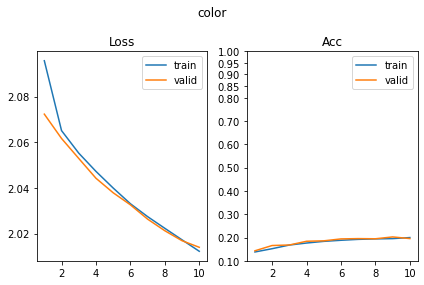

[334/630] angle      SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.83it/s, loss=2.77, acc=0.0603]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.24it/s, loss=2.77, acc=0.0854]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.35it/s, loss=2.76, acc=0.0586]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.96it/s, loss=2.77, acc=0.0683]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.43it/s, loss=2.77, acc=0.0798]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.08it/s, loss=2.76, acc=0.1]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.05it/s, loss=2.75, acc=0.0912]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.25it/s, loss=2.76, acc=0.0756]    

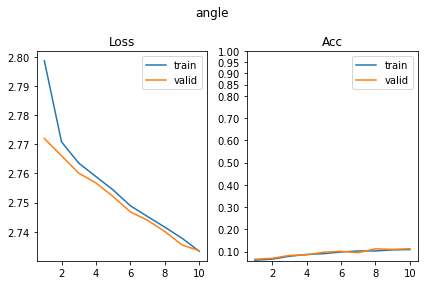

[335/630] py         SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.93it/s, loss=1.37, acc=0.293]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.45it/s, loss=1.37, acc=0.305]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 122.37it/s, loss=1.36, acc=0.313]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.18it/s, loss=1.34, acc=0.337]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 113.59it/s, loss=1.35, acc=0.347]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.17it/s, loss=1.34, acc=0.376]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.65it/s, loss=1.34, acc=0.363]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.45it/s, loss=1.34, acc=0.344]     

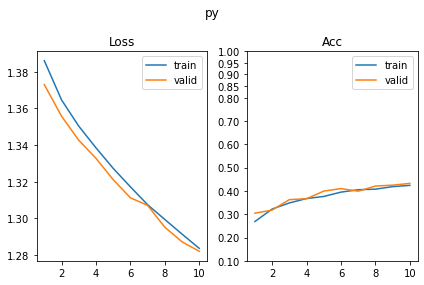

[336/630] px         SUP_[FCN16i223o64_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 71.49it/s, loss=1.37, acc=0.267]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.09it/s, loss=1.37, acc=0.32]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.92it/s, loss=1.36, acc=0.339]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.25it/s, loss=1.36, acc=0.371]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 72.73it/s, loss=1.35, acc=0.358]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.42it/s, loss=1.35, acc=0.363]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.38it/s, loss=1.35, acc=0.334]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.53it/s, loss=1.33, acc=0.429]     

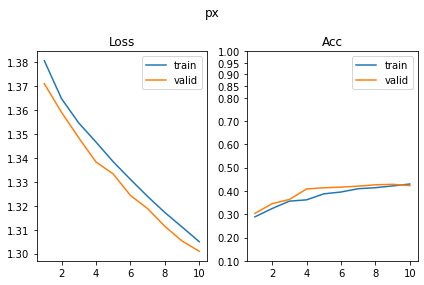

SUP_[FCN16i223o64_d128]_target_[color]
[337/630] shape      SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.83it/s, loss=1.95, acc=0.155]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 50.45it/s, loss=1.94, acc=0.161]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.87it/s, loss=1.94, acc=0.186]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.53it/s, loss=1.94, acc=0.159]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.46it/s, loss=1.94, acc=0.161]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.31it/s, loss=1.93, acc=0.159]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.51it/s, loss=1.93, acc=0.223]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 99.23it/s, loss=1.93, acc=0.22]       

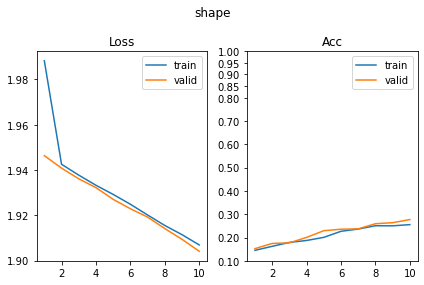

[338/630] scale      SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.63it/s, loss=1.1, acc=0.331]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 117.47it/s, loss=1.1, acc=0.361]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.19it/s, loss=1.1, acc=0.355]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.77it/s, loss=1.09, acc=0.405]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.03it/s, loss=1.09, acc=0.378]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.72it/s, loss=1.1, acc=0.317]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.98it/s, loss=1.09, acc=0.384]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 98.86it/s, loss=1.09, acc=0.366]      

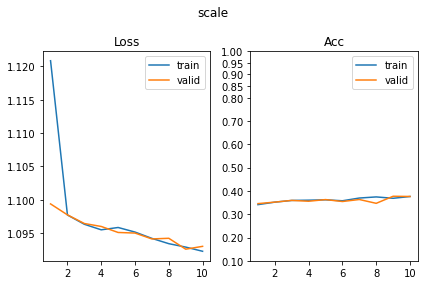

[339/630] color      SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.71it/s, loss=0.371, acc=1]                                              
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 68.49it/s, loss=0.359, acc=0.998]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 58.61it/s, loss=0.095, acc=1]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.17it/s, loss=0.0926, acc=1]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 72.48it/s, loss=0.0508, acc=1]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 88.67it/s, loss=0.0506, acc=1]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 59.56it/s, loss=0.034, acc=1]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 107.61it/s, loss=0.0332, acc=1]       

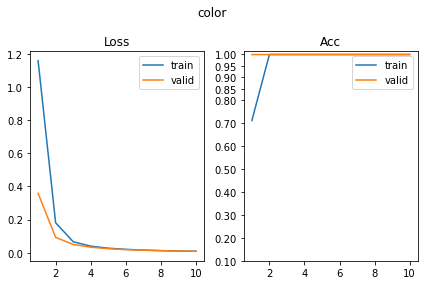

[340/630] angle      SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.13it/s, loss=2.78, acc=0.0635]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 94.20it/s, loss=2.78, acc=0.0561]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.50it/s, loss=2.78, acc=0.0521]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.49it/s, loss=2.78, acc=0.0805]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.66it/s, loss=2.77, acc=0.0554]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.95it/s, loss=2.77, acc=0.0732]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.85it/s, loss=2.77, acc=0.0521]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 75.40it/s, loss=2.78, acc=0.0634]     

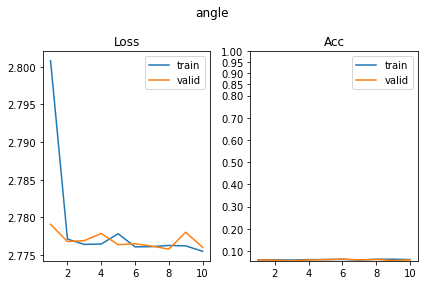

[341/630] py         SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 71.06it/s, loss=1.39, acc=0.235]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.81it/s, loss=1.39, acc=0.239]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.47it/s, loss=1.39, acc=0.243]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.82it/s, loss=1.39, acc=0.276]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.09it/s, loss=1.39, acc=0.248]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.04it/s, loss=1.38, acc=0.29]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 71.27it/s, loss=1.38, acc=0.254]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.80it/s, loss=1.39, acc=0.215]     

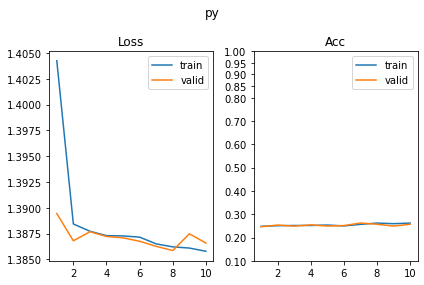

[342/630] px         SUP_[FCN16i223o64_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 65.41it/s, loss=1.38, acc=0.288]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.81it/s, loss=1.39, acc=0.251]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 70.22it/s, loss=1.39, acc=0.283]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 132.43it/s, loss=1.39, acc=0.234]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.91it/s, loss=1.39, acc=0.252]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 92.43it/s, loss=1.39, acc=0.229]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.38it/s, loss=1.39, acc=0.246]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.61it/s, loss=1.39, acc=0.244]      

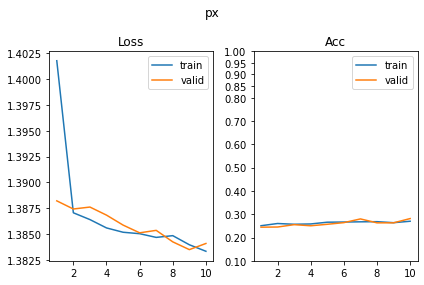

SUP_[FCN16i223o64_d128]_target_[angle]
[343/630] shape      SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 72.53it/s, loss=1.8, acc=0.344]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.24it/s, loss=1.79, acc=0.361]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.13it/s, loss=1.68, acc=0.441]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.98it/s, loss=1.68, acc=0.395]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.72it/s, loss=1.59, acc=0.48]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 103.65it/s, loss=1.6, acc=0.498]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.82it/s, loss=1.52, acc=0.498]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.98it/s, loss=1.53, acc=0.483]     

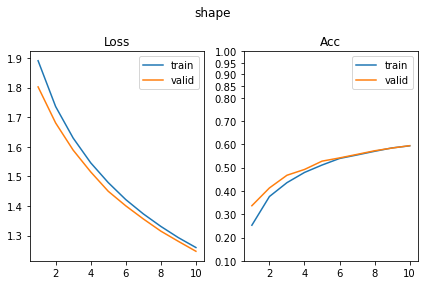

[344/630] scale      SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.63it/s, loss=1.1, acc=0.378]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.36it/s, loss=1.11, acc=0.307]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 100.85it/s, loss=1.08, acc=0.409]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 51.74it/s, loss=1.1, acc=0.366]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.93it/s, loss=1.1, acc=0.371]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.49it/s, loss=1.09, acc=0.371]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.50it/s, loss=1.09, acc=0.363]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.32it/s, loss=1.08, acc=0.39]      

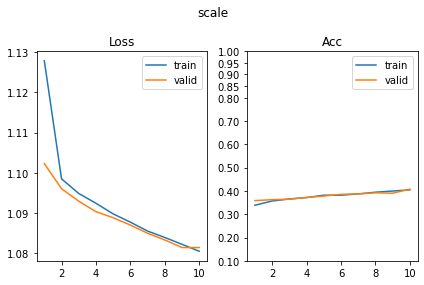

[345/630] color      SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.75it/s, loss=2.08, acc=0.147]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.31it/s, loss=2.07, acc=0.163]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.95it/s, loss=2.07, acc=0.145]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.21it/s, loss=2.09, acc=0.141]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 98.58it/s, loss=2.06, acc=0.155]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 136.51it/s, loss=2.06, acc=0.183]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.27it/s, loss=2.05, acc=0.194]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.97it/s, loss=2.06, acc=0.193]     

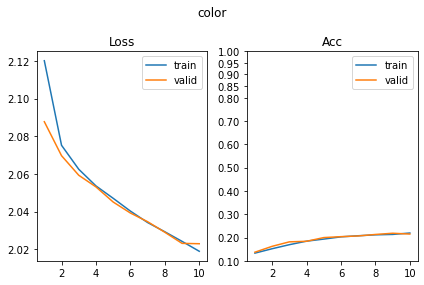

[346/630] angle      SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.56it/s, loss=1.77, acc=0.712]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.47it/s, loss=1.9, acc=0.534]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 69.96it/s, loss=1.16, acc=0.842]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.63it/s, loss=1.37, acc=0.585]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.24it/s, loss=0.846, acc=0.865]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 89.87it/s, loss=1.2, acc=0.576]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.91it/s, loss=0.727, acc=0.883]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.61it/s, loss=1.14, acc=0.561]     

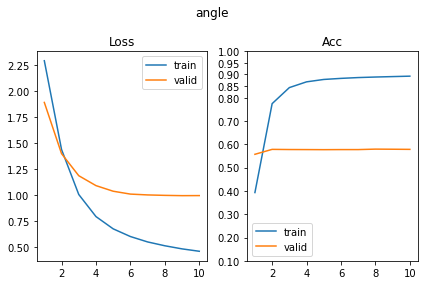

[347/630] py         SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.67it/s, loss=1.4, acc=0.228]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.62it/s, loss=1.4, acc=0.234]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 105.49it/s, loss=1.38, acc=0.277]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.79it/s, loss=1.39, acc=0.239]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.18it/s, loss=1.37, acc=0.303]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.95it/s, loss=1.38, acc=0.256]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.61it/s, loss=1.38, acc=0.305]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.61it/s, loss=1.38, acc=0.329]     

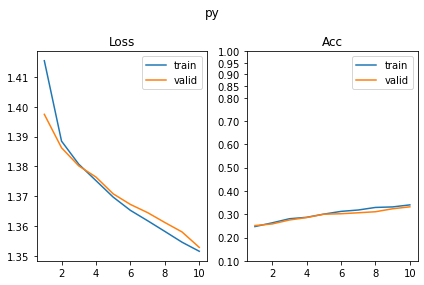

[348/630] px         SUP_[FCN16i223o64_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 62.68it/s, loss=1.39, acc=0.267]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.71it/s, loss=1.39, acc=0.259]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 100.13it/s, loss=1.38, acc=0.318]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.32it/s, loss=1.39, acc=0.276]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.20it/s, loss=1.38, acc=0.264]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 130.45it/s, loss=1.37, acc=0.3]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.56it/s, loss=1.37, acc=0.292]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.51it/s, loss=1.38, acc=0.266]     

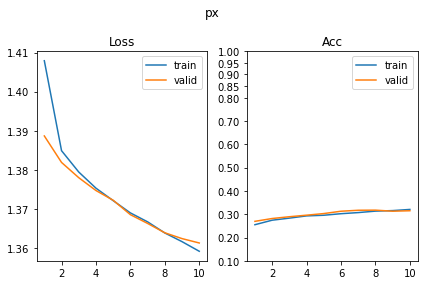

SUP_[FCN16i223o64_d128]_target_[py]
[349/630] shape      SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.34it/s, loss=1.91, acc=0.22]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 103.82it/s, loss=1.9, acc=0.183]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 55.19it/s, loss=1.87, acc=0.244]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 73.77it/s, loss=1.88, acc=0.222]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.42it/s, loss=1.85, acc=0.274]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.64it/s, loss=1.82, acc=0.334]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.65it/s, loss=1.8, acc=0.386]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.98it/s, loss=1.82, acc=0.344]     

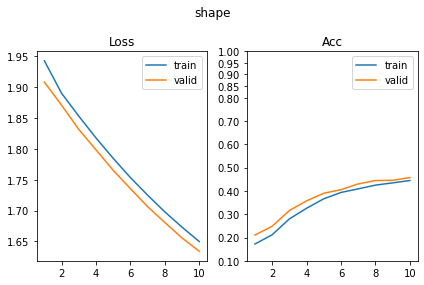

[350/630] scale      SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.10it/s, loss=1.1, acc=0.301]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 98.32it/s, loss=1.1, acc=0.359]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.87it/s, loss=1.09, acc=0.375]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.91it/s, loss=1.1, acc=0.356]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 108.51it/s, loss=1.09, acc=0.386]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.13it/s, loss=1.09, acc=0.407]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.19it/s, loss=1.09, acc=0.383]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.49it/s, loss=1.08, acc=0.446]     

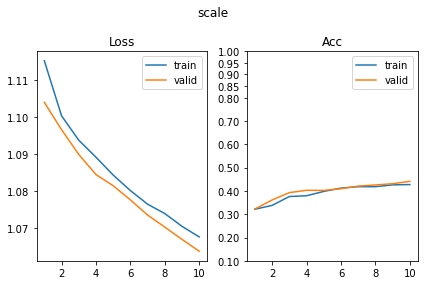

[351/630] color      SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.23it/s, loss=2.08, acc=0.121]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.59it/s, loss=2.07, acc=0.127]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.07it/s, loss=2.07, acc=0.148]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 93.81it/s, loss=2.08, acc=0.137]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.82it/s, loss=2.08, acc=0.142]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.10it/s, loss=2.07, acc=0.129]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.24it/s, loss=2.07, acc=0.151]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.09it/s, loss=2.07, acc=0.149]     

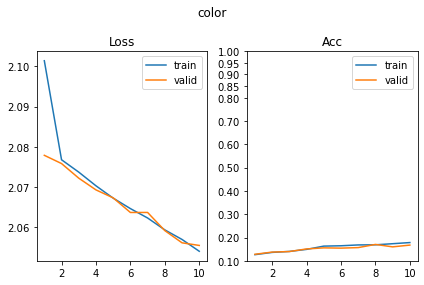

[352/630] angle      SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.66it/s, loss=2.77, acc=0.07]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 52.25it/s, loss=2.77, acc=0.061]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.19it/s, loss=2.76, acc=0.0977]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.75it/s, loss=2.76, acc=0.0902]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.53it/s, loss=2.75, acc=0.0831]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.01it/s, loss=2.76, acc=0.0805]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.70it/s, loss=2.76, acc=0.0977]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 97.96it/s, loss=2.75, acc=0.0902]     

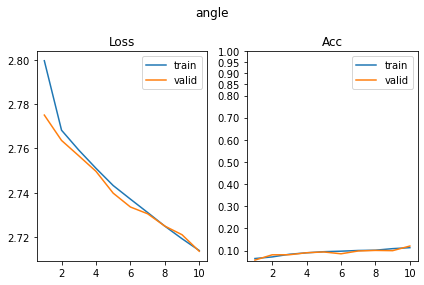

[353/630] py         SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.19it/s, loss=0.357, acc=0.992]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.95it/s, loss=0.349, acc=0.976]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.53it/s, loss=0.183, acc=0.997]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.53it/s, loss=0.217, acc=0.971]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.98it/s, loss=0.13, acc=0.998]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 88.90it/s, loss=0.152, acc=0.971]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.86it/s, loss=0.0969, acc=0.997]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 91.07it/s, loss=0.134, acc=0.971]     

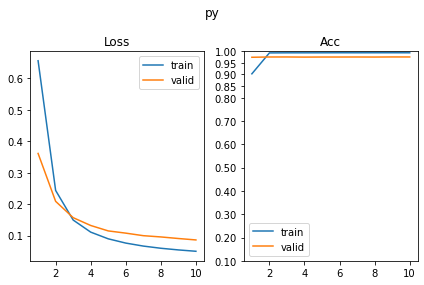

[354/630] px         SUP_[FCN16i223o64_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 65.02it/s, loss=1.39, acc=0.231]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 93.82it/s, loss=1.39, acc=0.232]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.20it/s, loss=1.38, acc=0.293]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.99it/s, loss=1.39, acc=0.268]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.05it/s, loss=1.38, acc=0.274]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.97it/s, loss=1.39, acc=0.251]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.25it/s, loss=1.38, acc=0.283]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.42it/s, loss=1.39, acc=0.251]     

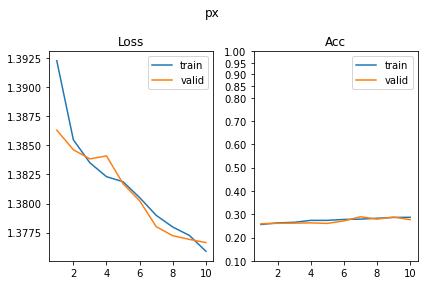

SUP_[FCN16i223o64_d128]_target_[px]
[355/630] shape      SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.99it/s, loss=1.92, acc=0.21]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 49.13it/s, loss=1.92, acc=0.176]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 96.13it/s, loss=1.89, acc=0.256]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 58.90it/s, loss=1.89, acc=0.254]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 68.22it/s, loss=1.87, acc=0.295]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.61it/s, loss=1.86, acc=0.283]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.86it/s, loss=1.83, acc=0.301]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.93it/s, loss=1.82, acc=0.366]     

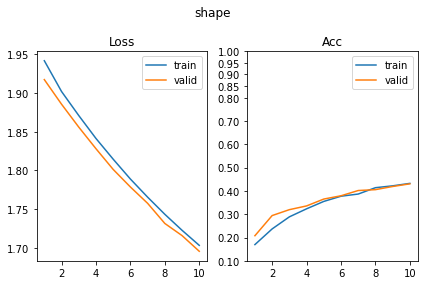

[356/630] scale      SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.58it/s, loss=1.08, acc=0.428]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.53it/s, loss=1.09, acc=0.395]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.97it/s, loss=1.09, acc=0.368]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.86it/s, loss=1.1, acc=0.32]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 64.31it/s, loss=1.08, acc=0.406]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.89it/s, loss=1.08, acc=0.393]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 96.64it/s, loss=1.09, acc=0.378]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 107.09it/s, loss=1.08, acc=0.388]     

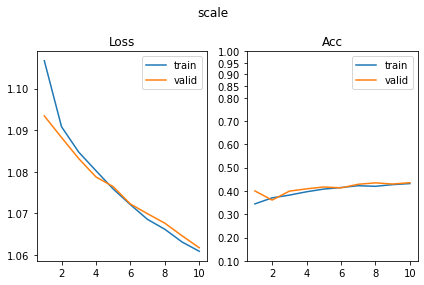

[357/630] color      SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.29it/s, loss=2.09, acc=0.109]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.93it/s, loss=2.08, acc=0.146]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.74it/s, loss=2.09, acc=0.124]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 131.80it/s, loss=2.08, acc=0.115]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.51it/s, loss=2.08, acc=0.142]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 91.94it/s, loss=2.08, acc=0.139]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 66.68it/s, loss=2.08, acc=0.107]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.53it/s, loss=2.08, acc=0.117]     

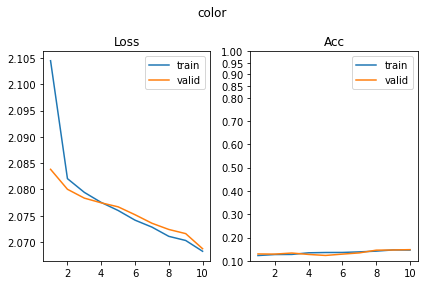

[358/630] angle      SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.34it/s, loss=2.77, acc=0.0521]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.14it/s, loss=2.77, acc=0.0829]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 41.77it/s, loss=2.76, acc=0.0814]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 76.98it/s, loss=2.76, acc=0.0829]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 71.25it/s, loss=2.77, acc=0.0619]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.05it/s, loss=2.76, acc=0.0854]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.58it/s, loss=2.75, acc=0.0945]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 73.31it/s, loss=2.76, acc=0.1]        

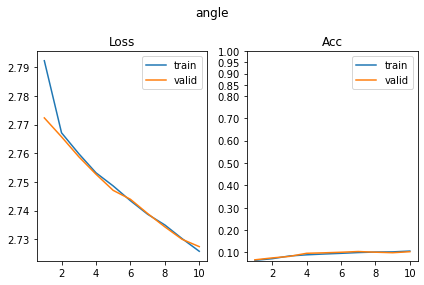

[359/630] py         SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.47it/s, loss=1.39, acc=0.243]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.03it/s, loss=1.39, acc=0.249]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 96.44it/s, loss=1.38, acc=0.277]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.07it/s, loss=1.39, acc=0.28]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.32it/s, loss=1.39, acc=0.231]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.45it/s, loss=1.39, acc=0.239]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.70it/s, loss=1.38, acc=0.257]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 84.73it/s, loss=1.39, acc=0.239]      

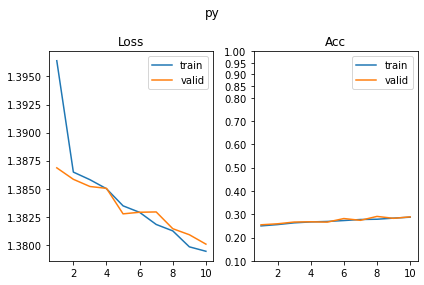

[360/630] px         SUP_[FCN16i223o64_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.61it/s, loss=0.324, acc=0.997]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 115.09it/s, loss=0.354, acc=0.976]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.63it/s, loss=0.152, acc=0.992]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 125.13it/s, loss=0.186, acc=0.973]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.25it/s, loss=0.102, acc=0.997]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.48it/s, loss=0.157, acc=0.966]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.47it/s, loss=0.0799, acc=0.998]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.02it/s, loss=0.115, acc=0.978]    

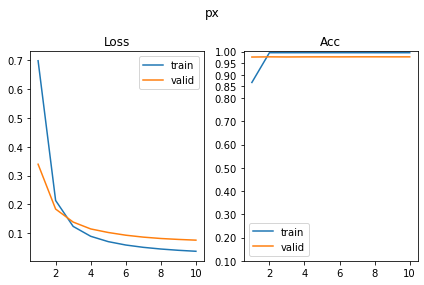

SUP_[FCN32i223o128_d8]_target_[shape]
[361/630] shape      SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 115.02it/s, loss=1.92, acc=0.204]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 135.40it/s, loss=1.89, acc=0.212]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.82it/s, loss=1.65, acc=0.305]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 123.50it/s, loss=1.64, acc=0.312]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.01it/s, loss=1.39, acc=0.313]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.97it/s, loss=1.42, acc=0.3]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.41it/s, loss=1.19, acc=0.537]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.17it/s, loss=1.14, acc=0.578]     

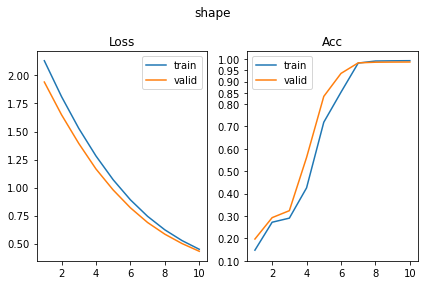

[362/630] scale      SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.83it/s, loss=1.25, acc=0.352]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.15it/s, loss=1.26, acc=0.334]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.27it/s, loss=1.14, acc=0.36]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 49.99it/s, loss=1.18, acc=0.29]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.91it/s, loss=1.18, acc=0.322]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.58it/s, loss=1.15, acc=0.334]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.61it/s, loss=1.12, acc=0.342]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.56it/s, loss=1.12, acc=0.341]     

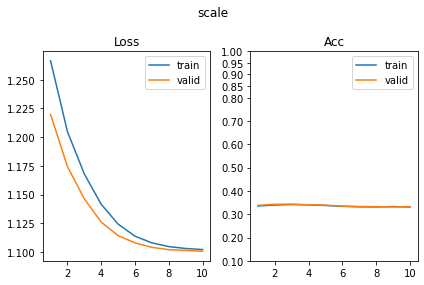

[363/630] color      SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.57it/s, loss=2.33, acc=0.138]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.04it/s, loss=2.31, acc=0.132]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.43it/s, loss=2.24, acc=0.143]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.88it/s, loss=2.24, acc=0.122]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.39it/s, loss=2.19, acc=0.134]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.32it/s, loss=2.21, acc=0.127]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.54it/s, loss=2.16, acc=0.109]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.86it/s, loss=2.15, acc=0.149]     

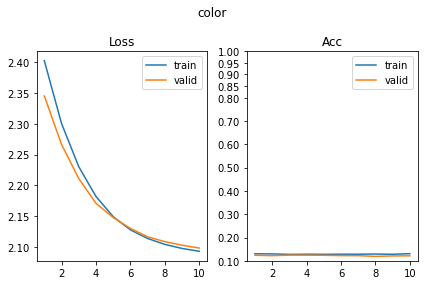

[364/630] angle      SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 98.87it/s, loss=3.14, acc=0.0586]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 56.15it/s, loss=3.27, acc=0.0659]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 102.56it/s, loss=3.07, acc=0.0521]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 136.22it/s, loss=3.05, acc=0.0488]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.74it/s, loss=2.94, acc=0.0635]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 135.42it/s, loss=3.02, acc=0.0585]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.26it/s, loss=2.91, acc=0.057]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.73it/s, loss=2.9, acc=0.0683]      

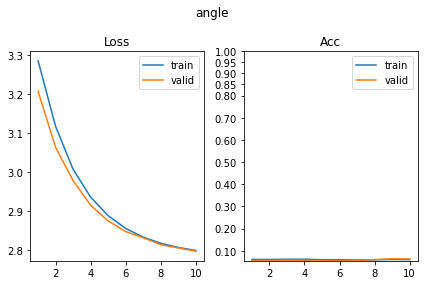

[365/630] py         SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.79it/s, loss=1.7, acc=0.254]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 135.78it/s, loss=1.75, acc=0.249]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 96.71it/s, loss=1.63, acc=0.259]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.65it/s, loss=1.58, acc=0.28]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 116.34it/s, loss=1.52, acc=0.287]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.12it/s, loss=1.52, acc=0.259]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.11it/s, loss=1.53, acc=0.215]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 137.24it/s, loss=1.45, acc=0.298]     

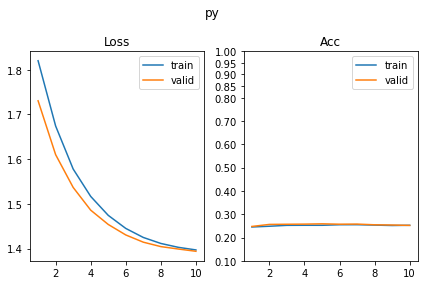

[366/630] px         SUP_[FCN32i223o128_d8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.23it/s, loss=1.71, acc=0.249]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.49it/s, loss=1.71, acc=0.239]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.77it/s, loss=1.62, acc=0.251]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 139.62it/s, loss=1.71, acc=0.217]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.41it/s, loss=1.56, acc=0.248]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.28it/s, loss=1.52, acc=0.266]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.99it/s, loss=1.49, acc=0.264]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.90it/s, loss=1.5, acc=0.215]      

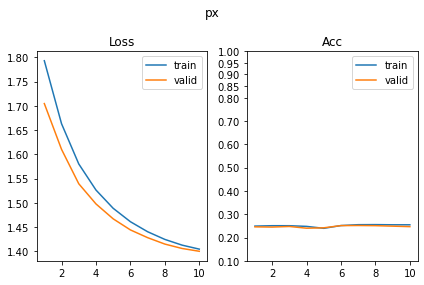

SUP_[FCN32i223o128_d8]_target_[scale]
[367/630] shape      SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.79it/s, loss=2.17, acc=0.129]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.31it/s, loss=2.22, acc=0.134]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 127.54it/s, loss=2.08, acc=0.13]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.61it/s, loss=2.12, acc=0.12]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 110.83it/s, loss=2.05, acc=0.125]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 132.47it/s, loss=2.05, acc=0.124]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.05it/s, loss=2.01, acc=0.121]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.82it/s, loss=1.99, acc=0.129]     

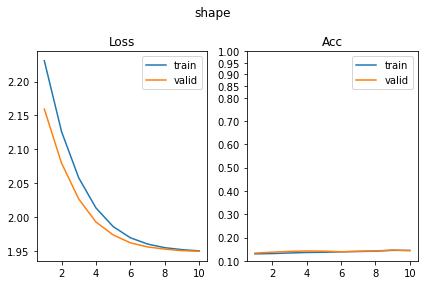

[368/630] scale      SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.15it/s, loss=1.2, acc=0.485]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.79it/s, loss=1.27, acc=0.466]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.19it/s, loss=0.998, acc=0.684]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 82.52it/s, loss=0.968, acc=0.685]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.72it/s, loss=0.824, acc=0.671]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.82it/s, loss=0.835, acc=0.656]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.38it/s, loss=0.669, acc=0.663]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.93it/s, loss=0.645, acc=0.724]    

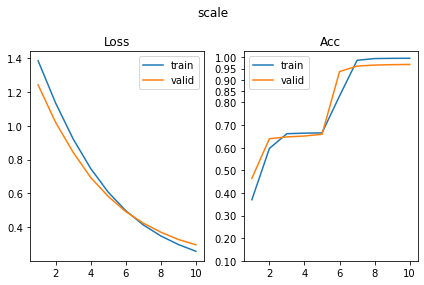

[369/630] color      SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.79it/s, loss=2.34, acc=0.107]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 70.08it/s, loss=2.29, acc=0.134]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 67.98it/s, loss=2.21, acc=0.124]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 98.99it/s, loss=2.22, acc=0.12]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 82.94it/s, loss=2.18, acc=0.116]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.55it/s, loss=2.16, acc=0.129]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 67.34it/s, loss=2.12, acc=0.127]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 67.76it/s, loss=2.14, acc=0.0878]     

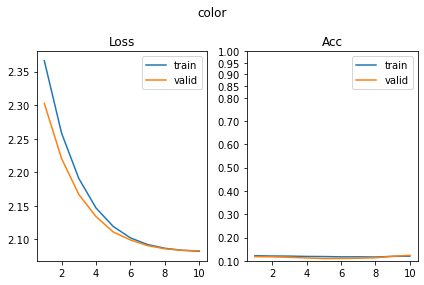

[370/630] angle      SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.33it/s, loss=3.05, acc=0.0684]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.27it/s, loss=3.06, acc=0.061]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 106.44it/s, loss=3.01, acc=0.0456]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.25it/s, loss=2.98, acc=0.0561]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 101.42it/s, loss=2.87, acc=0.0603]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 142.78it/s, loss=2.91, acc=0.0561]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 95.09it/s, loss=2.85, acc=0.0619]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 135.35it/s, loss=2.89, acc=0.0512]    

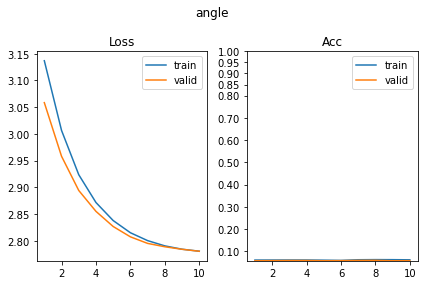

[371/630] py         SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 82.61it/s, loss=1.6, acc=0.267]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.17it/s, loss=1.56, acc=0.28]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.48it/s, loss=1.54, acc=0.257]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 138.07it/s, loss=1.51, acc=0.268]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.58it/s, loss=1.43, acc=0.269]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 89.15it/s, loss=1.47, acc=0.251]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 68.33it/s, loss=1.42, acc=0.277]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 93.49it/s, loss=1.41, acc=0.266]      

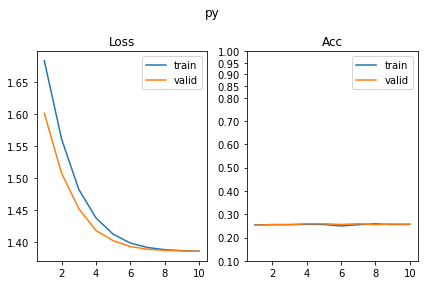

[372/630] px         SUP_[FCN32i223o128_d8]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 114.22it/s, loss=1.46, acc=0.225]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 134.47it/s, loss=1.43, acc=0.293]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.95it/s, loss=1.41, acc=0.282]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 113.79it/s, loss=1.41, acc=0.241]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.16it/s, loss=1.4, acc=0.256]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.90it/s, loss=1.39, acc=0.28]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.25it/s, loss=1.4, acc=0.254]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 134.86it/s, loss=1.4, acc=0.234]      

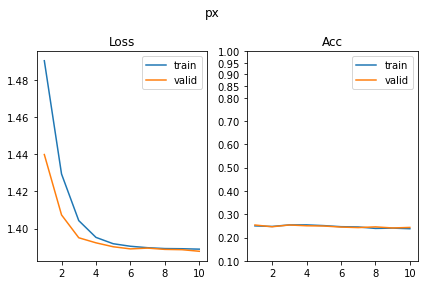

SUP_[FCN32i223o128_d8]_target_[color]
[373/630] shape      SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.00it/s, loss=2.17, acc=0.156]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.08it/s, loss=2.2, acc=0.137]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 113.24it/s, loss=2.08, acc=0.153]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.50it/s, loss=2.04, acc=0.166]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 116.50it/s, loss=2.02, acc=0.156]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.20it/s, loss=2.07, acc=0.112]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 57.88it/s, loss=1.99, acc=0.169]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 107.04it/s, loss=2, acc=0.141]        

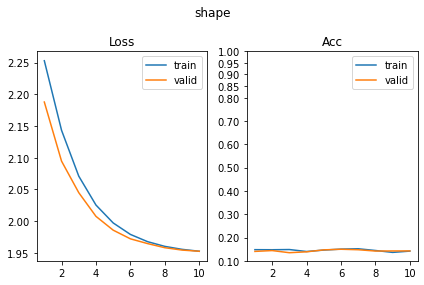

[374/630] scale      SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.84it/s, loss=1.16, acc=0.319]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.77it/s, loss=1.15, acc=0.361]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.10it/s, loss=1.12, acc=0.339]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.11it/s, loss=1.14, acc=0.334]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.33it/s, loss=1.11, acc=0.327]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.14it/s, loss=1.12, acc=0.307]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.91it/s, loss=1.1, acc=0.345]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.58it/s, loss=1.09, acc=0.329]     

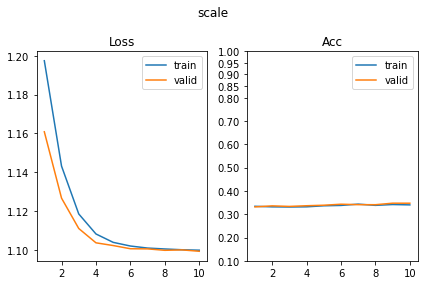

[375/630] color      SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.92it/s, loss=2.29, acc=0.21]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.46it/s, loss=2.22, acc=0.224]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.69it/s, loss=1.93, acc=0.251]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.20it/s, loss=1.95, acc=0.237]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.73it/s, loss=1.62, acc=0.27]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.42it/s, loss=1.63, acc=0.271]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.49it/s, loss=1.42, acc=0.352]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 138.93it/s, loss=1.41, acc=0.334]     

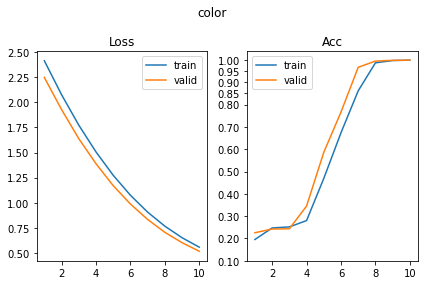

[376/630] angle      SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.70it/s, loss=2.99, acc=0.0603]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.16it/s, loss=3.03, acc=0.0634]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 105.35it/s, loss=2.99, acc=0.0472]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 47.32it/s, loss=2.92, acc=0.0537]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.22it/s, loss=2.87, acc=0.0635]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.31it/s, loss=2.89, acc=0.0512]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.19it/s, loss=2.84, acc=0.0586]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.27it/s, loss=2.82, acc=0.0659]    

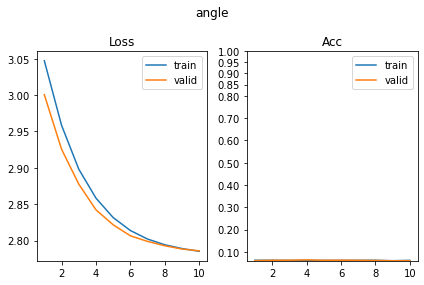

[377/630] py         SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.73it/s, loss=1.53, acc=0.287]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 135.54it/s, loss=1.6, acc=0.259]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.16it/s, loss=1.49, acc=0.29]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.88it/s, loss=1.49, acc=0.261]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.24it/s, loss=1.48, acc=0.235]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.74it/s, loss=1.46, acc=0.222]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.44it/s, loss=1.42, acc=0.295]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.29it/s, loss=1.41, acc=0.273]     

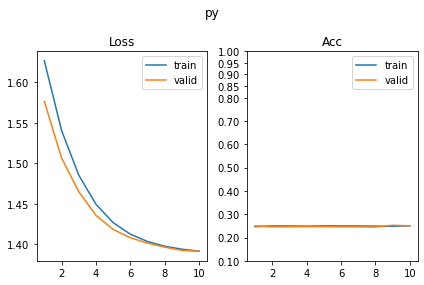

[378/630] px         SUP_[FCN32i223o128_d8]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 113.26it/s, loss=1.6, acc=0.264]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.53it/s, loss=1.63, acc=0.244]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.53it/s, loss=1.58, acc=0.221]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.16it/s, loss=1.56, acc=0.241]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.36it/s, loss=1.52, acc=0.259]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 133.17it/s, loss=1.52, acc=0.229]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.19it/s, loss=1.47, acc=0.231]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.02it/s, loss=1.45, acc=0.246]     

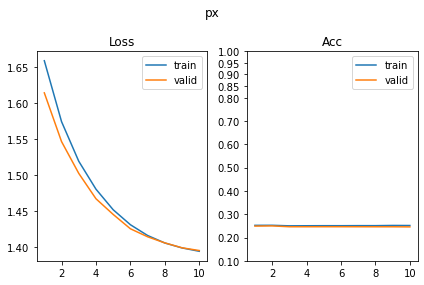

SUP_[FCN32i223o128_d8]_target_[angle]
[379/630] shape      SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 72.69it/s, loss=2.45, acc=0.142]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 136.85it/s, loss=2.32, acc=0.146]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.01it/s, loss=2.28, acc=0.148]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 67.96it/s, loss=2.31, acc=0.134]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.08it/s, loss=2.17, acc=0.15]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.92it/s, loss=2.05, acc=0.188]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.05it/s, loss=2.11, acc=0.161]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.54it/s, loss=2.02, acc=0.154]     

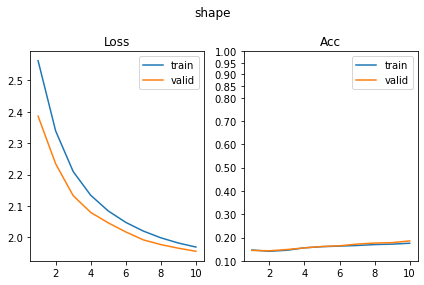

[380/630] scale      SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.98it/s, loss=1.38, acc=0.309]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.88it/s, loss=1.29, acc=0.383]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.01it/s, loss=1.29, acc=0.327]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.15it/s, loss=1.27, acc=0.329]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.50it/s, loss=1.22, acc=0.314]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 136.62it/s, loss=1.2, acc=0.327]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.71it/s, loss=1.18, acc=0.34]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.34it/s, loss=1.16, acc=0.322]     

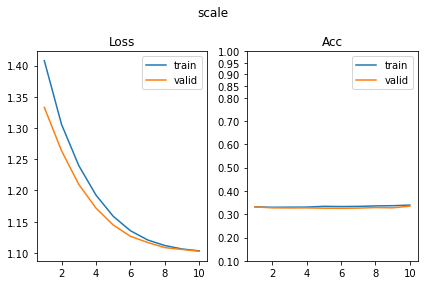

[381/630] color      SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 102.25it/s, loss=2.54, acc=0.135]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.45it/s, loss=2.56, acc=0.12]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.01it/s, loss=2.46, acc=0.124]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.97it/s, loss=2.45, acc=0.122]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 70.30it/s, loss=2.39, acc=0.109]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 125.03it/s, loss=2.3, acc=0.122]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.71it/s, loss=2.3, acc=0.122]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.54it/s, loss=2.25, acc=0.129]     

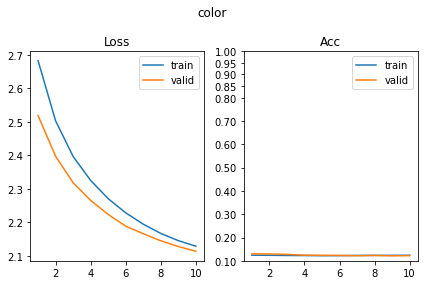

[382/630] angle      SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.92it/s, loss=3.19, acc=0.0586]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.27it/s, loss=3.24, acc=0.0878]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.13it/s, loss=2.86, acc=0.0749]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 47.00it/s, loss=2.94, acc=0.0854]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.44it/s, loss=2.59, acc=0.153]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.12it/s, loss=2.63, acc=0.171]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.10it/s, loss=2.25, acc=0.277]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.02it/s, loss=2.46, acc=0.22]      

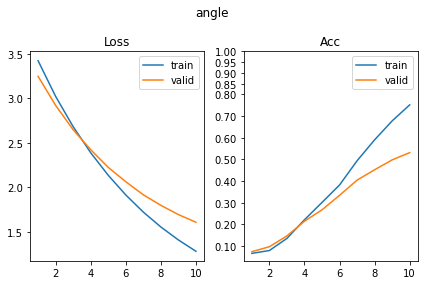

[383/630] py         SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.91it/s, loss=1.77, acc=0.249]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.85it/s, loss=1.76, acc=0.251]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.52it/s, loss=1.72, acc=0.238]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.15it/s, loss=1.68, acc=0.2]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.00it/s, loss=1.58, acc=0.254]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.46it/s, loss=1.62, acc=0.241]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.13it/s, loss=1.55, acc=0.23]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 139.15it/s, loss=1.56, acc=0.237]     

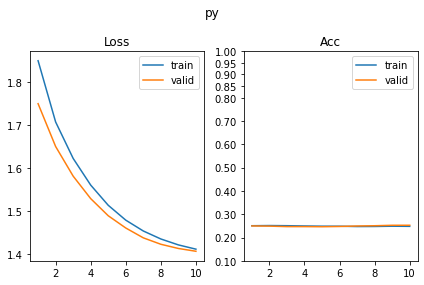

[384/630] px         SUP_[FCN32i223o128_d8]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 72.37it/s, loss=1.6, acc=0.267]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.75it/s, loss=1.54, acc=0.259]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.16it/s, loss=1.54, acc=0.267]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.74it/s, loss=1.47, acc=0.273]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.22it/s, loss=1.51, acc=0.243]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.02it/s, loss=1.48, acc=0.266]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.06it/s, loss=1.48, acc=0.241]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.96it/s, loss=1.49, acc=0.227]     

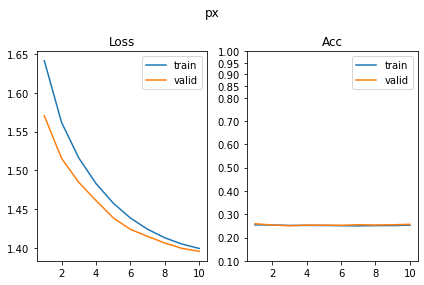

SUP_[FCN32i223o128_d8]_target_[py]
[385/630] shape      SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.75it/s, loss=2.17, acc=0.138]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 103.47it/s, loss=2.16, acc=0.176]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.02it/s, loss=2.07, acc=0.16]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 59.90it/s, loss=2.11, acc=0.146]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.91it/s, loss=2.03, acc=0.143]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 85.56it/s, loss=2.02, acc=0.141]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 67.90it/s, loss=1.98, acc=0.137]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 92.81it/s, loss=2, acc=0.154]         

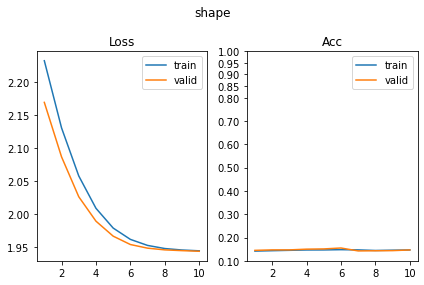

[386/630] scale      SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 57.58it/s, loss=1.21, acc=0.349]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.67it/s, loss=1.27, acc=0.307]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.07it/s, loss=1.15, acc=0.331]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 111.51it/s, loss=1.18, acc=0.307]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.24it/s, loss=1.14, acc=0.319]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.56it/s, loss=1.15, acc=0.276]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.33it/s, loss=1.12, acc=0.313]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 115.18it/s, loss=1.12, acc=0.293]     

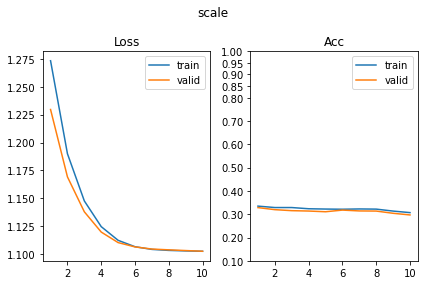

[387/630] color      SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 101.16it/s, loss=2.35, acc=0.119]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.60it/s, loss=2.38, acc=0.129]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.69it/s, loss=2.26, acc=0.145]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.25it/s, loss=2.29, acc=0.102]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.01it/s, loss=2.21, acc=0.127]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 95.62it/s, loss=2.2, acc=0.117]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.37it/s, loss=2.15, acc=0.119]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.41it/s, loss=2.14, acc=0.122]     

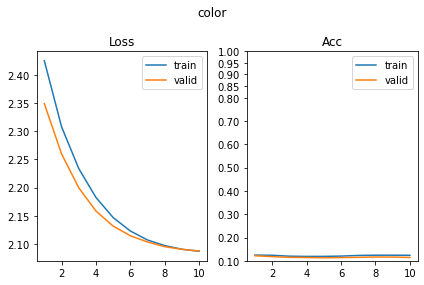

[388/630] angle      SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.14it/s, loss=3.04, acc=0.0586]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 116.57it/s, loss=3.12, acc=0.0512]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.29it/s, loss=2.94, acc=0.057]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 65.58it/s, loss=2.9, acc=0.0659]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.81it/s, loss=2.85, acc=0.0651]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.23it/s, loss=2.87, acc=0.0634]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 61.17it/s, loss=2.85, acc=0.0619]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 69.93it/s, loss=2.86, acc=0.0561]     

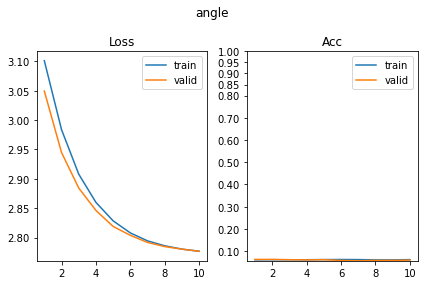

[389/630] py         SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.31it/s, loss=1.51, acc=0.262]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.97it/s, loss=1.54, acc=0.256]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 65.55it/s, loss=1.28, acc=0.248]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.92it/s, loss=1.24, acc=0.268]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.87it/s, loss=1.03, acc=0.461]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.11it/s, loss=1.02, acc=0.473]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 60.12it/s, loss=0.852, acc=0.528]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 144.07it/s, loss=0.81, acc=0.61]      

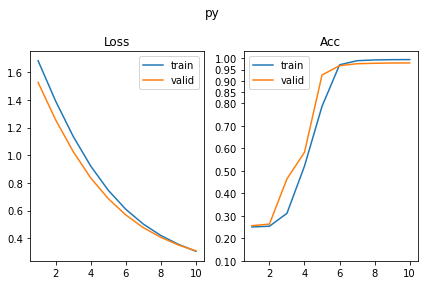

[390/630] px         SUP_[FCN32i223o128_d8]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 120.68it/s, loss=1.63, acc=0.22]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 139.32it/s, loss=1.56, acc=0.256]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.63it/s, loss=1.46, acc=0.292]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.48it/s, loss=1.49, acc=0.249]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.05it/s, loss=1.45, acc=0.243]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.72it/s, loss=1.41, acc=0.278]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.94it/s, loss=1.41, acc=0.225]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.74it/s, loss=1.41, acc=0.259]     

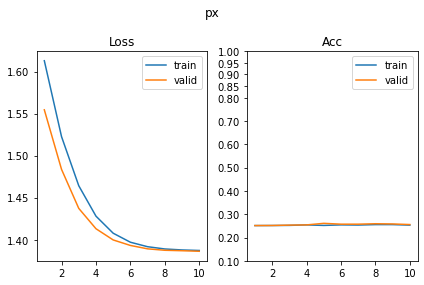

SUP_[FCN32i223o128_d8]_target_[px]
[391/630] shape      SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.18it/s, loss=2.14, acc=0.15]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 82.71it/s, loss=2.18, acc=0.146]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.05it/s, loss=2.08, acc=0.15]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.35it/s, loss=2.07, acc=0.141]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.41it/s, loss=2.04, acc=0.137]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.57it/s, loss=2, acc=0.173]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.41it/s, loss=2.01, acc=0.116]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.80it/s, loss=1.99, acc=0.149]     

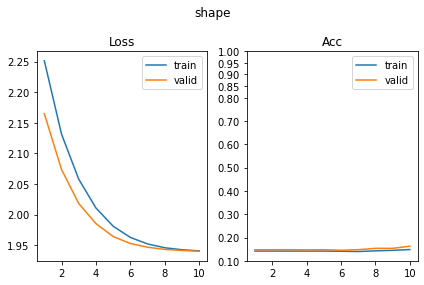

[392/630] scale      SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.39it/s, loss=1.22, acc=0.378]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 95.55it/s, loss=1.25, acc=0.322]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.31it/s, loss=1.18, acc=0.345]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 102.52it/s, loss=1.17, acc=0.349]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.51it/s, loss=1.15, acc=0.326]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 109.42it/s, loss=1.16, acc=0.312]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 64.31it/s, loss=1.12, acc=0.336]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 91.31it/s, loss=1.13, acc=0.337]      

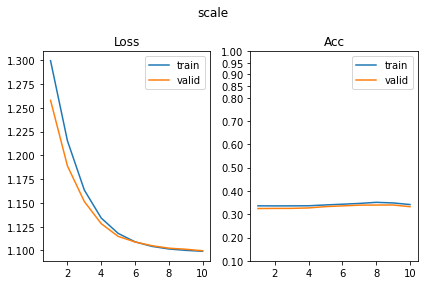

[393/630] color      SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.66it/s, loss=2.25, acc=0.0928]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 67.34it/s, loss=2.24, acc=0.0976]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 57.54it/s, loss=2.14, acc=0.147]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 88.91it/s, loss=2.17, acc=0.129]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 67.74it/s, loss=2.13, acc=0.124]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.60it/s, loss=2.15, acc=0.102]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.09it/s, loss=2.14, acc=0.112]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 200.18it/s, loss=2.12, acc=0.124]     

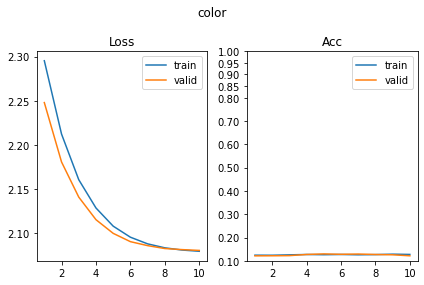

[394/630] angle      SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.03it/s, loss=3.04, acc=0.0831]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.88it/s, loss=2.98, acc=0.0561]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 96.54it/s, loss=2.96, acc=0.0733]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.19it/s, loss=2.92, acc=0.0659]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.78it/s, loss=2.87, acc=0.0879]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.92it/s, loss=2.88, acc=0.0732]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 67.97it/s, loss=2.86, acc=0.07]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 92.76it/s, loss=2.82, acc=0.0707]     

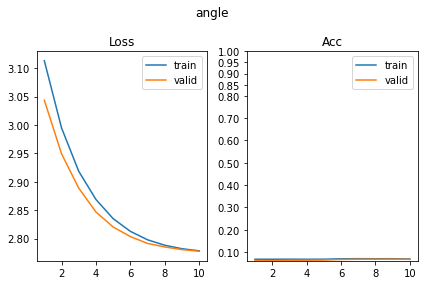

[395/630] py         SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 67.97it/s, loss=1.49, acc=0.259]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 92.82it/s, loss=1.5, acc=0.285]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.30it/s, loss=1.45, acc=0.235]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 108.68it/s, loss=1.43, acc=0.273]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.81it/s, loss=1.43, acc=0.23]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 136.13it/s, loss=1.42, acc=0.222]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.34it/s, loss=1.42, acc=0.239]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.18it/s, loss=1.43, acc=0.261]     

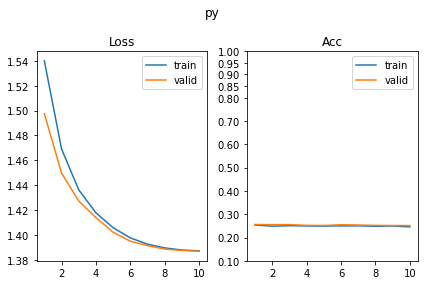

[396/630] px         SUP_[FCN32i223o128_d8]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 100.65it/s, loss=1.75, acc=0.235]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.32it/s, loss=1.79, acc=0.198]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.85it/s, loss=1.46, acc=0.259]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 120.86it/s, loss=1.41, acc=0.317]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 72.37it/s, loss=1.27, acc=0.298]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 86.14it/s, loss=1.24, acc=0.317]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.68it/s, loss=1.04, acc=0.529]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 135.37it/s, loss=1.04, acc=0.493]     

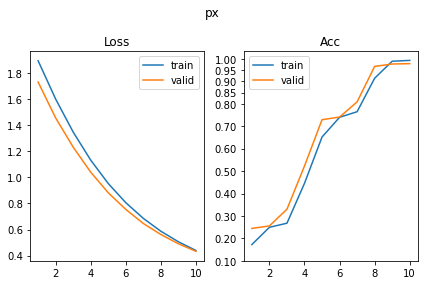

SUP_[FCN32i223o128_d16]_target_[shape]
[397/630] shape      SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.26it/s, loss=2.41, acc=0.00163]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.34it/s, loss=2.41, acc=0.00244]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 63.38it/s, loss=1.82, acc=0.147]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 53.36it/s, loss=1.79, acc=0.141]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.45it/s, loss=1.37, acc=0.384]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 89.20it/s, loss=1.34, acc=0.446]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.48it/s, loss=0.979, acc=0.822]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 75.36it/s, loss=0.988, acc=0.822]     

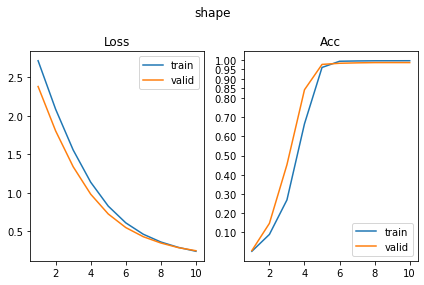

[398/630] scale      SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 61.46it/s, loss=1.21, acc=0.318]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.66it/s, loss=1.21, acc=0.329]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.22it/s, loss=1.14, acc=0.35]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.10it/s, loss=1.11, acc=0.361]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 67.11it/s, loss=1.11, acc=0.352]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.01it/s, loss=1.1, acc=0.349]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.13it/s, loss=1.11, acc=0.331]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.84it/s, loss=1.1, acc=0.317]      

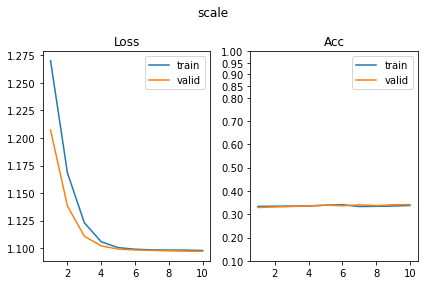

[399/630] color      SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.05it/s, loss=2.38, acc=0.132]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.98it/s, loss=2.34, acc=0.132]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 59.24it/s, loss=2.21, acc=0.104]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.28it/s, loss=2.17, acc=0.141]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.99it/s, loss=2.16, acc=0.122]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 80.84it/s, loss=2.15, acc=0.102]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.50it/s, loss=2.13, acc=0.124]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.48it/s, loss=2.11, acc=0.141]     

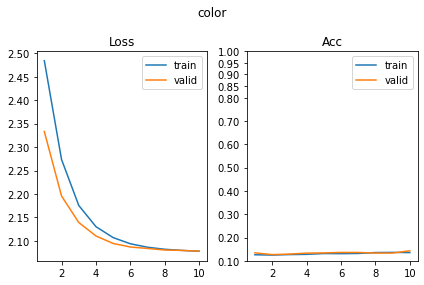

[400/630] angle      SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.19it/s, loss=2.97, acc=0.057]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.77it/s, loss=3.03, acc=0.0512]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 103.18it/s, loss=2.91, acc=0.0472]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 36.44it/s, loss=2.93, acc=0.0659]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.63it/s, loss=2.82, acc=0.0586]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.44it/s, loss=2.87, acc=0.0537]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 65.22it/s, loss=2.82, acc=0.0537]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 72.73it/s, loss=2.82, acc=0.0561]     

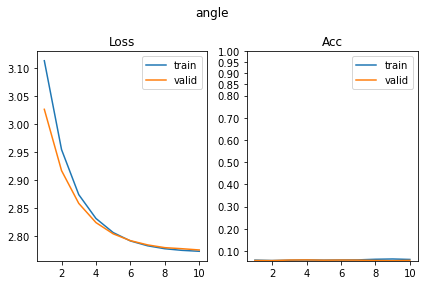

[401/630] py         SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.82it/s, loss=1.53, acc=0.275]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 108.85it/s, loss=1.56, acc=0.21]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.94it/s, loss=1.49, acc=0.241]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.22it/s, loss=1.45, acc=0.251]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 67.33it/s, loss=1.41, acc=0.269]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 54.00it/s, loss=1.42, acc=0.249]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 64.76it/s, loss=1.39, acc=0.241]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.57it/s, loss=1.41, acc=0.249]     

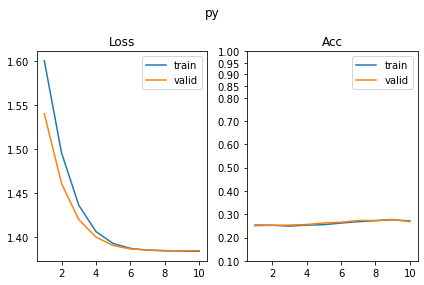

[402/630] px         SUP_[FCN32i223o128_d16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.45it/s, loss=1.49, acc=0.308]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.00it/s, loss=1.57, acc=0.229]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 56.98it/s, loss=1.44, acc=0.262]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.96it/s, loss=1.45, acc=0.229]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 65.81it/s, loss=1.41, acc=0.272]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.45it/s, loss=1.41, acc=0.283]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.42it/s, loss=1.4, acc=0.251]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 88.78it/s, loss=1.4, acc=0.249]       

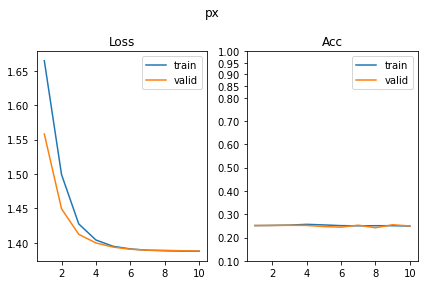

SUP_[FCN32i223o128_d16]_target_[scale]
[403/630] shape      SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.55it/s, loss=1.95, acc=0.182]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.36it/s, loss=1.94, acc=0.156]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 115.81it/s, loss=1.92, acc=0.2]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.51it/s, loss=1.93, acc=0.188]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 99.26it/s, loss=1.92, acc=0.164]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.65it/s, loss=1.92, acc=0.166]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.29it/s, loss=1.92, acc=0.179]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 74.76it/s, loss=1.91, acc=0.195]      

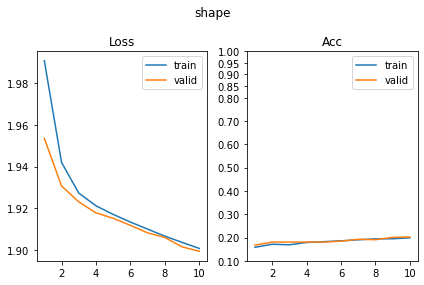

[404/630] scale      SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 82.97it/s, loss=1.15, acc=0.336]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 78.48it/s, loss=1.12, acc=0.368]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.38it/s, loss=0.818, acc=0.741]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.50it/s, loss=0.821, acc=0.761]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.37it/s, loss=0.584, acc=0.99]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.80it/s, loss=0.622, acc=0.946]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.18it/s, loss=0.445, acc=0.995]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 134.48it/s, loss=0.471, acc=0.976]    

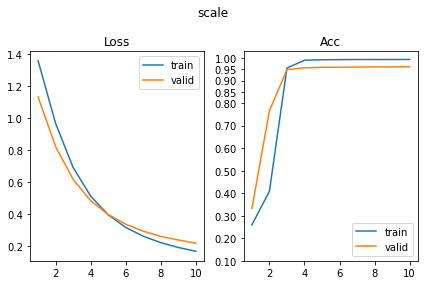

[405/630] color      SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 108.85it/s, loss=2.15, acc=0.121]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 87.52it/s, loss=2.12, acc=0.141]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 64.61it/s, loss=2.12, acc=0.111]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.52it/s, loss=2.1, acc=0.134]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.29it/s, loss=2.1, acc=0.0961]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 139.44it/s, loss=2.08, acc=0.137]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.62it/s, loss=2.08, acc=0.15]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.83it/s, loss=2.09, acc=0.12]      

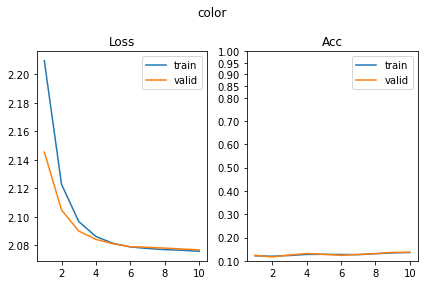

[406/630] angle      SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.47it/s, loss=2.85, acc=0.0635]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.85it/s, loss=2.81, acc=0.0659]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 121.51it/s, loss=2.81, acc=0.057]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.93it/s, loss=2.78, acc=0.0488]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 118.81it/s, loss=2.78, acc=0.07]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 132.13it/s, loss=2.77, acc=0.0585]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.49it/s, loss=2.78, acc=0.07]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.95it/s, loss=2.78, acc=0.0488]    

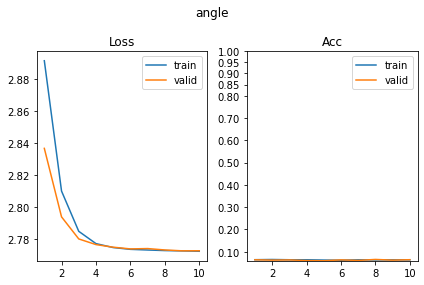

[407/630] py         SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.37it/s, loss=1.49, acc=0.285]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.48it/s, loss=1.47, acc=0.251]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 65.58it/s, loss=1.41, acc=0.262]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 91.61it/s, loss=1.4, acc=0.278]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 67.02it/s, loss=1.4, acc=0.287]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.23it/s, loss=1.39, acc=0.256]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.33it/s, loss=1.39, acc=0.231]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 96.53it/s, loss=1.38, acc=0.246]      

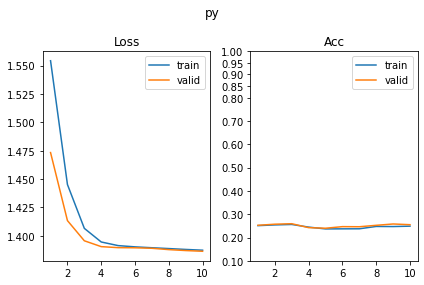

[408/630] px         SUP_[FCN32i223o128_d16]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 100.27it/s, loss=1.53, acc=0.238]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.75it/s, loss=1.52, acc=0.241]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 63.20it/s, loss=1.46, acc=0.265]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.44it/s, loss=1.45, acc=0.254]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.19it/s, loss=1.41, acc=0.269]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.19it/s, loss=1.39, acc=0.293]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.27it/s, loss=1.39, acc=0.249]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.11it/s, loss=1.38, acc=0.271]     

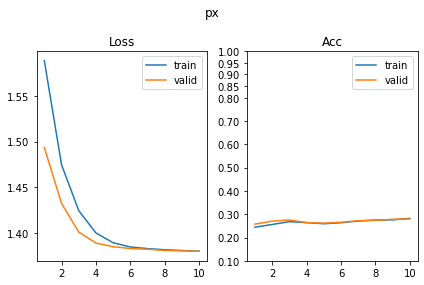

SUP_[FCN32i223o128_d16]_target_[color]
[409/630] shape      SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 63.84it/s, loss=2.11, acc=0.14]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.81it/s, loss=2.11, acc=0.132]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.16it/s, loss=2.01, acc=0.132]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.44it/s, loss=2.03, acc=0.124]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 82.59it/s, loss=2.02, acc=0.117]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.11it/s, loss=2, acc=0.146]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.13it/s, loss=1.96, acc=0.138]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.49it/s, loss=1.95, acc=0.178]     

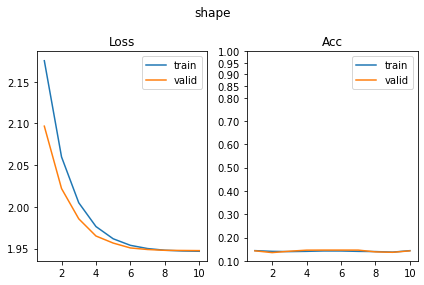

[410/630] scale      SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.88it/s, loss=1.26, acc=0.309]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.48it/s, loss=1.23, acc=0.356]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.93it/s, loss=1.23, acc=0.3]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.93it/s, loss=1.17, acc=0.354]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.66it/s, loss=1.13, acc=0.329]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.08it/s, loss=1.15, acc=0.307]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.20it/s, loss=1.12, acc=0.332]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 79.71it/s, loss=1.1, acc=0.373]       

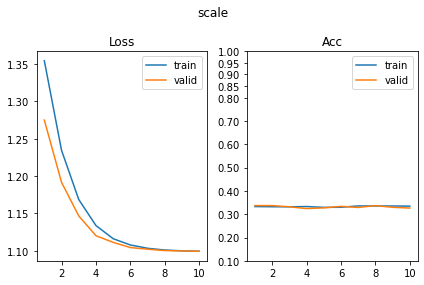

[411/630] color      SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 104.54it/s, loss=1.67, acc=0.482]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 64.60it/s, loss=1.69, acc=0.49]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.07it/s, loss=1.28, acc=0.606]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.14it/s, loss=1.17, acc=0.659]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.51it/s, loss=0.902, acc=0.638]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.15it/s, loss=0.928, acc=0.6]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.96it/s, loss=0.659, acc=0.933]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.74it/s, loss=0.69, acc=0.983]     

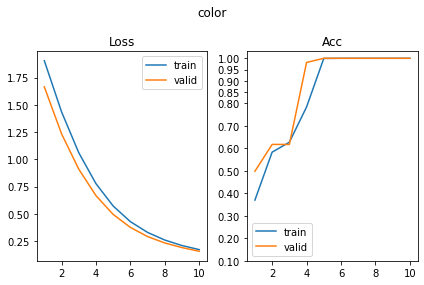

[412/630] angle      SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 82.34it/s, loss=2.99, acc=0.0619]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.71it/s, loss=2.98, acc=0.0488]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 102.90it/s, loss=2.85, acc=0.0847]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.18it/s, loss=2.83, acc=0.0756]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 101.03it/s, loss=2.84, acc=0.0554]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.28it/s, loss=2.8, acc=0.0585]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.89it/s, loss=2.8, acc=0.0407]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.90it/s, loss=2.78, acc=0.0829]    

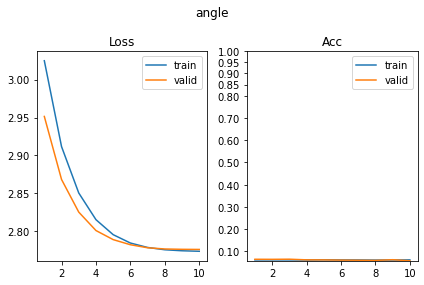

[413/630] py         SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.23it/s, loss=1.53, acc=0.259]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.66it/s, loss=1.53, acc=0.227]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.01it/s, loss=1.47, acc=0.238]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 92.84it/s, loss=1.44, acc=0.256]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.39it/s, loss=1.42, acc=0.256]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 90.76it/s, loss=1.38, acc=0.266]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 71.48it/s, loss=1.4, acc=0.243]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 110.64it/s, loss=1.4, acc=0.293]      

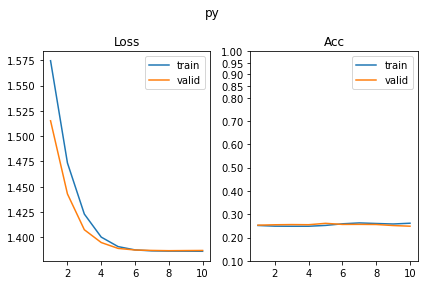

[414/630] px         SUP_[FCN32i223o128_d16]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 101.96it/s, loss=1.52, acc=0.254]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 97.89it/s, loss=1.57, acc=0.244]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 70.44it/s, loss=1.48, acc=0.228]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.18it/s, loss=1.45, acc=0.266]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.31it/s, loss=1.43, acc=0.256]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.96it/s, loss=1.4, acc=0.29]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.57it/s, loss=1.41, acc=0.223]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.83it/s, loss=1.39, acc=0.288]     

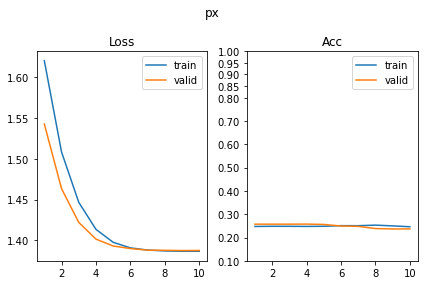

SUP_[FCN32i223o128_d16]_target_[angle]
[415/630] shape      SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.32it/s, loss=2.17, acc=0.161]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 109.61it/s, loss=2.15, acc=0.127]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.55it/s, loss=2.08, acc=0.158]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.45it/s, loss=2.03, acc=0.156]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 115.01it/s, loss=2.04, acc=0.129]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.90it/s, loss=2.04, acc=0.134]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.84it/s, loss=1.98, acc=0.163]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.51it/s, loss=1.98, acc=0.151]     

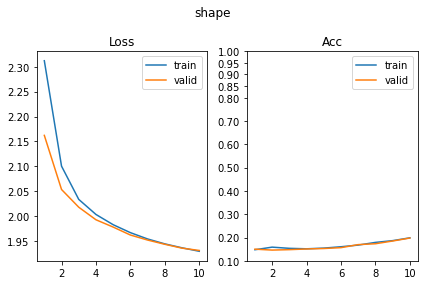

[416/630] scale      SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.91it/s, loss=1.21, acc=0.314]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.99it/s, loss=1.19, acc=0.329]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.98it/s, loss=1.15, acc=0.339]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.89it/s, loss=1.16, acc=0.312]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.47it/s, loss=1.13, acc=0.34]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.10it/s, loss=1.12, acc=0.341]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.73it/s, loss=1.12, acc=0.36]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.14it/s, loss=1.13, acc=0.361]     

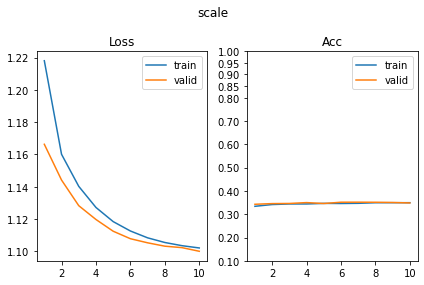

[417/630] color      SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.25it/s, loss=2.22, acc=0.138]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 56.16it/s, loss=2.26, acc=0.12]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 101.42it/s, loss=2.2, acc=0.121]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 111.50it/s, loss=2.2, acc=0.11]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 82.59it/s, loss=2.16, acc=0.125]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.57it/s, loss=2.18, acc=0.1]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.37it/s, loss=2.13, acc=0.103]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.55it/s, loss=2.14, acc=0.117]     

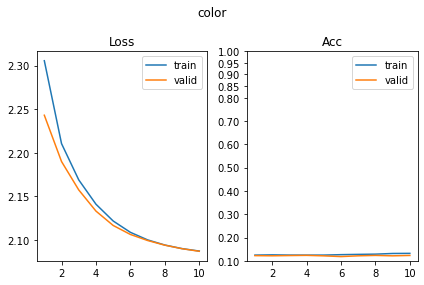

[418/630] angle      SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.68it/s, loss=2.57, acc=0.137]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.61it/s, loss=2.66, acc=0.12]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 117.00it/s, loss=2.19, acc=0.324]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 68.83it/s, loss=2.34, acc=0.268]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 116.00it/s, loss=1.85, acc=0.533]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 139.18it/s, loss=2.06, acc=0.376]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.95it/s, loss=1.58, acc=0.671]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.74it/s, loss=1.92, acc=0.444]     

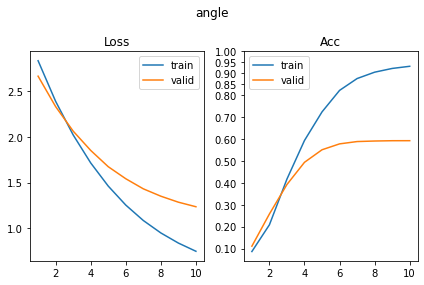

[419/630] py         SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.88it/s, loss=1.55, acc=0.23]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.90it/s, loss=1.51, acc=0.244]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.41it/s, loss=1.46, acc=0.248]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 116.06it/s, loss=1.45, acc=0.261]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 70.25it/s, loss=1.44, acc=0.243]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 86.91it/s, loss=1.44, acc=0.254]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.60it/s, loss=1.42, acc=0.274]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 116.72it/s, loss=1.41, acc=0.268]     

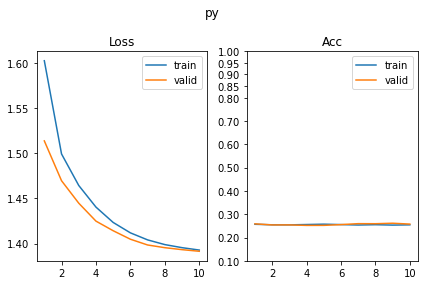

[420/630] px         SUP_[FCN32i223o128_d16]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.43it/s, loss=1.48, acc=0.27]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.04it/s, loss=1.54, acc=0.229]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.73it/s, loss=1.46, acc=0.248]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 106.13it/s, loss=1.5, acc=0.246]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.46it/s, loss=1.44, acc=0.272]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 133.00it/s, loss=1.49, acc=0.205]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.14it/s, loss=1.44, acc=0.215]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.50it/s, loss=1.42, acc=0.278]     

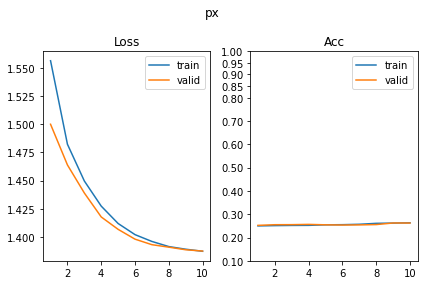

SUP_[FCN32i223o128_d16]_target_[py]
[421/630] shape      SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 66.05it/s, loss=2.07, acc=0.129]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.69it/s, loss=2.07, acc=0.115]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.65it/s, loss=2.02, acc=0.14]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 56.53it/s, loss=2.02, acc=0.149]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 67.56it/s, loss=1.97, acc=0.148]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 71.37it/s, loss=1.97, acc=0.124]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.86it/s, loss=1.95, acc=0.145]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.08it/s, loss=1.96, acc=0.117]     

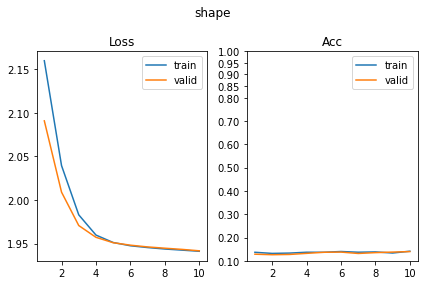

[422/630] scale      SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.79it/s, loss=1.25, acc=0.314]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 87.27it/s, loss=1.23, acc=0.322]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.84it/s, loss=1.15, acc=0.345]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 131.36it/s, loss=1.15, acc=0.31]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.13it/s, loss=1.12, acc=0.322]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.87it/s, loss=1.13, acc=0.32]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.99it/s, loss=1.1, acc=0.334]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.79it/s, loss=1.1, acc=0.359]      

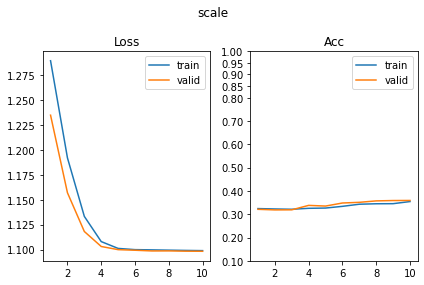

[423/630] color      SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.15it/s, loss=2.21, acc=0.111]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.70it/s, loss=2.2, acc=0.105]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.13it/s, loss=2.13, acc=0.109]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.07it/s, loss=2.14, acc=0.11]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.57it/s, loss=2.08, acc=0.101]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.21it/s, loss=2.09, acc=0.122]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.23it/s, loss=2.07, acc=0.125]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.29it/s, loss=2.09, acc=0.102]     

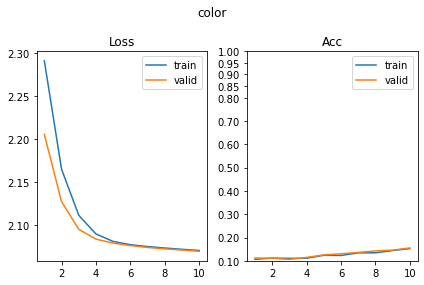

[424/630] angle      SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 72.72it/s, loss=2.85, acc=0.0831]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 132.08it/s, loss=2.89, acc=0.0707]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.88it/s, loss=2.81, acc=0.0684]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.28it/s, loss=2.83, acc=0.0659]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.54it/s, loss=2.78, acc=0.057]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.50it/s, loss=2.79, acc=0.0805]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.78it/s, loss=2.77, acc=0.0635]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.99it/s, loss=2.77, acc=0.0659]    

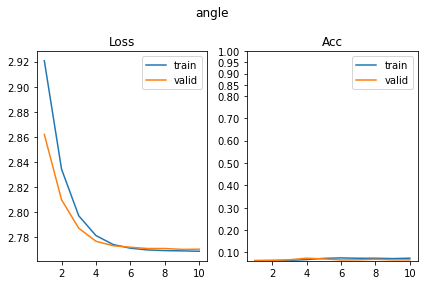

[425/630] py         SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 53.73it/s, loss=1.39, acc=0.544]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 107.30it/s, loss=1.4, acc=0.549]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.63it/s, loss=1.01, acc=0.738]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.69it/s, loss=0.929, acc=0.78]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.84it/s, loss=0.73, acc=0.748]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.93it/s, loss=0.737, acc=0.744]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.15it/s, loss=0.537, acc=0.95]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.08it/s, loss=0.567, acc=0.915]    

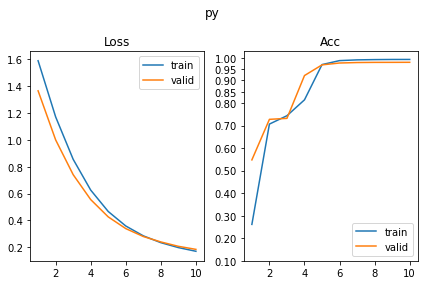

[426/630] px         SUP_[FCN32i223o128_d16]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 113.03it/s, loss=1.45, acc=0.248]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 147.51it/s, loss=1.44, acc=0.259]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 98.15it/s, loss=1.4, acc=0.243]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 133.71it/s, loss=1.41, acc=0.254]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.30it/s, loss=1.39, acc=0.264]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 132.70it/s, loss=1.39, acc=0.278]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.35it/s, loss=1.39, acc=0.204]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.27it/s, loss=1.39, acc=0.251]     

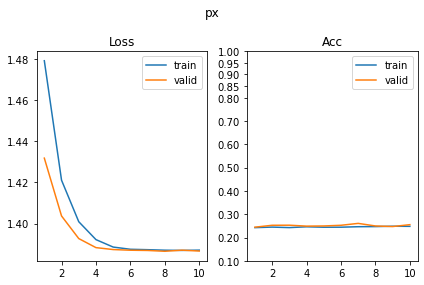

SUP_[FCN32i223o128_d16]_target_[px]
[427/630] shape      SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 82.47it/s, loss=2.02, acc=0.166]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.91it/s, loss=2.02, acc=0.159]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 101.48it/s, loss=1.95, acc=0.187]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.48it/s, loss=1.98, acc=0.154]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 110.38it/s, loss=1.95, acc=0.143]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 90.82it/s, loss=1.95, acc=0.156]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.03it/s, loss=1.94, acc=0.153]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.63it/s, loss=1.93, acc=0.18]      

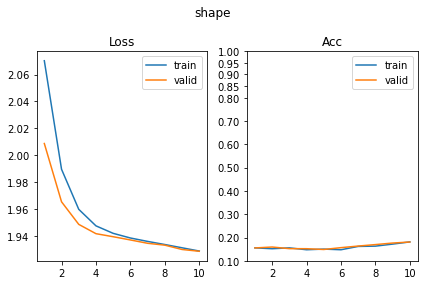

[428/630] scale      SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.39it/s, loss=1.12, acc=0.353]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 103.68it/s, loss=1.15, acc=0.366]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.89it/s, loss=1.1, acc=0.322]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 134.25it/s, loss=1.09, acc=0.385]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.97it/s, loss=1.09, acc=0.363]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.39it/s, loss=1.1, acc=0.361]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.73it/s, loss=1.1, acc=0.342]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 133.24it/s, loss=1.1, acc=0.312]      

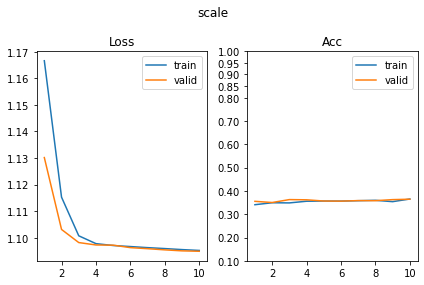

[429/630] color      SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.98it/s, loss=2.16, acc=0.155]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 99.58it/s, loss=2.22, acc=0.102]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.99it/s, loss=2.13, acc=0.135]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 138.65it/s, loss=2.1, acc=0.154]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.38it/s, loss=2.09, acc=0.143]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.34it/s, loss=2.11, acc=0.115]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.07it/s, loss=2.08, acc=0.134]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.21it/s, loss=2.1, acc=0.0756]     

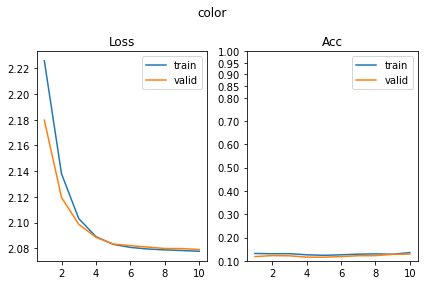

[430/630] angle      SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.80it/s, loss=2.91, acc=0.0505]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.21it/s, loss=2.87, acc=0.0537]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 98.88it/s, loss=2.83, acc=0.0668]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 54.02it/s, loss=2.82, acc=0.0585]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 103.97it/s, loss=2.82, acc=0.0603]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.22it/s, loss=2.81, acc=0.0561]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.56it/s, loss=2.79, acc=0.0603]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.75it/s, loss=2.8, acc=0.0463]     

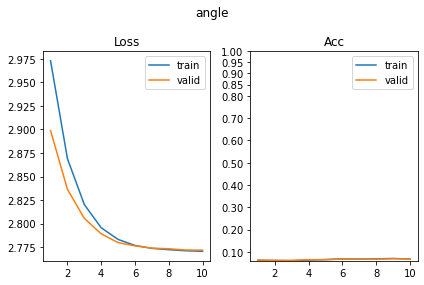

[431/630] py         SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.90it/s, loss=1.57, acc=0.256]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.06it/s, loss=1.54, acc=0.249]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.17it/s, loss=1.43, acc=0.257]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.70it/s, loss=1.45, acc=0.256]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.51it/s, loss=1.41, acc=0.27]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.54it/s, loss=1.41, acc=0.234]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.10it/s, loss=1.4, acc=0.238]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.82it/s, loss=1.38, acc=0.261]     

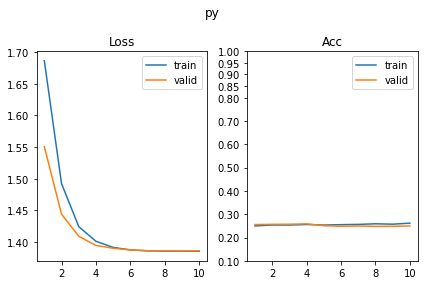

[432/630] px         SUP_[FCN32i223o128_d16]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 113.73it/s, loss=1, acc=0.629]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.87it/s, loss=1.02, acc=0.622]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.42it/s, loss=0.709, acc=0.894]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.35it/s, loss=0.729, acc=0.863]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.35it/s, loss=0.521, acc=0.99]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.77it/s, loss=0.529, acc=0.976]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.88it/s, loss=0.384, acc=0.99]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.73it/s, loss=0.412, acc=0.978]    

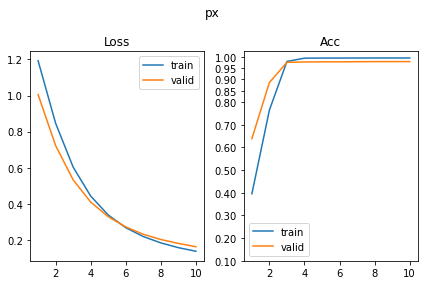

SUP_[FCN32i223o128_d32]_target_[shape]
[433/630] shape      SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.59it/s, loss=1.44, acc=0.679]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 96.09it/s, loss=1.44, acc=0.702]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.28it/s, loss=0.922, acc=0.888]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.55it/s, loss=0.935, acc=0.898]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 112.64it/s, loss=0.576, acc=0.998]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.76it/s, loss=0.58, acc=0.988]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.67it/s, loss=0.365, acc=0.998]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.92it/s, loss=0.401, acc=0.985]    

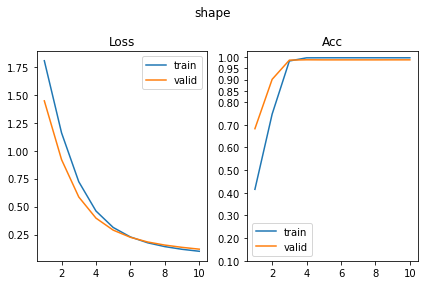

[434/630] scale      SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.65it/s, loss=1.18, acc=0.34]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 94.02it/s, loss=1.21, acc=0.341]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.04it/s, loss=1.11, acc=0.345]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 102.28it/s, loss=1.12, acc=0.341]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.57it/s, loss=1.1, acc=0.365]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 92.67it/s, loss=1.11, acc=0.298]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.29it/s, loss=1.09, acc=0.366]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.17it/s, loss=1.09, acc=0.4]       

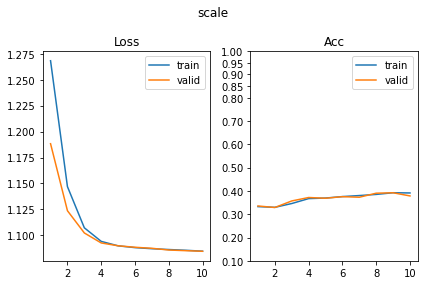

[435/630] color      SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 116.25it/s, loss=2.11, acc=0.129]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.66it/s, loss=2.12, acc=0.112]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.50it/s, loss=2.09, acc=0.138]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 125.38it/s, loss=2.09, acc=0.115]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.82it/s, loss=2.08, acc=0.142]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.07it/s, loss=2.08, acc=0.11]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.38it/s, loss=2.08, acc=0.127]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.59it/s, loss=2.08, acc=0.117]     

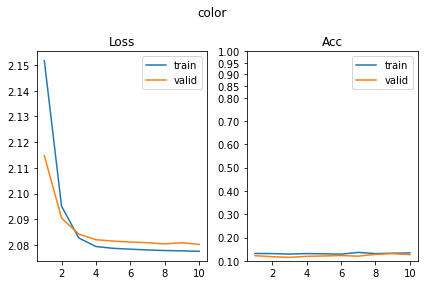

[436/630] angle      SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.65it/s, loss=2.85, acc=0.0635]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.96it/s, loss=2.8, acc=0.0683]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.79it/s, loss=2.78, acc=0.0651]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.37it/s, loss=2.79, acc=0.0537]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 109.51it/s, loss=2.78, acc=0.0554]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 103.58it/s, loss=2.78, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.76it/s, loss=2.77, acc=0.0847]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 102.31it/s, loss=2.77, acc=0.0561]    

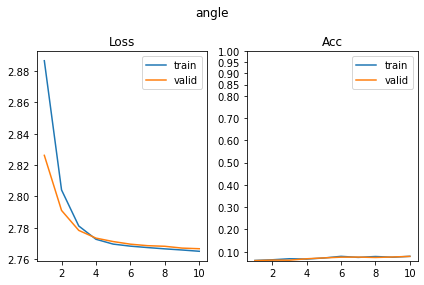

[437/630] py         SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.45it/s, loss=1.43, acc=0.265]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.94it/s, loss=1.42, acc=0.268]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 96.88it/s, loss=1.39, acc=0.248]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 131.57it/s, loss=1.39, acc=0.232]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.89it/s, loss=1.39, acc=0.251]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.67it/s, loss=1.39, acc=0.239]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.83it/s, loss=1.39, acc=0.239]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.00it/s, loss=1.39, acc=0.273]     

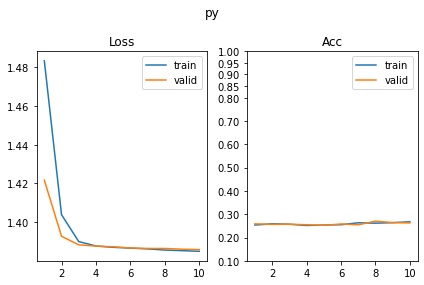

[438/630] px         SUP_[FCN32i223o128_d32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 118.05it/s, loss=1.41, acc=0.226]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.88it/s, loss=1.43, acc=0.232]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.31it/s, loss=1.39, acc=0.272]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.51it/s, loss=1.39, acc=0.241]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.27it/s, loss=1.39, acc=0.265]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.00it/s, loss=1.39, acc=0.222]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.81it/s, loss=1.39, acc=0.28]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 134.09it/s, loss=1.38, acc=0.28]      

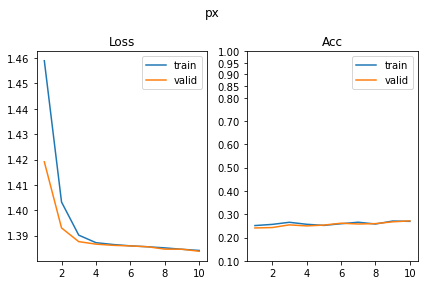

SUP_[FCN32i223o128_d32]_target_[scale]
[439/630] shape      SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.57it/s, loss=1.96, acc=0.147]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.21it/s, loss=1.94, acc=0.151]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 103.26it/s, loss=1.92, acc=0.2]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 58.51it/s, loss=1.9, acc=0.222]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 114.83it/s, loss=1.9, acc=0.233]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.42it/s, loss=1.9, acc=0.207]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.56it/s, loss=1.87, acc=0.252]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.14it/s, loss=1.88, acc=0.234]     

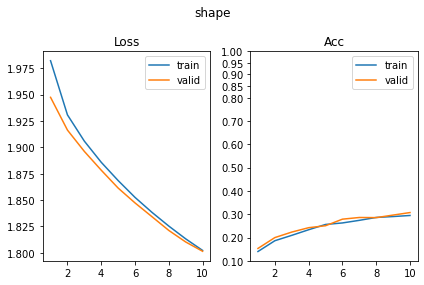

[440/630] scale      SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.89it/s, loss=0.656, acc=0.961]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.16it/s, loss=0.67, acc=0.941]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.00it/s, loss=0.391, acc=0.998]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.31it/s, loss=0.409, acc=0.988]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.36it/s, loss=0.266, acc=0.997]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.76it/s, loss=0.311, acc=0.968]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.76it/s, loss=0.2, acc=0.997]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.39it/s, loss=0.22, acc=0.985]     

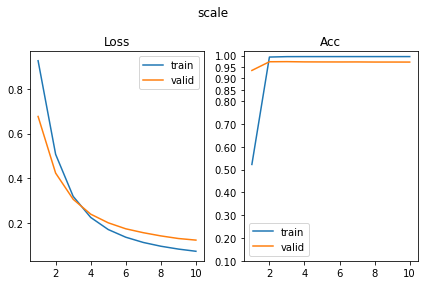

[441/630] color      SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.47it/s, loss=2.1, acc=0.15]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 137.36it/s, loss=2.1, acc=0.137]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.54it/s, loss=2.08, acc=0.129]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.25it/s, loss=2.09, acc=0.0976]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.87it/s, loss=2.08, acc=0.137]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.13it/s, loss=2.08, acc=0.124]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.26it/s, loss=2.08, acc=0.117]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 138.02it/s, loss=2.07, acc=0.159]     

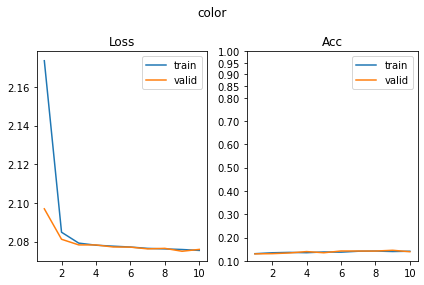

[442/630] angle      SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.13it/s, loss=2.81, acc=0.0521]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.27it/s, loss=2.8, acc=0.0732]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 113.27it/s, loss=2.78, acc=0.07]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.43it/s, loss=2.78, acc=0.0463]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 105.28it/s, loss=2.78, acc=0.0668]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.00it/s, loss=2.78, acc=0.0756]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.81it/s, loss=2.78, acc=0.0537]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 135.64it/s, loss=2.77, acc=0.0585]    

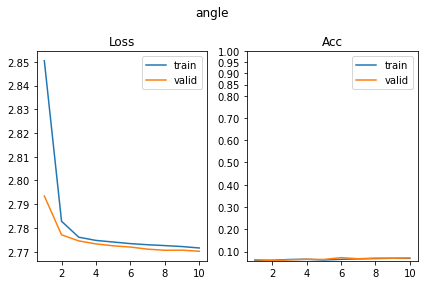

[443/630] py         SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.73it/s, loss=1.39, acc=0.239]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.78it/s, loss=1.39, acc=0.229]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.04it/s, loss=1.4, acc=0.205]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 108.53it/s, loss=1.39, acc=0.19]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.51it/s, loss=1.39, acc=0.236]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.46it/s, loss=1.39, acc=0.227]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.17it/s, loss=1.39, acc=0.23]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.08it/s, loss=1.39, acc=0.21]      

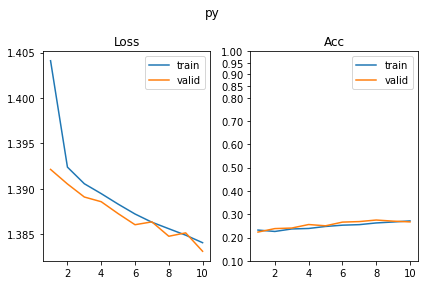

[444/630] px         SUP_[FCN32i223o128_d32]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 115.44it/s, loss=1.4, acc=0.233]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.41it/s, loss=1.39, acc=0.283]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.73it/s, loss=1.38, acc=0.244]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.30it/s, loss=1.38, acc=0.239]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.34it/s, loss=1.38, acc=0.277]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.92it/s, loss=1.39, acc=0.273]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.92it/s, loss=1.38, acc=0.274]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.14it/s, loss=1.38, acc=0.293]     

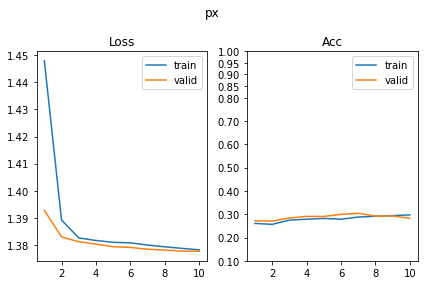

SUP_[FCN32i223o128_d32]_target_[color]
[445/630] shape      SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.67it/s, loss=2, acc=0.153]                                              
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.07it/s, loss=1.99, acc=0.129]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.23it/s, loss=1.96, acc=0.13]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 60.56it/s, loss=1.96, acc=0.134]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 104.22it/s, loss=1.95, acc=0.127]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.34it/s, loss=1.95, acc=0.124]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.57it/s, loss=1.95, acc=0.119]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 126.54it/s, loss=1.95, acc=0.122]     

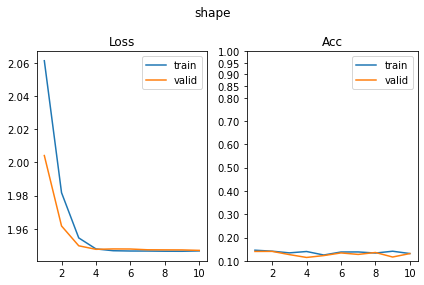

[446/630] scale      SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.77it/s, loss=1.12, acc=0.337]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 135.82it/s, loss=1.11, acc=0.324]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.14it/s, loss=1.1, acc=0.334]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 119.78it/s, loss=1.1, acc=0.317]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.35it/s, loss=1.1, acc=0.324]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 130.37it/s, loss=1.1, acc=0.344]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 96.17it/s, loss=1.1, acc=0.316]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.62it/s, loss=1.1, acc=0.32]       

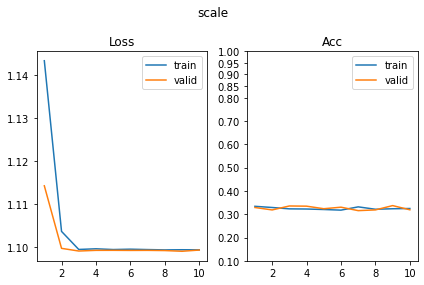

[447/630] color      SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 103.98it/s, loss=1.81, acc=0.383]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 139.81it/s, loss=1.74, acc=0.402]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.68it/s, loss=1.04, acc=0.871]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.37it/s, loss=1.01, acc=0.888]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.85it/s, loss=0.582, acc=1]                                              
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.10it/s, loss=0.58, acc=1]                                                
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 71.40it/s, loss=0.342, acc=1]                                              
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 88.09it/s, loss=0.344, acc=1]         

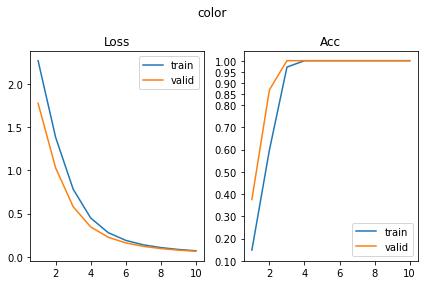

[448/630] angle      SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.09it/s, loss=2.86, acc=0.0456]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.97it/s, loss=2.82, acc=0.061]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 101.72it/s, loss=2.78, acc=0.0619]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 57.08it/s, loss=2.81, acc=0.0439]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.46it/s, loss=2.79, acc=0.0472]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.22it/s, loss=2.79, acc=0.0463]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.36it/s, loss=2.78, acc=0.07]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 106.15it/s, loss=2.78, acc=0.0634]    

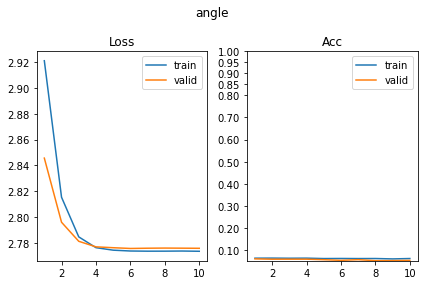

[449/630] py         SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.84it/s, loss=1.43, acc=0.22]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.91it/s, loss=1.4, acc=0.259]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 67.34it/s, loss=1.39, acc=0.226]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 101.80it/s, loss=1.39, acc=0.249]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 69.00it/s, loss=1.39, acc=0.259]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 104.34it/s, loss=1.39, acc=0.205]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.62it/s, loss=1.39, acc=0.259]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.83it/s, loss=1.39, acc=0.293]     

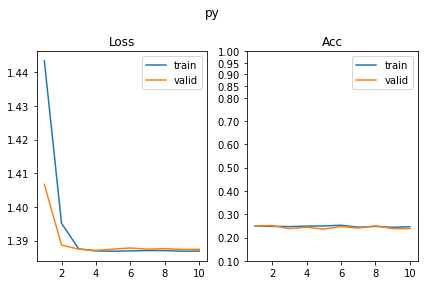

[450/630] px         SUP_[FCN32i223o128_d32]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 108.89it/s, loss=1.51, acc=0.241]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 119.03it/s, loss=1.47, acc=0.232]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.53it/s, loss=1.4, acc=0.251]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.09it/s, loss=1.39, acc=0.244]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 82.65it/s, loss=1.39, acc=0.257]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.91it/s, loss=1.39, acc=0.224]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.68it/s, loss=1.39, acc=0.254]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.22it/s, loss=1.39, acc=0.227]     

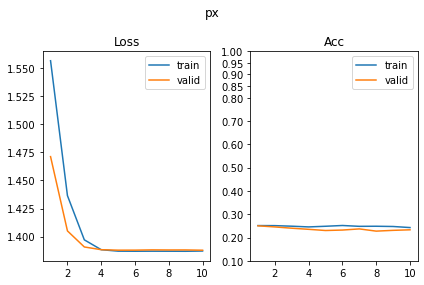

SUP_[FCN32i223o128_d32]_target_[angle]
[451/630] shape      SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.69it/s, loss=2, acc=0.169]                                              
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.82it/s, loss=1.99, acc=0.185]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.84it/s, loss=1.93, acc=0.215]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 45.73it/s, loss=1.94, acc=0.21]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.38it/s, loss=1.9, acc=0.218]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 122.75it/s, loss=1.9, acc=0.241]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.51it/s, loss=1.87, acc=0.256]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.09it/s, loss=1.89, acc=0.19]      

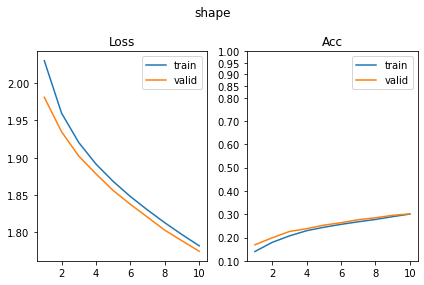

[452/630] scale      SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.39it/s, loss=1.15, acc=0.313]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.30it/s, loss=1.12, acc=0.356]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.00it/s, loss=1.12, acc=0.336]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 71.97it/s, loss=1.11, acc=0.337]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.55it/s, loss=1.1, acc=0.352]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 92.84it/s, loss=1.1, acc=0.341]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.00it/s, loss=1.1, acc=0.355]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 126.50it/s, loss=1.09, acc=0.393]     

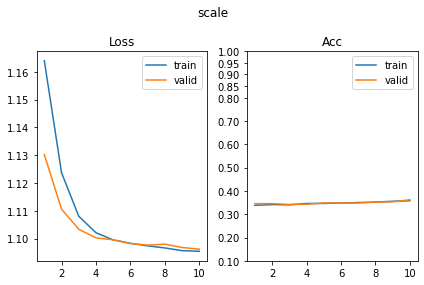

[453/630] color      SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 97.44it/s, loss=2.15, acc=0.124]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.64it/s, loss=2.13, acc=0.129]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.24it/s, loss=2.1, acc=0.137]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.48it/s, loss=2.11, acc=0.122]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 105.85it/s, loss=2.11, acc=0.129]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.59it/s, loss=2.1, acc=0.122]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.21it/s, loss=2.09, acc=0.135]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.56it/s, loss=2.09, acc=0.149]     

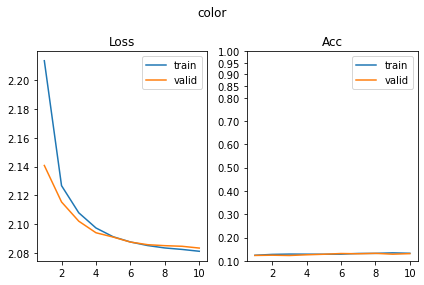

[454/630] angle      SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.26it/s, loss=2.39, acc=0.156]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 123.72it/s, loss=2.46, acc=0.161]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.99it/s, loss=1.92, acc=0.572]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.71it/s, loss=2.06, acc=0.444]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 96.51it/s, loss=1.51, acc=0.816]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.74it/s, loss=1.8, acc=0.507]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.42it/s, loss=1.25, acc=0.86]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 135.11it/s, loss=1.53, acc=0.607]     

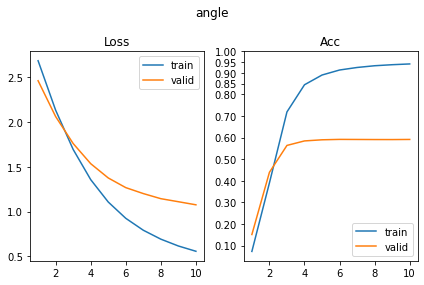

[455/630] py         SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.87it/s, loss=1.42, acc=0.277]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.88it/s, loss=1.43, acc=0.251]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.04it/s, loss=1.41, acc=0.288]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.81it/s, loss=1.38, acc=0.315]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.71it/s, loss=1.4, acc=0.279]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.42it/s, loss=1.4, acc=0.288]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.52it/s, loss=1.41, acc=0.249]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.48it/s, loss=1.4, acc=0.249]      

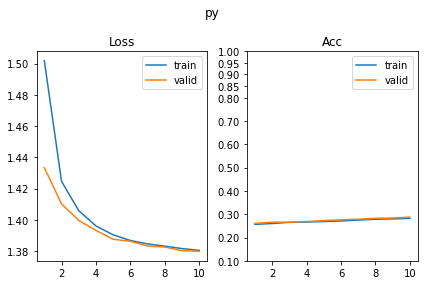

[456/630] px         SUP_[FCN32i223o128_d32]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.87it/s, loss=1.44, acc=0.248]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 98.88it/s, loss=1.44, acc=0.232]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.70it/s, loss=1.43, acc=0.238]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.74it/s, loss=1.43, acc=0.234]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 69.95it/s, loss=1.41, acc=0.246]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 95.21it/s, loss=1.41, acc=0.237]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 70.27it/s, loss=1.39, acc=0.29]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.34it/s, loss=1.38, acc=0.268]     

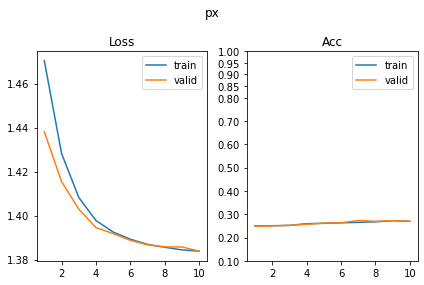

SUP_[FCN32i223o128_d32]_target_[py]
[457/630] shape      SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.17it/s, loss=1.98, acc=0.145]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.52it/s, loss=1.97, acc=0.156]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.29it/s, loss=1.95, acc=0.16]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.65it/s, loss=1.94, acc=0.183]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.57it/s, loss=1.95, acc=0.134]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 108.42it/s, loss=1.94, acc=0.161]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.43it/s, loss=1.94, acc=0.163]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.80it/s, loss=1.94, acc=0.159]     

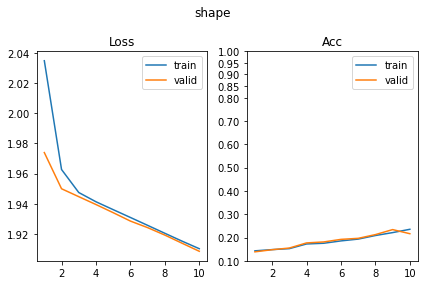

[458/630] scale      SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 100.14it/s, loss=1.14, acc=0.322]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 142.15it/s, loss=1.14, acc=0.329]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.64it/s, loss=1.1, acc=0.327]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 125.35it/s, loss=1.1, acc=0.341]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.61it/s, loss=1.09, acc=0.368]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 75.85it/s, loss=1.09, acc=0.378]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.94it/s, loss=1.1, acc=0.36]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.52it/s, loss=1.1, acc=0.366]      

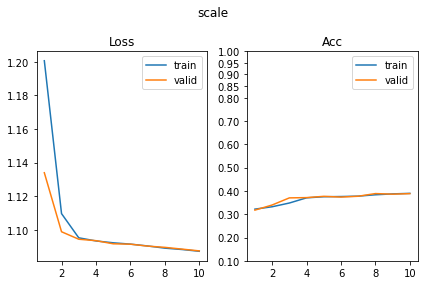

[459/630] color      SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 99.39it/s, loss=2.1, acc=0.148]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 93.00it/s, loss=2.08, acc=0.163]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.89it/s, loss=2.08, acc=0.137]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 99.35it/s, loss=2.07, acc=0.149]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 77.59it/s, loss=2.07, acc=0.158]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 97.41it/s, loss=2.07, acc=0.178]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.74it/s, loss=2.07, acc=0.156]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 94.17it/s, loss=2.07, acc=0.154]      

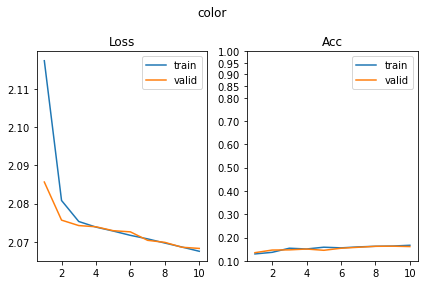

[460/630] angle      SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.83it/s, loss=2.81, acc=0.0537]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 72.57it/s, loss=2.78, acc=0.0659]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 112.92it/s, loss=2.77, acc=0.0684]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.56it/s, loss=2.79, acc=0.0488]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 110.51it/s, loss=2.77, acc=0.0489]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.67it/s, loss=2.78, acc=0.0585]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.86it/s, loss=2.77, acc=0.0521]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.78it/s, loss=2.77, acc=0.0732]    

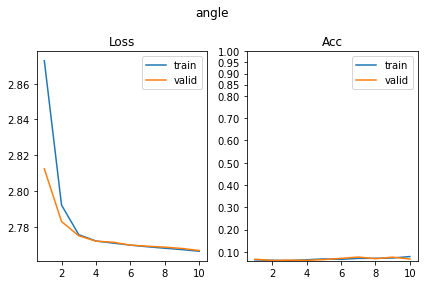

[461/630] py         SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.68it/s, loss=0.765, acc=0.99]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.78it/s, loss=0.778, acc=0.973]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.37it/s, loss=0.45, acc=0.995]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.11it/s, loss=0.479, acc=0.968]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 71.59it/s, loss=0.293, acc=0.997]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 93.05it/s, loss=0.314, acc=0.985]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 68.94it/s, loss=0.224, acc=0.992]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 95.57it/s, loss=0.231, acc=0.98]      

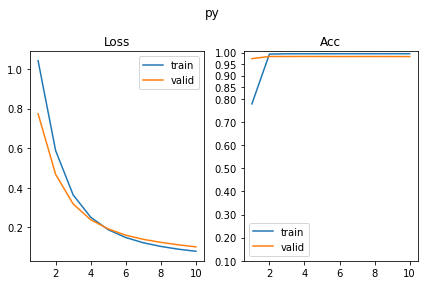

[462/630] px         SUP_[FCN32i223o128_d32]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 110.10it/s, loss=1.41, acc=0.246]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.37it/s, loss=1.42, acc=0.241]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.79it/s, loss=1.39, acc=0.279]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 114.16it/s, loss=1.39, acc=0.241]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.24it/s, loss=1.39, acc=0.243]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.56it/s, loss=1.39, acc=0.234]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.95it/s, loss=1.39, acc=0.262]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 130.10it/s, loss=1.39, acc=0.256]     

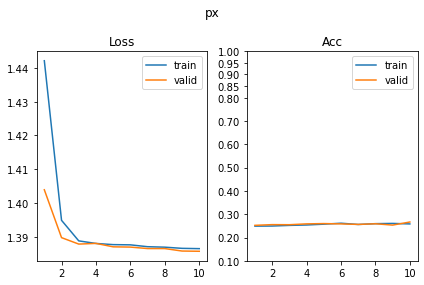

SUP_[FCN32i223o128_d32]_target_[px]
[463/630] shape      SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.61it/s, loss=1.97, acc=0.143]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 133.40it/s, loss=1.96, acc=0.159]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 104.55it/s, loss=1.94, acc=0.169]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.04it/s, loss=1.94, acc=0.173]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 115.91it/s, loss=1.94, acc=0.155]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 134.69it/s, loss=1.93, acc=0.154]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.34it/s, loss=1.94, acc=0.15]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.10it/s, loss=1.94, acc=0.173]     

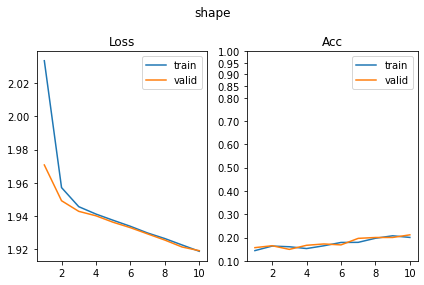

[464/630] scale      SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.30it/s, loss=1.12, acc=0.352]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 136.92it/s, loss=1.11, acc=0.354]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 93.43it/s, loss=1.1, acc=0.322]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.30it/s, loss=1.09, acc=0.378]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.31it/s, loss=1.1, acc=0.358]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.10it/s, loss=1.1, acc=0.395]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.95it/s, loss=1.09, acc=0.353]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 136.61it/s, loss=1.1, acc=0.349]      

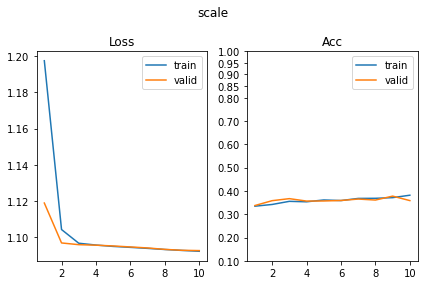

[465/630] color      SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.80it/s, loss=2.1, acc=0.155]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.46it/s, loss=2.12, acc=0.132]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.06it/s, loss=2.08, acc=0.134]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.76it/s, loss=2.08, acc=0.112]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.97it/s, loss=2.08, acc=0.135]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 103.55it/s, loss=2.07, acc=0.154]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 67.90it/s, loss=2.07, acc=0.137]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.42it/s, loss=2.07, acc=0.149]     

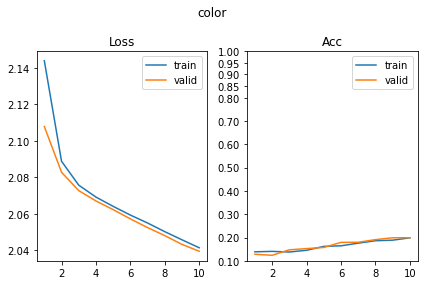

[466/630] angle      SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.89it/s, loss=2.87, acc=0.0472]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.85it/s, loss=2.85, acc=0.0463]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 103.18it/s, loss=2.79, acc=0.0619]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.40it/s, loss=2.79, acc=0.0488]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.50it/s, loss=2.78, acc=0.0619]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.80it/s, loss=2.77, acc=0.0756]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.12it/s, loss=2.77, acc=0.0684]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.74it/s, loss=2.78, acc=0.061]     

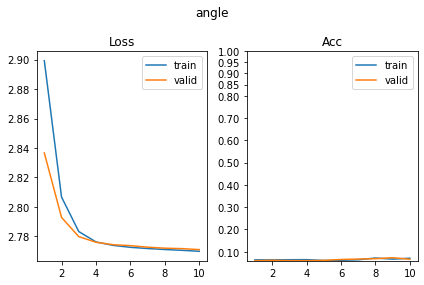

[467/630] py         SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.63it/s, loss=1.4, acc=0.265]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.98it/s, loss=1.41, acc=0.22]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.38it/s, loss=1.39, acc=0.241]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 125.80it/s, loss=1.39, acc=0.217]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.86it/s, loss=1.39, acc=0.246]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.82it/s, loss=1.38, acc=0.263]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.93it/s, loss=1.39, acc=0.236]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.55it/s, loss=1.39, acc=0.224]     

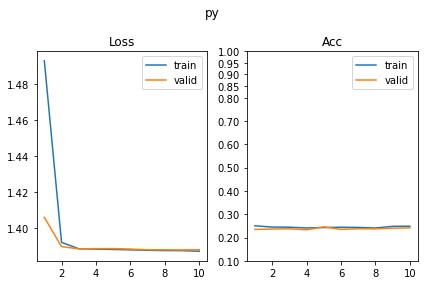

[468/630] px         SUP_[FCN32i223o128_d32]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 107.35it/s, loss=0.826, acc=0.673]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.49it/s, loss=0.833, acc=0.698]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.61it/s, loss=0.507, acc=0.966]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 128.89it/s, loss=0.512, acc=0.954]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.98it/s, loss=0.347, acc=0.976]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 134.98it/s, loss=0.37, acc=0.951]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.39it/s, loss=0.275, acc=0.966]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.71it/s, loss=0.265, acc=0.968]    

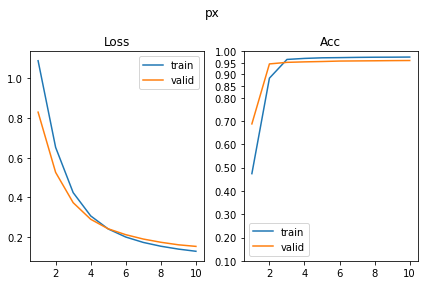

SUP_[FCN32i223o128_d64]_target_[shape]
[469/630] shape      SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.61it/s, loss=0.953, acc=0.863]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.11it/s, loss=0.954, acc=0.854]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.68it/s, loss=0.43, acc=0.997]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.01it/s, loss=0.454, acc=0.98]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 101.62it/s, loss=0.259, acc=0.992]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.70it/s, loss=0.284, acc=0.983]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.44it/s, loss=0.166, acc=0.997]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.32it/s, loss=0.17, acc=0.993]     

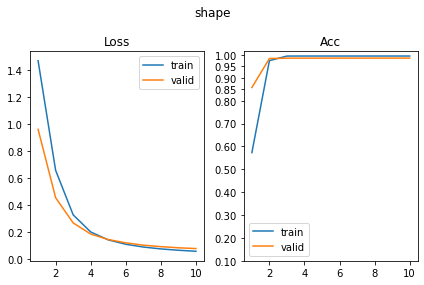

[470/630] scale      SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.17it/s, loss=1.09, acc=0.393]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 100.61it/s, loss=1.09, acc=0.376]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.76it/s, loss=1.09, acc=0.357]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 104.30it/s, loss=1.1, acc=0.332]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 61.23it/s, loss=1.09, acc=0.401]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 86.47it/s, loss=1.09, acc=0.385]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 62.97it/s, loss=1.09, acc=0.384]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.05it/s, loss=1.08, acc=0.424]     

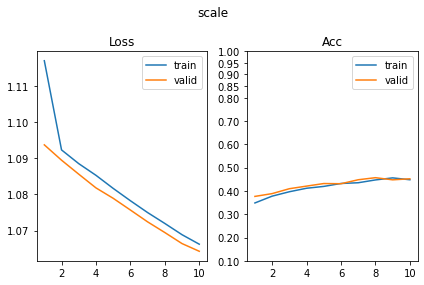

[471/630] color      SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.56it/s, loss=2.1, acc=0.111]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.18it/s, loss=2.1, acc=0.129]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.66it/s, loss=2.09, acc=0.137]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.04it/s, loss=2.08, acc=0.132]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.86it/s, loss=2.08, acc=0.138]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.08it/s, loss=2.08, acc=0.129]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 66.10it/s, loss=2.08, acc=0.15]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 96.64it/s, loss=2.08, acc=0.154]      

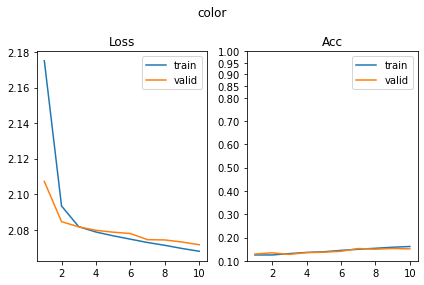

[472/630] angle      SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.65it/s, loss=2.79, acc=0.0635]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 84.44it/s, loss=2.77, acc=0.0707]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.60it/s, loss=2.77, acc=0.0619]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 37.89it/s, loss=2.77, acc=0.0488]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.92it/s, loss=2.76, acc=0.0798]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.14it/s, loss=2.76, acc=0.061]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.19it/s, loss=2.76, acc=0.0733]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.54it/s, loss=2.77, acc=0.0805]    

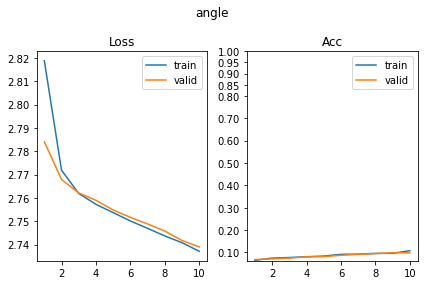

[473/630] py         SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.20it/s, loss=1.38, acc=0.308]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.43it/s, loss=1.38, acc=0.249]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 67.27it/s, loss=1.38, acc=0.264]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 66.33it/s, loss=1.38, acc=0.273]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.25it/s, loss=1.38, acc=0.308]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 137.67it/s, loss=1.38, acc=0.307]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.30it/s, loss=1.38, acc=0.313]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.89it/s, loss=1.38, acc=0.315]     

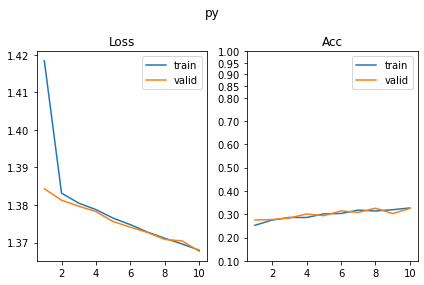

[474/630] px         SUP_[FCN32i223o128_d64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 106.70it/s, loss=1.37, acc=0.275]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 86.69it/s, loss=1.39, acc=0.232]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.02it/s, loss=1.37, acc=0.305]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 97.21it/s, loss=1.37, acc=0.317]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.97it/s, loss=1.37, acc=0.309]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 105.87it/s, loss=1.38, acc=0.302]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.06it/s, loss=1.37, acc=0.336]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 101.18it/s, loss=1.37, acc=0.327]     

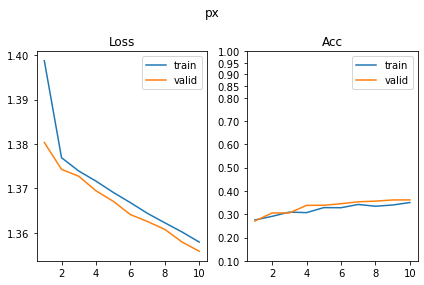

SUP_[FCN32i223o128_d64]_target_[scale]
[475/630] shape      SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.72it/s, loss=1.92, acc=0.191]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 88.27it/s, loss=1.9, acc=0.198]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.64it/s, loss=1.87, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 43.47it/s, loss=1.84, acc=0.283]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.08it/s, loss=1.82, acc=0.282]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 100.24it/s, loss=1.82, acc=0.295]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 60.46it/s, loss=1.76, acc=0.388]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 93.57it/s, loss=1.78, acc=0.31]       

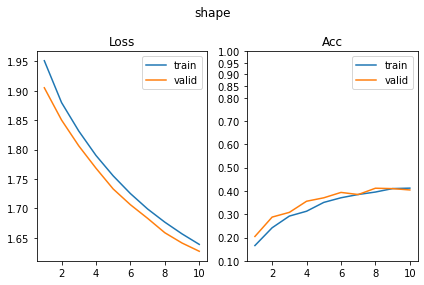

[476/630] scale      SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.38it/s, loss=0.469, acc=0.972]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.15it/s, loss=0.495, acc=0.934]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.26it/s, loss=0.25, acc=0.993]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.50it/s, loss=0.27, acc=0.966]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 71.71it/s, loss=0.176, acc=0.992]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 86.35it/s, loss=0.202, acc=0.98]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.45it/s, loss=0.127, acc=0.995]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.77it/s, loss=0.167, acc=0.963]    

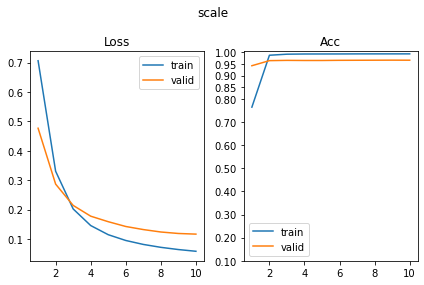

[477/630] color      SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.83it/s, loss=2.08, acc=0.116]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.01it/s, loss=2.09, acc=0.0976]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.52it/s, loss=2.08, acc=0.117]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 93.12it/s, loss=2.08, acc=0.146]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.25it/s, loss=2.08, acc=0.106]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.12it/s, loss=2.08, acc=0.117]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.48it/s, loss=2.08, acc=0.116]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.78it/s, loss=2.08, acc=0.117]     

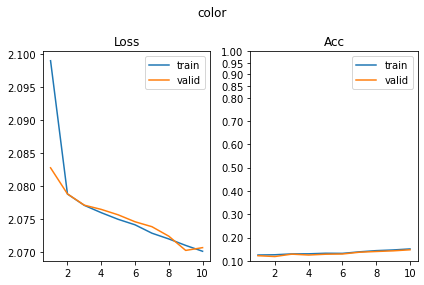

[478/630] angle      SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.00it/s, loss=2.78, acc=0.0765]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 92.15it/s, loss=2.78, acc=0.0537]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 63.25it/s, loss=2.78, acc=0.0619]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 50.00it/s, loss=2.77, acc=0.0707]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.63it/s, loss=2.77, acc=0.07]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.69it/s, loss=2.77, acc=0.0756]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.47it/s, loss=2.77, acc=0.0717]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 117.75it/s, loss=2.77, acc=0.0756]    

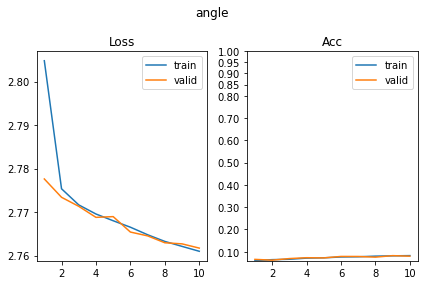

[479/630] py         SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 53.22it/s, loss=1.38, acc=0.279]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 74.39it/s, loss=1.38, acc=0.249]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.99it/s, loss=1.38, acc=0.257]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 130.91it/s, loss=1.38, acc=0.293]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.70it/s, loss=1.38, acc=0.28]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 91.47it/s, loss=1.38, acc=0.273]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.38it/s, loss=1.37, acc=0.322]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 107.85it/s, loss=1.37, acc=0.32]      

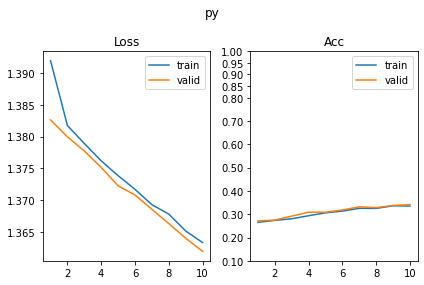

[480/630] px         SUP_[FCN32i223o128_d64]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.89it/s, loss=1.39, acc=0.265]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.82it/s, loss=1.41, acc=0.232]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.69it/s, loss=1.38, acc=0.28]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 110.11it/s, loss=1.38, acc=0.271]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.10it/s, loss=1.38, acc=0.28]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.57it/s, loss=1.38, acc=0.307]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.63it/s, loss=1.38, acc=0.296]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 112.99it/s, loss=1.37, acc=0.298]     

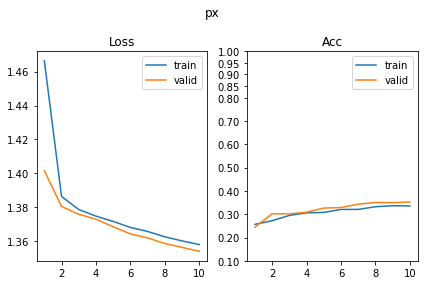

SUP_[FCN32i223o128_d64]_target_[color]
[481/630] shape      SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.89it/s, loss=1.94, acc=0.166]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.16it/s, loss=1.94, acc=0.168]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.69it/s, loss=1.93, acc=0.173]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.17it/s, loss=1.93, acc=0.183]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 102.90it/s, loss=1.94, acc=0.143]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.57it/s, loss=1.93, acc=0.146]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.30it/s, loss=1.92, acc=0.192]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 85.34it/s, loss=1.93, acc=0.137]      

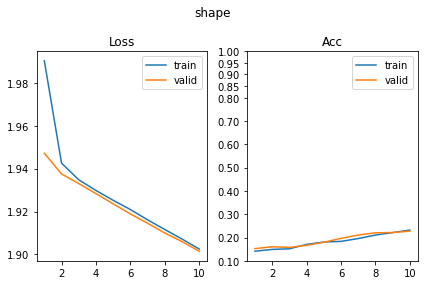

[482/630] scale      SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.72it/s, loss=1.1, acc=0.327]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.26it/s, loss=1.1, acc=0.324]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.88it/s, loss=1.1, acc=0.308]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.77it/s, loss=1.1, acc=0.363]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.17it/s, loss=1.1, acc=0.363]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.77it/s, loss=1.1, acc=0.315]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 67.78it/s, loss=1.1, acc=0.353]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.61it/s, loss=1.1, acc=0.388]      

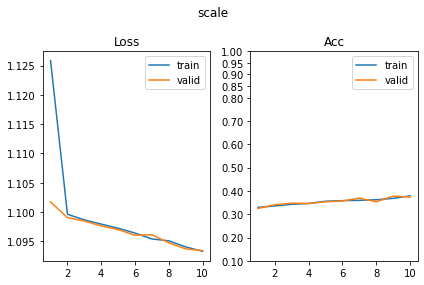

[483/630] color      SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.70it/s, loss=1.03, acc=0.961]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 75.06it/s, loss=0.985, acc=0.98]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.52it/s, loss=0.447, acc=0.998]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 105.74it/s, loss=0.446, acc=0.995]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.96it/s, loss=0.248, acc=0.998]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 103.86it/s, loss=0.232, acc=1]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.33it/s, loss=0.152, acc=0.998]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 121.94it/s, loss=0.147, acc=0.998]    

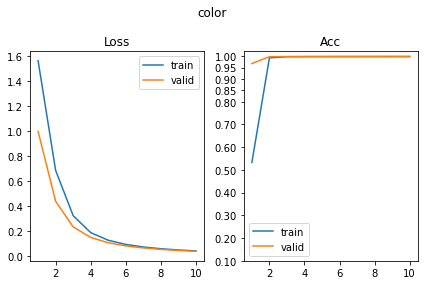

[484/630] angle      SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.14it/s, loss=2.79, acc=0.07]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.17it/s, loss=2.78, acc=0.0707]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 105.18it/s, loss=2.78, acc=0.0603]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 62.22it/s, loss=2.78, acc=0.0439]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 100.68it/s, loss=2.77, acc=0.0603]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.99it/s, loss=2.78, acc=0.0585]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 73.57it/s, loss=2.78, acc=0.0537]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.70it/s, loss=2.77, acc=0.078]     

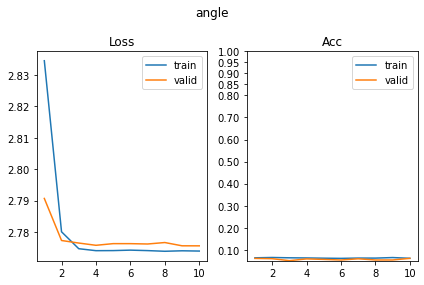

[485/630] py         SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 57.72it/s, loss=1.38, acc=0.285]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.79it/s, loss=1.39, acc=0.246]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.13it/s, loss=1.38, acc=0.254]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 97.99it/s, loss=1.38, acc=0.273]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.13it/s, loss=1.38, acc=0.264]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 131.92it/s, loss=1.38, acc=0.29]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.59it/s, loss=1.38, acc=0.256]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.26it/s, loss=1.38, acc=0.283]     

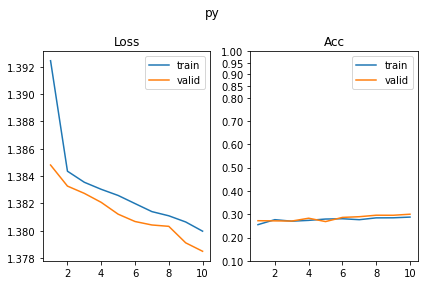

[486/630] px         SUP_[FCN32i223o128_d64]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 102.43it/s, loss=1.39, acc=0.249]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 137.40it/s, loss=1.39, acc=0.263]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.11it/s, loss=1.39, acc=0.261]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 107.88it/s, loss=1.39, acc=0.232]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.19it/s, loss=1.39, acc=0.248]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 110.34it/s, loss=1.39, acc=0.28]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.71it/s, loss=1.39, acc=0.259]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 123.25it/s, loss=1.39, acc=0.239]     

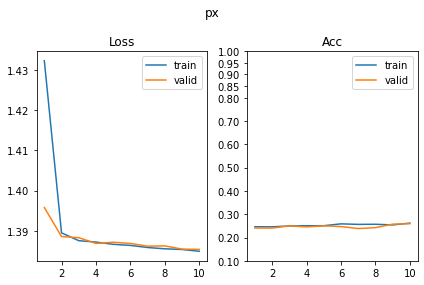

SUP_[FCN32i223o128_d64]_target_[angle]
[487/630] shape      SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.47it/s, loss=1.95, acc=0.178]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 97.20it/s, loss=1.94, acc=0.19]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.47it/s, loss=1.89, acc=0.256]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.33it/s, loss=1.9, acc=0.21]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 63.64it/s, loss=1.82, acc=0.313]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 86.38it/s, loss=1.84, acc=0.28]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.54it/s, loss=1.79, acc=0.353]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 95.18it/s, loss=1.8, acc=0.322]       

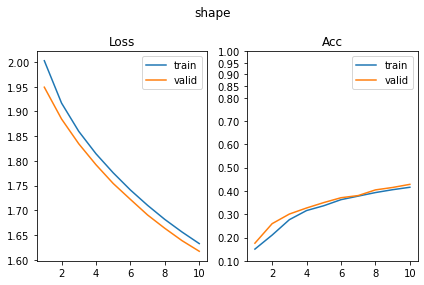

[488/630] scale      SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.37it/s, loss=1.13, acc=0.347]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 85.25it/s, loss=1.12, acc=0.339]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.75it/s, loss=1.1, acc=0.34]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 93.85it/s, loss=1.11, acc=0.337]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.36it/s, loss=1.1, acc=0.363]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 107.08it/s, loss=1.11, acc=0.324]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.66it/s, loss=1.1, acc=0.332]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.56it/s, loss=1.1, acc=0.351]       

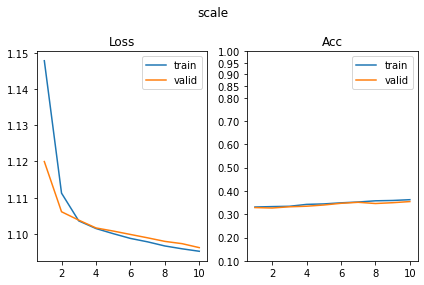

[489/630] color      SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.63it/s, loss=2.12, acc=0.13]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 83.25it/s, loss=2.09, acc=0.122]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.11it/s, loss=2.1, acc=0.132]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 139.49it/s, loss=2.11, acc=0.107]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.23it/s, loss=2.09, acc=0.121]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.22it/s, loss=2.1, acc=0.107]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.83it/s, loss=2.08, acc=0.138]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.10it/s, loss=2.08, acc=0.124]     

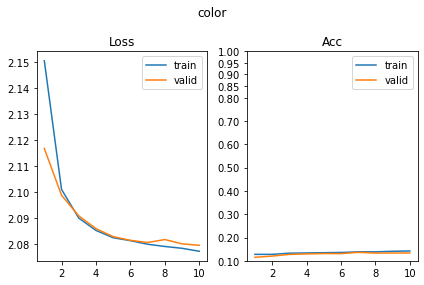

[490/630] angle      SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.23it/s, loss=1.98, acc=0.65]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 86.12it/s, loss=2.15, acc=0.42]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.26it/s, loss=1.33, acc=0.863]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.15it/s, loss=1.64, acc=0.6]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 107.49it/s, loss=0.949, acc=0.928]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 112.73it/s, loss=1.32, acc=0.607]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.29it/s, loss=0.723, acc=0.945]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.18it/s, loss=1.21, acc=0.598]     

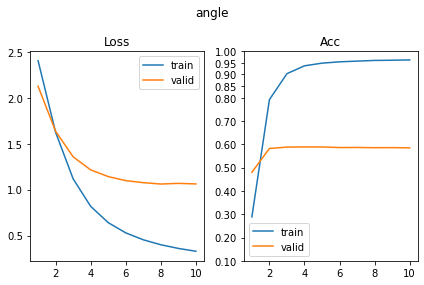

[491/630] py         SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.34it/s, loss=1.4, acc=0.272]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 90.59it/s, loss=1.41, acc=0.256]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.70it/s, loss=1.41, acc=0.256]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.84it/s, loss=1.39, acc=0.246]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 72.68it/s, loss=1.39, acc=0.272]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 101.37it/s, loss=1.39, acc=0.276]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 71.53it/s, loss=1.38, acc=0.3]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 90.74it/s, loss=1.38, acc=0.263]      

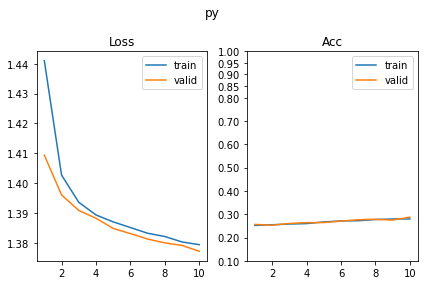

[492/630] px         SUP_[FCN32i223o128_d64]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 111.95it/s, loss=1.39, acc=0.279]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.21it/s, loss=1.41, acc=0.207]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.70it/s, loss=1.38, acc=0.282]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.07it/s, loss=1.4, acc=0.261]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.79it/s, loss=1.38, acc=0.279]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 129.37it/s, loss=1.39, acc=0.268]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 100.35it/s, loss=1.38, acc=0.285]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 139.69it/s, loss=1.39, acc=0.288]     

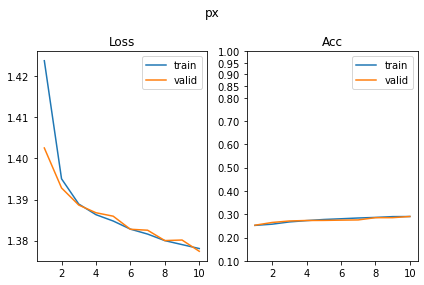

SUP_[FCN32i223o128_d64]_target_[py]
[493/630] shape      SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.91it/s, loss=1.94, acc=0.16]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.58it/s, loss=1.95, acc=0.146]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.58it/s, loss=1.93, acc=0.235]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 52.82it/s, loss=1.93, acc=0.237]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.27it/s, loss=1.91, acc=0.265]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 119.66it/s, loss=1.91, acc=0.29]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.81it/s, loss=1.9, acc=0.264]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 98.90it/s, loss=1.9, acc=0.276]       

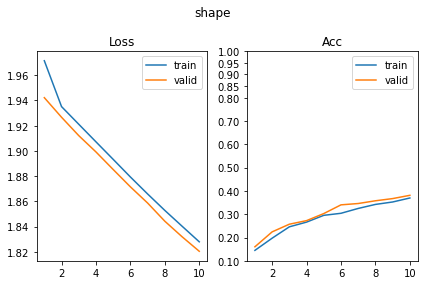

[494/630] scale      SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.00it/s, loss=1.1, acc=0.381]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 118.00it/s, loss=1.1, acc=0.354]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.17it/s, loss=1.1, acc=0.378]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 81.79it/s, loss=1.1, acc=0.337]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 69.91it/s, loss=1.09, acc=0.345]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 81.56it/s, loss=1.09, acc=0.393]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 61.43it/s, loss=1.09, acc=0.373]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 78.52it/s, loss=1.1, acc=0.334]       

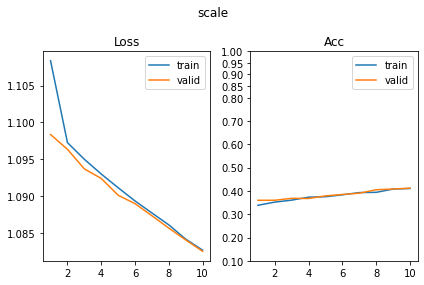

[495/630] color      SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 104.25it/s, loss=2.07, acc=0.155]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 120.76it/s, loss=2.08, acc=0.124]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.16it/s, loss=2.07, acc=0.16]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.96it/s, loss=2.08, acc=0.146]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.99it/s, loss=2.08, acc=0.121]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 134.20it/s, loss=2.07, acc=0.163]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.46it/s, loss=2.07, acc=0.151]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.45it/s, loss=2.08, acc=0.0951]    

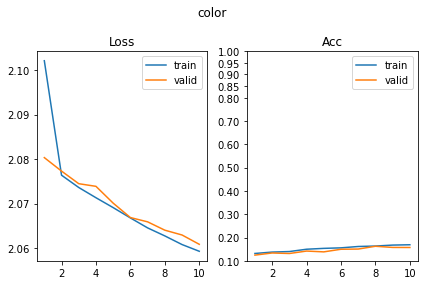

[496/630] angle      SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.54it/s, loss=2.78, acc=0.0651]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 87.12it/s, loss=2.79, acc=0.0561]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 70.64it/s, loss=2.78, acc=0.0537]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 44.37it/s, loss=2.78, acc=0.0732]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.70it/s, loss=2.77, acc=0.0717]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 98.72it/s, loss=2.77, acc=0.0659]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 74.91it/s, loss=2.77, acc=0.0749]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.67it/s, loss=2.77, acc=0.0951]    

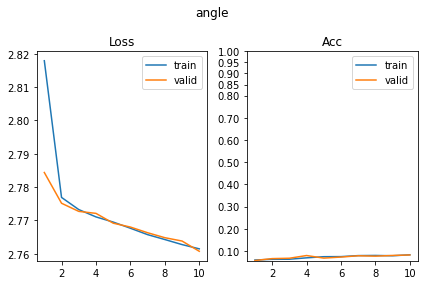

[497/630] py         SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.98it/s, loss=0.659, acc=0.997]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 105.10it/s, loss=0.659, acc=0.98]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.77it/s, loss=0.332, acc=0.989]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 122.05it/s, loss=0.344, acc=0.983]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.82it/s, loss=0.216, acc=0.992]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 94.48it/s, loss=0.237, acc=0.973]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.55it/s, loss=0.146, acc=0.997]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 108.20it/s, loss=0.171, acc=0.973]    

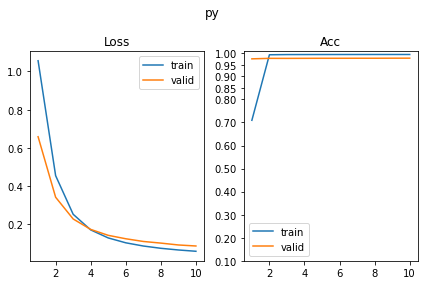

[498/630] px         SUP_[FCN32i223o128_d64]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.89it/s, loss=1.39, acc=0.23]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.42it/s, loss=1.39, acc=0.241]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.91it/s, loss=1.39, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.50it/s, loss=1.39, acc=0.246]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 82.37it/s, loss=1.39, acc=0.264]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.26it/s, loss=1.39, acc=0.249]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.07it/s, loss=1.39, acc=0.259]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.66it/s, loss=1.39, acc=0.227]     

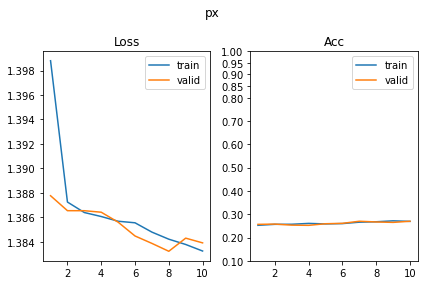

SUP_[FCN32i223o128_d64]_target_[px]
[499/630] shape      SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.13it/s, loss=1.95, acc=0.155]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 98.81it/s, loss=1.95, acc=0.166]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.17it/s, loss=1.94, acc=0.179]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 72.29it/s, loss=1.92, acc=0.244]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 122.89it/s, loss=1.93, acc=0.217]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.88it/s, loss=1.93, acc=0.178]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.80it/s, loss=1.91, acc=0.27]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.31it/s, loss=1.91, acc=0.263]     

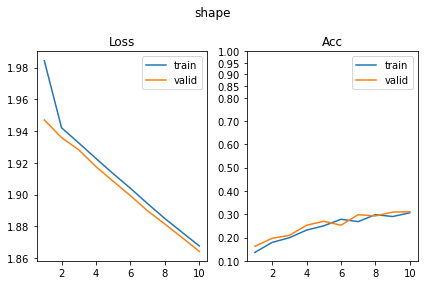

[500/630] scale      SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.39it/s, loss=1.11, acc=0.345]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.32it/s, loss=1.1, acc=0.346]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.77it/s, loss=1.1, acc=0.35]                                             
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.57it/s, loss=1.09, acc=0.383]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.49it/s, loss=1.1, acc=0.357]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.95it/s, loss=1.09, acc=0.363]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.05it/s, loss=1.1, acc=0.353]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.52it/s, loss=1.09, acc=0.388]     

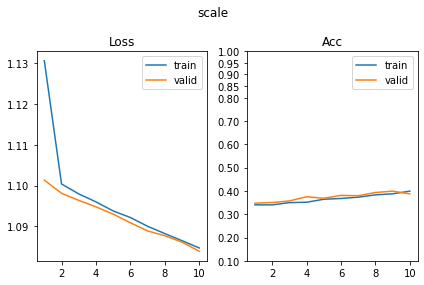

[501/630] color      SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.69it/s, loss=2.09, acc=0.106]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.65it/s, loss=2.09, acc=0.105]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.94it/s, loss=2.08, acc=0.0961]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 115.74it/s, loss=2.08, acc=0.139]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.35it/s, loss=2.07, acc=0.129]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 86.35it/s, loss=2.07, acc=0.129]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.63it/s, loss=2.07, acc=0.127]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 111.81it/s, loss=2.07, acc=0.12]      

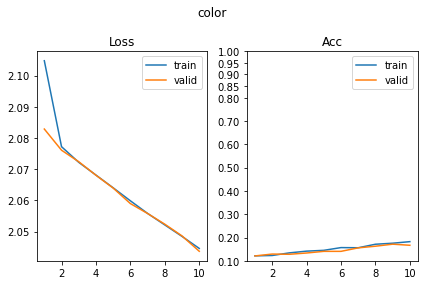

[502/630] angle      SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.99it/s, loss=2.78, acc=0.0619]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.27it/s, loss=2.78, acc=0.0707]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 115.43it/s, loss=2.78, acc=0.0619]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.79it/s, loss=2.77, acc=0.0561]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.11it/s, loss=2.78, acc=0.057]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 133.70it/s, loss=2.77, acc=0.078]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.84it/s, loss=2.77, acc=0.0635]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 126.09it/s, loss=2.76, acc=0.105]     

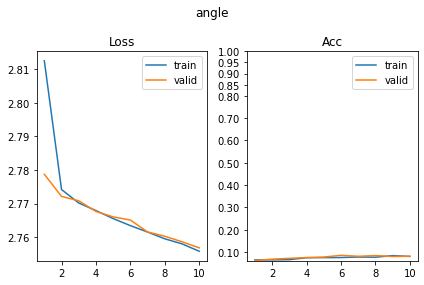

[503/630] py         SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 82.75it/s, loss=1.39, acc=0.251]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 124.27it/s, loss=1.39, acc=0.278]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.39it/s, loss=1.39, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.64it/s, loss=1.39, acc=0.237]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.62it/s, loss=1.39, acc=0.275]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.89it/s, loss=1.38, acc=0.302]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.17it/s, loss=1.39, acc=0.238]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 94.19it/s, loss=1.39, acc=0.251]      

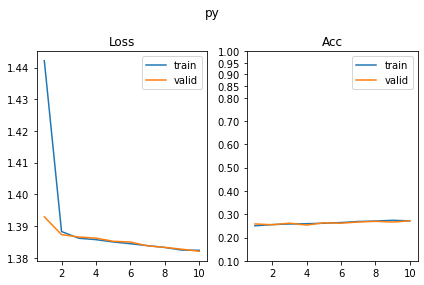

[504/630] px         SUP_[FCN32i223o128_d64]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.48it/s, loss=0.737, acc=0.946]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 64.20it/s, loss=0.747, acc=0.912]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 125.01it/s, loss=0.389, acc=0.985]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 95.19it/s, loss=0.414, acc=0.978]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 74.52it/s, loss=0.256, acc=0.987]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.29it/s, loss=0.279, acc=0.973]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.46it/s, loss=0.184, acc=0.99]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 129.56it/s, loss=0.214, acc=0.973]    

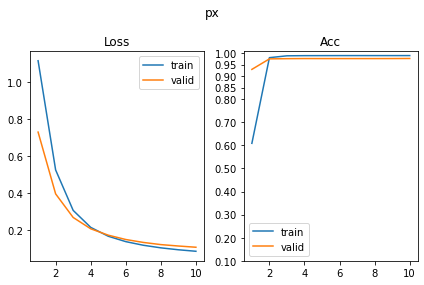

SUP_[FCN32i223o128_d128]_target_[shape]
[505/630] shape      SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.60it/s, loss=0.543, acc=0.99]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 102.96it/s, loss=0.539, acc=0.995]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 96.23it/s, loss=0.191, acc=0.997]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.41it/s, loss=0.228, acc=0.983]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 98.68it/s, loss=0.117, acc=0.997]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 72.42it/s, loss=0.117, acc=0.993]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.75it/s, loss=0.0766, acc=0.995]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.15it/s, loss=0.0934, acc=0.99]    

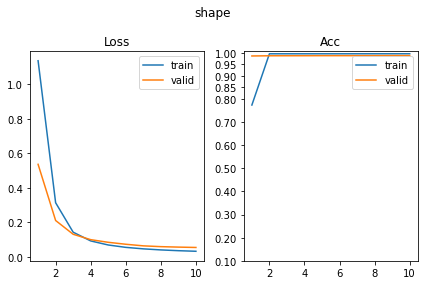

[506/630] scale      SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.77it/s, loss=1.09, acc=0.347]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.32it/s, loss=1.1, acc=0.315]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.34it/s, loss=1.09, acc=0.384]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.19it/s, loss=1.09, acc=0.361]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.07it/s, loss=1.07, acc=0.435]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.67it/s, loss=1.07, acc=0.398]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 100.94it/s, loss=1.07, acc=0.461]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.25it/s, loss=1.07, acc=0.48]      

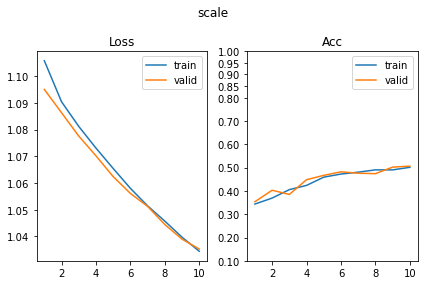

[507/630] color      SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 109.27it/s, loss=2.08, acc=0.156]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 86.18it/s, loss=2.08, acc=0.115]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.54it/s, loss=2.08, acc=0.125]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 123.58it/s, loss=2.08, acc=0.151]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.03it/s, loss=2.07, acc=0.164]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.69it/s, loss=2.07, acc=0.137]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.13it/s, loss=2.08, acc=0.142]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 127.45it/s, loss=2.07, acc=0.154]     

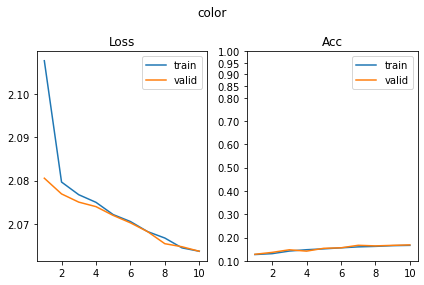

[508/630] angle      SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.02it/s, loss=2.78, acc=0.0586]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.75it/s, loss=2.75, acc=0.0976]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.30it/s, loss=2.75, acc=0.0912]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.33it/s, loss=2.76, acc=0.0951]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 102.30it/s, loss=2.75, acc=0.0993]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 113.49it/s, loss=2.74, acc=0.115]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.29it/s, loss=2.73, acc=0.129]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 118.78it/s, loss=2.73, acc=0.105]     

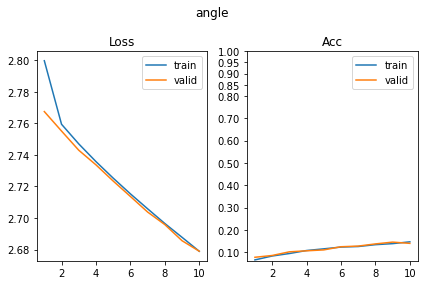

[509/630] py         SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 82.49it/s, loss=1.39, acc=0.27]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.19it/s, loss=1.37, acc=0.288]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.24it/s, loss=1.38, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 95.07it/s, loss=1.38, acc=0.295]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.55it/s, loss=1.37, acc=0.316]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 94.19it/s, loss=1.38, acc=0.29]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 68.30it/s, loss=1.37, acc=0.305]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 105.24it/s, loss=1.37, acc=0.327]     

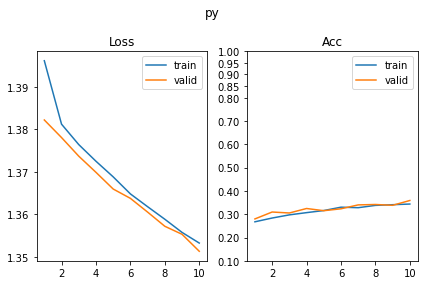

[510/630] px         SUP_[FCN32i223o128_d128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 121.06it/s, loss=1.38, acc=0.269]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 113.96it/s, loss=1.39, acc=0.244]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.38it/s, loss=1.37, acc=0.301]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 70.80it/s, loss=1.38, acc=0.276]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.60it/s, loss=1.37, acc=0.292]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 127.92it/s, loss=1.37, acc=0.288]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.56it/s, loss=1.36, acc=0.331]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.40it/s, loss=1.37, acc=0.317]     

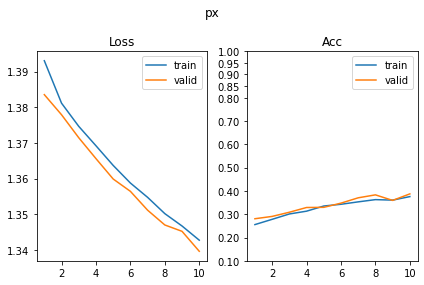

SUP_[FCN32i223o128_d128]_target_[scale]
[511/630] shape      SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.86it/s, loss=1.91, acc=0.228]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.71it/s, loss=1.91, acc=0.244]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 107.63it/s, loss=1.87, acc=0.353]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.17it/s, loss=1.87, acc=0.351]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 98.27it/s, loss=1.82, acc=0.376]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 134.17it/s, loss=1.82, acc=0.407]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 98.57it/s, loss=1.79, acc=0.432]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.12it/s, loss=1.77, acc=0.454]     

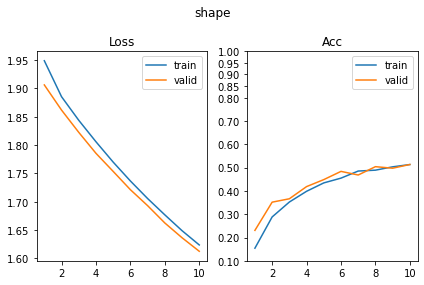

[512/630] scale      SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.25it/s, loss=0.363, acc=0.99]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 106.50it/s, loss=0.385, acc=0.961]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.75it/s, loss=0.193, acc=0.998]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 121.65it/s, loss=0.228, acc=0.961]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.45it/s, loss=0.141, acc=0.995]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 116.50it/s, loss=0.201, acc=0.959]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.54it/s, loss=0.102, acc=0.995]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 120.93it/s, loss=0.165, acc=0.968]    

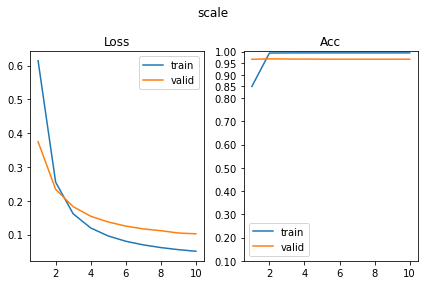

[513/630] color      SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.42it/s, loss=2.09, acc=0.15]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.10it/s, loss=2.09, acc=0.122]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.70it/s, loss=2.08, acc=0.119]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 126.98it/s, loss=2.08, acc=0.159]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.92it/s, loss=2.07, acc=0.153]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 130.23it/s, loss=2.07, acc=0.149]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.93it/s, loss=2.08, acc=0.135]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 126.17it/s, loss=2.07, acc=0.137]     

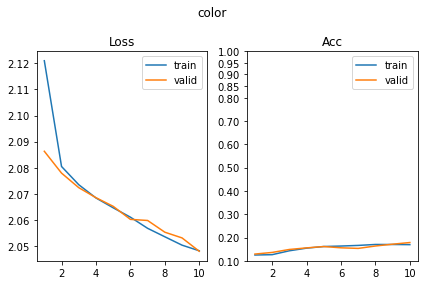

[514/630] angle      SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.75it/s, loss=2.78, acc=0.057]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 103.86it/s, loss=2.78, acc=0.0829]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 99.18it/s, loss=2.78, acc=0.044]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.56it/s, loss=2.77, acc=0.078]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.29it/s, loss=2.76, acc=0.0765]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.67it/s, loss=2.77, acc=0.0439]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.96it/s, loss=2.76, acc=0.0717]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.13it/s, loss=2.74, acc=0.0951]    

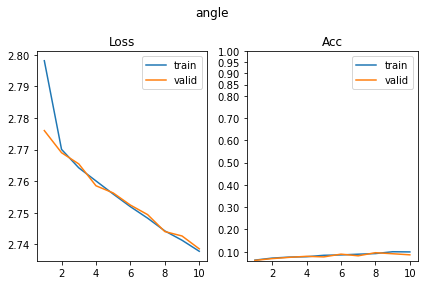

[515/630] py         SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.86it/s, loss=1.38, acc=0.301]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.17it/s, loss=1.37, acc=0.317]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.89it/s, loss=1.36, acc=0.34]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.03it/s, loss=1.37, acc=0.312]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.96it/s, loss=1.35, acc=0.396]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.05it/s, loss=1.36, acc=0.388]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.61it/s, loss=1.36, acc=0.337]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.41it/s, loss=1.34, acc=0.42]      

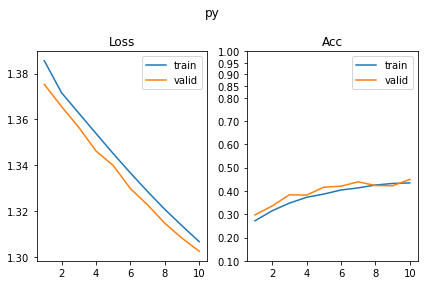

[516/630] px         SUP_[FCN32i223o128_d128]_target_[scale]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 101.89it/s, loss=1.38, acc=0.288]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 98.40it/s, loss=1.38, acc=0.285]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.94it/s, loss=1.38, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.59it/s, loss=1.37, acc=0.337]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.98it/s, loss=1.37, acc=0.345]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 128.27it/s, loss=1.36, acc=0.388]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.52it/s, loss=1.36, acc=0.329]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.56it/s, loss=1.36, acc=0.324]     

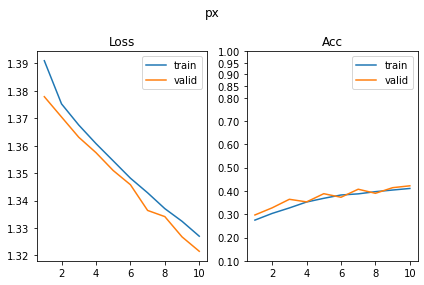

SUP_[FCN32i223o128_d128]_target_[color]
[517/630] shape      SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 75.97it/s, loss=1.94, acc=0.171]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 127.53it/s, loss=1.96, acc=0.129]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.49it/s, loss=1.94, acc=0.148]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.29it/s, loss=1.94, acc=0.183]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.02it/s, loss=1.93, acc=0.189]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 102.62it/s, loss=1.93, acc=0.229]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.70it/s, loss=1.92, acc=0.249]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.80it/s, loss=1.92, acc=0.241]     

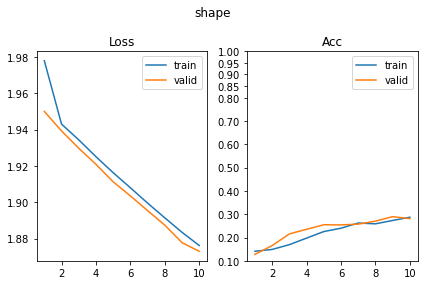

[518/630] scale      SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.59it/s, loss=1.1, acc=0.339]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 71.61it/s, loss=1.1, acc=0.337]                                              
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 63.52it/s, loss=1.1, acc=0.355]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.49it/s, loss=1.1, acc=0.324]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.59it/s, loss=1.1, acc=0.352]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 117.29it/s, loss=1.1, acc=0.376]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.62it/s, loss=1.1, acc=0.363]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 103.75it/s, loss=1.09, acc=0.39]      

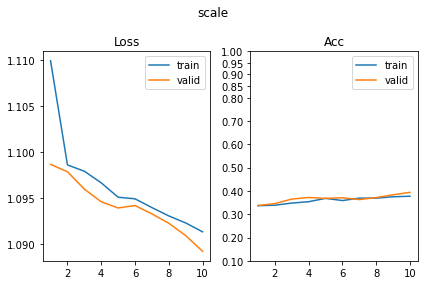

[519/630] color      SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 107.00it/s, loss=0.486, acc=1]                                             
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 130.87it/s, loss=0.457, acc=1]                                               
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.62it/s, loss=0.122, acc=1]                                              
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 113.19it/s, loss=0.123, acc=1]                                               
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.12it/s, loss=0.0623, acc=1]                                             
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 132.74it/s, loss=0.063, acc=1]                                               
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.18it/s, loss=0.0412, acc=1]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 114.05it/s, loss=0.0435, acc=1]       

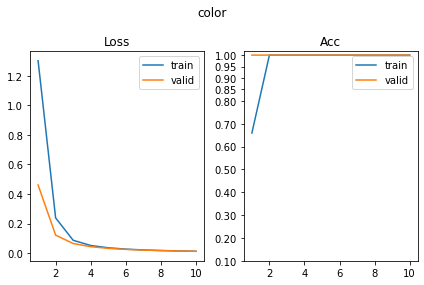

[520/630] angle      SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.46it/s, loss=2.78, acc=0.0554]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 121.33it/s, loss=2.78, acc=0.0439]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.90it/s, loss=2.78, acc=0.0554]                                          
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 55.65it/s, loss=2.77, acc=0.0683]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 108.07it/s, loss=2.78, acc=0.0521]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 120.17it/s, loss=2.78, acc=0.0512]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.39it/s, loss=2.78, acc=0.0668]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.09it/s, loss=2.78, acc=0.0463]    

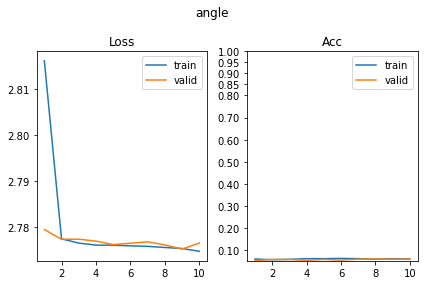

[521/630] py         SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.23it/s, loss=1.39, acc=0.257]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 97.01it/s, loss=1.39, acc=0.237]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.83it/s, loss=1.39, acc=0.243]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 100.83it/s, loss=1.38, acc=0.29]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 68.45it/s, loss=1.39, acc=0.239]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 106.97it/s, loss=1.39, acc=0.271]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.82it/s, loss=1.38, acc=0.267]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 102.35it/s, loss=1.38, acc=0.273]     

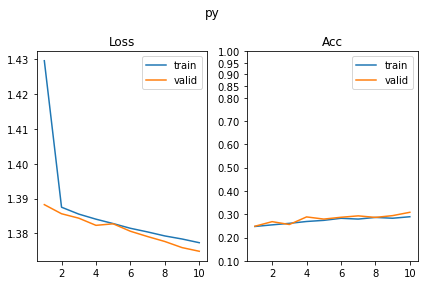

[522/630] px         SUP_[FCN32i223o128_d128]_target_[color]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.13it/s, loss=1.39, acc=0.261]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 133.82it/s, loss=1.39, acc=0.224]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.46it/s, loss=1.39, acc=0.262]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 134.75it/s, loss=1.39, acc=0.2]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 82.00it/s, loss=1.38, acc=0.282]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 114.08it/s, loss=1.39, acc=0.259]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.54it/s, loss=1.39, acc=0.241]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 109.94it/s, loss=1.39, acc=0.241]     

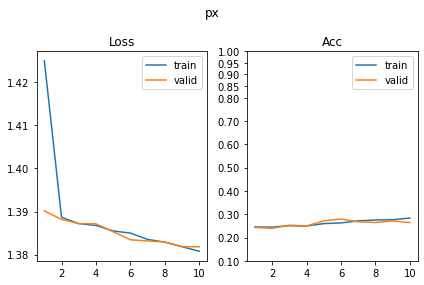

SUP_[FCN32i223o128_d128]_target_[angle]
[523/630] shape      SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.84it/s, loss=1.91, acc=0.215]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 138.26it/s, loss=1.87, acc=0.268]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 125.75it/s, loss=1.81, acc=0.27]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.97it/s, loss=1.81, acc=0.261]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 114.52it/s, loss=1.74, acc=0.319]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 135.94it/s, loss=1.73, acc=0.349]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.19it/s, loss=1.65, acc=0.41]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.30it/s, loss=1.66, acc=0.41]      

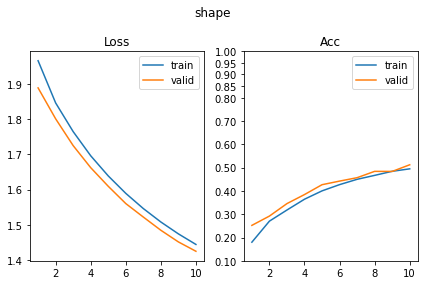

[524/630] scale      SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.51it/s, loss=1.1, acc=0.345]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.28it/s, loss=1.11, acc=0.339]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.17it/s, loss=1.1, acc=0.349]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 109.51it/s, loss=1.1, acc=0.344]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.37it/s, loss=1.09, acc=0.358]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 91.36it/s, loss=1.1, acc=0.363]                                              
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.15it/s, loss=1.1, acc=0.334]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.72it/s, loss=1.09, acc=0.41]      

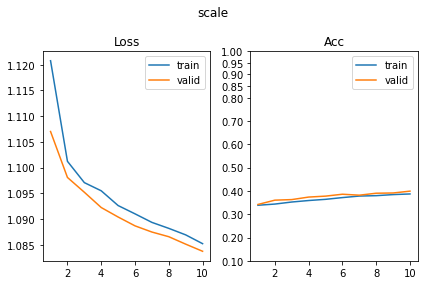

[525/630] color      SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 99.00it/s, loss=2.11, acc=0.119]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 105.66it/s, loss=2.08, acc=0.141]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 77.57it/s, loss=2.09, acc=0.125]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 124.33it/s, loss=2.08, acc=0.139]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.11it/s, loss=2.08, acc=0.145]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 118.04it/s, loss=2.08, acc=0.122]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.04it/s, loss=2.07, acc=0.171]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 138.47it/s, loss=2.06, acc=0.168]     

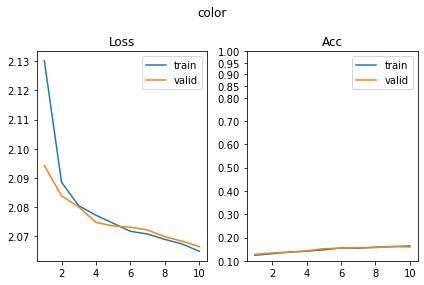

[526/630] angle      SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.23it/s, loss=1.61, acc=0.798]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.13it/s, loss=1.8, acc=0.551]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.86it/s, loss=0.883, acc=0.951]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.54it/s, loss=1.31, acc=0.578]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 115.01it/s, loss=0.563, acc=0.963]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 137.00it/s, loss=1.15, acc=0.571]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.47it/s, loss=0.45, acc=0.961]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 125.81it/s, loss=1.06, acc=0.595]     

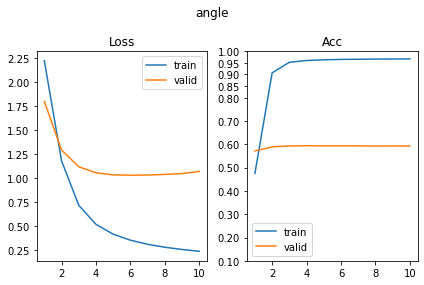

[527/630] py         SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.72it/s, loss=1.4, acc=0.254]                                            
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 122.18it/s, loss=1.39, acc=0.271]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.98it/s, loss=1.39, acc=0.269]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 123.09it/s, loss=1.38, acc=0.298]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.01it/s, loss=1.38, acc=0.29]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.87it/s, loss=1.39, acc=0.237]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.44it/s, loss=1.39, acc=0.23]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 113.59it/s, loss=1.37, acc=0.302]     

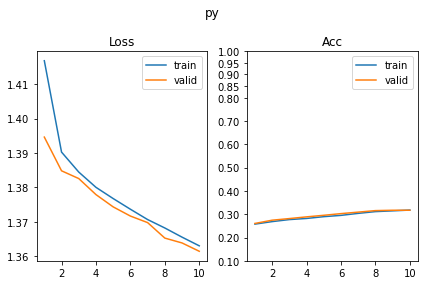

[528/630] px         SUP_[FCN32i223o128_d128]_target_[angle]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 120.18it/s, loss=1.42, acc=0.238]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 134.86it/s, loss=1.42, acc=0.244]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.23it/s, loss=1.4, acc=0.252]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 104.22it/s, loss=1.38, acc=0.246]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 68.72it/s, loss=1.39, acc=0.261]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 93.05it/s, loss=1.38, acc=0.285]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 60.36it/s, loss=1.38, acc=0.28]                                            
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 82.91it/s, loss=1.38, acc=0.3]        

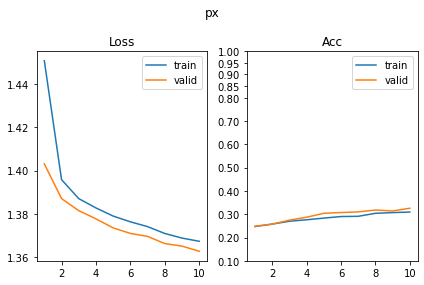

SUP_[FCN32i223o128_d128]_target_[py]
[529/630] shape      SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.81it/s, loss=1.92, acc=0.181]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 112.60it/s, loss=1.91, acc=0.188]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 96.19it/s, loss=1.87, acc=0.303]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.42it/s, loss=1.88, acc=0.288]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 105.50it/s, loss=1.86, acc=0.308]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.54it/s, loss=1.85, acc=0.293]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.10it/s, loss=1.84, acc=0.303]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 96.30it/s, loss=1.81, acc=0.341]      

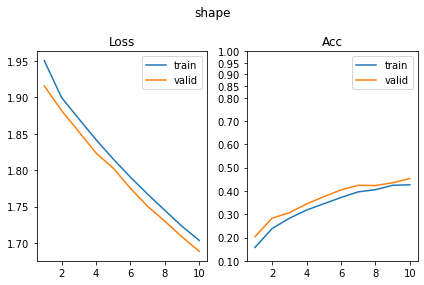

[530/630] scale      SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.91it/s, loss=1.11, acc=0.303]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 128.51it/s, loss=1.1, acc=0.322]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.69it/s, loss=1.1, acc=0.337]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 127.79it/s, loss=1.1, acc=0.317]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.51it/s, loss=1.09, acc=0.378]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.11it/s, loss=1.09, acc=0.351]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 98.31it/s, loss=1.1, acc=0.34]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 137.83it/s, loss=1.09, acc=0.346]     

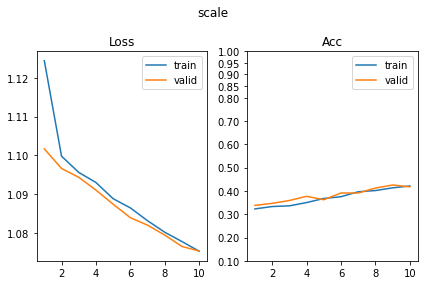

[531/630] color      SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.54it/s, loss=2.07, acc=0.156]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 111.09it/s, loss=2.09, acc=0.105]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.17it/s, loss=2.08, acc=0.15]                                            
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 103.95it/s, loss=2.07, acc=0.173]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.71it/s, loss=2.08, acc=0.132]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 70.43it/s, loss=2.07, acc=0.156]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.55it/s, loss=2.07, acc=0.161]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 100.65it/s, loss=2.08, acc=0.12]      

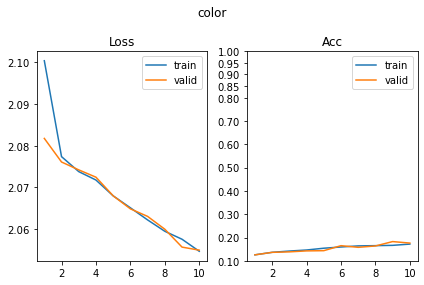

[532/630] angle      SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.25it/s, loss=2.77, acc=0.0651]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 131.91it/s, loss=2.78, acc=0.0537]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 114.48it/s, loss=2.77, acc=0.0521]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 61.54it/s, loss=2.77, acc=0.0756]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 100.65it/s, loss=2.76, acc=0.0684]                                         
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.32it/s, loss=2.76, acc=0.0659]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.46it/s, loss=2.76, acc=0.0814]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 128.90it/s, loss=2.76, acc=0.0829]    

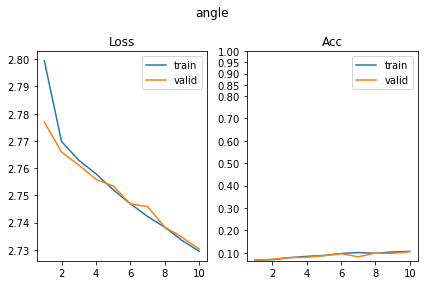

[533/630] py         SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.66it/s, loss=0.345, acc=1]                                              
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 129.53it/s, loss=0.368, acc=0.976]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.02it/s, loss=0.16, acc=0.993]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 129.52it/s, loss=0.191, acc=0.978]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.50it/s, loss=0.113, acc=0.993]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 126.90it/s, loss=0.149, acc=0.976]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.32it/s, loss=0.0827, acc=0.993]                                         
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.52it/s, loss=0.0828, acc=0.995]   

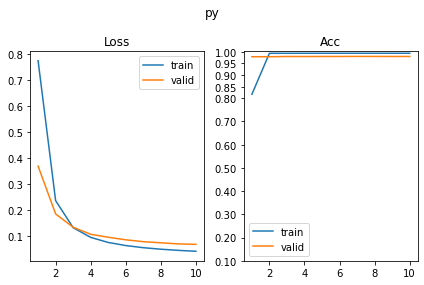

[534/630] px         SUP_[FCN32i223o128_d128]_target_[py]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 106.01it/s, loss=1.39, acc=0.246]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 104.89it/s, loss=1.38, acc=0.283]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 74.17it/s, loss=1.39, acc=0.238]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 102.39it/s, loss=1.39, acc=0.249]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.33it/s, loss=1.39, acc=0.233]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.78it/s, loss=1.39, acc=0.266]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.96it/s, loss=1.39, acc=0.205]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 98.43it/s, loss=1.39, acc=0.251]      

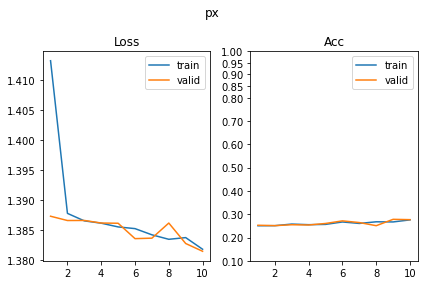

SUP_[FCN32i223o128_d128]_target_[px]
[535/630] shape      SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.91it/s, loss=1.94, acc=0.168]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 101.10it/s, loss=1.93, acc=0.188]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 110.56it/s, loss=1.9, acc=0.231]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 64.97it/s, loss=1.9, acc=0.234]                                              
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 113.18it/s, loss=1.87, acc=0.254]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.53it/s, loss=1.88, acc=0.266]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.50it/s, loss=1.86, acc=0.277]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 132.17it/s, loss=1.85, acc=0.288]     

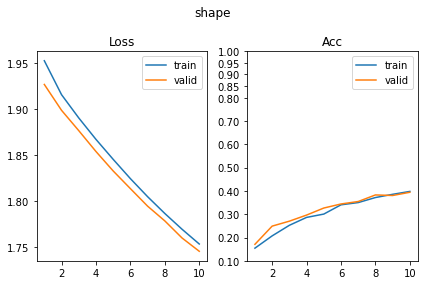

[536/630] scale      SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.64it/s, loss=1.09, acc=0.373]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 114.96it/s, loss=1.09, acc=0.385]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.80it/s, loss=1.08, acc=0.384]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 112.12it/s, loss=1.09, acc=0.378]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.39it/s, loss=1.08, acc=0.402]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 111.44it/s, loss=1.07, acc=0.41]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.53it/s, loss=1.08, acc=0.401]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 122.67it/s, loss=1.07, acc=0.441]     

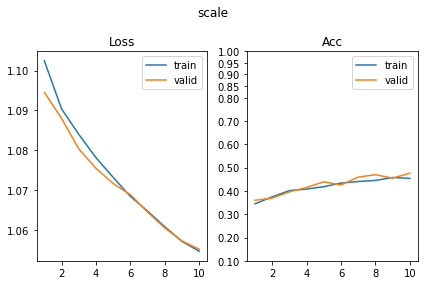

[537/630] color      SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 109.21it/s, loss=2.08, acc=0.101]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.13it/s, loss=2.08, acc=0.105]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.97it/s, loss=2.07, acc=0.138]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 136.48it/s, loss=2.07, acc=0.137]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.75it/s, loss=2.08, acc=0.138]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 124.57it/s, loss=2.07, acc=0.146]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.83it/s, loss=2.06, acc=0.168]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 124.55it/s, loss=2.07, acc=0.129]     

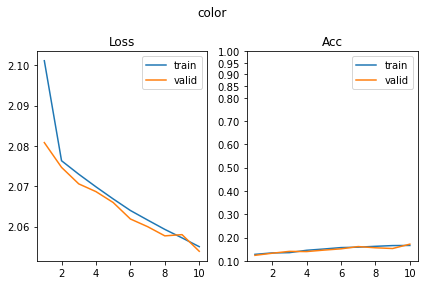

[538/630] angle      SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.38it/s, loss=2.76, acc=0.0684]                                          
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 125.35it/s, loss=2.77, acc=0.061]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 105.75it/s, loss=2.75, acc=0.0814]                                         
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 63.62it/s, loss=2.75, acc=0.0902]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 104.59it/s, loss=2.74, acc=0.107]                                          
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 115.69it/s, loss=2.74, acc=0.107]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.79it/s, loss=2.74, acc=0.0879]                                          
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 119.36it/s, loss=2.73, acc=0.122]     

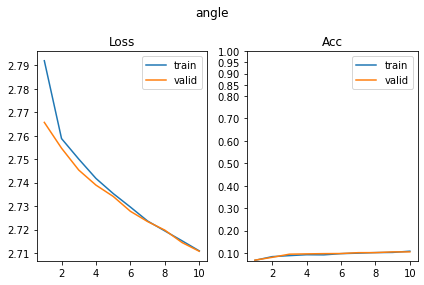

[539/630] py         SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 72.84it/s, loss=1.38, acc=0.261]                                           
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 110.28it/s, loss=1.39, acc=0.276]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.08it/s, loss=1.38, acc=0.285]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 95.00it/s, loss=1.39, acc=0.259]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.62it/s, loss=1.39, acc=0.27]                                            
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 123.96it/s, loss=1.39, acc=0.212]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 81.20it/s, loss=1.38, acc=0.275]                                           
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 95.22it/s, loss=1.38, acc=0.302]      

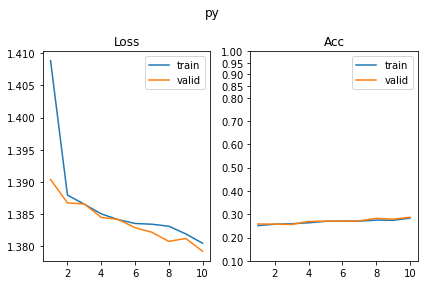

[540/630] px         SUP_[FCN32i223o128_d128]_target_[px]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 111.35it/s, loss=0.402, acc=0.998]                                         
Epoch [  1/ 10] valid:██████████| 9/9 [00:00<00:00, 126.65it/s, loss=0.431, acc=0.985]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.80it/s, loss=0.18, acc=0.992]                                           
Epoch [  2/ 10] valid:██████████| 9/9 [00:00<00:00, 132.45it/s, loss=0.206, acc=0.988]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.69it/s, loss=0.124, acc=0.99]                                           
Epoch [  3/ 10] valid:██████████| 9/9 [00:00<00:00, 121.71it/s, loss=0.129, acc=0.993]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.90it/s, loss=0.0836, acc=1]                                             
Epoch [  4/ 10] valid:██████████| 9/9 [00:00<00:00, 131.74it/s, loss=0.113, acc=0.978]    

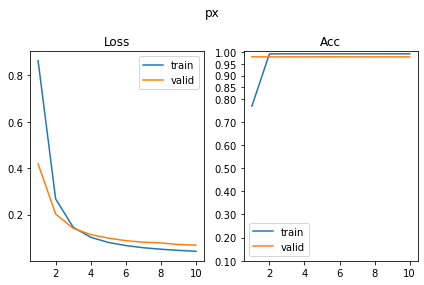

BTwins_[FCN8i223o32_d_8]_target_[shape]
[541/630] shape      BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.55it/s, loss=1.97, acc=0.154]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 80.81it/s, loss=1.97, acc=0.137]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.68it/s, loss=1.93, acc=0.166]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 96.58it/s, loss=1.94, acc=0.107]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.47it/s, loss=1.93, acc=0.139]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 74.66it/s, loss=1.93, acc=0.158]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.82it/s, loss=1.91, acc=0.178]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 91.38it/s, loss=1.89, acc=0.223]    

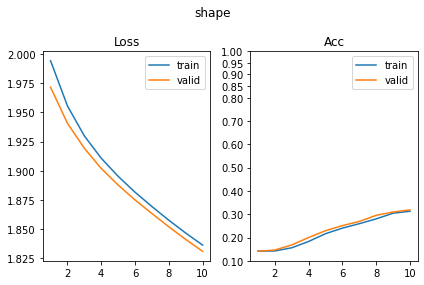

[542/630] scale      BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.46it/s, loss=1.12, acc=0.383]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 89.10it/s, loss=1.12, acc=0.348]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.64it/s, loss=1.11, acc=0.354]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 117.52it/s, loss=1.12, acc=0.326]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.09it/s, loss=1.11, acc=0.316]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.12it/s, loss=1.11, acc=0.34]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 119.17it/s, loss=1.11, acc=0.338]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 91.96it/s, loss=1.11, acc=0.318]    

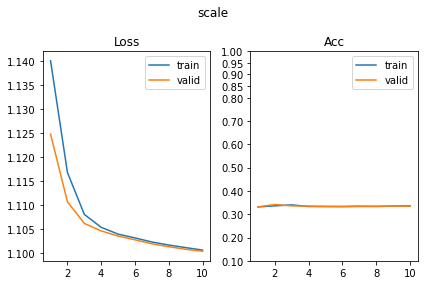

[543/630] color      BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.02it/s, loss=2.12, acc=0.129]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 81.10it/s, loss=2.09, acc=0.141]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.74it/s, loss=2.1, acc=0.127]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.56it/s, loss=2.1, acc=0.141]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 120.80it/s, loss=2.04, acc=0.158]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 106.13it/s, loss=2.07, acc=0.15]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.23it/s, loss=2.08, acc=0.174]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 128.69it/s, loss=2.07, acc=0.146]   

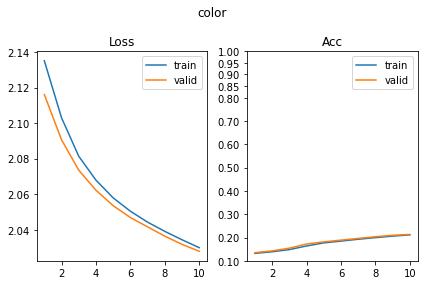

[544/630] angle      BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.26it/s, loss=2.84, acc=0.0488]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 65.06it/s, loss=2.82, acc=0.0801]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.72it/s, loss=2.8, acc=0.0547]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 79.01it/s, loss=2.79, acc=0.0723]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.69it/s, loss=2.78, acc=0.0605]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 102.26it/s, loss=2.78, acc=0.0625]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.50it/s, loss=2.77, acc=0.082]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 85.88it/s, loss=2.77, acc=0.0762]   

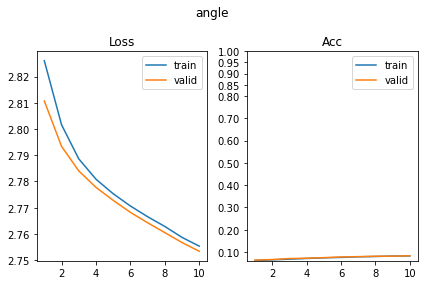

[545/630] py         BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 99.20it/s, loss=1.4, acc=0.26]                                             
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 81.96it/s, loss=1.4, acc=0.271]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.97it/s, loss=1.41, acc=0.223]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 115.28it/s, loss=1.41, acc=0.229]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.16it/s, loss=1.4, acc=0.232]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 94.19it/s, loss=1.4, acc=0.236]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.61it/s, loss=1.4, acc=0.242]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 85.95it/s, loss=1.4, acc=0.236]     

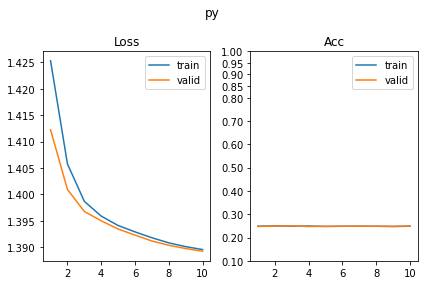

[546/630] px         BTwins_[FCN8i223o32_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.46it/s, loss=1.4, acc=0.242]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 126.41it/s, loss=1.39, acc=0.258]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 98.16it/s, loss=1.39, acc=0.258]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 99.54it/s, loss=1.38, acc=0.316]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 104.10it/s, loss=1.4, acc=0.248]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.13it/s, loss=1.39, acc=0.244]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 104.80it/s, loss=1.39, acc=0.25]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 123.44it/s, loss=1.39, acc=0.24]    

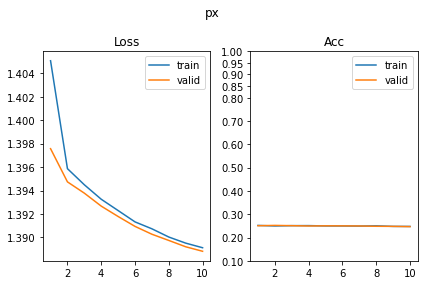

BTwins_[FCN8i223o32_d_16]_target_[shape]
[547/630] shape      BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.11it/s, loss=1.95, acc=0.133]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 93.04it/s, loss=1.96, acc=0.156]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.86it/s, loss=1.92, acc=0.223]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 121.67it/s, loss=1.92, acc=0.18]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 89.29it/s, loss=1.87, acc=0.273]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 93.77it/s, loss=1.87, acc=0.268]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 116.11it/s, loss=1.84, acc=0.273]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 98.94it/s, loss=1.84, acc=0.301]    

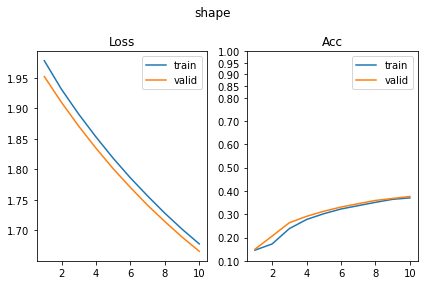

[548/630] scale      BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.87it/s, loss=1.11, acc=0.354]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 89.13it/s, loss=1.12, acc=0.355]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.93it/s, loss=1.1, acc=0.32]                                             
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 80.13it/s, loss=1.11, acc=0.334]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.89it/s, loss=1.12, acc=0.301]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 72.27it/s, loss=1.11, acc=0.297]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.43it/s, loss=1.1, acc=0.33]                                             
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 107.99it/s, loss=1.1, acc=0.338]    

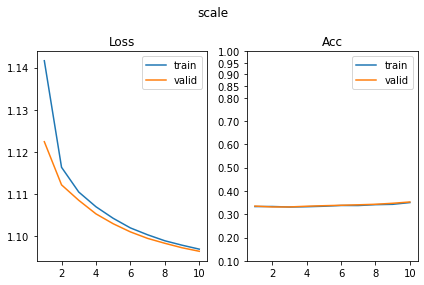

[549/630] color      BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.41it/s, loss=2.08, acc=0.148]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.75it/s, loss=2.08, acc=0.162]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.52it/s, loss=2.05, acc=0.195]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 88.95it/s, loss=2.05, acc=0.178]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.26it/s, loss=2.04, acc=0.199]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 117.10it/s, loss=2.05, acc=0.193]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.86it/s, loss=2.02, acc=0.236]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 91.81it/s, loss=2.03, acc=0.205]    

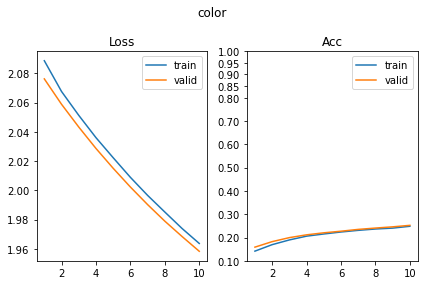

[550/630] angle      BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 121.89it/s, loss=2.78, acc=0.0742]                                         
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.92it/s, loss=2.77, acc=0.0898]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.93it/s, loss=2.76, acc=0.0918]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 108.70it/s, loss=2.76, acc=0.0879]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.86it/s, loss=2.74, acc=0.0898]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 83.92it/s, loss=2.73, acc=0.0918]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 100.70it/s, loss=2.71, acc=0.115]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 83.82it/s, loss=2.74, acc=0.107]    

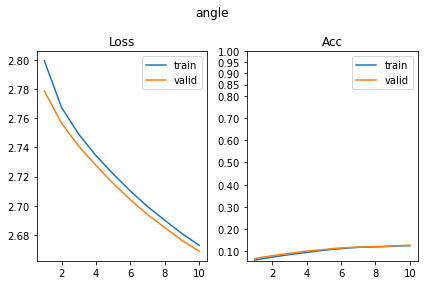

[551/630] py         BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.44it/s, loss=1.4, acc=0.248]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 109.06it/s, loss=1.4, acc=0.26]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.48it/s, loss=1.4, acc=0.217]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.90it/s, loss=1.39, acc=0.279]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 114.55it/s, loss=1.39, acc=0.262]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 100.59it/s, loss=1.39, acc=0.24]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.35it/s, loss=1.4, acc=0.258]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 125.35it/s, loss=1.38, acc=0.285]   

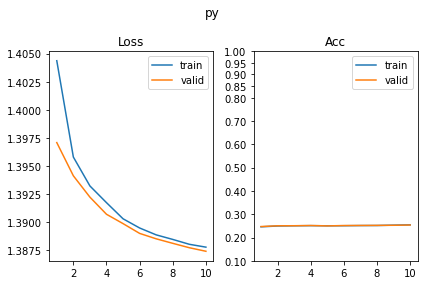

[552/630] px         BTwins_[FCN8i223o32_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.63it/s, loss=1.4, acc=0.242]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 88.84it/s, loss=1.41, acc=0.244]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.19it/s, loss=1.39, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 122.78it/s, loss=1.4, acc=0.256]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 93.17it/s, loss=1.4, acc=0.205]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.52it/s, loss=1.39, acc=0.254]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 119.26it/s, loss=1.39, acc=0.262]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 99.92it/s, loss=1.39, acc=0.242]    

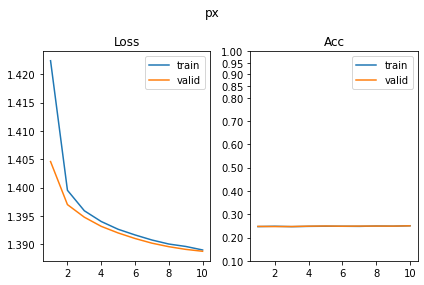

BTwins_[FCN8i223o32_d_32]_target_[shape]
[553/630] shape      BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.48it/s, loss=1.86, acc=0.289]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.09it/s, loss=1.87, acc=0.25]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.87it/s, loss=1.83, acc=0.291]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.30it/s, loss=1.83, acc=0.279]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.66it/s, loss=1.79, acc=0.307]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 92.44it/s, loss=1.78, acc=0.33]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.07it/s, loss=1.73, acc=0.4]                                             
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 123.72it/s, loss=1.74, acc=0.416]   

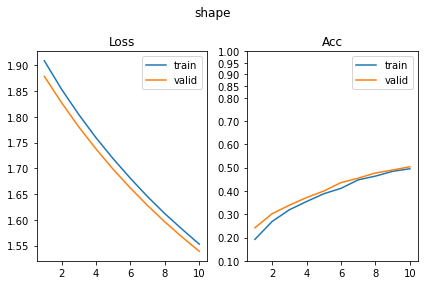

[554/630] scale      BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.35it/s, loss=1.11, acc=0.301]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.84it/s, loss=1.09, acc=0.354]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 121.40it/s, loss=1.1, acc=0.367]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 96.29it/s, loss=1.1, acc=0.311]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 91.47it/s, loss=1.09, acc=0.365]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 103.66it/s, loss=1.1, acc=0.348]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.13it/s, loss=1.1, acc=0.355]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 80.74it/s, loss=1.1, acc=0.344]     

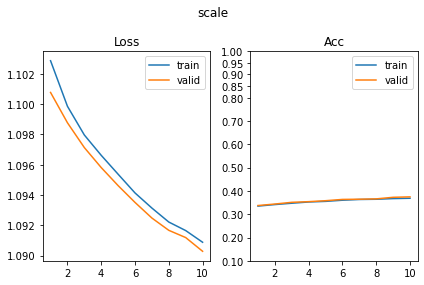

[555/630] color      BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 106.50it/s, loss=2.07, acc=0.141]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 92.11it/s, loss=2.07, acc=0.127]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.66it/s, loss=2.05, acc=0.154]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 123.68it/s, loss=2.05, acc=0.176]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.12it/s, loss=2.03, acc=0.256]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 94.81it/s, loss=2.03, acc=0.24]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 116.76it/s, loss=1.99, acc=0.301]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 92.36it/s, loss=2.01, acc=0.254]    

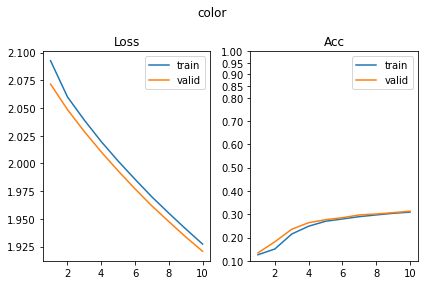

[556/630] angle      BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 61.12it/s, loss=2.75, acc=0.0781]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 114.30it/s, loss=2.75, acc=0.0801]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 86.15it/s, loss=2.73, acc=0.127]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 82.62it/s, loss=2.71, acc=0.143]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 102.68it/s, loss=2.68, acc=0.143]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 94.88it/s, loss=2.69, acc=0.145]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.63it/s, loss=2.67, acc=0.146]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 116.53it/s, loss=2.69, acc=0.125]   

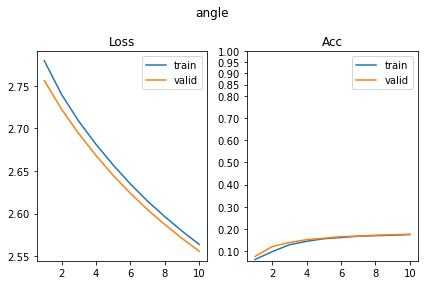

[557/630] py         BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.15it/s, loss=1.39, acc=0.26]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 89.70it/s, loss=1.39, acc=0.285]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.14it/s, loss=1.39, acc=0.262]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 102.01it/s, loss=1.39, acc=0.293]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 87.83it/s, loss=1.39, acc=0.236]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.43it/s, loss=1.39, acc=0.236]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 99.50it/s, loss=1.39, acc=0.262]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 79.79it/s, loss=1.39, acc=0.234]    

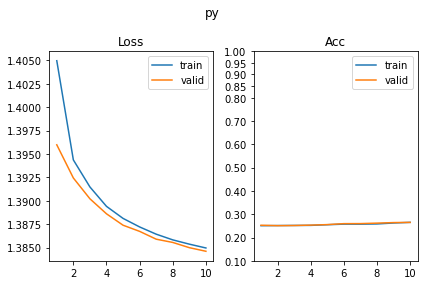

[558/630] px         BTwins_[FCN8i223o32_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.27it/s, loss=1.39, acc=0.281]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 106.49it/s, loss=1.39, acc=0.26]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.93it/s, loss=1.39, acc=0.252]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.40it/s, loss=1.39, acc=0.246]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 117.78it/s, loss=1.39, acc=0.258]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 94.38it/s, loss=1.39, acc=0.242]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.09it/s, loss=1.39, acc=0.234]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 125.27it/s, loss=1.39, acc=0.24]    

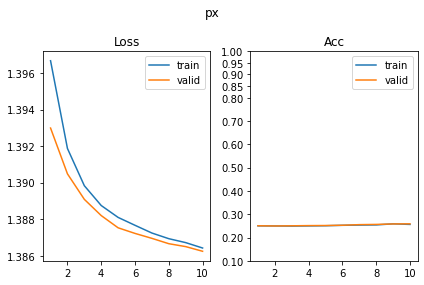

BTwins_[FCN8i223o32_d_64]_target_[shape]
[559/630] shape      BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.79it/s, loss=1.88, acc=0.246]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 86.37it/s, loss=1.88, acc=0.256]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 104.19it/s, loss=1.82, acc=0.342]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 91.02it/s, loss=1.81, acc=0.365]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.51it/s, loss=1.77, acc=0.428]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 107.55it/s, loss=1.75, acc=0.463]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.61it/s, loss=1.69, acc=0.541]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 86.72it/s, loss=1.68, acc=0.578]    

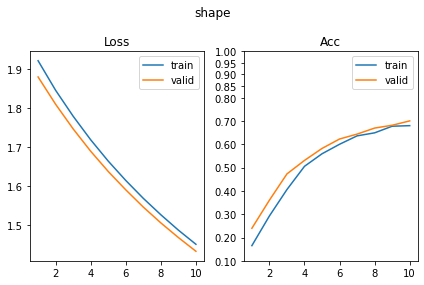

[560/630] scale      BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 112.95it/s, loss=1.1, acc=0.334]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 99.04it/s, loss=1.1, acc=0.322]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.82it/s, loss=1.09, acc=0.404]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 118.88it/s, loss=1.09, acc=0.357]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.77it/s, loss=1.09, acc=0.381]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 108.10it/s, loss=1.09, acc=0.402]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.69it/s, loss=1.1, acc=0.326]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 81.06it/s, loss=1.09, acc=0.402]    

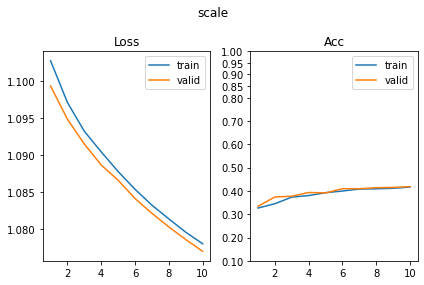

[561/630] color      BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.59it/s, loss=2.06, acc=0.156]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.44it/s, loss=2.06, acc=0.174]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.41it/s, loss=2.04, acc=0.219]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 99.52it/s, loss=2.04, acc=0.184]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 101.85it/s, loss=2.01, acc=0.254]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 95.49it/s, loss=2.02, acc=0.256]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.25it/s, loss=1.99, acc=0.307]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 119.54it/s, loss=2, acc=0.26]       

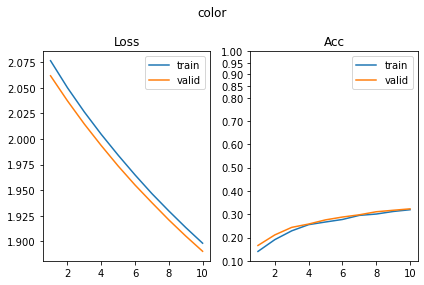

[562/630] angle      BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 99.32it/s, loss=2.74, acc=0.102]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 90.38it/s, loss=2.73, acc=0.113]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.74it/s, loss=2.68, acc=0.16]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 112.78it/s, loss=2.68, acc=0.146]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.88it/s, loss=2.63, acc=0.164]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 97.00it/s, loss=2.63, acc=0.188]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 102.61it/s, loss=2.59, acc=0.182]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 89.33it/s, loss=2.6, acc=0.203]     

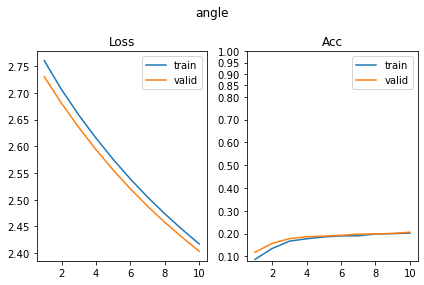

[563/630] py         BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.31it/s, loss=1.39, acc=0.254]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 107.30it/s, loss=1.38, acc=0.27]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.13it/s, loss=1.39, acc=0.223]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 88.83it/s, loss=1.38, acc=0.281]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 103.32it/s, loss=1.38, acc=0.287]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 92.56it/s, loss=1.38, acc=0.295]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.42it/s, loss=1.38, acc=0.262]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 111.43it/s, loss=1.38, acc=0.357]   

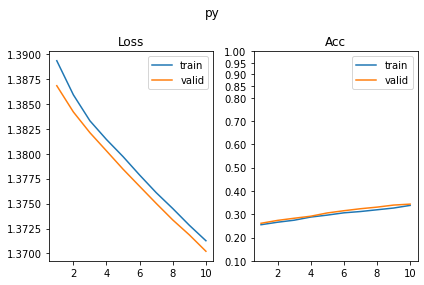

[564/630] px         BTwins_[FCN8i223o32_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.61it/s, loss=1.4, acc=0.211]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 73.89it/s, loss=1.38, acc=0.26]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.55it/s, loss=1.39, acc=0.24]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 76.05it/s, loss=1.39, acc=0.225]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 72.39it/s, loss=1.39, acc=0.252]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 96.32it/s, loss=1.39, acc=0.23]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.42it/s, loss=1.39, acc=0.271]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 81.54it/s, loss=1.39, acc=0.213]    

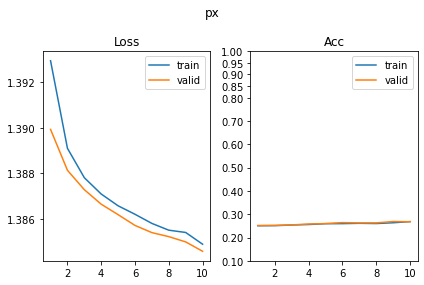

BTwins_[FCN8i223o32_d_128]_target_[shape]
[565/630] shape      BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.30it/s, loss=1.86, acc=0.326]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 90.84it/s, loss=1.86, acc=0.357]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.77it/s, loss=1.78, acc=0.469]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 117.10it/s, loss=1.79, acc=0.477]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.32it/s, loss=1.71, acc=0.514]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 96.75it/s, loss=1.7, acc=0.559]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 112.20it/s, loss=1.64, acc=0.717]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 95.69it/s, loss=1.62, acc=0.732]    

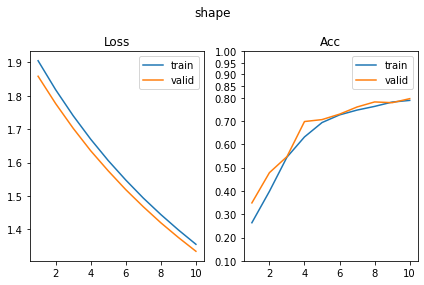

[566/630] scale      BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.83it/s, loss=1.09, acc=0.375]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 119.22it/s, loss=1.1, acc=0.363]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 99.87it/s, loss=1.08, acc=0.424]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.19it/s, loss=1.09, acc=0.395]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 105.70it/s, loss=1.08, acc=0.387]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 94.30it/s, loss=1.09, acc=0.406]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.39it/s, loss=1.08, acc=0.428]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 95.16it/s, loss=1.08, acc=0.436]    

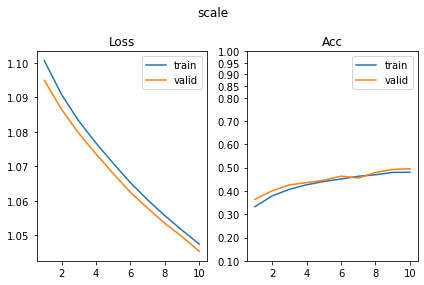

[567/630] color      BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.85it/s, loss=2.05, acc=0.17]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 92.37it/s, loss=2.05, acc=0.205]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.87it/s, loss=2.01, acc=0.291]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 112.31it/s, loss=2.01, acc=0.291]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.43it/s, loss=1.99, acc=0.354]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 85.73it/s, loss=1.98, acc=0.346]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 100.41it/s, loss=1.96, acc=0.342]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 88.31it/s, loss=1.96, acc=0.346]    

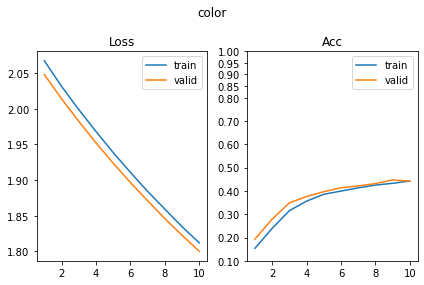

[568/630] angle      BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.33it/s, loss=2.72, acc=0.127]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 120.73it/s, loss=2.71, acc=0.141]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.63it/s, loss=2.66, acc=0.178]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.93it/s, loss=2.66, acc=0.166]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.49it/s, loss=2.59, acc=0.178]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 95.86it/s, loss=2.6, acc=0.211]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.41it/s, loss=2.54, acc=0.203]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 113.17it/s, loss=2.56, acc=0.197]   

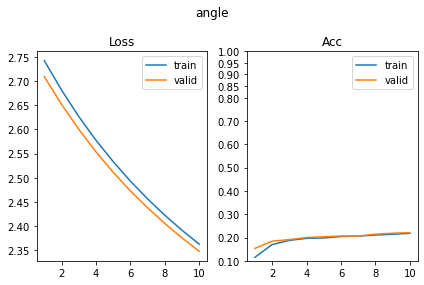

[569/630] py         BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 69.03it/s, loss=1.38, acc=0.309]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 76.17it/s, loss=1.38, acc=0.289]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.21it/s, loss=1.38, acc=0.299]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 61.11it/s, loss=1.37, acc=0.34]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 59.85it/s, loss=1.37, acc=0.359]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 103.30it/s, loss=1.37, acc=0.338]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.03it/s, loss=1.36, acc=0.361]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 71.47it/s, loss=1.36, acc=0.395]    

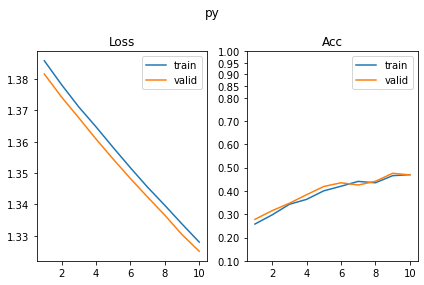

[570/630] px         BTwins_[FCN8i223o32_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 79.29it/s, loss=1.39, acc=0.254]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 72.80it/s, loss=1.39, acc=0.277]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.34it/s, loss=1.39, acc=0.24]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.73it/s, loss=1.39, acc=0.273]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.45it/s, loss=1.39, acc=0.248]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 78.48it/s, loss=1.39, acc=0.287]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 100.73it/s, loss=1.38, acc=0.256]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 83.52it/s, loss=1.38, acc=0.27]     

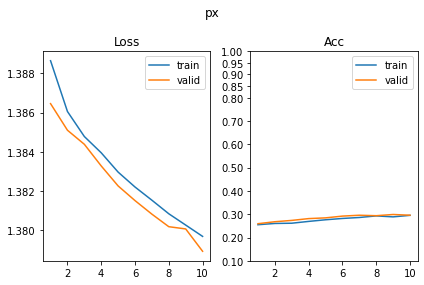

BTwins_[FCN16i223o64_d_8]_target_[shape]
[571/630] shape      BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.56it/s, loss=1.98, acc=0.115]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 122.18it/s, loss=1.97, acc=0.146]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.80it/s, loss=1.96, acc=0.146]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 92.15it/s, loss=1.95, acc=0.119]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 103.18it/s, loss=1.93, acc=0.18]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 90.34it/s, loss=1.94, acc=0.152]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 91.65it/s, loss=1.9, acc=0.205]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 127.21it/s, loss=1.91, acc=0.189]   

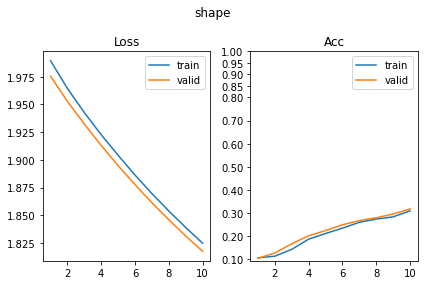

[572/630] scale      BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.25it/s, loss=1.18, acc=0.342]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 85.59it/s, loss=1.21, acc=0.332]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.31it/s, loss=1.14, acc=0.342]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 104.29it/s, loss=1.15, acc=0.332]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.78it/s, loss=1.13, acc=0.334]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 83.13it/s, loss=1.13, acc=0.332]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 97.91it/s, loss=1.1, acc=0.35]                                             
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 86.40it/s, loss=1.11, acc=0.338]    

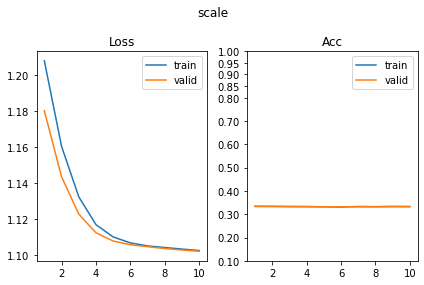

[573/630] color      BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 96.72it/s, loss=2.1, acc=0.139]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 117.75it/s, loss=2.14, acc=0.117]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 69.48it/s, loss=2.1, acc=0.127]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 97.18it/s, loss=2.11, acc=0.109]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.81it/s, loss=2.09, acc=0.117]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 89.41it/s, loss=2.11, acc=0.117]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.94it/s, loss=2.1, acc=0.127]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 111.82it/s, loss=2.1, acc=0.111]    

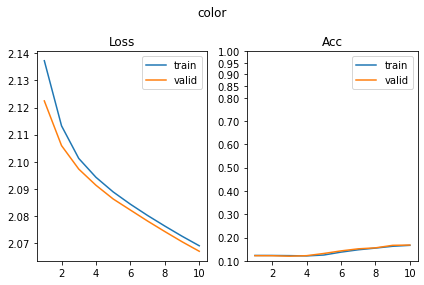

[574/630] angle      BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.97it/s, loss=2.82, acc=0.0527]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 85.12it/s, loss=2.81, acc=0.0488]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.67it/s, loss=2.79, acc=0.0586]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 96.73it/s, loss=2.77, acc=0.0625]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 78.65it/s, loss=2.78, acc=0.084]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 129.66it/s, loss=2.78, acc=0.0801]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 90.72it/s, loss=2.76, acc=0.0898]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 92.52it/s, loss=2.77, acc=0.082]    

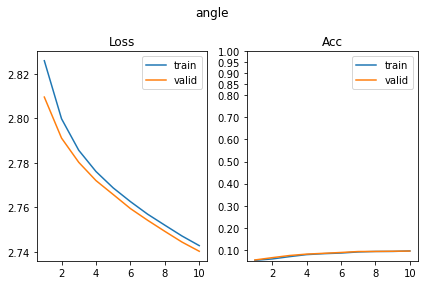

[575/630] py         BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.48it/s, loss=1.42, acc=0.236]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 69.15it/s, loss=1.42, acc=0.215]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 81.90it/s, loss=1.41, acc=0.25]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 100.91it/s, loss=1.39, acc=0.271]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 70.36it/s, loss=1.4, acc=0.244]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 83.98it/s, loss=1.4, acc=0.242]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 104.95it/s, loss=1.4, acc=0.217]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 78.74it/s, loss=1.4, acc=0.252]     

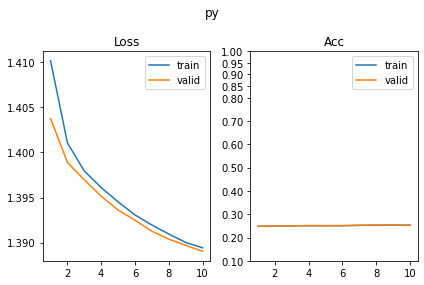

[576/630] px         BTwins_[FCN16i223o64_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 63.27it/s, loss=1.44, acc=0.258]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 92.36it/s, loss=1.42, acc=0.275]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 80.23it/s, loss=1.42, acc=0.252]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 79.38it/s, loss=1.41, acc=0.256]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 98.22it/s, loss=1.41, acc=0.238]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 83.72it/s, loss=1.42, acc=0.199]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.49it/s, loss=1.4, acc=0.238]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 100.71it/s, loss=1.4, acc=0.24]     

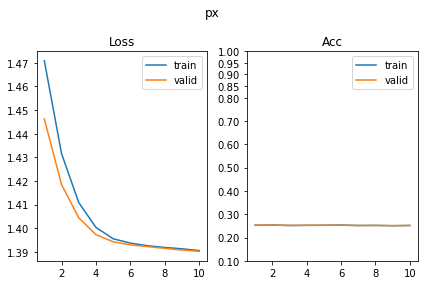

BTwins_[FCN16i223o64_d_16]_target_[shape]
[577/630] shape      BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 103.56it/s, loss=1.94, acc=0.182]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 81.51it/s, loss=1.94, acc=0.148]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 67.66it/s, loss=1.91, acc=0.203]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 97.19it/s, loss=1.9, acc=0.268]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.61it/s, loss=1.87, acc=0.24]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 81.52it/s, loss=1.87, acc=0.273]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 100.37it/s, loss=1.84, acc=0.273]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 79.86it/s, loss=1.82, acc=0.291]    

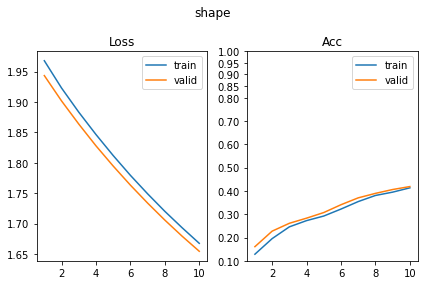

[578/630] scale      BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.55it/s, loss=1.1, acc=0.342]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 119.40it/s, loss=1.11, acc=0.305]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 104.00it/s, loss=1.12, acc=0.297]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 98.86it/s, loss=1.12, acc=0.326]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 100.26it/s, loss=1.1, acc=0.367]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 101.34it/s, loss=1.09, acc=0.361]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.29it/s, loss=1.1, acc=0.346]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 121.34it/s, loss=1.1, acc=0.336]    

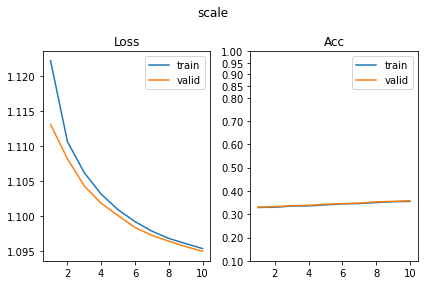

[579/630] color      BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 77.26it/s, loss=2.1, acc=0.133]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.21it/s, loss=2.11, acc=0.0996]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 113.26it/s, loss=2.09, acc=0.133]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 99.25it/s, loss=2.09, acc=0.141]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.03it/s, loss=2.08, acc=0.121]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 118.74it/s, loss=2.07, acc=0.168]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 93.16it/s, loss=2.07, acc=0.133]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 90.01it/s, loss=2.05, acc=0.178]    

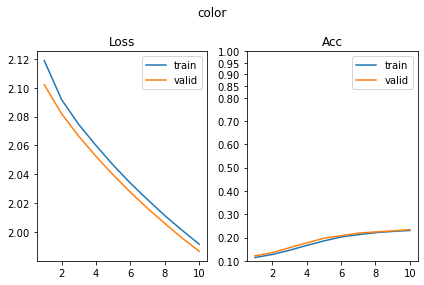

[580/630] angle      BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 99.62it/s, loss=2.82, acc=0.0547]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 91.73it/s, loss=2.8, acc=0.0527]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 76.94it/s, loss=2.79, acc=0.0645]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 112.25it/s, loss=2.8, acc=0.041]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.34it/s, loss=2.76, acc=0.0879]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 85.03it/s, loss=2.76, acc=0.0996]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 106.81it/s, loss=2.74, acc=0.0996]                                         
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 95.85it/s, loss=2.73, acc=0.104]    

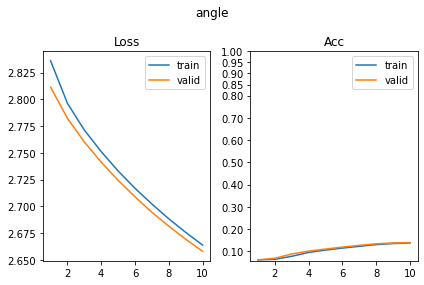

[581/630] py         BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 74.05it/s, loss=1.39, acc=0.273]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 84.84it/s, loss=1.4, acc=0.262]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 70.89it/s, loss=1.4, acc=0.24]                                             
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 81.25it/s, loss=1.4, acc=0.248]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 98.30it/s, loss=1.4, acc=0.25]                                             
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 79.84it/s, loss=1.4, acc=0.227]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 72.18it/s, loss=1.39, acc=0.285]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 82.70it/s, loss=1.39, acc=0.258]    

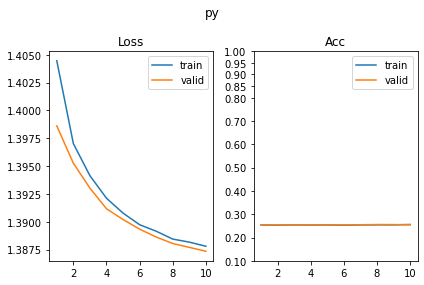

[582/630] px         BTwins_[FCN16i223o64_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.49it/s, loss=1.43, acc=0.248]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 91.83it/s, loss=1.43, acc=0.246]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 78.18it/s, loss=1.41, acc=0.238]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 93.19it/s, loss=1.4, acc=0.264]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.47it/s, loss=1.4, acc=0.266]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 90.37it/s, loss=1.4, acc=0.27]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 99.42it/s, loss=1.4, acc=0.221]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 91.38it/s, loss=1.41, acc=0.221]    

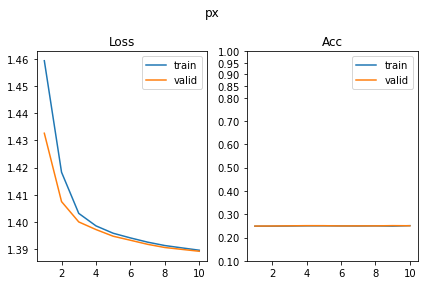

BTwins_[FCN16i223o64_d_32]_target_[shape]
[583/630] shape      BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.52it/s, loss=1.87, acc=0.32]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 128.74it/s, loss=1.88, acc=0.289]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.33it/s, loss=1.79, acc=0.398]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 88.70it/s, loss=1.82, acc=0.365]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.93it/s, loss=1.74, acc=0.455]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 90.89it/s, loss=1.74, acc=0.447]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 86.20it/s, loss=1.7, acc=0.443]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 112.07it/s, loss=1.69, acc=0.465]   

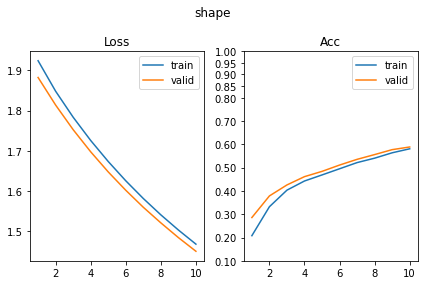

[584/630] scale      BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.23it/s, loss=1.1, acc=0.352]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 91.88it/s, loss=1.1, acc=0.354]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 114.64it/s, loss=1.09, acc=0.367]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 98.49it/s, loss=1.1, acc=0.365]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.82it/s, loss=1.1, acc=0.338]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 123.29it/s, loss=1.1, acc=0.344]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.89it/s, loss=1.1, acc=0.336]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 94.13it/s, loss=1.1, acc=0.357]     

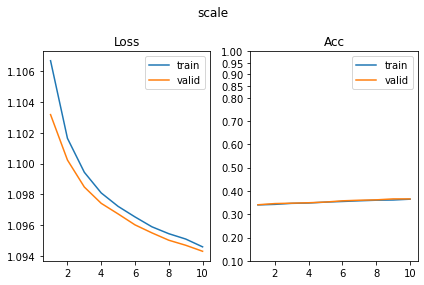

[585/630] color      BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 109.95it/s, loss=2.07, acc=0.15]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 88.70it/s, loss=2.09, acc=0.135]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.89it/s, loss=2.07, acc=0.16]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 115.54it/s, loss=2.07, acc=0.145]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 88.09it/s, loss=2.05, acc=0.168]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 88.77it/s, loss=2.06, acc=0.146]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 111.44it/s, loss=2.05, acc=0.176]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 90.99it/s, loss=2.04, acc=0.188]    

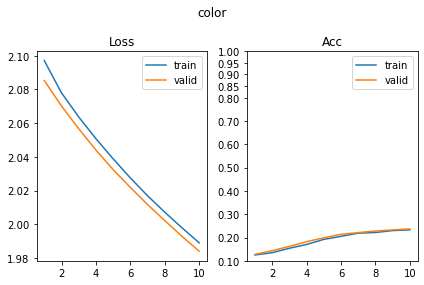

[586/630] angle      BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.03it/s, loss=2.75, acc=0.0957]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 124.77it/s, loss=2.74, acc=0.0957]                                         
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.89it/s, loss=2.7, acc=0.115]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.59it/s, loss=2.7, acc=0.139]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 106.27it/s, loss=2.65, acc=0.166]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 104.94it/s, loss=2.67, acc=0.152]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.70it/s, loss=2.61, acc=0.168]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 124.33it/s, loss=2.62, acc=0.154]   

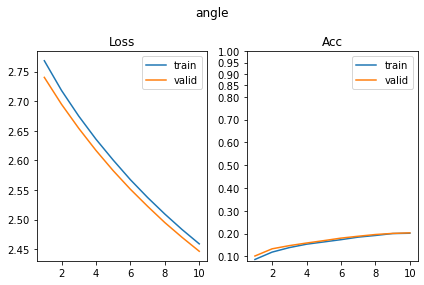

[587/630] py         BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.48it/s, loss=1.4, acc=0.23]                                             
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 76.22it/s, loss=1.39, acc=0.289]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.53it/s, loss=1.4, acc=0.254]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 98.42it/s, loss=1.39, acc=0.293]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 69.56it/s, loss=1.39, acc=0.266]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 85.78it/s, loss=1.39, acc=0.242]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 102.31it/s, loss=1.39, acc=0.264]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 69.81it/s, loss=1.39, acc=0.266]    

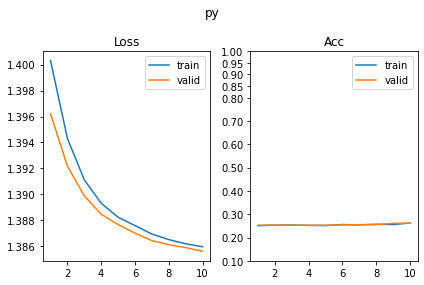

[588/630] px         BTwins_[FCN16i223o64_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.49it/s, loss=1.39, acc=0.244]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 107.62it/s, loss=1.39, acc=0.24]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.36it/s, loss=1.39, acc=0.234]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 90.19it/s, loss=1.39, acc=0.246]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 103.91it/s, loss=1.39, acc=0.246]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 86.39it/s, loss=1.39, acc=0.248]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 63.04it/s, loss=1.39, acc=0.27]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 131.32it/s, loss=1.39, acc=0.236]   

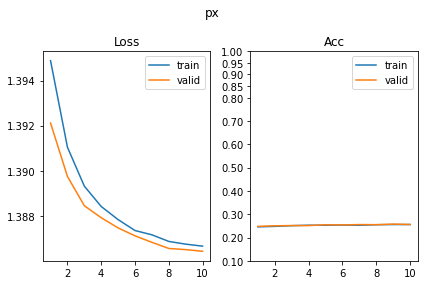

BTwins_[FCN16i223o64_d_64]_target_[shape]
[589/630] shape      BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.54it/s, loss=1.88, acc=0.236]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 86.08it/s, loss=1.87, acc=0.268]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 107.37it/s, loss=1.79, acc=0.34]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.84it/s, loss=1.8, acc=0.336]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.29it/s, loss=1.71, acc=0.482]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 107.71it/s, loss=1.71, acc=0.449]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.19it/s, loss=1.64, acc=0.561]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 91.69it/s, loss=1.64, acc=0.553]    

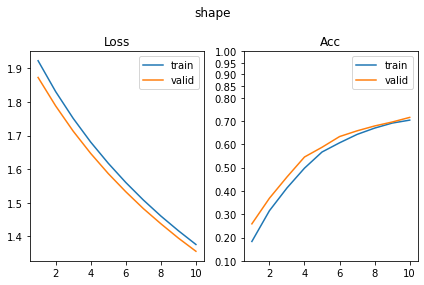

[590/630] scale      BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 114.67it/s, loss=1.09, acc=0.377]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 85.99it/s, loss=1.1, acc=0.33]                                             
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.02it/s, loss=1.09, acc=0.367]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 113.08it/s, loss=1.1, acc=0.314]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.50it/s, loss=1.09, acc=0.379]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 85.62it/s, loss=1.09, acc=0.381]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 114.01it/s, loss=1.09, acc=0.369]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 94.33it/s, loss=1.09, acc=0.375]    

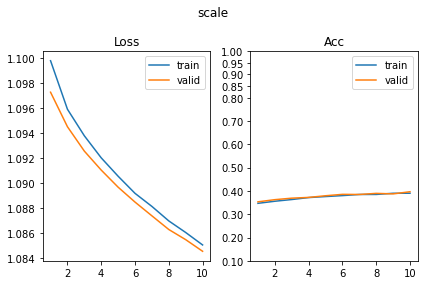

[591/630] color      BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 71.69it/s, loss=2.06, acc=0.16]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 91.92it/s, loss=2.07, acc=0.148]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.52it/s, loss=2.04, acc=0.182]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 77.69it/s, loss=2.05, acc=0.182]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 104.84it/s, loss=2.01, acc=0.26]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.94it/s, loss=2.02, acc=0.217]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.48it/s, loss=1.99, acc=0.242]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 106.73it/s, loss=1.98, acc=0.301]   

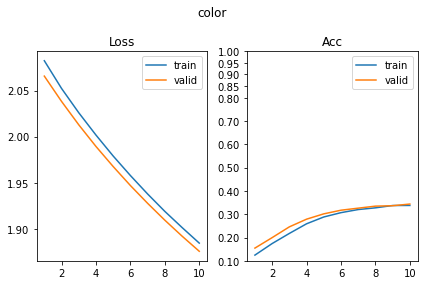

[592/630] angle      BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 94.42it/s, loss=2.7, acc=0.148]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 75.77it/s, loss=2.69, acc=0.139]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 71.02it/s, loss=2.63, acc=0.143]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.80it/s, loss=2.64, acc=0.178]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 83.79it/s, loss=2.59, acc=0.205]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 93.76it/s, loss=2.58, acc=0.201]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 105.04it/s, loss=2.55, acc=0.186]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 88.71it/s, loss=2.53, acc=0.225]    

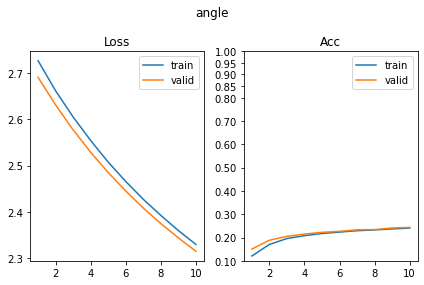

[593/630] py         BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.03it/s, loss=1.39, acc=0.232]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 95.37it/s, loss=1.39, acc=0.266]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.15it/s, loss=1.38, acc=0.246]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 100.47it/s, loss=1.39, acc=0.256]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 116.55it/s, loss=1.39, acc=0.248]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 97.07it/s, loss=1.39, acc=0.232]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 85.16it/s, loss=1.39, acc=0.256]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 122.94it/s, loss=1.38, acc=0.268]   

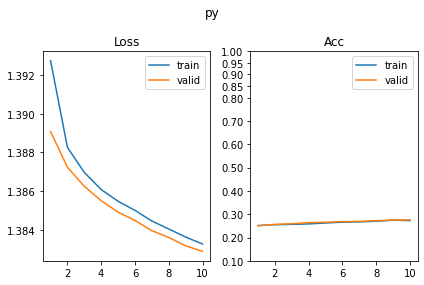

[594/630] px         BTwins_[FCN16i223o64_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.34it/s, loss=1.39, acc=0.244]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 90.20it/s, loss=1.39, acc=0.236]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 103.59it/s, loss=1.39, acc=0.254]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 89.69it/s, loss=1.39, acc=0.258]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.11it/s, loss=1.39, acc=0.256]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 132.87it/s, loss=1.39, acc=0.262]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 87.06it/s, loss=1.39, acc=0.285]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 88.97it/s, loss=1.39, acc=0.24]     

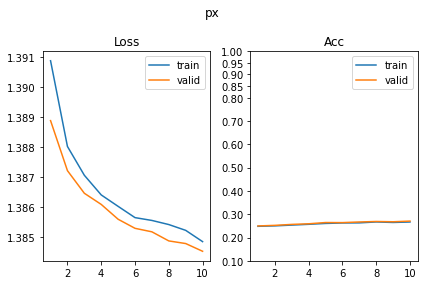

BTwins_[FCN16i223o64_d_128]_target_[shape]
[595/630] shape      BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 108.91it/s, loss=1.82, acc=0.455]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 90.64it/s, loss=1.81, acc=0.461]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 88.24it/s, loss=1.7, acc=0.627]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 112.77it/s, loss=1.69, acc=0.682]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 85.25it/s, loss=1.6, acc=0.785]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 91.23it/s, loss=1.59, acc=0.773]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 98.67it/s, loss=1.53, acc=0.76]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 80.99it/s, loss=1.5, acc=0.773]     

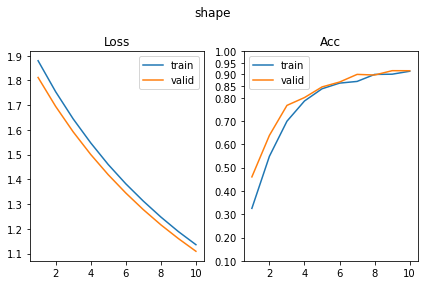

[596/630] scale      BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 85.04it/s, loss=1.1, acc=0.363]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 106.23it/s, loss=1.09, acc=0.393]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 89.31it/s, loss=1.09, acc=0.389]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 85.41it/s, loss=1.09, acc=0.379]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 100.01it/s, loss=1.09, acc=0.426]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 89.86it/s, loss=1.09, acc=0.367]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 80.01it/s, loss=1.08, acc=0.428]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 117.80it/s, loss=1.08, acc=0.434]   

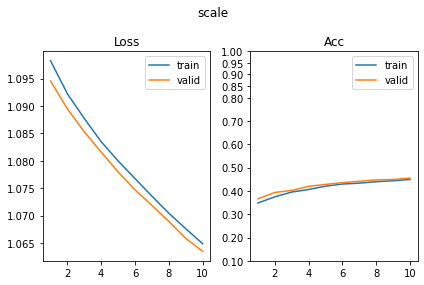

[597/630] color      BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.50it/s, loss=2.05, acc=0.18]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 92.73it/s, loss=2.05, acc=0.184]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 84.38it/s, loss=2.01, acc=0.275]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 78.61it/s, loss=2.01, acc=0.285]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 80.76it/s, loss=1.98, acc=0.314]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 99.44it/s, loss=1.98, acc=0.303]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 122.38it/s, loss=1.94, acc=0.338]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 95.83it/s, loss=1.95, acc=0.354]    

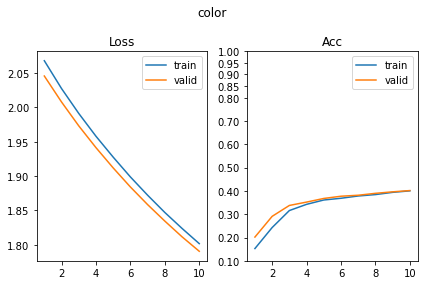

[598/630] angle      BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 90.09it/s, loss=2.68, acc=0.199]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 123.44it/s, loss=2.68, acc=0.213]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.26it/s, loss=2.6, acc=0.23]                                             
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 96.62it/s, loss=2.59, acc=0.24]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 105.96it/s, loss=2.53, acc=0.24]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 96.43it/s, loss=2.53, acc=0.227]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.50it/s, loss=2.48, acc=0.193]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 121.33it/s, loss=2.45, acc=0.254]   

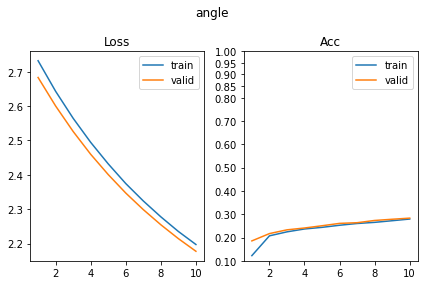

[599/630] py         BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.18it/s, loss=1.39, acc=0.275]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 94.99it/s, loss=1.38, acc=0.279]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 116.19it/s, loss=1.38, acc=0.293]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 96.64it/s, loss=1.38, acc=0.307]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.36it/s, loss=1.38, acc=0.26]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 110.64it/s, loss=1.38, acc=0.322]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 88.05it/s, loss=1.38, acc=0.281]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 95.38it/s, loss=1.38, acc=0.311]    

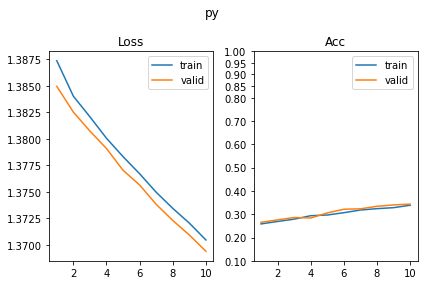

[600/630] px         BTwins_[FCN16i223o64_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 106.81it/s, loss=1.39, acc=0.24]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 95.41it/s, loss=1.39, acc=0.236]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.48it/s, loss=1.39, acc=0.271]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 98.24it/s, loss=1.39, acc=0.281]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 95.10it/s, loss=1.39, acc=0.248]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 93.36it/s, loss=1.39, acc=0.275]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 110.39it/s, loss=1.39, acc=0.232]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 95.80it/s, loss=1.38, acc=0.266]    

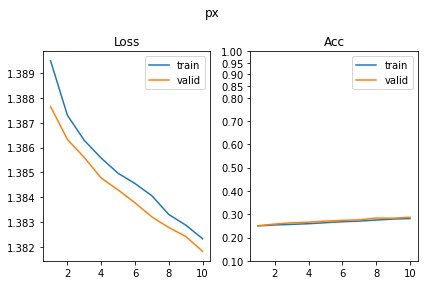

BTwins_[FCN32i223o128_d_8]_target_[shape]
[601/630] shape      BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 88.98it/s, loss=2.04, acc=0.15]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 125.82it/s, loss=2.04, acc=0.148]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.20it/s, loss=2.01, acc=0.152]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 99.17it/s, loss=1.97, acc=0.17]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 111.45it/s, loss=1.96, acc=0.18]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 100.39it/s, loss=1.93, acc=0.215]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.89it/s, loss=1.9, acc=0.248]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 118.85it/s, loss=1.92, acc=0.217]   

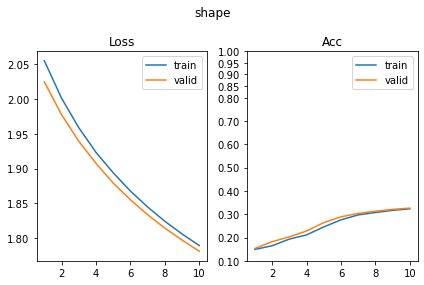

[602/630] scale      BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 91.99it/s, loss=1.11, acc=0.326]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 93.80it/s, loss=1.1, acc=0.359]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 92.41it/s, loss=1.1, acc=0.352]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 127.77it/s, loss=1.1, acc=0.344]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.98it/s, loss=1.1, acc=0.33]                                             
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 98.98it/s, loss=1.1, acc=0.336]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 116.70it/s, loss=1.11, acc=0.307]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 90.49it/s, loss=1.11, acc=0.299]    

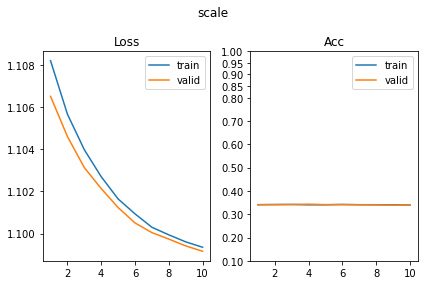

[603/630] color      BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.28it/s, loss=2.13, acc=0.127]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 109.04it/s, loss=2.12, acc=0.117]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 83.75it/s, loss=2.11, acc=0.119]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 82.65it/s, loss=2.1, acc=0.133]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 97.90it/s, loss=2.09, acc=0.139]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 76.44it/s, loss=2.09, acc=0.133]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 68.28it/s, loss=2.09, acc=0.146]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 100.44it/s, loss=2.08, acc=0.135]   

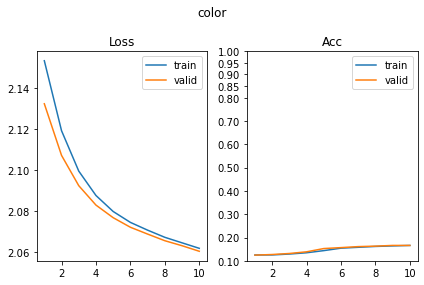

[604/630] angle      BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 86.96it/s, loss=2.82, acc=0.0527]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 89.35it/s, loss=2.81, acc=0.0605]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 101.84it/s, loss=2.81, acc=0.0625]                                         
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 91.70it/s, loss=2.82, acc=0.0586]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.93it/s, loss=2.79, acc=0.0605]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 114.32it/s, loss=2.79, acc=0.0586]                                         
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.08it/s, loss=2.79, acc=0.0605]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 84.44it/s, loss=2.8, acc=0.0547]    

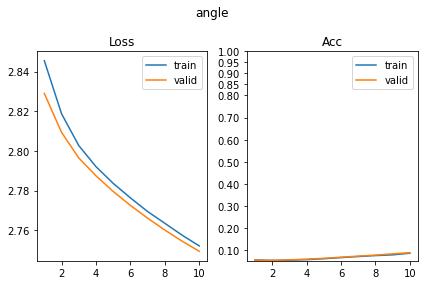

[605/630] py         BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 120.38it/s, loss=1.42, acc=0.258]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 98.60it/s, loss=1.43, acc=0.268]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.24it/s, loss=1.4, acc=0.262]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 124.18it/s, loss=1.41, acc=0.254]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.82it/s, loss=1.41, acc=0.238]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 99.77it/s, loss=1.41, acc=0.258]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 117.46it/s, loss=1.41, acc=0.207]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 101.93it/s, loss=1.41, acc=0.219]   

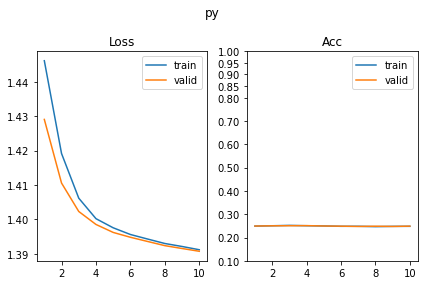

[606/630] px         BTwins_[FCN32i223o128_d_8]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.86it/s, loss=1.42, acc=0.291]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 124.23it/s, loss=1.43, acc=0.246]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 97.73it/s, loss=1.4, acc=0.279]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 98.77it/s, loss=1.43, acc=0.221]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 113.22it/s, loss=1.4, acc=0.24]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 91.58it/s, loss=1.4, acc=0.244]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.30it/s, loss=1.4, acc=0.238]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 103.11it/s, loss=1.4, acc=0.242]    

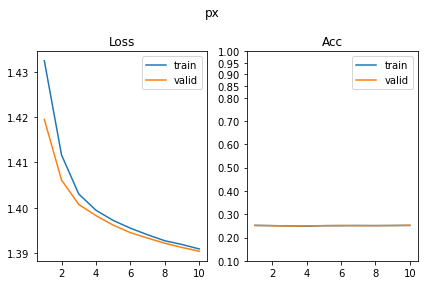

BTwins_[FCN32i223o128_d_16]_target_[shape]
[607/630] shape      BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 92.43it/s, loss=1.93, acc=0.145]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 95.57it/s, loss=1.95, acc=0.139]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.74it/s, loss=1.9, acc=0.176]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 104.26it/s, loss=1.9, acc=0.154]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 86.03it/s, loss=1.85, acc=0.227]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 77.91it/s, loss=1.84, acc=0.262]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 83.36it/s, loss=1.8, acc=0.303]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 85.17it/s, loss=1.81, acc=0.283]    

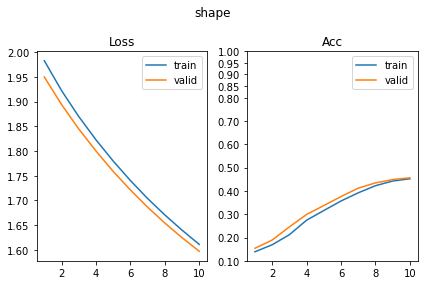

[608/630] scale      BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 83.65it/s, loss=1.11, acc=0.34]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 110.34it/s, loss=1.11, acc=0.324]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.41it/s, loss=1.1, acc=0.365]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 95.14it/s, loss=1.12, acc=0.307]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 109.05it/s, loss=1.1, acc=0.326]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 102.11it/s, loss=1.1, acc=0.359]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.61it/s, loss=1.1, acc=0.322]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 119.16it/s, loss=1.1, acc=0.332]    

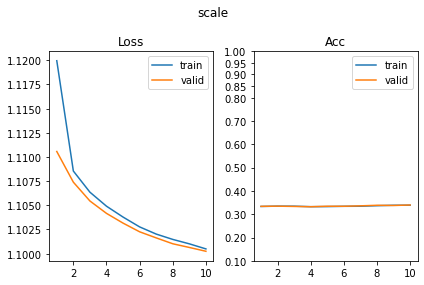

[609/630] color      BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.99it/s, loss=2.09, acc=0.137]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 96.82it/s, loss=2.09, acc=0.162]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 118.83it/s, loss=2.07, acc=0.143]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 99.45it/s, loss=2.08, acc=0.164]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.74it/s, loss=2.07, acc=0.156]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 128.25it/s, loss=2.06, acc=0.135]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.53it/s, loss=2.06, acc=0.178]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 77.54it/s, loss=2.06, acc=0.154]    

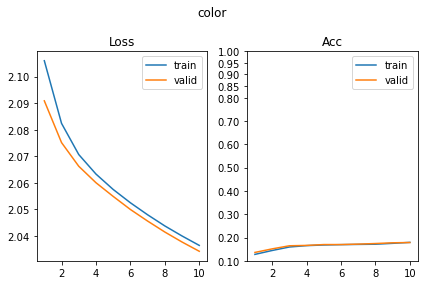

[610/630] angle      BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 108.81it/s, loss=2.8, acc=0.0527]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 90.49it/s, loss=2.79, acc=0.0547]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 73.55it/s, loss=2.77, acc=0.0449]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 101.52it/s, loss=2.76, acc=0.0547]                                         
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 98.02it/s, loss=2.75, acc=0.0723]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 87.81it/s, loss=2.74, acc=0.0898]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 111.77it/s, loss=2.72, acc=0.105]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 94.56it/s, loss=2.71, acc=0.0898]   

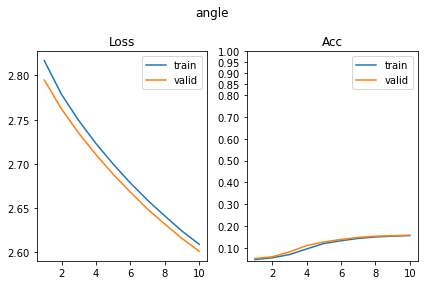

[611/630] py         BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 68.21it/s, loss=1.41, acc=0.234]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 98.53it/s, loss=1.4, acc=0.234]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 70.76it/s, loss=1.39, acc=0.287]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 69.24it/s, loss=1.41, acc=0.209]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 76.23it/s, loss=1.39, acc=0.244]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 69.03it/s, loss=1.4, acc=0.236]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 77.46it/s, loss=1.39, acc=0.244]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 96.89it/s, loss=1.39, acc=0.283]    

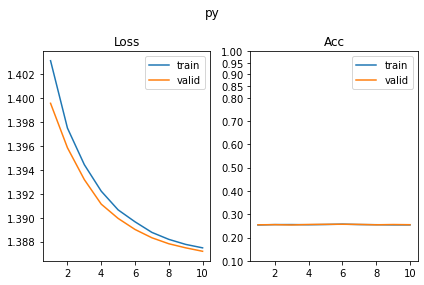

[612/630] px         BTwins_[FCN32i223o128_d_16]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 113.40it/s, loss=1.38, acc=0.285]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 98.18it/s, loss=1.4, acc=0.254]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 95.42it/s, loss=1.39, acc=0.254]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 121.56it/s, loss=1.4, acc=0.252]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 90.91it/s, loss=1.4, acc=0.25]                                             
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 91.40it/s, loss=1.39, acc=0.254]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 111.49it/s, loss=1.39, acc=0.285]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 94.16it/s, loss=1.39, acc=0.246]    

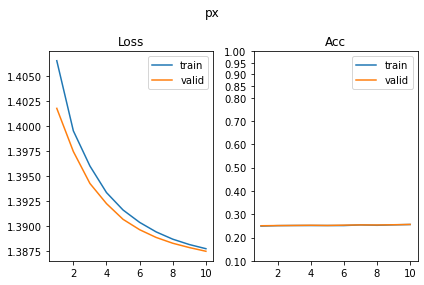

BTwins_[FCN32i223o128_d_32]_target_[shape]
[613/630] shape      BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 84.91it/s, loss=1.91, acc=0.221]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 104.10it/s, loss=1.9, acc=0.229]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 79.30it/s, loss=1.83, acc=0.287]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 79.73it/s, loss=1.82, acc=0.334]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 101.54it/s, loss=1.75, acc=0.432]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 73.04it/s, loss=1.75, acc=0.426]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 67.31it/s, loss=1.68, acc=0.504]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 97.75it/s, loss=1.66, acc=0.535]    

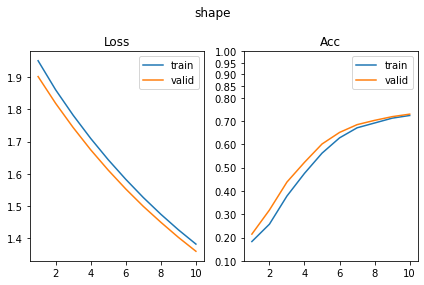

[614/630] scale      BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 93.29it/s, loss=1.11, acc=0.314]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 97.33it/s, loss=1.11, acc=0.326]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 109.74it/s, loss=1.12, acc=0.314]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 93.13it/s, loss=1.11, acc=0.348]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.17it/s, loss=1.1, acc=0.314]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 104.45it/s, loss=1.1, acc=0.344]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.67it/s, loss=1.1, acc=0.342]                                            
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 101.02it/s, loss=1.1, acc=0.326]    

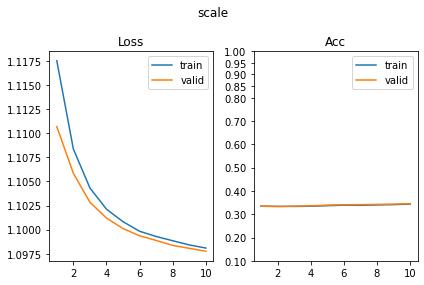

[615/630] color      BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 110.09it/s, loss=2.07, acc=0.145]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 90.54it/s, loss=2.07, acc=0.137]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.11it/s, loss=2.07, acc=0.127]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 112.89it/s, loss=2.08, acc=0.125]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 70.60it/s, loss=2.07, acc=0.119]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 94.03it/s, loss=2.07, acc=0.145]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 104.51it/s, loss=2.06, acc=0.148]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 96.52it/s, loss=2.06, acc=0.17]     

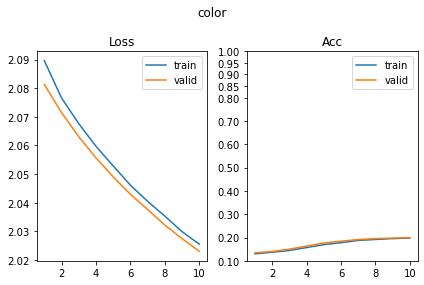

[616/630] angle      BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.60it/s, loss=2.74, acc=0.102]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 107.40it/s, loss=2.73, acc=0.113]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 90.15it/s, loss=2.68, acc=0.178]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.30it/s, loss=2.67, acc=0.156]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 82.39it/s, loss=2.61, acc=0.199]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 96.99it/s, loss=2.61, acc=0.203]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 78.65it/s, loss=2.59, acc=0.201]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 86.84it/s, loss=2.57, acc=0.209]    

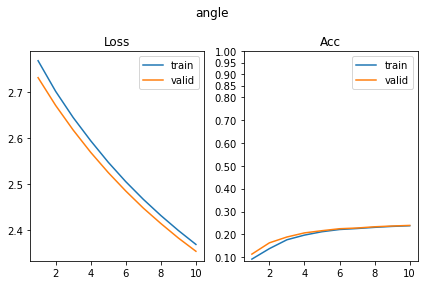

[617/630] py         BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 73.77it/s, loss=1.39, acc=0.256]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 75.19it/s, loss=1.39, acc=0.25]                                            
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 87.67it/s, loss=1.39, acc=0.248]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 109.45it/s, loss=1.39, acc=0.227]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 70.27it/s, loss=1.39, acc=0.238]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 57.04it/s, loss=1.39, acc=0.281]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 98.06it/s, loss=1.39, acc=0.232]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 71.11it/s, loss=1.39, acc=0.268]    

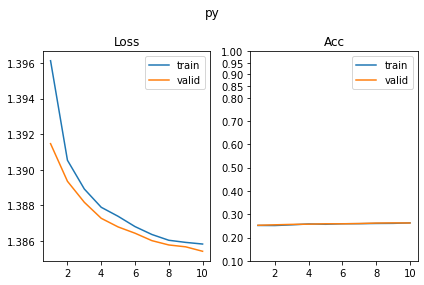

[618/630] px         BTwins_[FCN32i223o128_d_32]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 95.21it/s, loss=1.39, acc=0.246]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 83.37it/s, loss=1.39, acc=0.256]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 57.43it/s, loss=1.39, acc=0.25]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 71.36it/s, loss=1.39, acc=0.268]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.00it/s, loss=1.39, acc=0.266]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 78.85it/s, loss=1.39, acc=0.26]                                            
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 69.22it/s, loss=1.39, acc=0.258]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 118.47it/s, loss=1.38, acc=0.287]   

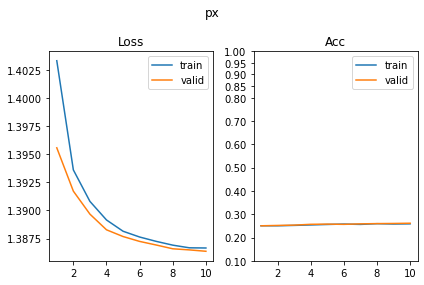

BTwins_[FCN32i223o128_d_64]_target_[shape]
[619/630] shape      BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 81.59it/s, loss=1.83, acc=0.33]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 89.09it/s, loss=1.83, acc=0.336]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 108.68it/s, loss=1.72, acc=0.537]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 68.74it/s, loss=1.69, acc=0.586]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 75.78it/s, loss=1.61, acc=0.699]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 75.95it/s, loss=1.58, acc=0.736]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 75.73it/s, loss=1.51, acc=0.797]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 69.79it/s, loss=1.49, acc=0.809]    

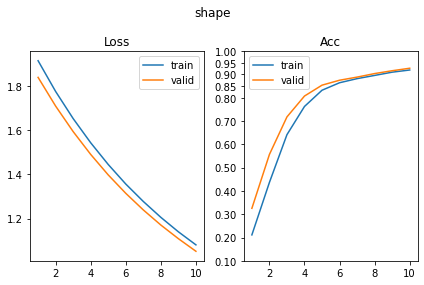

[620/630] scale      BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.41it/s, loss=1.11, acc=0.354]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 73.85it/s, loss=1.11, acc=0.342]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 67.11it/s, loss=1.1, acc=0.348]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 75.18it/s, loss=1.1, acc=0.361]                                            
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 66.92it/s, loss=1.1, acc=0.346]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 84.68it/s, loss=1.1, acc=0.35]                                             
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 101.63it/s, loss=1.1, acc=0.326]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 84.90it/s, loss=1.09, acc=0.371]    

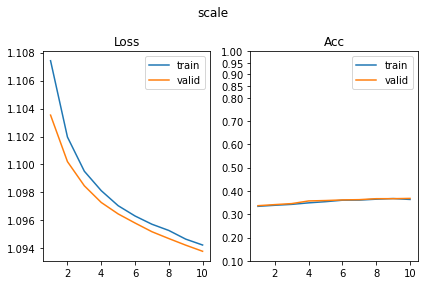

[621/630] color      BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 76.02it/s, loss=2.06, acc=0.184]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 115.28it/s, loss=2.06, acc=0.162]                                          
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 94.17it/s, loss=2.03, acc=0.223]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.56it/s, loss=2.04, acc=0.217]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 104.53it/s, loss=2.02, acc=0.244]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 94.47it/s, loss=2.01, acc=0.232]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 92.53it/s, loss=2, acc=0.268]                                              
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 120.09it/s, loss=1.99, acc=0.244]   

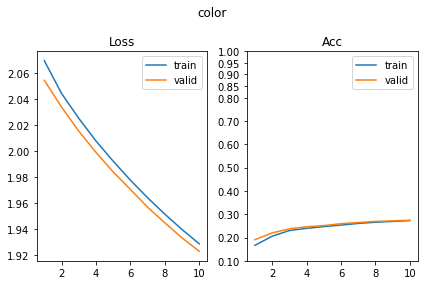

[622/630] angle      BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 66.06it/s, loss=2.7, acc=0.137]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 71.69it/s, loss=2.69, acc=0.146]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 75.79it/s, loss=2.6, acc=0.182]                                            
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 99.65it/s, loss=2.59, acc=0.189]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 68.69it/s, loss=2.52, acc=0.211]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 54.74it/s, loss=2.52, acc=0.209]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 76.95it/s, loss=2.45, acc=0.236]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 83.04it/s, loss=2.44, acc=0.26]     

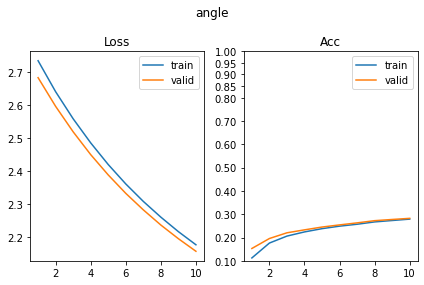

[623/630] py         BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 78.88it/s, loss=1.39, acc=0.25]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 81.81it/s, loss=1.39, acc=0.264]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 72.85it/s, loss=1.39, acc=0.264]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 87.96it/s, loss=1.38, acc=0.271]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 81.96it/s, loss=1.39, acc=0.236]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 103.69it/s, loss=1.39, acc=0.256]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 82.82it/s, loss=1.39, acc=0.268]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 87.15it/s, loss=1.39, acc=0.273]    

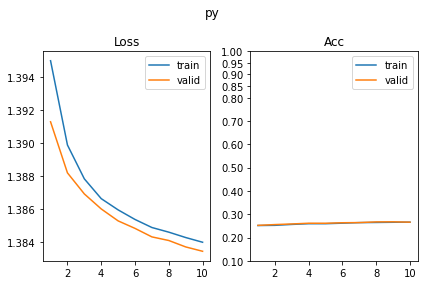

[624/630] px         BTwins_[FCN32i223o128_d_64]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 89.97it/s, loss=1.39, acc=0.246]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 84.58it/s, loss=1.39, acc=0.271]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 106.27it/s, loss=1.38, acc=0.277]                                          
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 94.78it/s, loss=1.39, acc=0.273]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 84.97it/s, loss=1.39, acc=0.25]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 104.29it/s, loss=1.39, acc=0.246]                                          
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 89.85it/s, loss=1.39, acc=0.211]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 95.45it/s, loss=1.38, acc=0.264]    

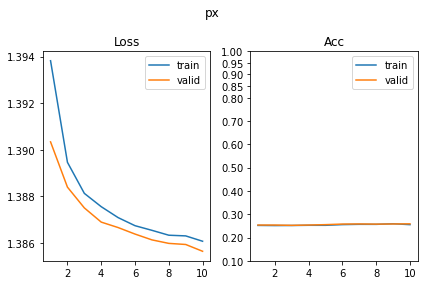

BTwins_[FCN32i223o128_d_128]_target_[shape]
[625/630] shape      BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 87.46it/s, loss=1.74, acc=0.537]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 86.75it/s, loss=1.74, acc=0.564]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.76it/s, loss=1.59, acc=0.721]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 119.67it/s, loss=1.58, acc=0.748]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 94.86it/s, loss=1.46, acc=0.844]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 90.94it/s, loss=1.44, acc=0.836]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 98.29it/s, loss=1.33, acc=0.883]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 87.59it/s, loss=1.33, acc=0.895]    

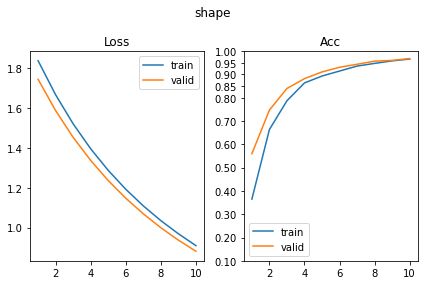

[626/630] scale      BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 70.49it/s, loss=1.1, acc=0.324]                                            
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 72.95it/s, loss=1.11, acc=0.297]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 82.16it/s, loss=1.09, acc=0.387]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 67.36it/s, loss=1.09, acc=0.379]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.94it/s, loss=1.09, acc=0.383]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 70.91it/s, loss=1.09, acc=0.367]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 58.86it/s, loss=1.09, acc=0.377]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 95.86it/s, loss=1.09, acc=0.385]    

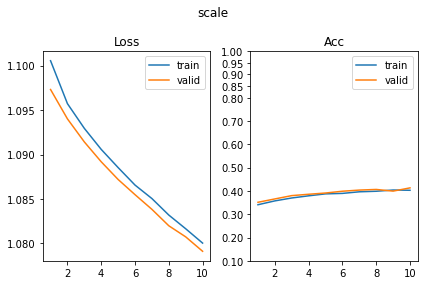

[627/630] color      BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 114.38it/s, loss=2.04, acc=0.232]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 94.96it/s, loss=2.04, acc=0.205]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 91.68it/s, loss=1.99, acc=0.316]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 117.17it/s, loss=2, acc=0.287]                                             
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 92.37it/s, loss=1.95, acc=0.33]                                            
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 97.00it/s, loss=1.95, acc=0.352]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 106.56it/s, loss=1.92, acc=0.342]                                          
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 91.73it/s, loss=1.92, acc=0.361]    

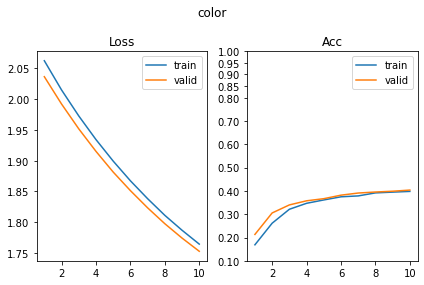

[628/630] angle      BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 80.81it/s, loss=2.67, acc=0.188]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 98.52it/s, loss=2.66, acc=0.207]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 68.10it/s, loss=2.56, acc=0.229]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 80.39it/s, loss=2.56, acc=0.283]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 101.97it/s, loss=2.45, acc=0.277]                                          
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 86.71it/s, loss=2.46, acc=0.287]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 79.75it/s, loss=2.39, acc=0.275]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 66.49it/s, loss=2.39, acc=0.32]     

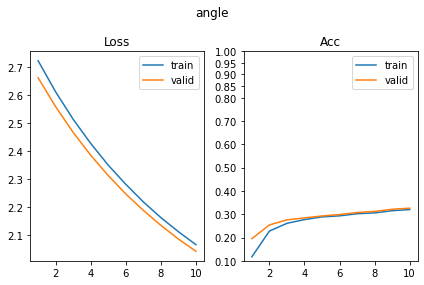

[629/630] py         BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 64.42it/s, loss=1.38, acc=0.273]                                           
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 93.49it/s, loss=1.39, acc=0.287]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 64.60it/s, loss=1.38, acc=0.285]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 60.67it/s, loss=1.38, acc=0.266]                                           
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 73.11it/s, loss=1.39, acc=0.256]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 93.97it/s, loss=1.39, acc=0.256]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 94.61it/s, loss=1.39, acc=0.246]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 97.71it/s, loss=1.38, acc=0.242]    

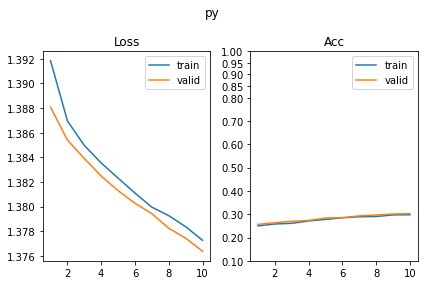

[630/630] px         BTwins_[FCN32i223o128_d_128]_target_[shape]


Epoch [  1/ 10] train:██████████| 34/34 [00:00<00:00, 108.53it/s, loss=1.39, acc=0.248]                                          
Epoch [  1/ 10] valid:██████████| 34/34 [00:00<00:00, 93.57it/s, loss=1.39, acc=0.232]                                           
Epoch [  2/ 10] train:██████████| 34/34 [00:00<00:00, 85.68it/s, loss=1.39, acc=0.236]                                           
Epoch [  2/ 10] valid:██████████| 34/34 [00:00<00:00, 109.52it/s, loss=1.38, acc=0.307]                                          
Epoch [  3/ 10] train:██████████| 34/34 [00:00<00:00, 79.69it/s, loss=1.39, acc=0.229]                                           
Epoch [  3/ 10] valid:██████████| 34/34 [00:00<00:00, 79.89it/s, loss=1.39, acc=0.266]                                           
Epoch [  4/ 10] train:██████████| 34/34 [00:00<00:00, 84.65it/s, loss=1.38, acc=0.295]                                           
Epoch [  4/ 10] valid:██████████| 34/34 [00:00<00:00, 87.67it/s, loss=1.38, acc=0.264]    

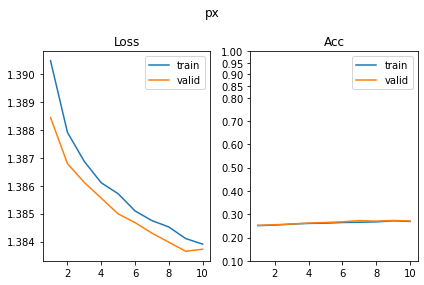

In [7]:
step = 1
max_steps = len(p_experiments) * 6
print_str = "[{:>3}/{:>3}] {:<10} {}"
for p_experiment in p_experiments:
    experiment_name = p_experiment.name
    print(experiment_name)
    #
    # experiment config
    p_experiment_config = p_experiment / "config.pkl"
    with open(p_experiment_config, "rb") as file:
        experiment_config = pickle.load(file)
    #
    # dataset config
    p_ds_config = Path(experiment_config.p_data) / "config.pkl"
    with open(p_ds_config, "rb") as file:
        ds_config = pickle.load(file)
    
    results = {}
    for target_variable in ds_config["classes"]:
        print(print_str.format(step, max_steps, target_variable, experiment_name))
        #
        target_idx = [idx for idx, target in enumerate(ds_config["classes"]) if target == target_variable][0]
        n_classes = ds_config["n_classes"][target_variable]
        #
        dl_train, dl_valid, d_r = get_datasets(target_idx,
                                               p_experiment / experiment_config["p_R_train"],
                                               p_experiment / experiment_config["p_R_valid"],
                                               p_experiment / experiment_config["p_Y_train"],
                                               p_experiment / experiment_config["p_Y_valid"],
                                               linprob_config.batch_size
                                              )
        #
        model = Net(n_classes, d_r, linprob_config.d_hid, linprob_config.n_hid)
        model = model.to(device)
        #
        optimizer = get_optimizer(linprob_config.optimizer, model.parameters(), linprob_config.optimizer_args)
        criterion = nn.CrossEntropyLoss()
        #
        stats = train_model(
            model=model,
            num_epochs=linprob_config.num_epochs,
            optimizer=optimizer,
            criterion=criterion,
            dl_train=dl_train,
            dl_valid=dl_valid,
            device=device
        )
        results[target_variable] = stats

        # plot losses
        fig, axes = plt.subplots(1, 2)
        axes[0].plot(stats.train.epoch, stats.train.loss, label="train")
        axes[0].plot(stats.valid.epoch, stats.valid.loss, label="valid")
        #axes[0].set_yscale('log')
        axes[0].set_title("Loss")
        axes[0].legend()


        # plot accs
        axes[1].plot(stats.train.epoch, stats.train.acc, label="train")
        axes[1].plot(stats.valid.epoch, stats.valid.acc, label="valid")
        plt.yticks([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.85, 0.9, 0.95, 1])
        axes[1].set_title("Acc")
        axes[1].legend()
        #
        fig.suptitle(target_variable)
        plt.tight_layout()
        plt.show()
        step += 1
    p_results = p_experiment / linprob_config["p_results"]
    p_linprob_config = p_experiment / linprob_config["p_config"]
    #
    with open(p_results, "wb") as file:
        pickle.dump(results, file)
    with open(p_linprob_config, "wb") as file:
        pickle.dump(linprob_config, file)

# Load all results 

In [8]:
p_eval =  p_experiments_base / linprob_config["p_eval"]
p_eval.mkdir(exist_ok=True)
p_results = p_eval / linprob_config["p_results"]
p_config = p_eval / linprob_config["p_config"]
p_acc_map = p_eval / linprob_config["p_acc_mat"]

In [9]:
experiment_results = {}
for p_experiment in p_experiments:
    experiment_name = p_experiment.name
    #
    p_results = p_experiment / linprob_config["p_results"]
    #
    with open(p_results, "rb") as file:
        results = pickle.load(file)
    experiment_results[experiment_name] = results

In [12]:
experiment_names = list(experiment_results.keys())
target_variables = list(experiment_results[experiment_names[0]].keys())
n_avrg = linprob_config["n_avrg"]
acc_results = []
for experiment_name in experiment_results.keys():
    print(experiment_name)
    experiment_accs = []
    for target_variable in target_variables:
        print("   ", target_variable)
        accs = experiment_results[experiment_name][target_variable]["valid"]['acc'][-n_avrg:]
        acc = sum(accs) / len(accs)
        experiment_accs.append(acc)
    acc_results.append(experiment_accs)
acc_matrix = np.array(acc_results)

SUP_[FCN8i223o32_d8]_target_[shape]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[scale]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[color]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[angle]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[py]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d8]_target_[px]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[shape]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[scale]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[color]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[angle]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o32_d16]_target_[py]
    shape
    scale
    color
    angle
    py
    px
SUP_[FCN8i223o

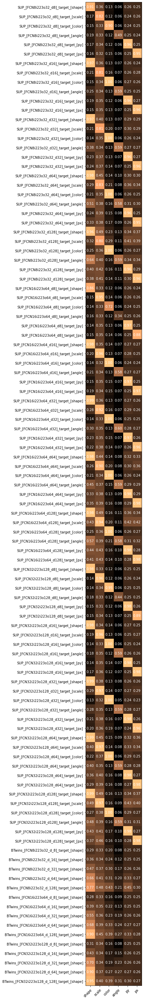

In [13]:
plot_mat(acc_matrix, experiment_names, target_variables, scale_factor=1, p_file=p_acc_map)

In [14]:
for p in p_experiments:
    R_train = np.load(p / "R_train.npy")
    print("{:<40}: {:.3f} {:.3f} {:.3f}".format(p.name, R_train.min(), R_train.mean(),R_train.max()))

SUP_[FCN8i223o32_d8]_target_[shape]     : 0.000 1.132 7.743
SUP_[FCN8i223o32_d8]_target_[scale]     : 0.000 1.156 5.855
SUP_[FCN8i223o32_d8]_target_[color]     : 0.000 0.918 6.152
SUP_[FCN8i223o32_d8]_target_[angle]     : 0.000 1.467 8.839
SUP_[FCN8i223o32_d8]_target_[py]        : 0.000 1.047 6.910
SUP_[FCN8i223o32_d8]_target_[px]        : 0.000 1.020 7.166
SUP_[FCN8i223o32_d16]_target_[shape]    : 0.000 0.919 6.636
SUP_[FCN8i223o32_d16]_target_[scale]    : 0.000 1.022 4.996
SUP_[FCN8i223o32_d16]_target_[color]    : 0.000 0.808 4.775
SUP_[FCN8i223o32_d16]_target_[angle]    : 0.000 1.219 7.243
SUP_[FCN8i223o32_d16]_target_[py]       : 0.000 0.862 4.793
SUP_[FCN8i223o32_d16]_target_[px]       : 0.000 0.926 5.329
SUP_[FCN8i223o32_d32]_target_[shape]    : 0.000 0.791 5.307
SUP_[FCN8i223o32_d32]_target_[scale]    : 0.000 0.830 4.630
SUP_[FCN8i223o32_d32]_target_[color]    : 0.000 0.663 4.227
SUP_[FCN8i223o32_d32]_target_[angle]    : 0.000 0.966 7.346
SUP_[FCN8i223o32_d32]_target_[py]       

SUP_[FCN8i223o32_d8]_target_[shape]     : 0.000 1.132 7.743


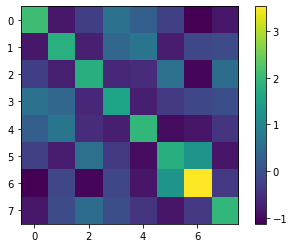

SUP_[FCN8i223o32_d8]_target_[scale]     : 0.000 1.156 5.855


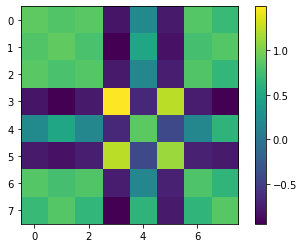

SUP_[FCN8i223o32_d8]_target_[color]     : 0.000 0.918 6.152


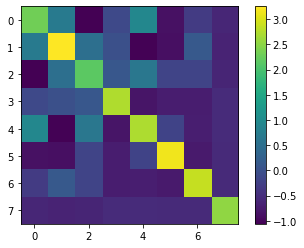

SUP_[FCN8i223o32_d8]_target_[angle]     : 0.000 1.467 8.839


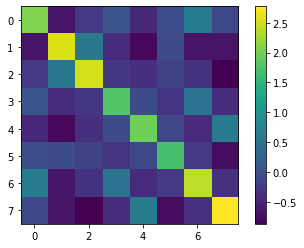

SUP_[FCN8i223o32_d8]_target_[py]        : 0.000 1.047 6.910


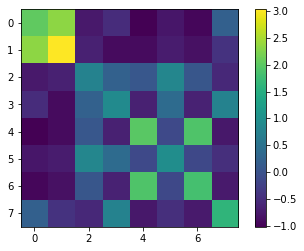

SUP_[FCN8i223o32_d8]_target_[px]        : 0.000 1.020 7.166


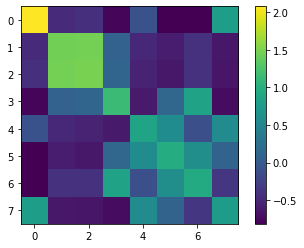

SUP_[FCN8i223o32_d16]_target_[shape]    : 0.000 0.919 6.636


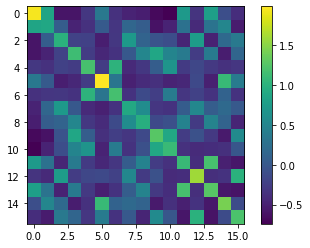

SUP_[FCN8i223o32_d16]_target_[scale]    : 0.000 1.022 4.996


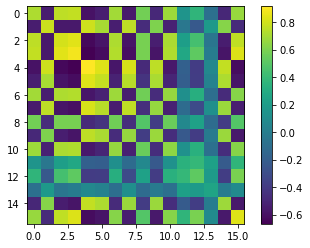

SUP_[FCN8i223o32_d16]_target_[color]    : 0.000 0.808 4.775


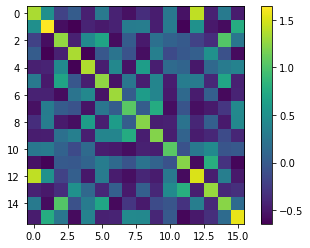

SUP_[FCN8i223o32_d16]_target_[angle]    : 0.000 1.219 7.243


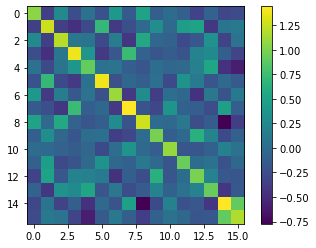

SUP_[FCN8i223o32_d16]_target_[py]       : 0.000 0.862 4.793


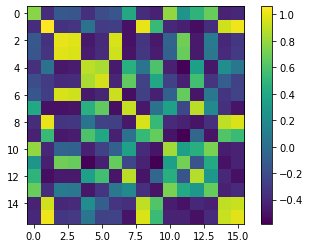

SUP_[FCN8i223o32_d16]_target_[px]       : 0.000 0.926 5.329


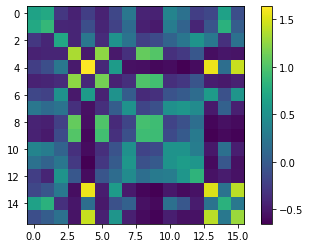

SUP_[FCN8i223o32_d32]_target_[shape]    : 0.000 0.791 5.307


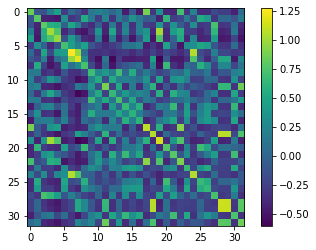

SUP_[FCN8i223o32_d32]_target_[scale]    : 0.000 0.830 4.630


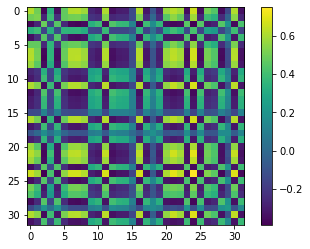

SUP_[FCN8i223o32_d32]_target_[color]    : 0.000 0.663 4.227


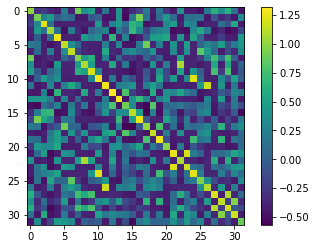

SUP_[FCN8i223o32_d32]_target_[angle]    : 0.000 0.966 7.346


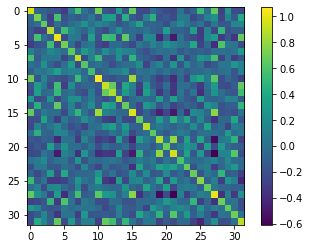

SUP_[FCN8i223o32_d32]_target_[py]       : 0.000 0.819 4.375


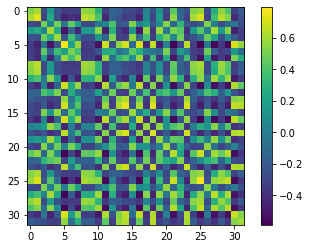

SUP_[FCN8i223o32_d32]_target_[px]       : 0.000 0.798 4.579


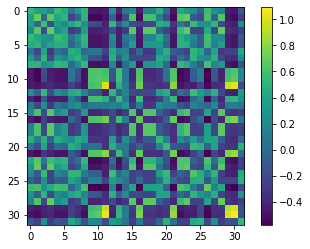

SUP_[FCN8i223o32_d64]_target_[shape]    : 0.000 0.672 4.894


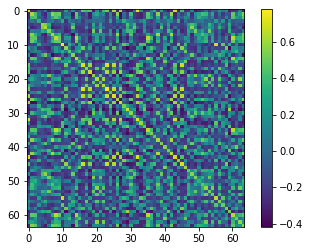

SUP_[FCN8i223o32_d64]_target_[scale]    : 0.000 0.690 3.788


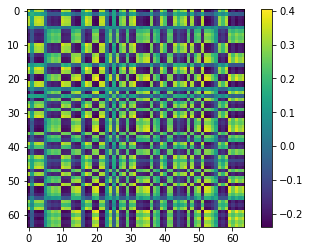

SUP_[FCN8i223o32_d64]_target_[color]    : 0.000 0.589 4.333


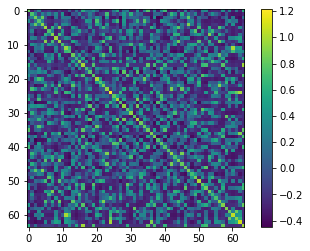

SUP_[FCN8i223o32_d64]_target_[angle]    : 0.000 0.856 5.960


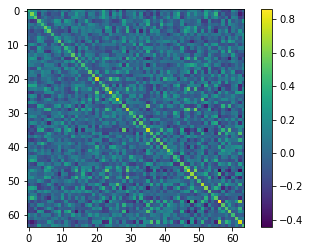

SUP_[FCN8i223o32_d64]_target_[py]       : 0.000 0.715 3.392


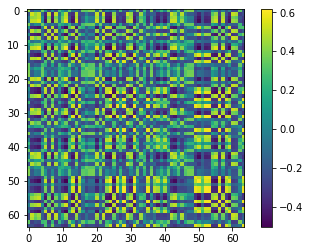

SUP_[FCN8i223o32_d64]_target_[px]       : 0.000 0.698 3.605


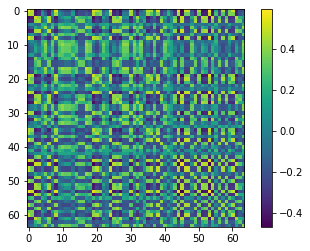

SUP_[FCN8i223o32_d128]_target_[shape]   : 0.000 0.655 3.983


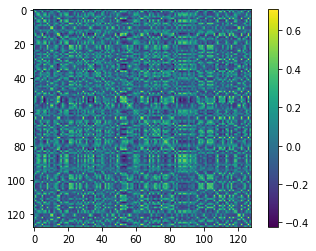

SUP_[FCN8i223o32_d128]_target_[scale]   : 0.000 0.599 3.176


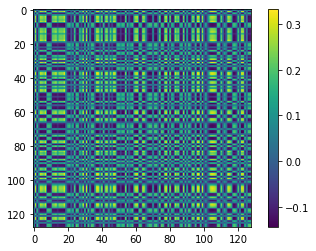

SUP_[FCN8i223o32_d128]_target_[color]   : 0.000 0.510 4.388


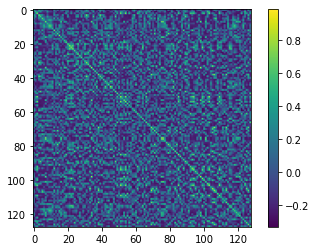

SUP_[FCN8i223o32_d128]_target_[angle]   : 0.000 0.719 5.048


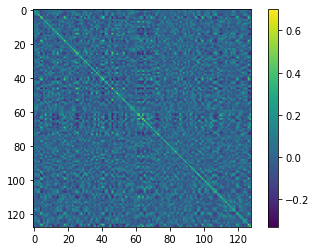

SUP_[FCN8i223o32_d128]_target_[py]      : 0.000 0.634 3.379


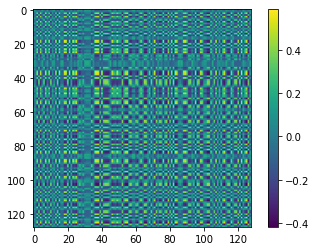

SUP_[FCN8i223o32_d128]_target_[px]      : 0.000 0.626 3.440


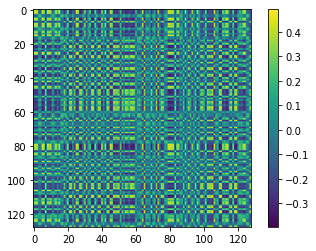

SUP_[FCN16i223o64_d8]_target_[shape]    : 0.000 0.996 6.352


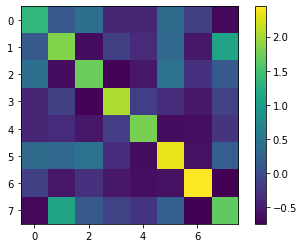

SUP_[FCN16i223o64_d8]_target_[scale]    : 0.000 1.018 5.559


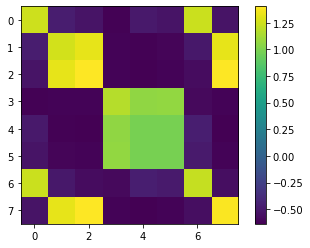

SUP_[FCN16i223o64_d8]_target_[color]    : 0.000 0.982 5.009


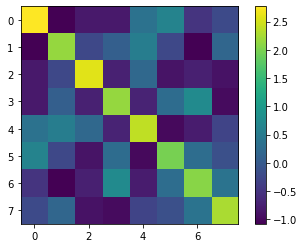

SUP_[FCN16i223o64_d8]_target_[angle]    : 0.000 1.472 8.309


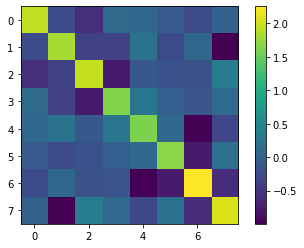

SUP_[FCN16i223o64_d8]_target_[py]       : 0.000 0.985 5.803


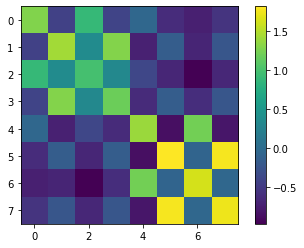

SUP_[FCN16i223o64_d8]_target_[px]       : 0.000 1.033 6.604


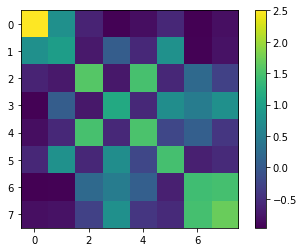

SUP_[FCN16i223o64_d16]_target_[shape]   : 0.000 0.936 6.545


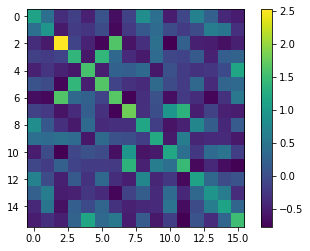

SUP_[FCN16i223o64_d16]_target_[scale]   : 0.000 0.925 5.222


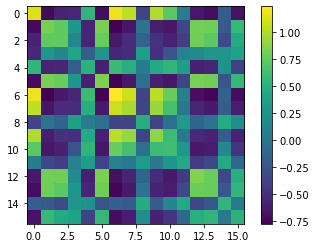

SUP_[FCN16i223o64_d16]_target_[color]   : 0.000 0.736 5.973


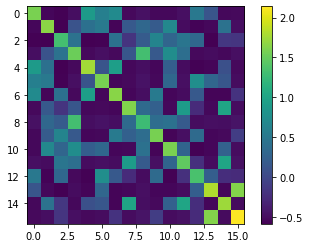

SUP_[FCN16i223o64_d16]_target_[angle]   : 0.000 1.175 6.838


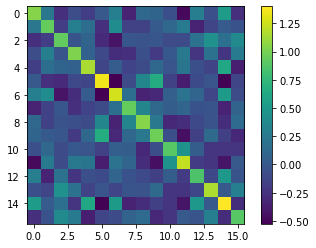

SUP_[FCN16i223o64_d16]_target_[py]      : 0.000 0.833 5.478


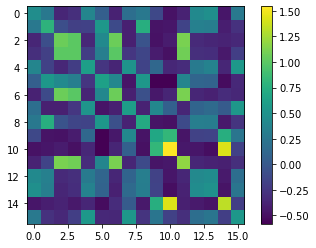

SUP_[FCN16i223o64_d16]_target_[px]      : 0.000 0.923 6.093


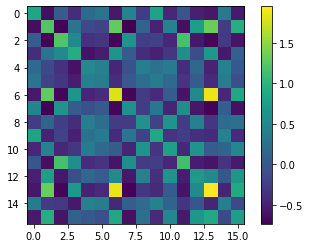

SUP_[FCN16i223o64_d32]_target_[shape]   : 0.000 0.765 5.393


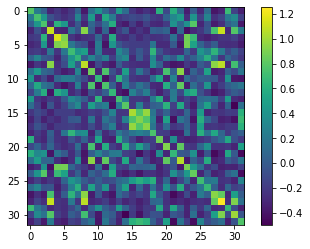

SUP_[FCN16i223o64_d32]_target_[scale]   : 0.000 0.809 4.059


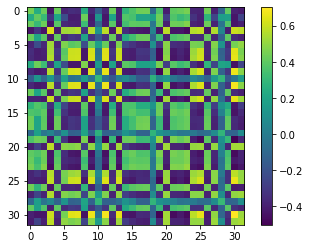

SUP_[FCN16i223o64_d32]_target_[color]   : 0.000 0.656 4.438


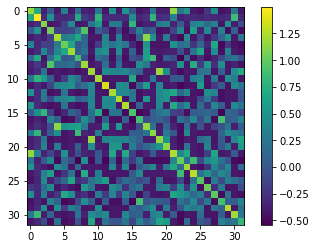

SUP_[FCN16i223o64_d32]_target_[angle]   : 0.000 1.009 7.094


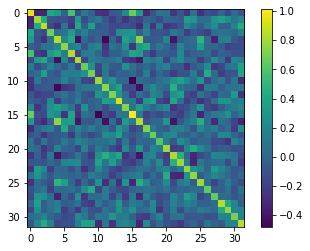

SUP_[FCN16i223o64_d32]_target_[py]      : 0.000 0.770 5.576


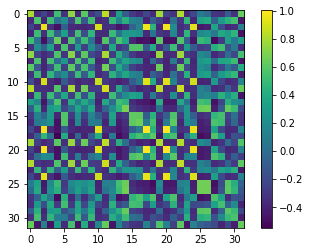

SUP_[FCN16i223o64_d32]_target_[px]      : 0.000 0.817 4.570


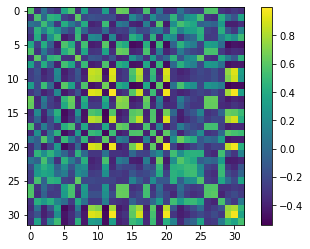

SUP_[FCN16i223o64_d64]_target_[shape]   : 0.000 0.628 5.049


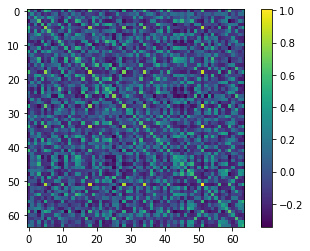

SUP_[FCN16i223o64_d64]_target_[scale]   : 0.000 0.715 3.395


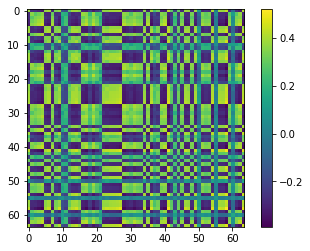

SUP_[FCN16i223o64_d64]_target_[color]   : 0.000 0.570 4.526


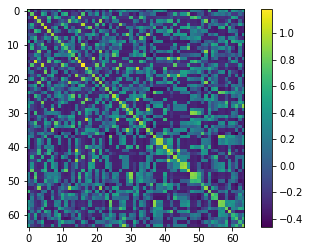

SUP_[FCN16i223o64_d64]_target_[angle]   : 0.000 0.865 6.426


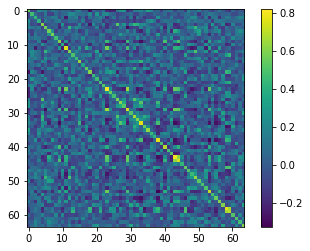

SUP_[FCN16i223o64_d64]_target_[py]      : 0.000 0.654 3.650


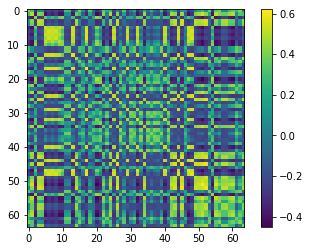

SUP_[FCN16i223o64_d64]_target_[px]      : 0.000 0.619 4.238


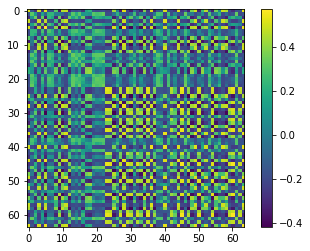

SUP_[FCN16i223o64_d128]_target_[shape]  : 0.000 0.594 3.753


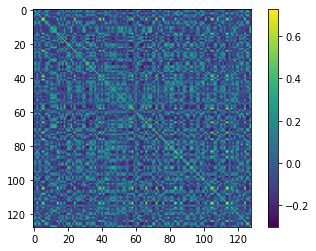

SUP_[FCN16i223o64_d128]_target_[scale]  : 0.000 0.640 2.876


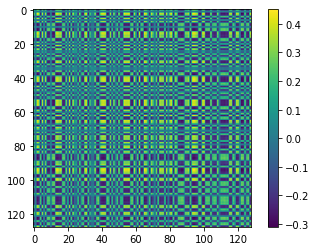

SUP_[FCN16i223o64_d128]_target_[color]  : 0.000 0.509 3.897


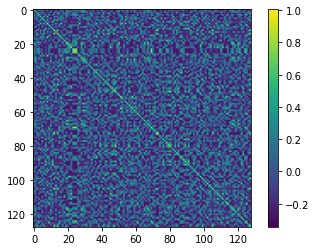

SUP_[FCN16i223o64_d128]_target_[angle]  : 0.000 0.744 5.417


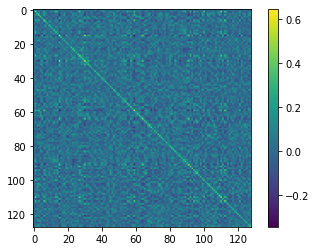

SUP_[FCN16i223o64_d128]_target_[py]     : 0.000 0.597 3.197


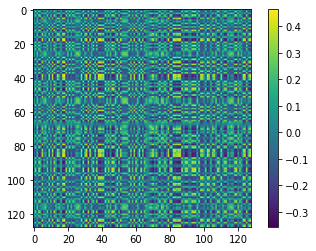

SUP_[FCN16i223o64_d128]_target_[px]     : 0.000 0.600 3.228


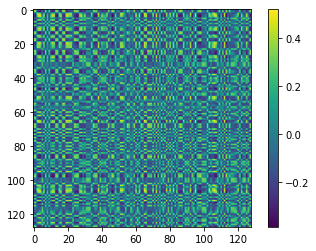

SUP_[FCN32i223o128_d8]_target_[shape]   : 0.000 1.080 6.480


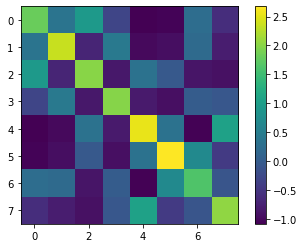

SUP_[FCN32i223o128_d8]_target_[scale]   : 0.000 0.956 5.067


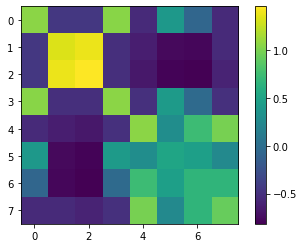

SUP_[FCN32i223o128_d8]_target_[color]   : 0.000 0.959 5.981


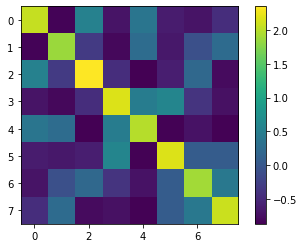

SUP_[FCN32i223o128_d8]_target_[angle]   : 0.000 1.500 11.158


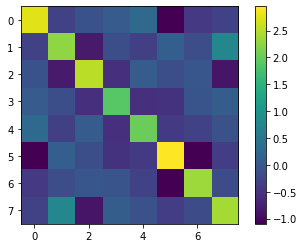

SUP_[FCN32i223o128_d8]_target_[py]      : 0.000 0.990 6.687


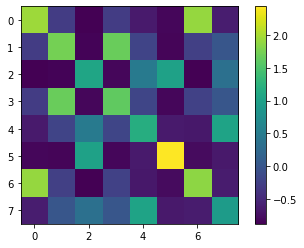

SUP_[FCN32i223o128_d8]_target_[px]      : 0.000 0.924 5.505


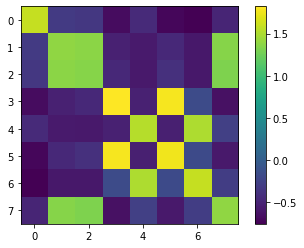

SUP_[FCN32i223o128_d16]_target_[shape]  : 0.000 0.941 8.282


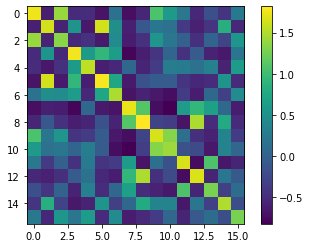

SUP_[FCN32i223o128_d16]_target_[scale]  : 0.000 0.952 5.369


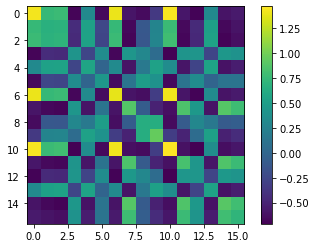

SUP_[FCN32i223o128_d16]_target_[color]  : 0.000 0.713 6.514


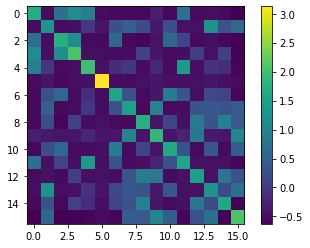

SUP_[FCN32i223o128_d16]_target_[angle]  : 0.000 1.262 8.702


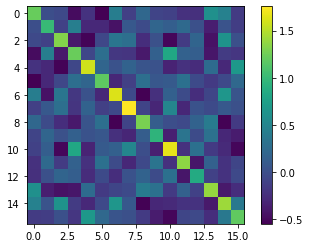

SUP_[FCN32i223o128_d16]_target_[py]     : 0.000 0.786 5.865


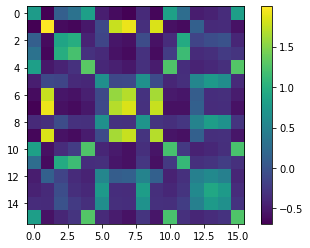

SUP_[FCN32i223o128_d16]_target_[px]     : 0.000 0.847 5.616


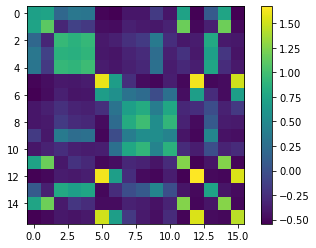

SUP_[FCN32i223o128_d32]_target_[shape]  : 0.000 0.711 5.571


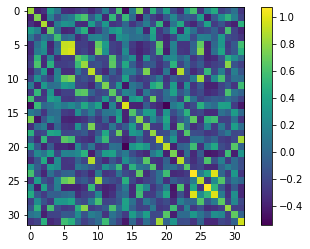

SUP_[FCN32i223o128_d32]_target_[scale]  : 0.000 0.801 3.882


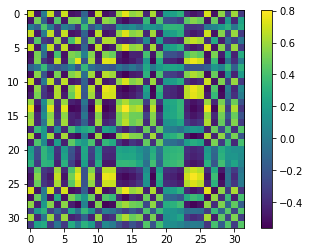

SUP_[FCN32i223o128_d32]_target_[color]  : 0.000 0.654 4.044


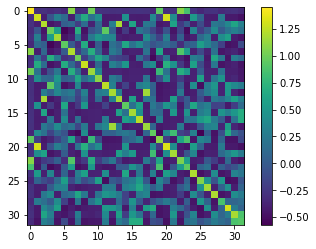

SUP_[FCN32i223o128_d32]_target_[angle]  : 0.000 1.011 7.251


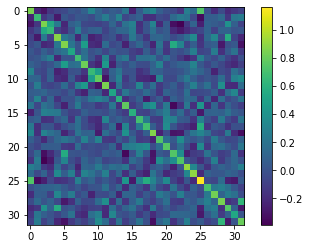

SUP_[FCN32i223o128_d32]_target_[py]     : 0.000 0.696 4.373


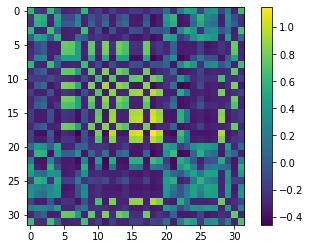

SUP_[FCN32i223o128_d32]_target_[px]     : 0.000 0.743 4.714


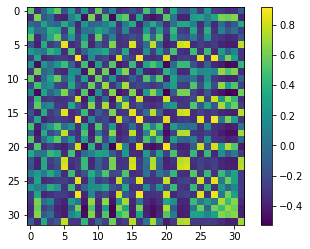

SUP_[FCN32i223o128_d64]_target_[shape]  : 0.000 0.664 4.862


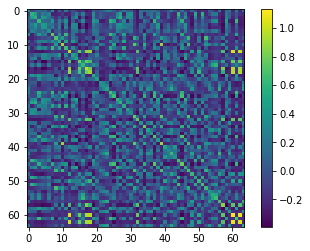

SUP_[FCN32i223o128_d64]_target_[scale]  : 0.000 0.643 2.985


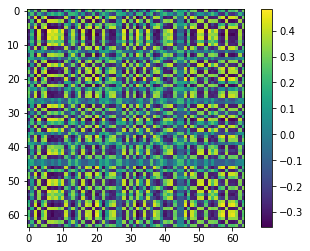

SUP_[FCN32i223o128_d64]_target_[color]  : 0.000 0.546 3.563


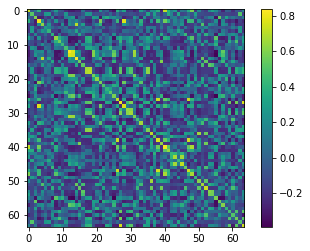

SUP_[FCN32i223o128_d64]_target_[angle]  : 0.000 0.872 6.296


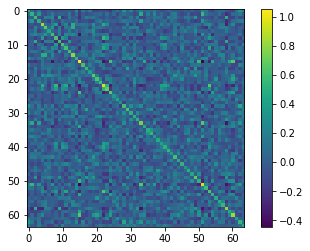

SUP_[FCN32i223o128_d64]_target_[py]     : 0.000 0.636 3.602


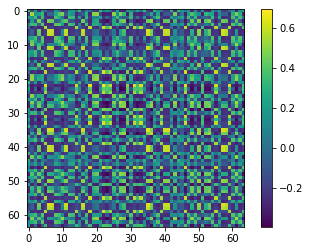

SUP_[FCN32i223o128_d64]_target_[px]     : 0.000 0.616 3.177


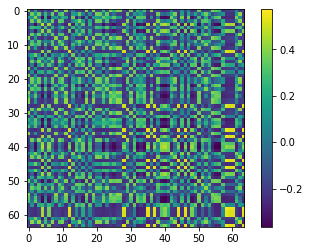

SUP_[FCN32i223o128_d128]_target_[shape] : 0.000 0.542 3.968


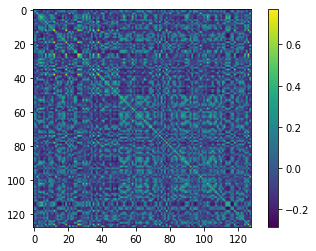

SUP_[FCN32i223o128_d128]_target_[scale] : 0.000 0.632 3.041


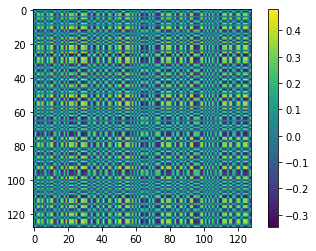

SUP_[FCN32i223o128_d128]_target_[color] : 0.000 0.502 4.146


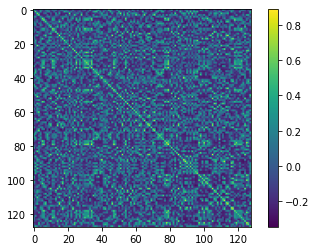

SUP_[FCN32i223o128_d128]_target_[angle] : 0.000 0.783 5.624


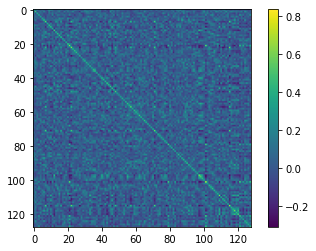

SUP_[FCN32i223o128_d128]_target_[py]    : 0.000 0.602 3.070


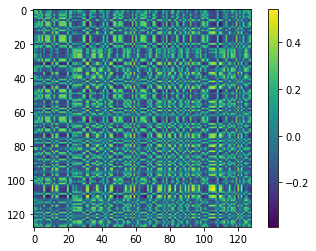

SUP_[FCN32i223o128_d128]_target_[px]    : 0.000 0.558 3.301


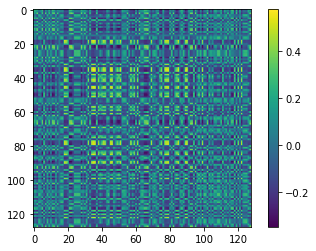

BTwins_[FCN8i223o32_d_8]_target_[shape] : 0.000 0.493 2.700


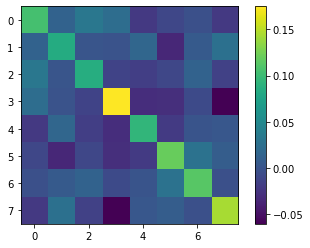

BTwins_[FCN8i223o32_d_16]_target_[shape]: 0.000 0.438 2.307


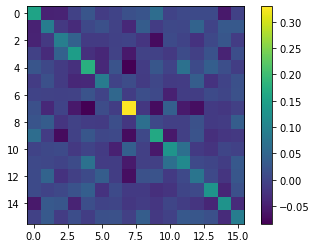

BTwins_[FCN8i223o32_d_32]_target_[shape]: 0.000 0.300 2.299


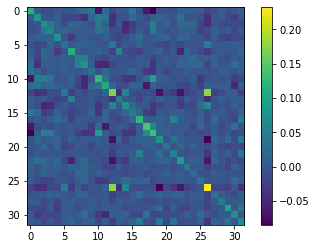

BTwins_[FCN8i223o32_d_64]_target_[shape]: 0.000 0.222 1.841


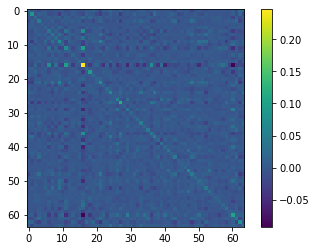

BTwins_[FCN8i223o32_d_128]_target_[shape]: 0.000 0.200 1.705


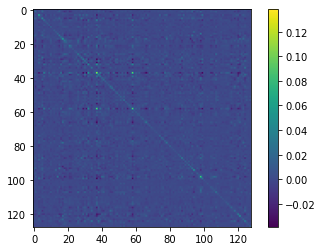

BTwins_[FCN16i223o64_d_8]_target_[shape]: 0.000 0.482 2.243


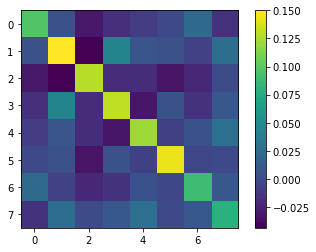

BTwins_[FCN16i223o64_d_16]_target_[shape]: 0.000 0.404 2.618


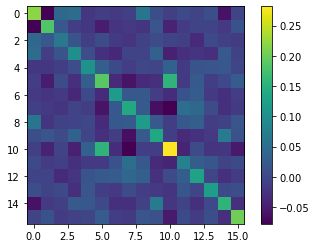

BTwins_[FCN16i223o64_d_32]_target_[shape]: 0.000 0.261 2.430


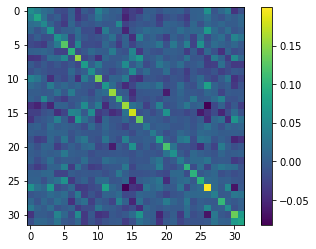

BTwins_[FCN16i223o64_d_64]_target_[shape]: 0.000 0.191 2.339


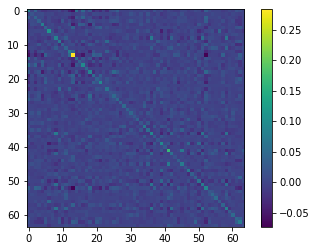

BTwins_[FCN16i223o64_d_128]_target_[shape]: 0.000 0.154 2.988


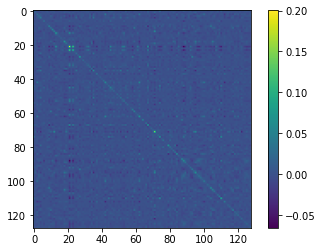

BTwins_[FCN32i223o128_d_8]_target_[shape]: 0.000 0.487 3.045


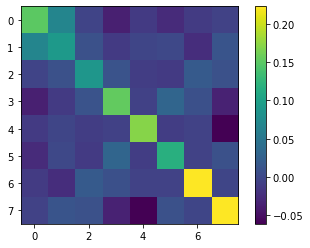

BTwins_[FCN32i223o128_d_16]_target_[shape]: 0.000 0.350 2.790


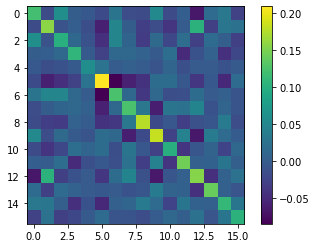

BTwins_[FCN32i223o128_d_32]_target_[shape]: 0.000 0.252 2.351


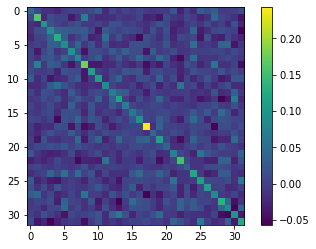

BTwins_[FCN32i223o128_d_64]_target_[shape]: 0.000 0.202 3.182


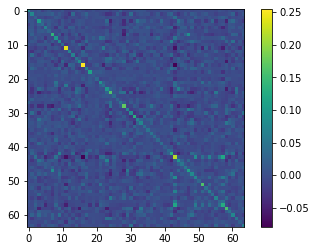

BTwins_[FCN32i223o128_d_128]_target_[shape]: 0.000 0.154 3.574


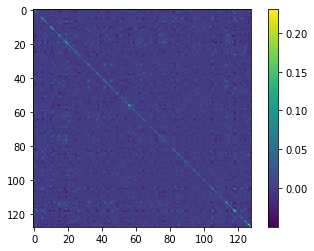

In [16]:
for p in p_experiments:
    R_train = np.load(p / "R_train.npy")
    print("{:<40}: {:.3f} {:.3f} {:.3f}".format(p.name, R_train.min(), R_train.mean(),R_train.max()))
    cov = np.cov(R_train.T)
    plt.imshow(cov)
    plt.colorbar()
    plt.show()